<a id='toc'></a>
# Аналитика данных благотворительного фонда с целью повышения эффективности работы с пользователями

### Проект выполнила Марина Орленко
Telegram: @lma82

**Цель исследования**

Необходимо:
- изучить поведение доноров: в целом, исторических пользователей и новых пользователей отдельно;
- составить портрет типичного пользователя (регион, поведение, прочие параметры);
- рассчитать метрики: пользовательские, маркетинговые, коммерческие;
- сегментировать пользователей: RFM-анализ, описание сегментов;
- изучить каналы привлечения пользователей и их эффективность;
- проанализировать эффективность рассылок;
- провести когортный анализ.


**Описание данных**

Мы будем работать с данными из следующих файлов:
- id_donor.csv (информация о донорах),
где:
      
| Название колонки                                            | Описание                              |
|:----------------------------------------------------------- |:------------------------------------- |
| CustomerCustomFieldsRecurrent                               | рекуррент: да / нет                   |   
| CustomerCustomFieldsVolunteer                               | волонтер: да / нет                    |
| CustomerSex                                                 | пол пользователя                      |
| CustomerAreaIdsExternalId                                   | идентификатор региона пользователя    |
| CustomerAreaName                                            | название региона пользователя         |
| CustomerIanaTimeZone                                        | часовой пояс пользователя             |
| CustomerTimeZoneSource                                      | источник данных о часовом поясе       |
| CustomerIdsMindboxId                                        | идентификатор пользователя            |    
| CustomerIsEmailInvalid                                      | почта невалидна: да / нет             |   
| CustomerChangeDateTimeUtc                                   | дата регистрации / редактирования     |   
| CustomerCustomerSubscriptionsDobroaifIsSubscribed           | подписка                              |  
| CustomerCustomerSubscriptionsDobroaifSmsIsSubscribed        | подписка в точке контакта SMS         |     
| CustomerCustomerSubscriptionsDobroaifEmailIsSubscribed      | подписка в точке контакта email       |
| CustomerCustomerSubscriptionsDobroaifViberIsSubscribed      | подписка в точке контакта Viber       |
| CustomerCustomerSubscriptionsDobroaifMobilePushIsSubscribed | подписка в точке контакта Mobile Push |
| CustomerCustomerSubscriptionsDobroaifWebPushIsSubscribed    | подписка в точке контакта Web Push    |  
    
- order.csv (информация о пожертвованиях),
где:
    
| Название колонки                     | Описание                             |
|:------------------------------------ |:------------------------------------ |
| OrderIdsMindboxId                    | идентификатор платежа                |   
| OrderFirstActionIdsMindboxId         | идентификатор действия               |
| OrderFirstActionDateTimeUtc          | дата и время оформления заказа       |
| OrderFirstActionChannelIdsMindboxId  | идентификатор точки контакта         |
| OrderFirstActionChannelIdsExternalId | внешний идентификатор точки контакта |
| OrderFirstActionChannelName          | наименование точки контакта          |
| OrderAreaIdsExternalId               | идентификатор региона пользователя   |
| OrderTransactionIdsExternalId        | внешний идентификатор транзакции     |    
| OrderTotalPrice                      | стоимость заказа                     |   
| OrderIdsWebsiteID                    | идентификатор заказа на сайте        |   
| OrderCustomFieldsNewyear             | наличие поля "c Новым годом"         |  
| OrderCustomFieldsNextPayDate         | дата следующего списания денег       |     
| OrderCustomFieldsRecurrent           | рекуррент: да / нет                  |
| OrderCustomFieldsRepayment           | повторный платеж                     |
| OrderLineProductIdsWebsite           | идентификатор продукта на сайте      |
| OrderLineProductName                 | название продукта                    |  
| OrderLineQuantity                    | количество единиц продукта           |     
| OrderLineBasePricePerItem            | базовая цена за единицу продукта     |
| OrderLinePriceOfLine                 | итоговая цена                        |
| OrderLineStatusIdsExternalId         | идентификатор статуса позиции заказа |
| OrderCustomerIdsMindboxId            | идентификатор пользователя           |  
    
- import.csv (информация об историческом импорте),
где:

| Название колонки                   | Описание                   |
|:---------------------------------- |:-------------------------- |
| CustomerActionCustomerIdsMindboxId | идентификатор пользователя |             

  
- channels.pkl (информация о каналах привлечения),
где:

| Название колонки | Описание                       |
|:---------------- |:------------------------------ |
| User_action      | название действия пользователя |             
| Action_date      | дата действия пользователя     |
| Channel_id       | идентификатор канала           |
| Utm_campaign     | кампания                       |
| Utm_source       | ресурс                         |     
| Utm_medium       | дублирующаяся информация       |     
| User_id          | идентификатор пользователя     |
| Action_time      | час действия пользователя      |

Заказчик – благотворительный фонд  (некоммерческая организация), помогающий тяжелобольным детям и взрослым из разных регионов России. Фонд поддерживает подопечных со сложными и редкими заболеваниями. Вместе с благотворителями помогает семьям с тяжелобольными детьми и взрослыми получить жизненно необходимые лекарства, попасть на операцию, когда закончились квоты, приобрести дорогостоящее медоборудование.

О качестве данных ничего не известно. Поэтому перед исследованием данных понадобится их обзор.

**Ход исследования**

Изучим общую информацию о датасетах. Что можно сказать о каждом столбце? Значения какого типа они хранят?

Проверим данные на ошибки, и оценим их влияние на исследование, затем, на этапе предобработки, изучим возможность исправить самые критичные ошибки в данных.

Далее проведем необходимые вычисления, на основании которых проанализируем данные и, таким образом, исследование пройдёт в 6 этапов:

- [Загрузка и базовый анализ данных.](#1)
- [Предобработка данных:](#2)
  - [Датасет donors;](#3)
  - [Датасет orders;](#4)
  - [Датасет imports;](#5)
  - [Датасет channels.](#6)
- [Исследовательский анализ данных:](#7)
  - [Датасет donors;](#8)
  - [Датасет orders;](#9)
  - [Датасет imports;](#10)
  - [Датасет channels.](#11)
- [Целевой анализ данных:](#12)
  - [Пользовательские метрики.](#13)
  - [RMF-анализ.](#14)
  - [Коммерческие метрики.](#15)
  - [Маркетинговые метрики.](#16)
  - [Когортный анализ.](#17)
- [Общий вывод.](#18)
- Презентация: https://docs.google.com/presentation/d/1n_ZN74J8c_mU80DbQT6BBGEWiYA2_buf/edit?usp=sharing&ouid=100598750445050576183&rtpof=true&sd=true
- Материалы, использованные в работе:
  - сайт компании: 

<a id="1"></a>
## Загрузка и обзор данных

In [1]:
# Импорт библиотек
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
from ipywidgets import HTML, Button, widgets
import yadisk
import sys
from tqdm import tqdm
import ast
import math
import re
import os
import requests
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from operator import attrgetter
%matplotlib inline
import seaborn as sns
from datetime import datetime, timedelta
import itertools
from IPython.display import display
from IPython.core.display import HTML
import warnings; warnings.filterwarnings(action = 'ignore')

In [2]:
# Выравниваем расположение таблиц в ячейках markdown по левому краю
table_css = 'table {align:left;display:block} '
HTML('<style>{}</style>'.format(table_css))

In [3]:
# Устанавливаем длину вывода текста
pd.set_option('display.max_seq_items', 350)

In [4]:
# Устанавливаем ширину столбца
pd.set_option('display.max_colwidth', 100)

In [5]:
# Перенос заголовков
pd.set_option('expand_frame_repr', False)

In [6]:
# Загружаем переменные среды для Яндекс Диск
app_id = ''
secret_id = ''
ya_token = ''

# Подключаемся к Яндекс Диску
y = yadisk.YaDisk(app_id, secret_id, ya_token)

# Проверяем подключение через валидность токена
if y.check_token():
    print('Token correct')

# Создаем список файлов для загрузки
print('Creating list of files')
list_of_files = []
for el in tqdm(list(y.listdir('aif'))): 
    if el['path'].endswith(('.csv', '.pkl', 'txt')): 
        list_of_files.append(el['path'])
list_of_files

# Создаем папку для загрузки данных
# Определяем текущий рабочий каталог
current_directory = os.getcwd()

# Создаем путь к файлу data.zip в текущем каталоге
load_path = os.path.join(current_directory, 'aif')
#load_path = current directory # путь для загрузки файлов
if not os.path.exists(load_path): # если такого каталога нет
    os.mkdir(load_path) # то создаем каталог
os.chdir(load_path) 

# Скачиваем файлы
print('Downloading files')
for file in tqdm(list_of_files):
    y.download(file.split(':')[1], file.split('/')[-1])

# Проверяем существование каждого файла и читаем его, если он существует
if os.path.exists('id_donor.csv'):
    donors = pd.read_csv('id_donor.csv', encoding='cp1251', sep=';')
else:
    print(f'Файл "id_donor.csv" не существует')

if os.path.exists('order.csv'):
    orders = pd.read_csv('order.csv', encoding='cp1251', sep=';')
else:
    print(f'Файл "order.csv" не существует')

if os.path.exists('import.csv'):
    imports = pd.read_csv('import.csv', encoding='cp1251', sep=';')
else:
    print(f'Файл "import.csv" не существует')

if os.path.exists('channels.pkl'):
    channels = pd.read_pickle('channels.pkl')
else:
    print(f'Файл "channels.pkl" не существует')

if os.path.exists('channels_dict.txt'):
    channels_dict = pd.read_csv('channels_dict.txt', sep='\t', header=None, names=['raw_data'])
else:
    print(f'Файл "channels_dict.txt" не существует') 
    
if os.path.exists('channels_dict.txt'):
    with open('channels_dict.txt', 'r', encoding='utf-8') as channels_dict:
        lines = channels_dict.read().splitlines()
else:
    print(f'Файл "channels_dict.txt" не существует')

Token correct
Creating list of files


100%|██████████████████████████████████████████| 6/6 [00:00<00:00, 36314.32it/s]


100%|█████████████████████████████████████████████| 5/5 [03:33<00:00, 42.64s/it]


In [7]:
# Преобразовываем данные в словарь
encoding_dict = {}
if 'lines' in locals():
    for line in lines:
        if line.strip():  # Пропускаем пустые строки
            try:
                # Убираем фигурные скобки, лишние запятые и кавычки, затем разделяем строку на ключ и значение
                cleaned_line = re.sub(r"[{}']", "", line).strip().rstrip(',')
                key, value = cleaned_line.split(': ', 1)  # Разделяем по первому ': '
                encoding_dict[key.strip()] = value.strip()
            except Exception as e:
                print(f'Ошибка при обработке строки: {line}\n{e}')
# Добавляем значения в channels
if 'channels' in locals() and encoding_dict:
    channels['channel'] = channels['channel_id'].astype(str).map(encoding_dict)
else:
    print("Добавление нового столбца 'channel' не выполнено")

In [8]:
# Выводим основную информацию по датасету donors
display(donors.head())
print()
display(donors.info())
print()
# Выводим количество пропущенных значений для датасета и отсортируем их по возрастанию
print('Количество пропущенных значений:')
display(donors.isna().sum().sort_values())

,CustomerCustomFieldsRecurrent = Рекуррент,CustomerCustomFieldsVolunteer = Волонтер да/нет,CustomerSex = Пол,CustomerAreaIdsExternalId = Идентификатор географической зоны клиента,CustomerAreaName = Название географической зоны клиента,CustomerIanaTimeZone = Часовой пояс,CustomerTimeZoneSource = Источник информации о часовом поясе,CustomerIdsMindboxId = Идентификатор Mindbox,CustomerIsEmailInvalid = Адрес электронной почты невалиден,CustomerChangeDateTimeUtc = Дата регистрации/редактирования в формате yyyy-MM-dd HH:mm:ss.fff,CustomerCustomerSubscriptionsDobroaifIsSubscribed = Подписка,CustomerCustomerSubscriptionsDobroaifSmsIsSubscribed = Подписка в точке контакта SMS,CustomerCustomerSubscriptionsDobroaifEmailIsSubscribed = Подписка в точке контакта Email,CustomerCustomerSubscriptionsDobroaifViberIsSubscribed = Подписка в точке контакта Viber,CustomerCustomerSubscriptionsDobroaifMobilePushIsSubscribed = Подписка в точке контакта MobilePush,CustomerCustomerSubscriptionsDobroaifWebPushIsSubscribed = Подписка в точке контакта WebPush
0,NaN,NaN,female,75,Ульяновская область,Europe/Samara,Определили в трекере,2734,False,21.05.2023 13:19,NaN,NaN,True,NaN,NaN,NaN
1,False,NaN,female,63,Санкт-Петербург и ЛО,Europe/Moscow,Определили в трекере,2847,False,24.12.2023 5:41,NaN,NaN,True,NaN,NaN,NaN
2,NaN,NaN,female,Москва и МО,Москва и МО,Europe/Moscow,Определили в трекере,2861,False,10.03.2023 8:16,NaN,True,True,NaN,NaN,NaN
3,NaN,NaN,female,60,Ростовская область,Europe/Moscow,Определили в трекере,3361,True,20.12.2022 9:36,NaN,NaN,False,NaN,NaN,NaN
4,False,NaN,male,31,Москва и МО,Europe/Moscow,Определили в трекере,4982,False,18.12.2023 19:43,NaN,NaN,True,NaN,NaN,NaN



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23820 entries, 0 to 23819
Data columns (total 16 columns):
 #   Column                                                                                              Non-Null Count  Dtype 
---  ------                                                                                              --------------  ----- 
 0   CustomerCustomFieldsRecurrent = Рекуррент                                                           5923 non-null   object
 1   CustomerCustomFieldsVolunteer =  Волонтер да/нет                                                    6 non-null      object
 2   CustomerSex = Пол                                                                                   18715 non-null  object
 3   CustomerAreaIdsExternalId = Идентификатор географической зоны клиента                               5044 non-null   object
 4   CustomerAreaName = Название географической зоны клиента                                             5044 non-null   o

None


Количество пропущенных значений:


CustomerIdsMindboxId = Идентификатор Mindbox                                                              0
CustomerChangeDateTimeUtc = Дата регистрации/редактирования в формате yyyy-MM-dd HH:mm:ss.fff             0
CustomerCustomerSubscriptionsDobroaifEmailIsSubscribed = Подписка в точке контакта Email                342
CustomerIsEmailInvalid = Адрес электронной почты невалиден                                              424
CustomerSex = Пол                                                                                      5105
CustomerIanaTimeZone = Часовой пояс                                                                   12197
CustomerTimeZoneSource = Источник информации о часовом поясе                                          12197
CustomerCustomFieldsRecurrent = Рекуррент                                                             17897
CustomerAreaIdsExternalId = Идентификатор географической зоны клиента                                 18776
CustomerAreaName = Название 

В датасете donors 16 столбцов, 23820 строк.

Произведем следующие изменения в данных:
- CustomerCustomFieldsRecurrent = Рекуррент:
  - заменим тип данных на integer;
  - заменим значения True на 1, False на 0;
  - поменяем название столбца на customer_is_recurrent.
- CustomerCustomFieldsVolunteer =  Волонтер да/нет:
  - заменим тип данных на integer;
  - заменим значения True на 1, False на 0;
  - поменяем название столбца на customer_is_volunteer.
- CustomerSex = Пол:
  - поменяем название столбца на customer_gender.
- CustomerAreaIdsExternalId = Идентификатор географической зоны клиента:
  - хорошо бы привести данные к одному формату, либо числовому либо к строке, в EDA посмотрим, можно ли это сделать;
  - поменяем название столбца на customer_area_id.
- CustomerAreaName = Название географической зоны клиента:
  - поменяем название столбца на customer_area_name.
- CustomerIanaTimeZone = Часовой пояс:
  - поменяем название столбца на customer_area_time_zone.
- CustomerTimeZoneSource = Источник информации о часовом поясе:
  - поменяем название столбца на customer_time_zone_source.
- CustomerIdsMindboxId = Идентификатор Mindbox:
  - поменяем название столбца на customer_mindbox_id.
- CustomerIsEmailInvalid = Адрес электронной почты невалиден:
  - заменим тип данных на integer;
  - заменим значения True на 1, False на 0;
  - поменяем название столбца на customer_email_is_invalid.
- CustomerChangeDateTimeUtc = Дата регистрации/редактирования в формате yyyy-MM-dd HH:mm:ss.fff:
  - поменяем название столбца на customer_registration_datetime;
  - заменим тип данных на datetime;
  - разобьем данные столбца на два - customer_registration_date с датой регистрации, и customer_registration_time со временем регистрации, время приведем к Московскому (+3);
- CustomerCustomerSubscriptionsDobroaifIsSubscribed = Подписка:
  - заменим тип данных на integer;
  - заменим значения True на 1, False на 0;
  - поменяем название столбца на customer_is_subscribed.
- CustomerCustomerSubscriptionsDobroaifSmsIsSubscribed = Подписка в точке контакта SMS:
  - заменим тип данных на integer;
  - заменим значения True на 1, False на 0;
  - поменяем название столбца на customer_sms_is_subscribed.
- CustomerCustomerSubscriptionsDobroaifEmailIsSubscribed = Подписка в точке контакта Email:
  - заменим тип данных на integer;
  - заменим значения True на 1, False на 0;
  - поменяем название столбца на customer_email_is_subscribed.
- CustomerCustomerSubscriptionsDobroaifViberIsSubscribed = Подписка в точке контакта Viber:
  - заменим тип данных на integer;
  - заменим значения True на 1, False на 0;
  - поменяем название столбца на customer_viber_is_subscribed.
- CustomerCustomerSubscriptionsDobroaifMobilePushIsSubscribed = Подписка в точке контакта MobilePush:
  - заменим тип данных на integer;
  - заменим значения True на 1, False на 0;
  - поменяем название столбца на customer_mobile_push_is_subscribed.
- CustomerCustomerSubscriptionsDobroaifWebPushIsSubscribed = Подписка в точке контакта WebPush:
  - заменим тип данных на integer;
  - заменим значения True на 1, False на 0;
  - поменяем название столбца на customer_web_push_is_subscribed.
  
Пропущенных значений много. Их нет только в двух столбцах: идентификатор Mindbox и дата регистрации/редактирования пользователя. В столбцах с данными по подписке пропуски почти во всех строках.

In [9]:
# Выводим основную информацию по датасету orders
display(orders.sample(5))
print()
display(orders.info())
print()
# Выводим количество пропущенных значений для датасета и отсортируем их по возрастанию
print('Количество пропущенных значений:')
display(orders.isna().sum().sort_values())

,OrderIdsMindboxId = Идентификатор Mindbox,OrderFirstActionIdsMindboxId = Идентификатор Mindbox,OrderFirstActionDateTimeUtc = Дата и время оформления заказа по UTC,OrderFirstActionChannelIdsMindboxId = Идентификатор Mindbox,OrderFirstActionChannelIdsExternalId = Внешний идентификатор точки контакта,OrderFirstActionChannelName = Имя точки контакта,OrderAreaIdsExternalId = Идентификатор географической зоны клиента,OrderTransactionIdsExternalId = Идентификатор транзакции,OrderTotalPrice = Стоимость заказа,OrderIdsWebsiteID = Идентификатор заказа на сайте,...,OrderCustomFieldsNextPayDate = Дата след. Списания,OrderCustomFieldsRecurrent = Регулярный да/нет,OrderCustomFieldsRepayment = Повторный рекуррент,OrderLineProductIdsWebsite = Id продукта в Сайт,OrderLineProductName = Техническое название продукта,OrderLineQuantity = Количество единиц продукта,OrderLineBasePricePerItem = Базовая цена продукта за единицу продукта,OrderLinePriceOfLine = Конечная цена,OrderLineStatusIdsExternalId = Идентификатор статуса позиции заказа,OrderCustomerIdsMindboxId = Идентификатор Mindbox
71770,148646,252727513,08.02.2024 10:37,9,Site,Сайт,NaN,NaN,1500,130184,...,NaN,False,NaN,106525,Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Дарья Семенова,1,1500.0,1500,notpaid,45439
9491,131332,177709706,15.10.2023 2:48,9,Site,Сайт,NaN,NaN,0,113347,...,NaN,True,True,49909,Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Пожертвование (хочу помочь),1,200.0,200,fail,18644
51922,117558,86637423,14.06.2023 5:47,9,Site,Сайт,NaN,NaN,0,98323,...,NaN,False,NaN,49906,Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Пожертвование на уставную деятельность...,1,15.0,15,fail,36538
12928,21445,64425,27.11.2021 0:00,1,Administrator,Административный сайт Mindbox,NaN,NaN,150,935933534,...,NaN,NaN,NaN,1,На уставную деятельность,1,NaN,150,Paid,19854
60980,132229,183261362,24.10.2023 15:33,9,Site,Сайт,NaN,NaN,300,114297,...,NaN,False,NaN,113632,Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Герман Семёнов,1,300.0,300,Paid,40853



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73763 entries, 0 to 73762
Data columns (total 21 columns):
 #   Column                                                                       Non-Null Count  Dtype  
---  ------                                                                       --------------  -----  
 0   OrderIdsMindboxId = Идентификатор Mindbox                                    73763 non-null  int64  
 1   OrderFirstActionIdsMindboxId = Идентификатор Mindbox                         73763 non-null  int64  
 2   OrderFirstActionDateTimeUtc = Дата и время оформления заказа по UTC          73763 non-null  object 
 3   OrderFirstActionChannelIdsMindboxId = Идентификатор Mindbox                  73763 non-null  int64  
 4   OrderFirstActionChannelIdsExternalId = Внешний идентификатор точки контакта  73763 non-null  object 
 5   OrderFirstActionChannelName = Имя точки контакта                             73763 non-null  object 
 6   OrderAreaIdsExternalId = Идентификато

None


Количество пропущенных значений:


OrderIdsMindboxId = Идентификатор Mindbox                                          0
OrderLinePriceOfLine = Конечная цена                                               0
OrderLineQuantity = Количество единиц продукта                                     0
OrderLineProductIdsWebsite = Id продукта в Сайт                                    0
OrderLineStatusIdsExternalId = Идентификатор статуса позиции заказа                0
OrderIdsWebsiteID = Идентификатор заказа на сайте                                  0
OrderTotalPrice = Стоимость заказа                                                 0
OrderCustomerIdsMindboxId = Идентификатор Mindbox                                  0
OrderFirstActionChannelName = Имя точки контакта                                   0
OrderFirstActionChannelIdsExternalId = Внешний идентификатор точки контакта        0
OrderFirstActionChannelIdsMindboxId = Идентификатор Mindbox                        0
OrderFirstActionDateTimeUtc = Дата и время оформления заказа по U

В датасете orders 21 столбец, 73763 строк.

Произведем следующие изменения в данных:
- OrderIdsMindboxId = Идентификатор Mindbox:
  - поменяем название столбца на order_mindbox_id.
- OrderFirstActionIdsMindboxId = Идентификатор Mindbox:
  - поменяем название столбца на order_first_action_mindbox_id.
- OrderFirstActionDateTimeUtc = Дата и время оформления заказа по UTC:
  - поменяем название столбца на order_fist_action_datetime;
  - заменим тип данных на datetime;
  - разобьем данные столбца на два - order_first_action_date с датой регистрации и order_first_action_time со временем регистрации, время приведем к Московскому (+3);
- OrderFirstActionChannelIdsMindboxId = Идентификатор Mindbox:
  - поменяем название столбца на order_first_action_channel_id.  
- OrderFirstActionChannelIdsExternalId = Внешний идентификатор точки контакта:
  - поменяем название столбца на order_first_action_channel_external_id.
- OrderFirstActionChannelName = Имя точки контакта:
  - поменяем название столбца на order_first_action_channel_name.
- OrderAreaIdsExternalId = Идентификатор географической зоны клиента:
  - поменяем название столбца на order_geo_area_id.
- OrderTransactionIdsExternalId = Идентификатор транзакции:
  - поменяем название столбца на order_transaction_id.
- OrderTotalPrice = Стоимость заказа:
  - поменяем название столбца на order_total_price.
- OrderIdsWebsiteID = Идентификатор заказа на сайте:
  - заменим тип данных на integer;
  - поменяем название столбца на order_website_id.
- OrderCustomFieldsNewyear = newyear:
  - заменим тип данных на integer;
  - заменим значения True на 1, False на 0;
  - поменяем название столбца на order_is_newyear_action.
- OrderCustomFieldsNextPayDate = Дата след. Списания:
  - заменим тип данных на datetime;
  - поменяем название столбца на order_next_paydate.
- OrderCustomFieldsRecurrent = Регулярный да/нет:
  - заменим тип данных на integer;
  - заменим значения True на 1, False на 0;
  - поменяем название столбца на order_is_regular_recurrent.
- OrderCustomFieldsRepayment = Повторный рекуррент:
  - заменим тип данных на integer;
  - заменим значения True на 1, False на 0;
  - поменяем название столбца на order_is_repeated_recurrent.
- OrderLineProductIdsWebsite = Id продукта в Сайт:
  - поменяем название столбца на order_product_website_id.
- OrderLineProductName = Техническое название продукта:
  - поменяем название столбца на order_product_name.
- OrderLineQuantity = Количество единиц продукта:
  - поменяем название столбца на order_product_amount:
- OrderLineBasePricePerItem = Базовая цена продукта за единицу продукта:
  - поменяем название столбца на order_base_price.
- OrderLinePriceOfLine = Конечная цена:
  - поменяем название столбца на order_final_price.  
- OrderLineStatusIdsExternalId = Идентификатор статуса позиции заказа:
  - поменяем название столбца на order_is_paid.
- OrderCustomerIdsMindboxId = Идентификатор Mindbox:
  -  поменяем название столбца на order_customer_mindbox_id.

Обнаружены пропуски в 8ми столбцах, в 3х - 100% пропусков. Данные столбцы удалим (OrderAreaIdsExternalId, OrderCustomFieldsNextPayDate, OrderTransactionIdsExternalId).

In [10]:
# Выводим основную информацию по датасету imports
display(imports.head())
print()
display(imports.info())
print()
# Выводим количество пропущенных значений для датасета и отсортируем их по возрастанию
print('Количество пропущенных значений:')
display(imports.isna().sum().sort_values())

,CustomerActionIdsMindboxId,CustomerActionActionTemplateIdsSystemName,CustomerActionActionTemplateName,CustomerActionDateTimeUtc,CustomerActionCreationDateTimeUtc,CustomerActionBrandIdsSystemName,CustomerActionChannelIdsMindboxId,CustomerActionChannelName,CustomerActionChannelIdsExternalId,CustomerActionChannelIdsSystemName,CustomerActionChannelUtmCampaign,CustomerActionChannelUtmSource,CustomerActionChannelUtmMedium,CustomerActionChannelUtmContent,CustomerActionChannelUtmTerm,CustomerActionCustomerIdsBackendID,CustomerActionCustomerIdsWebsiteID,CustomerActionCustomerIdsMindboxId
0,2734,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:30,19.03.2022 21:30,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2734
1,2847,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:31,19.03.2022 21:31,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2847
2,241801,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,30.06.2022 11:10,30.06.2022 11:10,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2861
3,2861,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:31,19.03.2022 21:31,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2861
4,3361,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:31,19.03.2022 21:31,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3361



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7651 entries, 0 to 7650
Data columns (total 18 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   CustomerActionIdsMindboxId                 7651 non-null   int64  
 1   CustomerActionActionTemplateIdsSystemName  7651 non-null   object 
 2   CustomerActionActionTemplateName           7651 non-null   object 
 3   CustomerActionDateTimeUtc                  7651 non-null   object 
 4   CustomerActionCreationDateTimeUtc          7651 non-null   object 
 5   CustomerActionBrandIdsSystemName           7651 non-null   object 
 6   CustomerActionChannelIdsMindboxId          7651 non-null   int64  
 7   CustomerActionChannelName                  7651 non-null   object 
 8   CustomerActionChannelIdsExternalId         7651 non-null   object 
 9   CustomerActionChannelIdsSystemName         7651 non-null   object 
 10  CustomerActionChannelUt

None


Количество пропущенных значений:


CustomerActionIdsMindboxId                      0
CustomerActionChannelIdsSystemName              0
CustomerActionChannelName                       0
CustomerActionChannelIdsMindboxId               0
CustomerActionBrandIdsSystemName                0
CustomerActionChannelIdsExternalId              0
CustomerActionDateTimeUtc                       0
CustomerActionActionTemplateName                0
CustomerActionActionTemplateIdsSystemName       0
CustomerActionCreationDateTimeUtc               0
CustomerActionCustomerIdsMindboxId              0
CustomerActionCustomerIdsWebsiteID           7651
CustomerActionChannelUtmCampaign             7651
CustomerActionChannelUtmSource               7651
CustomerActionChannelUtmMedium               7651
CustomerActionChannelUtmContent              7651
CustomerActionChannelUtmTerm                 7651
CustomerActionCustomerIdsBackendID           7651
dtype: int64

В датасете imports 18 столбцов, 7651 строка.

В историческом импорте нас интересуют только идентификаторы пользователей (CustomerActionCustomerIdsMindboxId), для их использования в остальных датасетах.

Произведем следующие изменения в данных:
- CustomerActionCustomerIdsMindboxId:
  - поменяем название столбца на imports_customer_mindbox_id.

В нем пропусков не обнаружено.

In [11]:
# Выводим основную информацию по датасету channels
display(channels.head())
print()
display(channels.info())
print()
# Выводим количество пропущенных значений для датасета и отсортируем их по возрастанию
print('Количество пропущенных значений:')
display(channels.isna().sum().sort_values())

,user_action,action_date,channel_id,utm_campaign,utm_source,utm_medium,user_id,action_time,channel
0,Копия Фандрайзинговая. Максим Широкин,2022-12-20,3,NaN,NaN,NaN,2734,7,Email
1,Копия Фандрайзинговая. Максим Широкин Не доставлено,2022-12-20,3,NaN,NaN,NaN,2734,7,Email
2,Копия Фандрайзинговая. Максим Широкин Отправка,2022-12-20,3,NaN,NaN,NaN,2734,7,Email
3,Копия Копия Фандрайзинговая. Максим Широкин,2022-12-26,3,NaN,NaN,NaN,2734,11,Email
4,Копия Копия Фандрайзинговая. Максим Широкин Не доставлено,2022-12-26,3,NaN,NaN,NaN,2734,11,Email



<class 'pandas.core.frame.DataFrame'>
Index: 2864953 entries, 0 to 873421
Data columns (total 9 columns):
 #   Column        Dtype 
---  ------        ----- 
 0   user_action   object
 1   action_date   object
 2   channel_id    int64 
 3   utm_campaign  object
 4   utm_source    object
 5   utm_medium    object
 6   user_id       int64 
 7   action_time   int32 
 8   channel       object
dtypes: int32(1), int64(2), object(6)
memory usage: 207.6+ MB


None


Количество пропущенных значений:


user_action           0
action_date           0
channel_id            0
user_id               0
action_time           0
channel               0
utm_campaign    2815634
utm_source      2815634
utm_medium      2815634
dtype: int64

В датасете channels 9 столбцов, 2864953 строка.
Произведем следующие изменения в данных:
- заменим тип данных в столбце action_date на datetime.

Обнаружено одинаковое количество пропусков в столбцах utm_campaign utm_source, utm_medium.

<span style="color:blue; font-size:17px">Выводы:</span>

На данном этапе мы:
- Прочитали файлы с данными;
- Вывели и изучили общую информацию о них.

Впереди предобработка данных.

[Возврат к описанию проекта](#toc)

<a id="2"></a>
## Предобработка данных

In [12]:
# Создадим копии датасетов до преобразований, чтобы проконтролировать процент удаления данных
temp1 = donors.copy()
display('Количество строк в датасете donors:', len(temp1))
temp2 = orders.copy()
display('Количество строк в датасете orders:', len(temp2))
temp3 = imports.copy()
display('Количество строк в датасете imports:', len(temp3))
temp4 = channels.copy()
display('Количество строк в датасете channels:', len(temp4))

'Количество строк в датасете donors:'

23820

'Количество строк в датасете orders:'

73763

'Количество строк в датасете imports:'

7651

'Количество строк в датасете channels:'

2864953

<a id="3"></a>
<span style="color:green; font-size:22px">Датасет donors</span>

<span style="color:blue; font-size:17px">Переименуем названия столбцов</span>

In [13]:
donors.rename(columns={'CustomerCustomFieldsRecurrent = Рекуррент': 'customer_is_recurrent',
                      'CustomerCustomFieldsVolunteer =  Волонтер да/нет': 'customer_is_volunteer',
                      'CustomerSex = Пол': 'customer_gender',
                      'CustomerAreaIdsExternalId = Идентификатор географической зоны клиента': 'customer_area_id',
                      'CustomerAreaName = Название географической зоны клиента': 'customer_area_name',
                      'CustomerIanaTimeZone = Часовой пояс': 'customer_area_time_zone',
                      'CustomerTimeZoneSource = Источник информации о часовом поясе': 'customer_time_zone_source',
                      'CustomerIdsMindboxId = Идентификатор Mindbox': 'customer_mindbox_id',
                      'CustomerIsEmailInvalid = Адрес электронной почты невалиден': 'customer_email_is_invalid',
                      'CustomerChangeDateTimeUtc = Дата регистрации/редактирования в формате yyyy-MM-dd HH:mm:ss.fff':
                       'customer_registration_datetime',
                      'CustomerCustomerSubscriptionsDobroaifIsSubscribed = Подписка': 'customer_is_subscribed',
                      'CustomerCustomerSubscriptionsDobroaifSmsIsSubscribed = Подписка в точке контакта SMS': 'customer_sms_is_subscribed',
                      'CustomerCustomerSubscriptionsDobroaifEmailIsSubscribed = Подписка в точке контакта Email':
                       'customer_email_is_subscribed',
                      'CustomerCustomerSubscriptionsDobroaifViberIsSubscribed = Подписка в точке контакта Viber':
                       'customer_viber_is_subscribed',
                      'CustomerCustomerSubscriptionsDobroaifMobilePushIsSubscribed = Подписка в точке контакта MobilePush':
                       'customer_mobile_push_is_subscribed',
                      'CustomerCustomerSubscriptionsDobroaifWebPushIsSubscribed = Подписка в точке контакта WebPush':
                       'customer_web_push_is_subscribed'},
              inplace=True)

<span style="color:blue; font-size:17px">Отредактируем значения в столбцах, где необходимо</span>

In [14]:
# Список столбцов для замены значений True на 1, с False на 0
columns_to_modify = ['customer_is_recurrent', 'customer_is_volunteer', 'customer_email_is_invalid', 'customer_is_subscribed',
                    'customer_sms_is_subscribed', 'customer_email_is_subscribed', 'customer_viber_is_subscribed',
                     'customer_mobile_push_is_subscribed', 'customer_web_push_is_subscribed']

# Цикл для замены значений
for column in columns_to_modify:
    if column in donors.columns:
        donors[column] = donors[column].map({True: 1, False: 0})

Посмотрим на уникальные значения в столбце customer_area_id.

In [15]:
donors['customer_area_id'].unique()

array(['75', '63', 'Москва и МО', '60', '31', '201', nan, '86', '250',
       '122', '178', '282', '316', '300', '284', '124', '84', '139', '34',
       '337', '249', '191', '120', '289', '118', '213', '217', '246',
       '104', '119', '313', '99', '273', '226', '314', '91', '152', '292',
       '46', '157', '267', '114', '247', '164', '287', '87', '302', '285',
       '244', '195', '265', '127', '288', '317', '223', '319', '155',
       '151', '116', 'Санкт-Петербург и ЛО', '296', '183', '216', '290',
       '261', '271', '121', '156', '252', '236', '166', '188', '269',
       '123', '260', '150', '251', '163', '322', '318', '225', '321',
       '203', '212', '117', '171', '110', '98', '78',
       'Новосибирская область', '330', '234', '333', '243', '189', '148',
       '206', '198', '323', '254', '224', '221', '100', '326', '175',
       '227', '233', '286', '262', '304', '192', '325', '101', '184',
       '255', '218', '268', '92', '180', '306', '165', '176', '335',
       '131', 

Нам неизвестно по какому принципу присваивается номер региону (код региона, телефонный код и т.д.). Поиск в интернете показал, что у указанных текстом регионов может быть не один код региона, например, поэтому менять ничего в данных мы не будем.

<span style="color:blue; font-size:17px">Изменим типы данных, где необходимо</span>

In [16]:
# Изменим тип данных в customer_registration_datetime
donors['customer_registration_datetime'] = pd.to_datetime(donors['customer_registration_datetime'])

# Изменим тип данных на integer, где необходимо
cols_to_change = ['customer_is_recurrent', 'customer_is_volunteer', 'customer_email_is_invalid', 'customer_is_subscribed',
                 'customer_sms_is_subscribed', 'customer_email_is_subscribed', 'customer_viber_is_subscribed',
                  'customer_mobile_push_is_subscribed', 'customer_web_push_is_subscribed']

for col in cols_to_change:
    donors[col] = pd.to_numeric(donors[col], errors='coerce').astype('Int64')

<span style="color:blue; font-size:17px">Добавим новые столбцы</span>

In [17]:
# Добавим два новых столбца c выделенной датой и временем, и приведем время к Московскому времени (UTC+3)
donors['customer_registration_date'] = (
    pd.to_datetime((pd.to_datetime(donors['customer_registration_datetime']) + pd.DateOffset(hours=3)).dt.date))
donors['customer_registration_time'] = (pd.to_datetime(donors['customer_registration_datetime']) + pd.DateOffset(hours=3)).dt.time
donors['customer_registration_time'] = pd.to_datetime(donors['customer_registration_time'], format='%H:%M:%S')

# Определим функцию для округления времени
def round_time_to_hour(t):
    if t.minute > 30:
        return (t + pd.Timedelta(hours=1)).replace(minute=0, second=0)
    else:
        return t.replace(minute=0, second=0)

donors['customer_registration_time'] = donors['customer_registration_time'].apply(round_time_to_hour)

# Обрезаем минуты и секунды, чтобы оставить только часы
donors['customer_registration_time'] = donors['customer_registration_time'].dt.hour

<span style="color:blue; font-size:17px">Посчитаем процент пропусков в датасете</span>

In [18]:
# Вычислим долю пропусков данных в столбцах
pd.DataFrame(round(donors.isna().mean() * 100, 5)).sort_values(by = 0).style.background_gradient()

,0
customer_registration_time,0.000000
customer_registration_datetime,0.000000
customer_registration_date,0.000000
customer_mindbox_id,0.000000
customer_email_is_subscribed,1.435770
customer_email_is_invalid,1.780020
customer_gender,21.431570
customer_time_zone_source,51.204870
customer_area_time_zone,51.204870
customer_is_recurrent,75.134340


В датасете нет пропусков только в двух столбцах, не считая созданных нами, в столбце со временем регистрации и с mindbox_id пользователя.

<a id="4"></a>
<span style="color:green; font-size:22px">Датасет orders</span>

<span style="color:blue; font-size:17px">Переименуем названия столбцов</span>

In [19]:
orders.rename(columns={'OrderIdsMindboxId = Идентификатор Mindbox': 'order_mindbox_id',
                      'OrderFirstActionIdsMindboxId = Идентификатор Mindbox': 'order_first_action_mindbox_id',
                      'OrderFirstActionDateTimeUtc = Дата и время оформления заказа по UTC': 'order_first_action_datetime',
                      'OrderFirstActionChannelIdsMindboxId = Идентификатор Mindbox': 'order_first_action_channel_id',
                      'OrderFirstActionChannelIdsExternalId = Внешний идентификатор точки контакта':
                       'order_first_action_channel_external_id',
                      'OrderFirstActionChannelName = Имя точки контакта': 'order_first_action_channel_name',
                      'OrderAreaIdsExternalId = Идентификатор географической зоны клиента': 'order_geo_area_id',
                      'OrderTransactionIdsExternalId = Идентификатор транзакции': 'order_transaction_id',
                      'OrderTotalPrice = Стоимость заказа': 'order_total_price',
                      'OrderIdsWebsiteID = Идентификатор заказа на сайте ': 'order_website_id',
                      'OrderCustomFieldsNewyear = newyear': 'order_is_newyear_action',
                      'OrderCustomFieldsNextPayDate = Дата след. Списания': 'order_next_paydate',
                      'OrderCustomFieldsRecurrent = Регулярный да/нет': 'order_is_regular_recurrent',
                      'OrderCustomFieldsRepayment = Повторный рекуррент': 'order_is_repeated_payment',
                      'OrderLineProductIdsWebsite = Id продукта в Сайт': 'order_product_website_id',
                      'OrderLineProductName = Техническое название продукта': 'order_product_name',
                      'OrderLineQuantity = Количество единиц продукта': 'order_product_amount',
                      'OrderLineBasePricePerItem = Базовая цена продукта за единицу продукта': 'order_base_price',
                      'OrderLinePriceOfLine = Конечная цена': 'order_final_price',
                      'OrderLineStatusIdsExternalId = Идентификатор статуса позиции заказа': 'order_is_paid',
                      'OrderCustomerIdsMindboxId = Идентификатор Mindbox': 'order_customer_mindbox_id'},
              inplace=True)

<span style="color:blue; font-size:17px">Удалим столбцы</span>

In [20]:
# Удалим столбцы со 100% пропусками в данных
orders.drop(columns = ['order_next_paydate', 'order_geo_area_id', 'order_transaction_id'], inplace=True)

Со слов заказчика известно, что  данные в столбцах order_base_price и order_final_price идентичны (это особенность коробочного решения провайдера, хранящего данные). Проверим эту информацию, если это так, то удалим столбец order_base_price, так как в нем есть пропуски.

In [21]:
# Удалим строки с пропусками в указанных столбцах
filtered_orders_price = orders.dropna(subset=['order_base_price', 'order_final_price'])

# Проверим совпадения значений в каждой строке
all_match_price = (filtered_orders_price['order_base_price'] == filtered_orders_price['order_final_price']).all()
print(all_match_price)

True


In [22]:
# Удалим столбец order_base_price
orders.drop(columns = ['order_base_price'], inplace=True)

<span style="color:blue; font-size:17px">Отредактируем значения в столбцах, где необходимо</span>

In [23]:
# Список столбцов для замены значений True на 1, с False на 0
columns_to_modify = ['order_is_newyear_action', 'order_is_regular_recurrent', 'order_is_repeated_recurrent']

# Цикл для замены значений
for column in columns_to_modify:
    if column in orders.columns:
        orders[column] = orders[column].map({True: 1, False: 0})

orders['order_is_paid'] = orders['order_is_paid'].replace({'Paid': 'paid'})

<span style="color:blue; font-size:17px">Изменим типы данных, где необходимо</span>

In [24]:
# Изменим тип данных в order_fist_action_datetime
orders['order_first_action_datetime'] = pd.to_datetime(orders['order_first_action_datetime'])

# Изменим тип данных на integer, где необходимо
cols_to_change = ['order_website_id', 'order_is_newyear_action', 'order_is_regular_recurrent', 'order_is_repeated_payment']

for col in cols_to_change:
    orders[col] = pd.to_numeric(orders[col], errors='coerce').astype('Int64')

<span style="color:blue; font-size:17px">Добавим новые столбцы</span>

In [25]:
# Добавим два новых столбца с выделенной датой и временем, и приведем время к Московскому времени (UTC+3)
orders['order_first_action_date'] = (
    pd.to_datetime((pd.to_datetime(orders['order_first_action_datetime']) + pd.DateOffset(hours=3)).dt.date))
orders['order_first_action_time'] = (pd.to_datetime(orders['order_first_action_datetime']) + pd.DateOffset(hours=3)).dt.time
orders['order_first_action_time'] = pd.to_datetime(orders['order_first_action_time'], format='%H:%M:%S')

orders['order_first_action_time'] = orders['order_first_action_time'].apply(round_time_to_hour)

# Обрезаем минуты и секунды, чтобы оставить только часы
orders['order_first_action_time'] = orders['order_first_action_time'].dt.hour

<span style="color:blue; font-size:17px">Посчитаем процент пропусков в датасете</span>

In [26]:
# Вычислим долю пропусков данных в столбцах
pd.DataFrame(round(orders.isna().mean() * 100, 5)).sort_values(by = 0).style.background_gradient()

,0
order_mindbox_id,0.000000
order_customer_mindbox_id,0.000000
order_is_paid,0.000000
order_final_price,0.000000
order_product_amount,0.000000
order_product_website_id,0.000000
order_first_action_date,0.000000
order_first_action_time,0.000000
order_total_price,0.000000
order_first_action_channel_name,0.000000


В датасете orders видим пропуски в 3 столбцах, там где у нас бинарыне значения. Скорее всего, в данном случае пропуски означают False (пользователь не реккурент, например).

<a id="5"></a>
<span style="color:green; font-size:22px">Датасет imports</span>

В историческом импорте нас интересуют только идентификаторы пользователей (CustomerActionCustomerIdsMindboxId), поэтому создадим датасет,  оставив только этот столбец для анализа. Также изменим его название.

In [27]:
imports.rename(columns={'CustomerActionCustomerIdsMindboxId': 'imports_customer_mindbox_id'}, inplace=True)

In [28]:
imports_id = pd.DataFrame(imports['imports_customer_mindbox_id'])

<span style="color:blue; font-size:17px">Посчитаем процент пропусков в датасете</span>

In [29]:
# Вычислим долю пропусков данных в столбце
pd.DataFrame(round(imports_id.isna().mean() * 100, 5)).sort_values(by = 0).style.background_gradient()

,0
imports_customer_mindbox_id,0.000000


Пропусков у нужном столбце у нас нет.

<a id="6"></a>
<span style="color:green; font-size:22px">Датасет channels</span>

<span style="color:blue; font-size:17px">Изменим типы данных, где необходимо</span>

In [30]:
# Изменим тип данных в action_date
channels['action_date'] = pd.to_datetime(channels['action_date'])

In [31]:
# Приведем время к Московскому времени (UTC+3)
channels['action_time'] = (channels['action_time'] + 3 - 1) % 24 + 1

<span style="color:blue; font-size:17px">Посчитаем процент пропусков в датасете</span>

In [32]:
# Вычислим долю пропусков данных в столбцах
pd.DataFrame(round(channels.isna().mean() * 100, 5)).sort_values(by = 0).style.background_gradient()

,0
user_action,0.000000
action_date,0.000000
channel_id,0.000000
user_id,0.000000
action_time,0.000000
channel,0.000000
utm_campaign,98.278540
utm_source,98.278540
utm_medium,98.278540


В датасете  channels пропущено более 98% данных в столбцах по кампаниям и источникам.

<span style="color:green; font-size:22px">Первичная визуализация данных</span>

In [33]:
# Определим функцию для построения первичных гистограмм по нашим датасетам
def histograms(dataset, name, color, exclude_cols):

    # Построим гистограммы для количественных столбцов нашего датасета
    num_features = len([feature for feature in dataset.columns if feature not in exclude_cols and
                        dataset[feature].dtype not in [bool, object]])
    num_rows = (num_features + 1) // 2 # вычисление количества строк в сетке графиков
    num_cols = 2 # по два графика в строке

    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 5 * num_rows))

    # Выберем столбцы, в которых тип данных не bool и не object
    selected_features = [feature for feature in dataset.columns if feature not in exclude_cols and
                         dataset[feature].dtype not in [bool, object]]
    # Визуализируем данные по выбранным столбцам
    for i, feature in enumerate(selected_features):
        row = i // 2 # вычисление номера строки для текущего графика в сетке
        col = i % 2 # вычисление номера столбца для текущего графика в сетке
        bins_value = min(20, len(dataset[feature].unique()))  # авто расчет количества корзин
        dataset[feature].hist(bins=bins_value, ax=axes[row, col], color=color)
        axes[row, col].axvline(dataset[feature].median(), color='r', linestyle='dashed', linewidth=2,
                              label='Медиана') # линия медианы
        axes[row, col].axvline(dataset[feature].mean(), color='black', linestyle='solid', linewidth=2,
                              label='Среднее') # линия среднего
        axes[row, col].set_title(f'Распределение по столбцу "{feature}"')
        axes[row, col].set_xlabel(feature)
        axes[row, col].set_ylabel(f'Частота по "{feature}"')
        axes[row, col].legend()

        plt.suptitle(f'Анализ датасета "{name}"', y=1.02, fontsize=16)

    # Скроем пустую рамку в конце вывода
    for i in range(len(selected_features), len(axes.flatten())):
        fig.delaxes(axes.flatten()[i])

    sns.despine()
    plt.tight_layout()
    plt.show()

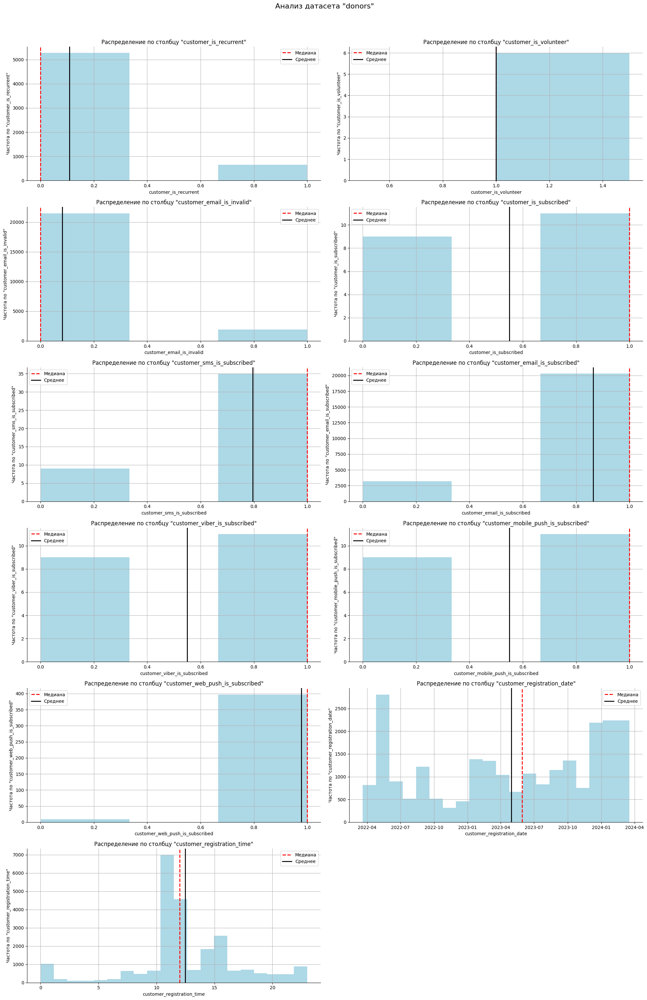

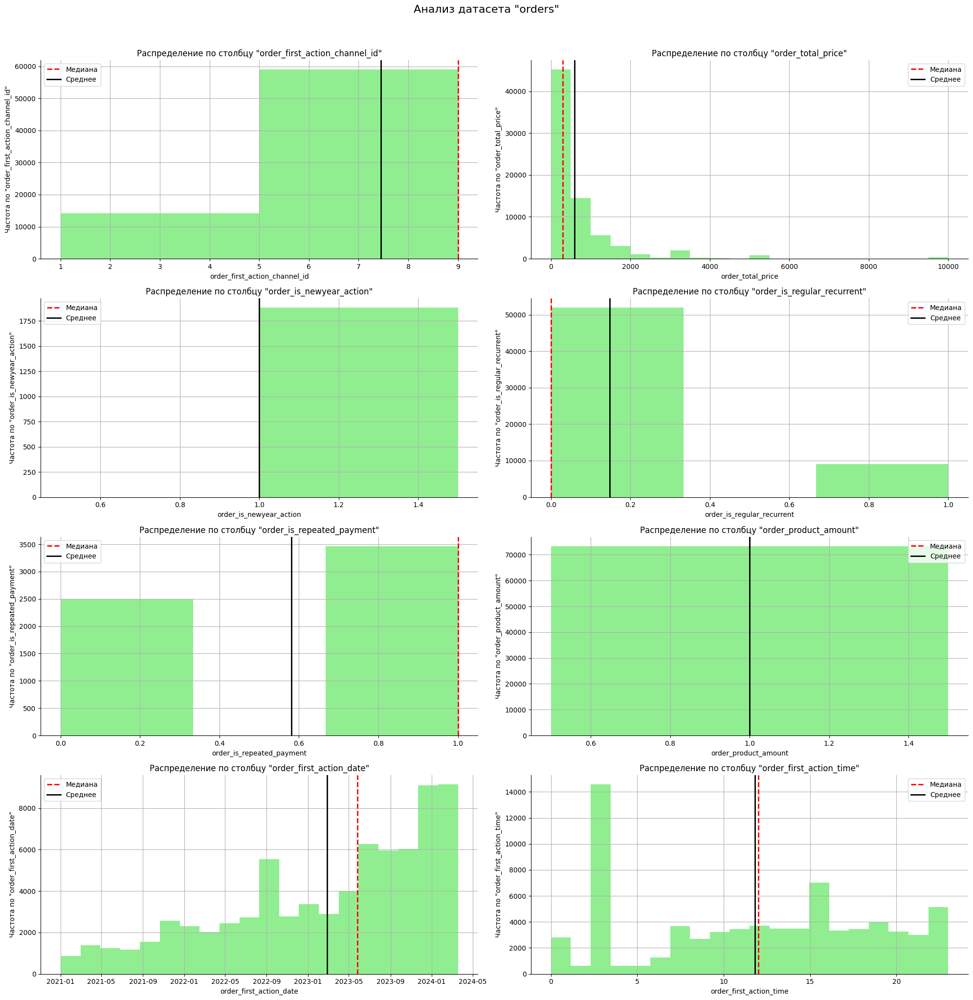

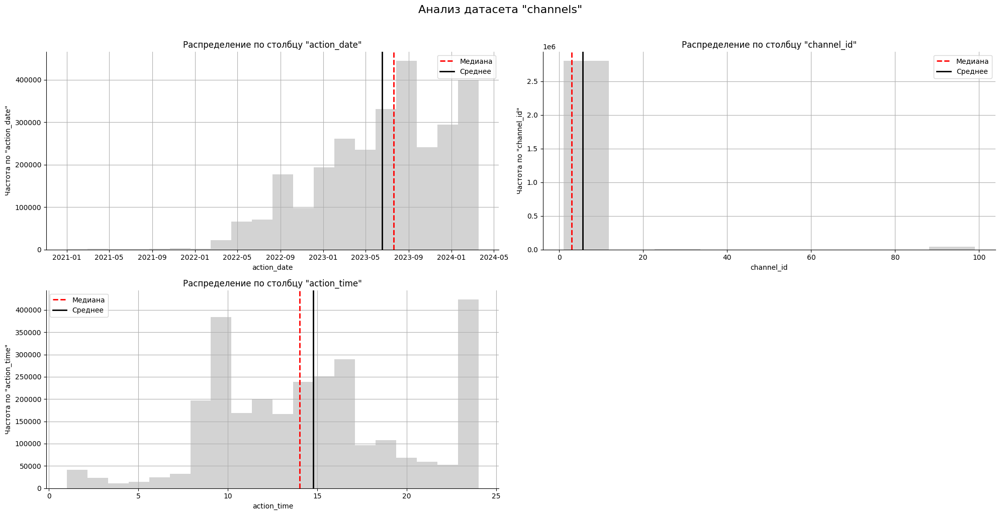

In [34]:
# Уберем выбросы в некоторых столбцах для визуализации
percentile_99_orders = np.percentile(orders['order_total_price'], 99)
percentile_99_channels = np.percentile(channels['channel_id'], 99)

orders_for_viz = orders.query('`order_total_price` <= @percentile_99_orders')
channels_for_viz = channels.query('`channel_id` <= @percentile_99_channels')

exclude_cols = ['customer_mindbox_id', 'customer_registration_datetime', 'order_mindbox_id', 'order_first_action_mindbox_id',
               'order_first_action_datetime', 'order_website_id', 'order_final_price', 'order_customer_mindbox_id', 'user_id']
datasets = [donors, orders_for_viz, channels_for_viz]
names = ['donors', 'orders', 'channels']
colors = ['lightblue', 'lightgreen', 'lightgrey']

for dataset, name, color in zip(datasets, names, colors):
    histograms(dataset, name, color, exclude_cols)

Анализ гистограмм показывает следующее:
- donors:
  - customer_is_recurrent: пользователей без автоплатежей гораздо больше, чем с ними;
  - customer_is_volunteer: вероятно, в столбце отмечены только волонтеры, если пользователь не волонтер, то пропуск в данных;
  - customer_email_is_invalid: у большинства пользователей email действующий;
  - customer_is_subscribed: пользователей с подпиской больше;
  - customer_registration_date: видим пик регистраций - весна 2022 года, заказчик в этот период загружал данные на Mindbox, затем много регистраций в конце 2023-начаде 2024 года;
  - customer_registration_time: пик - около 10 утра по Московскому времени.
- orders:
  - order_first_action_channel_id: у большинства - 9ый;
  - order_total_price: медиана в районе 200 руб., среднее -  около 500 руб.;
  - order_is_newyear_action, так же как с волонтерами в donors, если 1 - то да, все остальное пропуски;
  - order_is_regular_recurrent: пользователей с автоплатежом гораздо меньше, чем без него;
  - order_is_repeated_payment: много повторных платежей;
  - order_product_amount: 1;
  - order_first_action_date: видим пик активности в сентябре 2022 года, затем май-июнь 2023, декабрь 2023 - март 2024 года;
  - order_first_action_time: пользователи наиболее активны в 3 часа ночи по Москве, в 12 часов дня и в 6 вечера.
- channels:
  - action_date: видим пики в сентябре 2022, осенью 2023, в начале 2024 годов;
  - action_time: 10 утра и 12 ночи по Московскому времени.

<span style="color:blue; font-size:17px">Выводы:</span>

В рамках этапа предобработки данных были сделаны следующие изменения:
- датасет donors:
  - переименовали названия всех столбцов;
  - отредактировали значения в столбцах customer_is_recurrent, customer_is_volunteer, customer_email_is_invalid, customer_is_subscribed,
customer_sms_is_subscribed, customer_email_is_subscribed, customer_viber_is_subscribed, customer_mobile_push_is_subscribed, customer_web_push_is_subscribed, заменив True на 1, False на 0;
  - заменили типы данных в customer_is_recurrent, customer_is_volunteer, customer_email_is_invalid, customer_is_subscribed, customer_sms_is_subscribed, customer_email_is_subscribed, customer_viber_is_subscribed, customer_mobile_push_is_subscribed, customer_web_push_is_subscribed на integer, в customer_registration_datetime на datetime;
  - добавили новые столбцы customer_registration_date, customer_registration_time.
- датасет orders:
  - переименовали названия всех столбцов;
  - удалили столбцы order_next_paydate, order_geo_area_id, order_transaction_id, order_base_price;
  - отредактировали значения в столбцах order_is_newyear_action, order_is_regular_recurrent, order_is_repeated_payment, заменив True на 1, False на 0;
  - заменили типы данных, в order_website_id, order_is_newyear_action, order_is_regular_recurrent, order_is_repeated_recurrent на integer, в order_first_action_datetime на datetime;
  - добавили новые столбцы order_first_action_date, order_first_action_time.
- датасет imports:
  - переименовали столбец CustomerActionCustomerIdsMindboxId в imports_customer_mindbox_id;
  - создали новый датасет imports_id с одним столцом imports_customer_mindbox_id.
- датасет channels:
  - заменили типа данных в action_date на datetime.

[Возврат к описанию проекта](#toc)

<a id="7"></a>
## Исследовательский анализ данных

Для EDA воспользуемся библиотекой по созданию отчетов ydata_profiling.

<a id="8"></a>
<span style="color:green; font-size:22px">Датасет donors</span>

In [35]:
# Создаем отчет
donors_report = ProfileReport(donors, title='"donors" dataset report')
donors_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Уточним некоторые моменты по отчету.

In [36]:
# Посмотрим на топ-3 региона пользователей
display(donors.query('customer_area_id == "337"')['customer_area_name'].head(1))
display(donors.query('customer_area_id == "201"')['customer_area_name'].head(1))
display(donors.query('customer_area_id == "250"')['customer_area_name'].head(1))

42    Vienna
Name: customer_area_name, dtype: object

5    Москва
Name: customer_area_name, dtype: object

16    Санкт-Петербург
Name: customer_area_name, dtype: object

Регион 201 - Москва, но у нас Москва и МО область отдельно вынесены в этом же столбце в текстовом формате, также как 250 - Санкт-Петербург и Санкт-Петербург и ЛО. Проверим, нет ли такого рода совпадений по Новосибирской области, Республики Хакасии.

In [37]:
donors['customer_area_name'].unique()

array(['Ульяновская область', 'Санкт-Петербург и ЛО', 'Москва и МО',
       'Ростовская область', 'Москва', nan, 'Абакан', 'Санкт-Петербург',
       'Волгоград', 'Краснодар', 'Тверь', 'Ярославль', 'Химки',
       'Тольятти', 'Воронеж', 'Барнаул (84)', 'Екатеринбург',
       'Нижегородская область', 'Vienna', 'Самара', 'Люберцы',
       'Владикавказ', 'Улан-Удэ', 'Видное', 'Нижний Новгород',
       'Новосибирск', 'Рязань', 'Белгород', 'Владивосток',
       'Южно-Сахалинск', 'Астрахань', 'Тамбов', 'Орел', 'Якутск',
       'Апатиты', 'Истра', 'Уфа', 'Республика Башкортостан', 'Калуга',
       'Ставрополь', 'Брянск', 'Салават', 'Киев', 'Тула', 'Аксай',
       'Челябинск', 'Томилино', 'Ростов-на-Дону', 'Махачкала', 'Сочи',
       'Вышний Волочек', 'Тюмень', 'South Bend', 'Одинцово', 'Brezova',
       'Казань', 'Иркутск', 'Великий Новгород', 'Хабаровск', 'Курган',
       'Новороссийск', 'Ульяновск', 'Симферополь', 'Сыктывкар',
       'Владимир', 'Калининград', 'Саратов', 'Подольск', 'Киров',

In [38]:
donors.query('customer_area_name == "Апрелевка"')

,customer_is_recurrent,customer_is_volunteer,customer_gender,customer_area_id,customer_area_name,customer_area_time_zone,customer_time_zone_source,customer_mindbox_id,customer_email_is_invalid,customer_registration_datetime,customer_is_subscribed,customer_sms_is_subscribed,customer_email_is_subscribed,customer_viber_is_subscribed,customer_mobile_push_is_subscribed,customer_web_push_is_subscribed,customer_registration_date,customer_registration_time
1321,0,<NA>,female,92,Апрелевка,Europe/Moscow,Определили в трекере,15521,0,2024-02-21 09:30:00,<NA>,<NA>,1,<NA>,<NA>,<NA>,2024-02-21,12
1564,1,<NA>,female,92,Апрелевка,Europe/Moscow,Определили в трекере,16397,0,2024-02-02 11:50:00,<NA>,<NA>,1,<NA>,<NA>,<NA>,2024-02-02,15


Я вижу по данному столбцу много населенных пунктов, которые принадлежат к региону Москва и МО, например, Апрелевка относится к Москве, но код у нее отличный от Москвы - 92. Мы видим своего рода некорректное разнесение данных по customer_area_id. Рекомендация для заказчика: систематизировать данные по кодам и регионам.

По отчету мы можем сделать следующие выводы:
- ячеек с пропущенными данными - 53.2%;
- дубликаты не обнаружены;
- столбцов с категориальными данными - 11, с текстовыми - 3, с числовыми - 2, с датой - 2;
- в столбце customer_is_recurrent 75.1% пропущенных значений, уникальных значения - 2. Пользователей, у которых настроен автоплатеж всего 645 человек (2.7%);
- в столбце customer_is_volunteer более 99.9%, уникальное значение одно - проставлена единица, если пользователь волонтер. Таких пользователей всего 6 из 23820;
- в столбце customer_gender 21.4% пропусков, уникальных значений - 2. Женщин - 60.5%, мужчин - 18.1%, остальное - пропуски;
- в столбце customer_area_id 78.8% пропусков, уникальных значений - 193. Топ-3 по количеству благотворителей  проживают в регионах 337 (Вена), 201 (Москва), 250 (Санкт-Петербург);
- в столбце customer_area_name 78.8% пропусков, 191 уникальное значение. Топ-3 по количеству благотворителей сопадает со столбцом customer_area_id;
- в столбце customer_area_time_zone 51.2% пропусков, уникальных значений 99. 48.8% данных по часовым поясам пользователей было определено с помощью трекера, у 3х человек - по номеру мобильного телефона;
- в столбце customer_mindbox_id пропусков нет. Все значения уникальны. Минимальное значение - 2734, максимальное - 46786, всего пользователей в датасете 23820. Непонятно, это так Mindbox присваивает id беспорядочно или часть каких-то пользователй была удалена. Распределение смещено влево.
- в столбце customer_email_is_valid 1.8% пропусков, уникальных значений 2. Почта невалидна у 8.1% пользователей, валидна у 90.2%;
- в столбце customer_registration_datetime пропусков нет, уникальных значений 10508. Минимальная дата регистрации - 2022-03-19 21:32:00, максимальная дата - 2024-03-18 10:51:00. Пик регистраций приходится на апрель 2022 года - это момент, когда фонд загрузил всех пользователей в систему;
- в столбце customer_is_subscribed 99.9% пропусков, уникальных значений 2. 11 человек отмечены как имеющие подписку, у 9 ее нет;
- в столбце customer_sms_is_subscribed 99.8% пропусков, уникальных значений 2. 35 человек оформили подписку после контакта по SMS, 9 - не оформили;
- в столбце customer_email_is_subscribed 1.4% пропусков, уникальных значений 2. 85.1% человек оформили подписку после контакта по email, 13.4% - не оформили;
- в столбце customer_viber_is_subscribed 99.9% пропусков, уникальных значений 2. 11 человек оформили подписку после контакта через Viber, 9- не оформили;
- в столбце customer_mobile_push_is_subscribed 99.9% пропусков, уникальных значений 2. 11 человек оформили подписку после контакта c помощью push-сообщения на мобильный телефон, 9 - не оформили;
- в столбце customer_web_push_is_subscribed 98.3% пропусков, уникальных значений 2. 397 человек (1.7%) оформили подписку после контакта с помощью web_push-сообщения, 9 - не оформили;
- в столбце customer_registration_date пропусков нет, уникальных значений 701. Минимальная дата - 2022-03-20 00:00:00, максимальная дата - 2024-03-18 00:00:00;
- в столбце customer_registration_time пропусков нет, уникальных значений 24, пик приходится на 11-12 часов дня по Московскому времени;
- зависимость видна только у столбцов сustomer_mindbox_id и customer_registration_time;
- c пропусками ничего не делаем. У нас достаточное количество пропусков в столбцах с бинарными значениями, в данном случае, скорее всего если стоит пропуск, то это нет, т.е. 0, но исключать нельзя и то, что просто еще данные не успели внести. Также видим пропуски по геоданным, полу и др, скорее всего, данных просто нет и внесено то, что известно.

<a id="9"></a>
<span style="color:green; font-size:22px">Датасет orders</span>

In [39]:
# Создаем отчет
orders_report = ProfileReport(orders, title='"orders" dataset report')
orders_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [40]:
# Посмотрим на топ-3 названий продукта
orders['order_product_name'].value_counts().head(3)

order_product_name
На уставную деятельность                                                                                                    11552
Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Пожертвование (хочу помочь)                                        7389
Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Пожертвование на уставную деятельность БФ «АиФ. Доброе сердце»     4404
Name: count, dtype: int64

In [41]:
# Для краткости удалим "Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Пожертвование" во всех строках
substring_to_remove = 'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» '
orders['order_product_name'] = orders['order_product_name'].str.replace(substring_to_remove, '', regex=False)

Тем не менее, у нас все равно дублируются значения "На уставную деятельность" и "Пожертвование на уставную деятельность БФ «АиФ. Доброе сердце». Я не буду вносить изменения, так как, возможно, это все-таки разные акции по годам и заказчик намеренно таким образом их разделил. Рекомендация для заказчика: проверить, если это все-таки дублирующиеся названия, то привести их к одному.

In [42]:
# Проверим на всякий случай первые даты по названиям
print('min:', orders.query('order_product_name == "На уставную деятельность"')['order_first_action_date'].min())
print('max:', orders.query('order_product_name == "На уставную деятельность"')['order_first_action_date'].max())

min: 2021-01-01 00:00:00
max: 2022-11-30 00:00:00


In [43]:
print('min:', orders.query('order_product_name == "Пожертвование на уставную деятельность БФ «АиФ. Доброе сердце»"') \
      ['order_first_action_date'].min())
print('max:', orders.query('order_product_name == "Пожертвование на уставную деятельность БФ «АиФ. Доброе сердце»"') \
      ['order_first_action_date'].max())

min: 2022-04-06 00:00:00
max: 2024-03-18 00:00:00


Похоже, что это все-таки разные продукты, оставим как есть.

In [44]:
# Удалим столбец order_first_action_channel_external_id как дублирующий order_first_action_channel_name
orders.drop(columns = ['order_first_action_channel_external_id'], inplace=True)

In [45]:
# Посмотрим на пропуски в столбце order_product_name на предмет их возможного дозаполнения
orders[orders['order_product_name'].isnull()]

,order_mindbox_id,order_first_action_mindbox_id,order_first_action_datetime,order_first_action_channel_id,order_first_action_channel_name,order_total_price,order_website_id,order_is_newyear_action,order_is_regular_recurrent,order_is_repeated_payment,order_product_website_id,order_product_name,order_product_amount,order_final_price,order_is_paid,order_customer_mindbox_id,order_first_action_date,order_first_action_time
39,93229,251060,2022-04-21 11:16:00,9,Сайт,10,<NA>,<NA>,0,<NA>,На уставную деятельность,NaN,1,10,paid,2861,2022-04-21,14
358,85938,243751,2022-04-02 12:58:00,9,Сайт,100,<NA>,<NA>,1,<NA>,На уставную деятельность,NaN,1,100,paid,8611,2022-04-02,16
359,88990,246813,2022-05-02 12:58:00,9,Сайт,100,<NA>,<NA>,1,<NA>,На уставную деятельность,NaN,1,100,paid,8611,2022-05-02,16
360,93385,251216,2022-06-02 12:58:00,9,Сайт,100,<NA>,<NA>,1,<NA>,На уставную деятельность,NaN,1,100,paid,8611,2022-06-02,16
467,89624,247449,2022-04-21 14:58:00,9,Сайт,100,<NA>,<NA>,0,<NA>,На уставную деятельность,NaN,1,100,paid,8764,2022-04-21,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68016,141779,222863594,2023-12-23 16:21:00,9,Сайт,3000,123284,<NA>,1,0,-1)) OR 947=(SELECT 947 FROM PG_SLEEP(15))--,NaN,1,3000,notpaid,43457,2023-12-23,19
68018,141784,222863652,2023-12-23 16:23:00,9,Сайт,3000,123289,<NA>,1,0,"49906*DBMS_PIPE.RECEIVE_MESSAGE(CHR(99)||CHR(99)||CHR(99),15)",NaN,1,3000,notpaid,43457,2023-12-23,19
68026,141777,222864615,2023-12-23 16:21:00,9,Сайт,3000,123282,<NA>,1,0,-5) OR 806=(SELECT 806 FROM PG_SLEEP(15))--,NaN,1,3000,notpaid,43457,2023-12-23,19
68027,141787,222864664,2023-12-23 16:23:00,9,Сайт,3000,123292,<NA>,1,0,0,NaN,1,3000,notpaid,43457,2023-12-23,19


In [46]:
# Посмотрим на данные  с id продукта - "На уставную деятельность"
orders.query('order_product_website_id == "На уставную деятельность"')

,order_mindbox_id,order_first_action_mindbox_id,order_first_action_datetime,order_first_action_channel_id,order_first_action_channel_name,order_total_price,order_website_id,order_is_newyear_action,order_is_regular_recurrent,order_is_repeated_payment,order_product_website_id,order_product_name,order_product_amount,order_final_price,order_is_paid,order_customer_mindbox_id,order_first_action_date,order_first_action_time
39,93229,251060,2022-04-21 11:16:00,9,Сайт,10,<NA>,<NA>,0,<NA>,На уставную деятельность,NaN,1,10,paid,2861,2022-04-21,14
358,85938,243751,2022-04-02 12:58:00,9,Сайт,100,<NA>,<NA>,1,<NA>,На уставную деятельность,NaN,1,100,paid,8611,2022-04-02,16
359,88990,246813,2022-05-02 12:58:00,9,Сайт,100,<NA>,<NA>,1,<NA>,На уставную деятельность,NaN,1,100,paid,8611,2022-05-02,16
360,93385,251216,2022-06-02 12:58:00,9,Сайт,100,<NA>,<NA>,1,<NA>,На уставную деятельность,NaN,1,100,paid,8611,2022-06-02,16
467,89624,247449,2022-04-21 14:58:00,9,Сайт,100,<NA>,<NA>,0,<NA>,На уставную деятельность,NaN,1,100,paid,8764,2022-04-21,18
468,91887,249719,2022-06-23 15:45:00,9,Сайт,100,<NA>,<NA>,0,<NA>,На уставную деятельность,NaN,1,100,paid,8764,2022-06-23,19
625,88986,246809,2022-05-13 13:25:00,9,Сайт,100,<NA>,<NA>,1,<NA>,На уставную деятельность,NaN,1,100,paid,9165,2022-05-13,16
626,90991,248820,2022-04-13 19:48:00,9,Сайт,100,<NA>,<NA>,0,<NA>,На уставную деятельность,NaN,1,100,paid,9165,2022-04-13,23
627,93577,251408,2022-04-21 11:25:00,9,Сайт,100,<NA>,<NA>,0,<NA>,На уставную деятельность,NaN,1,100,paid,9165,2022-04-21,14
1538,91674,249504,2022-04-12 12:15:00,9,Сайт,300,<NA>,<NA>,0,<NA>,На уставную деятельность,NaN,1,300,paid,10549,2022-04-12,15


In [47]:
# Создаем словарь соответствий из строк, где нет пропусков
lookup_dict = orders.dropna(subset=['order_product_name']).set_index('order_product_website_id')['order_product_name'].to_dict()
# Определим функцию для вывода первых n элементов словаря
def head_dict(d, n=5):
    return dict(itertools.islice(d.items(), n))

first_5_elements = head_dict(lookup_dict, 5)
first_5_elements

{'9847': 'Никита Суриков',
 '1': 'На уставную деятельность',
 '4353': 'Роман Рыбаков',
 '7482': 'Полина Чинкова',
 '16963': 'Егор Цуканов'}

Скорее всего тут произошла путаница. И вместо столбца order_product_name данные "На уставную деятельность" были внесены в столбец order_product_website_id, вместо соответствующего id=1. Заменим пропуски в данных строках на значение "На уставную деятельность".

In [48]:
orders.loc[(orders['order_product_website_id'] == 'На уставную деятельность') & (orders['order_product_name'].isnull()),
'order_product_name'] = 'На уставную деятельность'

In [49]:
len(orders[orders['order_product_name'].isnull()])

278

In [50]:
# Попробуем найти прямые соответствия там где order_product_website_id и order_product_name заполнены и заменить пропуски в
# order_product_name
orders['order_product_name'] = orders.apply(
    lambda row: lookup_dict[row['order_product_website_id']] if pd.isnull(row['order_product_name']) and \
    row['order_product_website_id'] in lookup_dict else row['order_product_name'], axis=1)

In [51]:
len(orders[orders['order_product_name'].isnull()])

278

К сожалению, больше пропусков в order_product_name заполнить не удалось.

По отчету мы можем сделать следующие выводы:
- ячеек с пропущенными данными - 10.9%;
- дубликаты не обнаружены;
- столбцов с категориальными данными - 8, с текстовыми - 2, с числовыми - 7, с датой - 3;
- в столбце order_mindbox_id пропусков нет, все значения уникальны. Минимальное значение - 4, максимальное - 154565;
- в столбце order_first_action_mindbox_id пропусков нет, все значения уникальны. Минимальное значение 33695, максимальное - 2.7845591 × 10 в 8 степени;
- в столбце order_first_action_datetime пропусков нет, уникальных значений 49810. Минимальная дата - 2021-01-01 00:00:00, максимальная дата - 2024-03-18 12:03:00. Наибольшая активность прослеживается в сентябре 2022 года, сентябре 2023 года и в начале 2024 года;
- в столбце order_first_action_channel_id пропусков нет, уникальных значений 2. У id 9 - 80.6%, у id 1 - 19.4%;
- в столбце order_first_action_channel_external_id пропусков нет, уникальных значений 2. Site (id 9, видимо) - 80.6%, Administrator (id 1) - 19.4. Удален как дублирующий;
- в столбце order_first_action_channel_name пропусков нет, уникальных значений 2. Сайт - 80.6%, административный сайт Mindbox - 19.4%;
- в столбце order_total_price пропущенных значений нет, уникальных значений 731. Минимальная сумма - 0, максимальная 1100000. Нулей 10.2%;
- в столбце order_website_id 0.9% пропусков, все значения уникальны. Минимальный id - 15857, максимальный - 1.4460083 × 10 в 9 степени;
- в столбце order_is_newyear_action 97.4% пропусков, уникальное значение 1 - 2.6%;
- в столбце order_is_regular_recurrent 16.9% пропусков, уникальных значений 2. Постоянных рекуррентов 12.3%;
- в столбце order_is_repeated_recurrent 91.9% пропусков, уникальных значений 2. Повторных платежей 4.7%;
- в столбце order_product_website_id пропусков нет, уникальных значений 277. Заказов с id 1 - 15.7%, c id 49909 - 7.4%, c id 49906 - 4.6%;
- в столбце order_product_name 0.4% пропусков, уникальных значений 170. Топ-3 названий продуктов: "На уставную деятельность", "Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Пожертвование (хочу помочь)", "Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Пожертвование на уставную деятельность БФ «АиФ. Доброе сердце»";
- в столбце order_product_amount пропусков нет, уникальное значение - 1 (100%);
- в столбце order_final_price пропусков нет, 744 уникальных значения от 0 до 1100000. Нулей 0.2%. 20.8% благотворителей пожертвовали 500 рублей, 19.9% - 300 руб., 13.2% - 100 руб., 9.2% - 200 руб., 7.8% - 1000 руб.;
- в столбце order_is_paid пропусков нет, уникальных значений - 3. 70.6% заказов в статусе paid, 20.1% - notpaid, 9.3% - fail;
- в столбце order_customer_mindbox_id пропусков нет, 21370 уникальных значений от 2734 до 46789;
- в столбце order_first_action_date пропусков нет, 1157 уникальных значений. Минимальная дата - 2021-01-01 00:00:00, максимальная дата - 	2024-03-18 00:00:00. Наибольшая активность прослеживается в сентябре 2022 года, сентябре 2023 года и в начале 2024 года;
- в столбцу order_first_action_time пропусков нет, 24 уникальных значения, пик скорее всего на 0 часов (до перевода на Московское время), так как время похоже отсутствует в части данных;
- зависимость видна между order_final_price, order_customer_mindbox_id, order_first_action_time, order_first_action_mindbox_id, order_total_price, order_website_id, order_mindbox_id;
- c пропусками ничего не делаем. Часть пропусков в order_product_name удалось дозаполнить, в столбцах с бинарными значениями, в данном случае, скорее всего, если стоит пропуск, то это нет, т.е. 0, но исключать нельзя и то, что просто еще данные не успели внести.

<a id="10"></a>
<span style="color:green; font-size:22px">Датасет imports_id</span>

In [52]:
# Создаем отчет
imports_report = ProfileReport(imports_id, title='"imports" dataset report')
imports_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [53]:
# Посмотрим на дубликаты в датасете imports в целом
imports.query('imports_customer_mindbox_id == 16015')

,CustomerActionIdsMindboxId,CustomerActionActionTemplateIdsSystemName,CustomerActionActionTemplateName,CustomerActionDateTimeUtc,CustomerActionCreationDateTimeUtc,CustomerActionBrandIdsSystemName,CustomerActionChannelIdsMindboxId,CustomerActionChannelName,CustomerActionChannelIdsExternalId,CustomerActionChannelIdsSystemName,CustomerActionChannelUtmCampaign,CustomerActionChannelUtmSource,CustomerActionChannelUtmMedium,CustomerActionChannelUtmContent,CustomerActionChannelUtmTerm,CustomerActionCustomerIdsBackendID,CustomerActionCustomerIdsWebsiteID,imports_customer_mindbox_id
1558,16637,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:32,19.03.2022 21:32,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16015
1559,17533,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:32,19.03.2022 21:32,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16015
1560,19909,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:32,19.03.2022 21:32,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16015
1561,20418,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:32,19.03.2022 21:32,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16015
1562,24758,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:33,19.03.2022 21:33,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16015
1563,23263,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:33,19.03.2022 21:33,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16015
1564,21940,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:32,19.03.2022 21:32,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16015
1565,28716,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:33,19.03.2022 21:33,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16015
1566,30139,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:33,19.03.2022 21:33,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16015
1567,27469,ImportPriPerenoseIstoricheskoj,Импорт при переносе исторической базы клиентов,19.03.2022 21:33,19.03.2022 21:33,Dobroaif,9,Сайт,Site,Sajt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16015


У всех дубликатов дата переноса 19.03.2022 и время отличается на минуту. Похоже на системный сбой. Удалим дубликаты.

In [54]:
# Удалим дубликаты
imports_id = imports_id.drop_duplicates().reset_index(drop=True)

По отчету мы можем сделать следующие выводы:
- ячеек с пропущенными данными нет;
- обнаружено 204 дубликата, дубликаты удалены;
- в столце 7343 уникальных значения из 7651. Минимальное значение - 2734, максимальное - 43103. Id 15285, 16515, 7893, 16015 повторяются более 10 раз. Распределение смещено влево.

<a id="11"></a>
<span style="color:green; font-size:22px">Датасет channels</span>

In [55]:
# Создаем отчет
channels_report = ProfileReport(channels, title='"channels" dataset report')
channels_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [56]:
# Посмотрим на топ-5 действий пользователей
channels['user_action'].value_counts()

user_action
Просмотр “Дети”                                                              110369
Переход на сайт                                                              103365
Оформление заказа в операции Заказ - Создание неавторизованным                59417
Пожертвование — разово                                                        52072
Просмотр продукта в операции 'Просмотр продукта'                              50184
                                                                              ...  
Новости. Лиза Сазонова Запрос отписки                                             1
Отчет. Ваня Нагорный                                                              1
Отчет. Ваня Нагорный Открытие                                                     1
Отчет. Ваня Нагорный Отправка                                                     1
Спасибо за разовые пожертвования (повторные) Новый шаблон Не отправлялось         1
Name: count, Length: 1752, dtype: int64

In [57]:
# Определим функцию для проверки данных на наличие явных дубликатов
def find_explicit_duplicates(dataset):

    # Находим явные дубликаты
    explicit_duplicates_cnt = display(f'Количество явных дубликатов: {dataset.duplicated().sum()}')

    explicit_duplicates = None
    explicit_duplicates_cnt = 0

    # Выводим дубликаты в виде таблицы, если они есть
    if dataset.duplicated().sum() > 0:
        explicit_duplicates = display(dataset[dataset.duplicated(keep=False)])

    else:
        display('Явные дубликаты не найдены')

In [58]:
# Проверим явные дубликаты в датасете
dataset = channels
find_explicit_duplicates(dataset)

'Количество явных дубликатов: 224952'

,user_action,action_date,channel_id,utm_campaign,utm_source,utm_medium,user_id,action_time,channel
31,Просмотр “Дети”,2023-03-29,9,NaN,NaN,NaN,2847,18,Сайт
34,Пожертвование — разово,2023-03-29,9,NaN,NaN,NaN,2847,18,Сайт
38,Просмотр “Дети”,2023-03-29,9,NaN,NaN,NaN,2847,18,Сайт
40,Пожертвование — разово,2023-03-29,9,NaN,NaN,NaN,2847,18,Сайт
41,Пожертвование — разово,2023-03-29,9,NaN,NaN,NaN,2847,18,Сайт
...,...,...,...,...,...,...,...,...,...
873408,Пожертвование — разово,2024-03-18,9,NaN,NaN,NaN,46786,12,Сайт
873410,Пожертвование — разово,2024-03-18,9,NaN,NaN,NaN,46786,12,Сайт
873417,Оформление заказа в операции Заказ - Создание неавторизованным,2024-03-18,9,NaN,NaN,NaN,46786,12,Сайт
873419,Оформление заказа в операции Заказ - Создание неавторизованным,2024-03-18,9,NaN,NaN,NaN,46786,12,Сайт


In [59]:
# Посмотрим на одного из клиентов поближе
channels.query('user_id == 43457 & action_time == 18 and action_date == "2023-12-23"').sort_values(by='user_action').head(30)

,user_action,action_date,channel_id,utm_campaign,utm_source,utm_medium,user_id,action_time,channel
715357,Добавление продукта в список в операции 'Корзина - Установка списка',2023-12-23,9,NaN,NaN,NaN,43457,18,Сайт
715365,Добавление продукта в список в операции 'Корзина - Установка списка',2023-12-23,9,NaN,NaN,NaN,43457,18,Сайт
715354,Добавление продукта в список в операции 'Корзина - Установка списка',2023-12-23,9,NaN,NaN,NaN,43457,18,Сайт
715364,Добавление продукта в список в операции 'Корзина - Установка списка',2023-12-23,9,NaN,NaN,NaN,43457,18,Сайт
715363,Добавление продукта в список в операции 'Корзина - Установка списка',2023-12-23,9,NaN,NaN,NaN,43457,18,Сайт
715356,Добавление продукта в список в операции 'Корзина - Установка списка',2023-12-23,9,NaN,NaN,NaN,43457,18,Сайт
716237,Добавление продукта в список в операции 'Корзина - Установка списка',2023-12-23,9,NaN,NaN,NaN,43457,18,Сайт
715361,Добавление продукта в список в операции 'Корзина - Установка списка',2023-12-23,9,NaN,NaN,NaN,43457,18,Сайт
715186,Клик — 1500р,2023-12-23,9,NaN,NaN,NaN,43457,18,Сайт
716492,Клик — 1500р,2023-12-23,9,NaN,NaN,NaN,43457,18,Сайт


Поскольку у нас идентификаторы разные, все остальное совпадает, можно предположить, что это какой-то системный сбой, "зависание" сайта, когда пользователь кликает на кнопку, но ему кажется, что ничего не происходит, а на самом деле в корзине уже 10 позиций. Если бы у нас в столбце со временем были часы и минуты, мы могли бы более точно понимать, дубликаты это или нет. На сайте фонда кроме кнопок с зафиксированными суммами пожертвований есть опция "другая сумма", поэтому оснований столько раз кликать на одну и ту же сумму у пользователя нет (кроме, может личных причин), поэтому будем считать, что это все же дубликаты и удалим их.

In [60]:
channels = channels.drop_duplicates().reset_index(drop=True)

In [61]:
# Посмотрим на уникальные значения столбца utm_medium
channels['utm_medium'].unique()

array([nan, 'cpa', 'social', 'media', 'email', 'sms', 'qr', 'cpc',
       'pop-up', 'banner', 'cpm', 'messenger', 'qr,qr', 'free', 'cpaa',
       'webpush', 'partner', 'email,email', 'referral', 'cpc_grant',
       'cpc,cpc'], dtype=object)

Не очень понятно, что в нем лежит. Похоже на источники привлечения и каналы входа.

По отчету мы можем сделать следующие выводы:
- ячеек с пропущенными данными 32.8%;
- обнаружено 117225 дубликата, они удалены;
- столбцов с текстовыми данными - 2, с числовыми - 3, с категориальными - 3, c датой - 1;
- в столбце user_action пропусков нет, уникальных значений 1752. Топ-5 действий: "Просмотр “Дети”", "Переход на сайт", "Оформление заказа в операции Заказ - Создание неавторизованным", "Пожертвование — разово", "Просмотр продукта в операции 'Просмотр продукта'";
- в столбце action_date пропусков нет, уникальных значений 1169. Минимальная дата - 2021-01-01 00:00:00, максимальная дата - 2024-03-18 00:00:00, наибольшая активность наблюдается в июле_августе 2023 года;
- в столбце channel_id пропусков нет, уникальных значений 22. Чаще всего встречаются каналы с id 3, 9, 1;
- в столбце utm_campaign 98.3% пропусков, 257 уникальных значений. Более всего клиентов учавстовали в акциях с кодами 1029149673, new_year, 1029194815;
- в столбце utm_source 98.3% пропусков, 39 уникальных значений. Больше всего пользователей (0.6%) пришли по каналам  Mindbox и VK;
- в столбце utm_medium 98.3% пропусков, 20 уникальных значений. Более всего пользователей по данным этого столбца пришли с каналов email (0.7%), cpc (0.5%), cpa (0.2%);
- в столбце user_id пропусков нет, уникальных значений 23820. Минимальное - 2734, максимальное - 46786. Распределение походе на нормальное, со смещением влево;
- в столбце action_time пропусков нет. Уникальных значений 24. Наиболее часто встречаемое время - 10 утра и 12 ночи по Московскому времени;
- в столбце channel пропусков нет, уникальных значений 22. Лидируют с большим отрывом следующие каналы: 74.4% - email, 19.4% - сайт;
- хорошо видны взаимосвязи между channel_id, action_time, user_id;
- c пропусками ничего не делаем, скорее всего они связаны с недостаточностью информации о пользователях.

In [62]:
# Сверяем наши данные по количеству строк по окончанию обработки данных в датасетах
a1, b1 = len(temp1), len(donors)
print('Было строк в donors:', len(temp1), ', стало строк:', len(donors), ', удалено в %:', round((a1 - b1) / a1 * 100, 2))

a2, b2 = len(temp2), len(orders)
print('Было строк в orders:', len(temp2), ', стало строк:', len(orders), ', удалено в %:', round((a2 - b2) / a2 * 100, 2))

a3, b3 = len(temp3), len(imports_id)
print('Было строк в imports_id:', len(temp3), ', стало строк:', len(imports_id), ', удалено в %:', round((a3 - b3) / a3 * 100, 2))

a4, b4 = len(temp4), len(channels)
print('Было строк в channels:', len(temp4), ', стало строк:', len(channels), ', удалено в %:', round((a4 - b4) / a4 * 100, 2))

Было строк в donors: 23820 , стало строк: 23820 , удалено в %: 0.0
Было строк в orders: 73763 , стало строк: 73763 , удалено в %: 0.0
Было строк в imports_id: 7651 , стало строк: 7343 , удалено в %: 4.03
Было строк в channels: 2864953 , стало строк: 2640001 , удалено в %: 7.85


<span style="color:blue; font-size:17px">Выводы:</span>

В рамках этапа исследовательского анализа данных были сделаны следующие изменения и выводы:
- датасет donors:
  - изучили общую информация о датасете;
  - изучили уникальные значения в столбцах;
  - обнаружили несоответствия в столбце customer_area_name, когда более мелкие города крупного региона не входят в него по его коду, а имеют свой собственный;
  - дубликаты не обнаружены;
  - обнаружены пропуски (53.2% данных) во всех столбцах, кроме customer_registration_time, customer_registration_datetime, customer_registration_date, customer_mindbox_id. Оставили пропуски без изменений, так как они, скорее всего, связаны или с недостатком информации о пользователях или с тем, что в бинарных столбцах отмечались только те пользователи, значение для которых соответствовало истине.
- датасет orders:
  - изучили общую информация о датасете;
  - изучили уникальные значения в столбцах;
  - возможно, вместо столбца order_product_name данные "На уставную деятельность" внесены в столбец order_product_website_id как id, что создает путиницу в данных;
  - дубликаты не обнаружены;
  - обнаружены пропуски (10.9% данных) в столбцах order_product_name, order_website_id, order_is_regular_recurrent, order_is_repeated_payment, order_is_newyear_action. Часть пропусков в order_product_name удалось дозаполнить, остальные оставили без изменений, так как они, скорее всего, связаны или с недостатком информации о пользователях или с тем, что в бинарных столбцах отмечались только те пользователи, значение для которых соответствовало истине.
- датасет imports_id:
  - изучили общую информация о датасете;
  - изучили уникальные значения в столбце;
  - обнаружили 204 дубликата, удалили их;
  - пропусков не обнаружено.
- датасет channels:
  - изучили общую информация о датасете;
  - изучили уникальные значения в столбцах;
  - обнаружили 117225 дубликата, удалили их;
  - обнаружены пропуски (32.8%) в столбцах utm_campaign, utm_source, utm_medium. Оставили их как есть, скорее всего они связаны с недостаточностью информации о пользователях.

[Возврат к описанию проекта](#toc)

<a id="12"></a>
## Целевой анализ данных

<a id="13"></a>
<span style="color:green; font-size:22px">Пользовательские метрики</span>

<span style="color:blue; font-size:17px">Определение функций</span>

In [63]:
# Определим функцию для подсчета средних значений
def count_means(continuous_cols, discrete_cols, binary_cols, object_cols, data, column):
    '''
    Функция предназначена для агрегаций значений выбранных солбцов с помощью различных функций:
    - группировка данных по столбцу column;
    - агрегация значений столбцов с помощью различных функций:
      - для непрерывных признаков берется среднее значение;
      - для дискретных признаков берется медиана;
      - для бинарных признаков также берется среднее значение;
      - для категориальных признаков берется мода (наиболее часто встречающееся значение).
    - округление всех значений до двух знаков после запятой;
    - сброс индексов группы и переиндексация для удобства;
    - транспонирование полученной таблицы для удобства чтения и отображения;
    - возвращение результата в виде таблицы.
    '''
    table_name = (data
                 .groupby(column)
                 .agg({**{col: 'median' for col in continuous_cols},
                       **{col: 'mean' for col in discrete_cols},
                       **{col: 'mean' for col in binary_cols},
                       **{col: lambda x: x.mode().iloc[0] for col in object_cols}})
                 .round(2)
                 .reset_index()
                 .T)
    return table_name

In [64]:
# Определим функцию для визуализации количества значений по столбцам c помощью круговой диаграммы
def cols_value_counts_viz_pie(data, feature, ax):
    # Подсчет количества значений в столбце
    data_counts = data[feature].value_counts()

    # Создание круговой диаграммы
    ax.pie(data_counts.values, labels=None, autopct='%1.1f%%', startangle=140, explode=(0.01, 0),
            colors=['#87CEEB', '#90EE90'])
    ax.legend(labels=data_counts.index, loc="center left", bbox_to_anchor=(1, 0.5))
    ax.axis('equal')
    ax.set_title(f'Распределение по признаку {feature}')

    # Убираем рамки
    for spine in ['left', 'right', 'bottom', 'top']:
        ax.spines[spine].set_visible(False)

In [65]:
# Определим функцию для визуализации круговых диаграмм по заданным столбцам с использованием функции cols_value_counts_viz_pie
def viz_params_for_vis_function_pie(columns_to_plot, dataset):
    # Определяем количество строк и столбцов в сетке подграфиков
    n_cols = 2
    n_rows = math.ceil(len(columns_to_plot) / n_cols)  # Вычисляем количество строк
    n_plots = len(columns_to_plot)   # Вычисляем количество создаваемых графиков

    # Создаем фигуру для подграфиков
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(10 * n_cols, 5 * n_rows))

    # Цикл для создания диаграмм для каждого столбца
    for i, column in enumerate(columns_to_plot):
        if i < n_plots:  # Создаем подграфики только для необходимого количества
            row = i // n_cols
            col = i % n_cols
            ax = axes[row, col] if n_rows > 1 else axes[col]  # Учитываем количество строк
            cols_value_counts_viz_pie(dataset, column, ax)

    # Убираем пустые подграфики в последней строке, если необходимо
    if n_plots % n_cols != 0:
        for col in range(n_plots % n_cols, n_cols):
            fig.delaxes(axes[n_rows - 1, col])

    plt.tight_layout()
    plt.show()

In [66]:
# Определим функцию для визуализации количества значений по столбцам c помощью столбчатой диаграммы. Возьмем топ-15 значений
def cols_value_counts_viz(data, feature, ax):
    # Подсчет количества значений в столбце
    data_counts = data[feature].value_counts().head(15)

    # Создание столбчатой диаграммы
    sns.barplot(x=data_counts.index, y=data_counts.values, color='skyblue', ax=ax)
    ax.set_xlabel(f'Количество {feature}')
    ax.set_ylabel('Частота')
    ax.set_title(f'Распределение по признаку {feature}')
    ax.tick_params(axis='x', rotation=90)

    # Убираем рамки
    for spine in ['left', 'right', 'bottom', 'top']:
        ax.spines[spine].set_visible(False)

    plt.tight_layout()

In [67]:
# Определим функцию для визуализации столбчатых диаграмм по заданным столбцам с использованием функции cols_value_counts_viz
def viz_params_for_vis_function(columns_to_plot, dataset):
    # Определяем количество строк и столбцов в сетке подграфиков
    n_cols = 2
    n_rows = math.ceil(len(columns_to_plot) / n_cols)  # Вычисляем количество строк
    n_plots = len(columns_to_plot)   # Вычисляем количество создаваемых графиков

    # Создаем фигуру для подграфиков
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12 * n_cols, 8 * n_rows))

    # Цикл для создания диаграмм для каждого столбца
    for i, column in enumerate(columns_to_plot):
        if i < n_plots:  # Создаем подграфики только для необходимого количества
            row = i // n_cols
            col = i % n_cols
            ax = axes[row, col] if n_rows > 1 else axes[col]  # Учитываем количество строк
            cols_value_counts_viz(dataset, column, ax)

    # Убираем пустые подграфики в последней строке, если необходимо
    if n_plots % n_cols != 0:
        for col in range(n_plots % n_cols, n_cols):
            fig.delaxes(axes[n_rows - 1, col])

    plt.tight_layout()
    plt.show()

In [68]:
# Определим функцию для визуализации данных в виде воронки
def plot_funnel_chart(labels, values, title='Распределение пользователей на каждом этапе', color='skyblue'):
    '''
    Функция предназначена для создания воронкообразной диаграммы:
    - param labels: Список меток для каждого этапа;
    - param values: Список значений для каждого этапа;
    '''
    fig, ax = plt.subplots(figsize=(10, 6))

    # Задаем ширину полосы и начальное положение
    width = 0.6
    for i, (label, value) in enumerate(zip(labels, values)):
        left = (max(values) - value) / 2
        ax.barh(i, value, height=width, left=left, color=color)
        ax.text(max(values) / 2, i, f'{value:,}', ha='center', va='center', fontsize=12, color='black')

    # Настройки осей и меток
    ax.set_yticks(np.arange(len(labels)))
    ax.set_yticklabels(labels)
    ax.invert_yaxis()  # Самая большая полоса сверху
    ax.set_xlabel('Количество пользователей')
    ax.set_title(title)

    # Убираем рамки
    for spine in ['left', 'right', 'bottom', 'top']:
        ax.spines[spine].set_visible(False)

    plt.show()

<span style="color:blue; font-size:17px">Анализ исторических пользователей</span>

In [69]:
# Проверим датасеты donors и imports_id на совпадение уникальных значений по столбцам с id пользователей
print(np.setdiff1d(imports_id['imports_customer_mindbox_id'].unique(), donors['customer_mindbox_id'].unique()))
print(np.setdiff1d(donors['customer_mindbox_id'].unique(), imports_id['imports_customer_mindbox_id'].unique()))
print('Разница в количестве значений между donors и imports_id:',
len(np.setdiff1d(donors['customer_mindbox_id'].unique(), imports_id['imports_customer_mindbox_id'].unique())))

[]
[25240 25258 25285 ... 46784 46785 46786]
Разница в количестве значений между donors и imports_id: 16477


In [70]:
# Проверим датасеты orders и imports_id на совпадение уникальных значений по столбцам с id пользователей
print(np.setdiff1d(imports_id['imports_customer_mindbox_id'].unique(), orders['order_customer_mindbox_id'].unique()))
print(np.setdiff1d(orders['order_customer_mindbox_id'].unique(), imports_id['imports_customer_mindbox_id'].unique()))
print('Разница в количестве значений между imports_id и orders:',
      len(np.setdiff1d(imports_id['imports_customer_mindbox_id'].unique(), orders['order_customer_mindbox_id'].unique())))
print('Разница в количестве значений между orders и imports_id:',
      len(np.setdiff1d(orders['order_customer_mindbox_id'].unique(), imports_id['imports_customer_mindbox_id'].unique())))

[ 6915  6930  6967 ... 28779 29317 29319]
[25258 25285 25292 ... 46786 46787 46789]
Разница в количестве значений между imports_id и orders: 1734
Разница в количестве значений между orders и imports_id: 15761


In [71]:
# Проверим датасеты channels и imports_id на совпадение уникальных значений по столбцам с id пользователей
print(np.setdiff1d(imports_id['imports_customer_mindbox_id'].unique(), channels['user_id'].unique()))
print(np.setdiff1d(channels['user_id'].unique(), imports_id['imports_customer_mindbox_id'].unique()))
print('Разница в количестве значений между channels и imports_id:',
      len(np.setdiff1d(channels['user_id'].unique(), imports_id['imports_customer_mindbox_id'].unique())))

[]
[25240 25258 25285 ... 46784 46785 46786]
Разница в количестве значений между channels и imports_id: 16477


Разделим датасеты donors, orders, channels на два - на новых и исторических пользователей.

In [72]:
# Создаем лист уникальных imports_customer_mindbox_id из датасета imports_id
historical_users = imports_id['imports_customer_mindbox_id'].unique()

# Фильтруем датасет donors по критерию соответствия historical_users
historical_donors = donors[donors['customer_mindbox_id'].isin(historical_users)].reset_index(drop=True)
new_donors = donors[~donors['customer_mindbox_id'].isin(historical_users)].reset_index(drop=True)

# Фильтруем датасет orders по критерию соответствия historical_users
historical_donors_orders = orders[orders['order_customer_mindbox_id'].isin(historical_users)].reset_index(drop=True)
new_donors_orders = orders[~orders['order_customer_mindbox_id'].isin(historical_users)].reset_index(drop=True)

# Фильтруем датасет channels по критерию соответствия historical_users
historical_donors_channels = channels[channels['user_id'].isin(historical_users)].reset_index(drop=True)
new_donors_channels = channels[~channels['user_id'].isin(historical_users)].reset_index(drop=True)

# Выводим информацию о длине каждой выборки
print('Длина датасета donors с совпадающими значениями:', len(historical_donors))
print('Длина датасета donors с несовпадающими значениями:', len(new_donors))
print('Длина датасета orders с совпадающими значениями:', len(historical_donors_orders))
print('Длина датасета orders с несовпадающими значениями:', len(new_donors_orders))
print('Длина датасета channels с совпадающими значениями:', len(historical_donors_channels))
print('Длина датасета channels с несовпадающими значениями:', len(new_donors_orders))
print()
# Выводим информацию о количестве уникальных значений в каждой выборке
print('Historical_donors:', len(historical_donors['customer_mindbox_id'].unique()))
print('New_donors:', len(new_donors['customer_mindbox_id'].unique()))
print('Historical_orders:', len(historical_donors_orders['order_customer_mindbox_id'].unique()))
print('New_orders:', len(new_donors_orders['order_customer_mindbox_id'].unique()))
print('Historical_channels:', len(historical_donors_channels['user_id'].unique()))
print('New_channels:', len(new_donors_channels['user_id'].unique()))

Длина датасета donors с совпадающими значениями: 7343
Длина датасета donors с несовпадающими значениями: 16477
Длина датасета orders с совпадающими значениями: 28464
Длина датасета orders с несовпадающими значениями: 45299
Длина датасета channels с совпадающими значениями: 1017036
Длина датасета channels с несовпадающими значениями: 45299

Historical_donors: 7343
New_donors: 16477
Historical_orders: 5609
New_orders: 15761
Historical_channels: 7343
New_channels: 16477


В датасете orders у нас присутствуют не все исторические пользователи, их меньше на 1734, чем в датасете donors и channels.

Для анализа активности исторических пользователей нам интересен 2024 год.

In [73]:
# Отфильтруем данные за 2024 год в orders и channels
orders_2024 = orders[orders['order_first_action_datetime'].dt.year == 2024]
channels_2024 = channels[channels['action_date'].dt.year == 2024]

In [74]:
# Отфильтруем исторических пользователей за 2024 год в orders и channels
historical_orders_2024 = orders_2024[orders_2024['order_customer_mindbox_id'].isin(historical_users)]
historical_channels_2024 = channels_2024[channels_2024['user_id'].isin(historical_users)]

In [75]:
# Посчитаем пользователей по платежам
inactive_users = historical_donors[~historical_donors['customer_mindbox_id']\
.isin(historical_orders_2024['order_customer_mindbox_id'])]

active_no_donations = historical_donors[historical_donors['customer_mindbox_id']\
.isin(historical_orders_2024[historical_orders_2024['order_is_paid'] == 'notpaid']['order_customer_mindbox_id'])]

active_donations = historical_donors[historical_donors['customer_mindbox_id']\
.isin(historical_orders_2024[historical_orders_2024['order_is_paid'] == 'paid']['order_customer_mindbox_id'])]

active_failed_payment = historical_donors[historical_donors['customer_mindbox_id']\
.isin(historical_orders_2024[historical_orders_2024['order_is_paid'] == 'fail']['order_customer_mindbox_id'])]

all_active_users = pd.concat([active_no_donations, active_donations, active_failed_payment]).drop_duplicates().reset_index(drop=True)

all_active_users_no_payment = pd.concat([active_no_donations, active_failed_payment]).drop_duplicates().reset_index(drop=True)

print(f'Неактивные пользователи: {len(inactive_users)}')
print(f'Активные пользователи без пожертвований: {len(active_no_donations)}')
print(f'Активные пользователи с пожертвованиями: {len(active_donations)}')
print(f'Активные пользователи, платеж которых не прошел: {len(active_failed_payment)}')
print(f'Все активные пользователи: {len(all_active_users)}')
print(f'Все активные пользователи без оплаты или с непрошедшим платежом: {len(all_active_users_no_payment)}')

Неактивные пользователи: 6708
Активные пользователи без пожертвований: 121
Активные пользователи с пожертвованиями: 602
Активные пользователи, платеж которых не прошел: 90
Все активные пользователи: 635
Все активные пользователи без оплаты или с непрошедшим платежом: 194


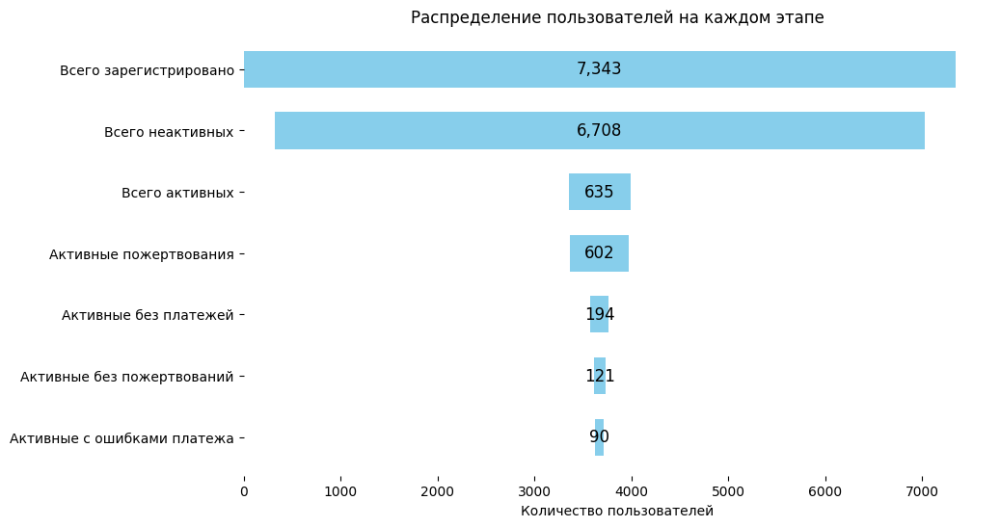

In [76]:
# Визуализируем количество пользователей на каждом этапе
labels = [
    'Всего зарегистрировано',
    'Всего неактивных',
    'Всего активных',
    'Активные пожертвования',
    'Активные без платежей',
    'Активные без пожертвований',
    'Активные с ошибками платежа'
]
values = [
    historical_donors['customer_mindbox_id'].nunique(),
    inactive_users['customer_mindbox_id'].nunique(),
    all_active_users['customer_mindbox_id'].nunique(),
    active_donations['customer_mindbox_id'].nunique(),
    all_active_users_no_payment['customer_mindbox_id'].nunique(),
    active_no_donations['customer_mindbox_id'].nunique(),
    active_failed_payment['customer_mindbox_id'].nunique()
]

plot_funnel_chart(labels, values)

<span style="color:blue; font-size:15px">Неактивные исторические пользователи в 2024 году</span>

In [77]:
# Добавим столбец 'donation_attempt' в inactive_users
inactive_users['donation_attempt'] = 0

# Посмотрим на средние значения наших признаков по тем, кто не пытался отправить благотворительный взнос в 2024 году
continuous_cols = []
discrete_cols = []
binary_cols = ['customer_is_recurrent', 'customer_is_volunteer', 'customer_email_is_invalid', 'customer_is_subscribed',
              'customer_sms_is_subscribed',	'customer_email_is_subscribed',	'customer_viber_is_subscribed',
               'customer_mobile_push_is_subscribed', 'customer_web_push_is_subscribed']
object_cols = ['customer_gender', 'customer_area_id', 'customer_area_name',	'customer_area_time_zone', 'customer_time_zone_source']

# Вызываем функцию для подсчета средних значений в выбранных столбцах
inactive_users_means = count_means(continuous_cols, discrete_cols, binary_cols, object_cols, inactive_users, 'donation_attempt')

# Посчитаем те же метрики для всех активных пользователей
# Добавим столбец 'donation_attempt' в all_active_users
all_active_users['donation_attempt'] = 1
all_active_users_means = count_means(continuous_cols, discrete_cols, binary_cols, object_cols, all_active_users, 'donation_attempt')

# Добавим их к inactive_users_means
inactive_users_means = pd.concat([inactive_users_means, all_active_users_means], axis=1)
inactive_users_means.columns = ['no_donation_attempt', 'donation_attempt']
inactive_users_means

,no_donation_attempt,donation_attempt
donation_attempt,0,1
customer_is_recurrent,0.47,0.38
customer_is_volunteer,<NA>,<NA>
customer_email_is_invalid,0.07,0.01
customer_is_subscribed,0.25,1.0
customer_sms_is_subscribed,0.77,1.0
customer_email_is_subscribed,0.9,0.98
customer_viber_is_subscribed,0.25,1.0
customer_mobile_push_is_subscribed,0.25,1.0
customer_web_push_is_subscribed,0.62,1.0


Визуализируем данные по неактивным, не делающим благотворительные взносы пользователям.

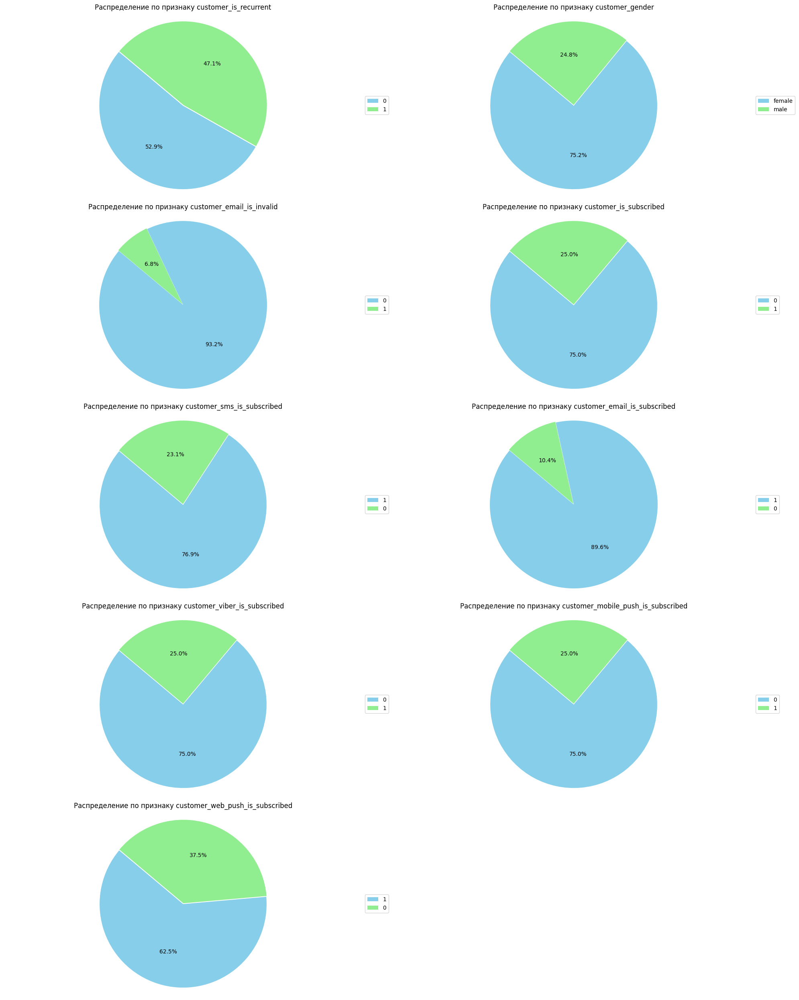

In [78]:
# Выбираем нужные столбцы для круговых диаграмм
columns_to_plot = ['customer_is_recurrent',	 'customer_gender',	'customer_email_is_invalid', 'customer_is_subscribed',
                   'customer_sms_is_subscribed', 'customer_email_is_subscribed', 'customer_viber_is_subscribed',
                   'customer_mobile_push_is_subscribed', 'customer_web_push_is_subscribed']
viz_params_for_vis_function_pie(columns_to_plot, inactive_users)

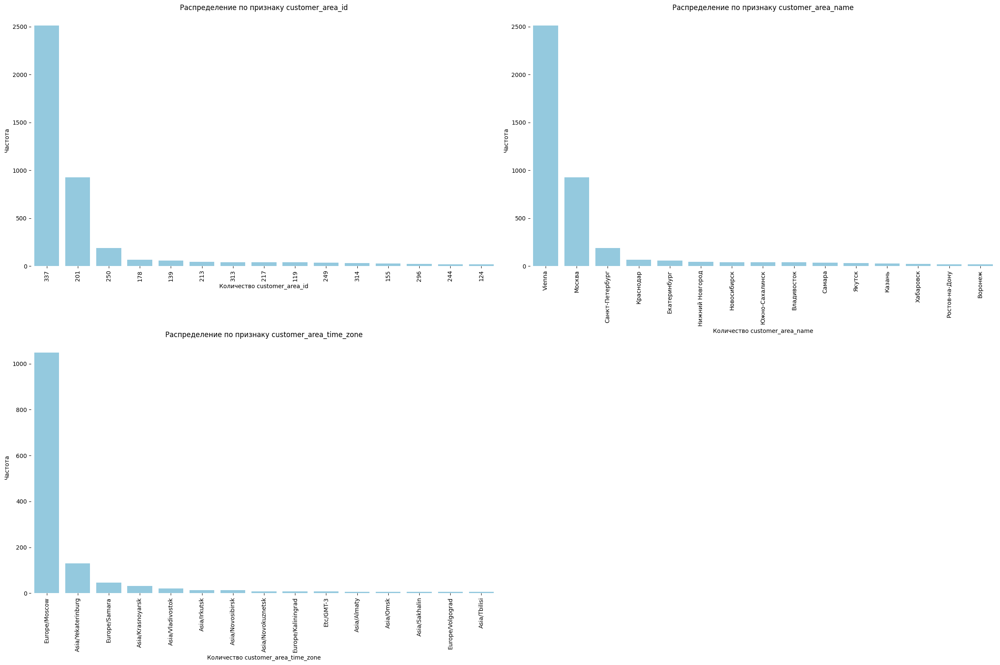

In [79]:
# Выбираем нужные столбцы для столбчатых диаграмм
columns_to_plot = ['customer_area_id', 'customer_area_name', 'customer_area_time_zone']
viz_params_for_vis_function(columns_to_plot, inactive_users)

Итак, среди неактивных исторических пользователей в среднем:
- рекуррентов 47%;
- волонтеры не попали в этот срез данных;
- email невалиден у 7%;
- подписка есть у 25%;
- подписались после получения sms - 77%, email - 90%, сообщения в Viber и push-уведомления на мобильный телефон - 25%, webpush-уведомление - 62%;
- большинство подписчиков - женщины (75.2%);
- географически пребладает Вена, возможно это связано с тем, что благотворителям из Европы стало сложнее осуществлять переводы в связи с санкциями;
- время Московское.

Построим распределение коммуникаций для неактивных пользователей.

In [80]:
# Подсчитаем долю неактивных исторических пользователей на каждом этапе
labels = [
    'Всего неактивных',
    'Рекуррент',
    'Подписка по SMS',
    'Подписка по Email',
    'Подписка по Viber',
    'Подписка по Mobile Push',
    'Подписка по Web Push'
]
values = [
    inactive_users['customer_mindbox_id'].nunique(),
    inactive_users['customer_is_recurrent'].sum(),
    inactive_users['customer_sms_is_subscribed'].sum(),
    inactive_users['customer_email_is_subscribed'].sum(),
    inactive_users['customer_viber_is_subscribed'].sum(),
    inactive_users['customer_mobile_push_is_subscribed'].sum(),
    inactive_users['customer_web_push_is_subscribed'].sum()
]

# Создаем DataFrame для вывода таблицы
data_dict = {
    'channel': labels,
    'inactive': values
}

result_inactive = pd.DataFrame(data_dict)

# Вычисляем долю неактивных пользователей
total_inactive_users = result_inactive['inactive'][0]  # Всего неактивных пользователей
result_inactive['share_by_inactive'] = (result_inactive['inactive'] / total_inactive_users * 100).round(2).astype(str) + '%'

result_inactive 

,channel,inactive,share_by_inactive
0,Всего неактивных,6708,100.0%
1,Рекуррент,89,1.33%
2,Подписка по SMS,20,0.3%
3,Подписка по Email,5956,88.79%
4,Подписка по Viber,2,0.03%
5,Подписка по Mobile Push,2,0.03%
6,Подписка по Web Push,10,0.15%


Мы видим, что большая часть неактивных благотворителей была привлечена по Email. У 89 человек был настроен автоплатеж, который, вероятно, был отменен. Посмотрим на данные этих людей поближе.

In [81]:
inactive_recurrents = inactive_users.query('customer_is_recurrent == 1')

In [82]:
# Посмотрим на средние значения наших признаков по тем, кто не пытался отправить благотворительный взнос в 2024 году
continuous_cols = []
discrete_cols = []
binary_cols = ['customer_is_recurrent', 'customer_email_is_invalid', 'customer_is_subscribed',
              'customer_sms_is_subscribed',	'customer_email_is_subscribed',	'customer_viber_is_subscribed',
               'customer_mobile_push_is_subscribed', 'customer_web_push_is_subscribed']
object_cols = ['customer_gender', 'customer_area_id', 'customer_area_name',	'customer_area_time_zone', 'customer_time_zone_source']

# Вызываем функцию для подсчета средних значений в выбранных столбцах
inactive_users_means = count_means(continuous_cols, discrete_cols, binary_cols, object_cols, inactive_recurrents, 'donation_attempt')

inactive_users_means.columns = ['no_donation_attempt']
inactive_users_means

,no_donation_attempt
donation_attempt,0
customer_is_recurrent,1.0
customer_email_is_invalid,0.03
customer_is_subscribed,<NA>
customer_sms_is_subscribed,<NA>
customer_email_is_subscribed,1.0
customer_viber_is_subscribed,<NA>
customer_mobile_push_is_subscribed,<NA>
customer_web_push_is_subscribed,<NA>
customer_gender,female


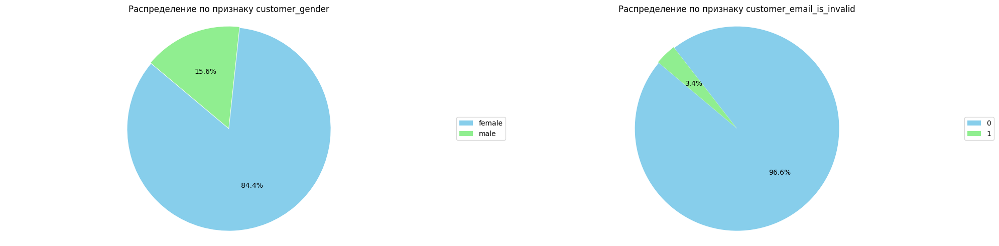

In [83]:
# Выбираем нужные столбцы для круговых диаграмм
columns_to_plot = ['customer_gender', 'customer_email_is_invalid']
viz_params_for_vis_function_pie(columns_to_plot, inactive_recurrents)

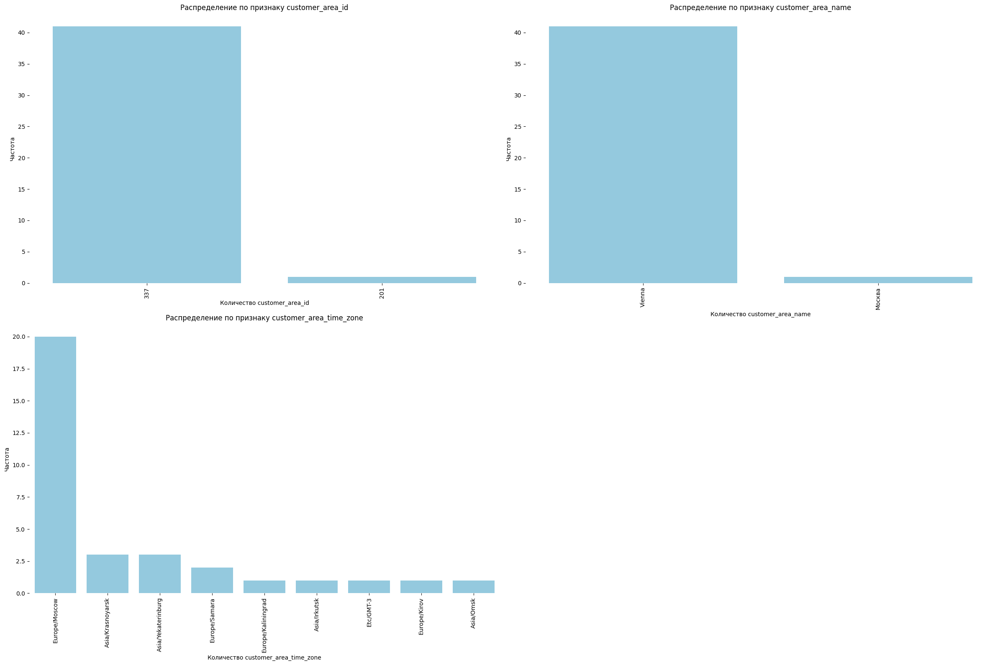

In [84]:
# Выбираем нужные столбцы для столбчатых диаграмм
columns_to_plot = ['customer_area_id', 'customer_area_name', 'customer_area_time_zone']
viz_params_for_vis_function(columns_to_plot, inactive_recurrents)

Абсолютно все рекурренты были привлечены по email, 84.4% из них - женщины, большинство проживает в Вене. Посмотрим на их локацию поближе.

In [85]:
inactive_recurrents['customer_area_id'].value_counts()

customer_area_id
337    41
201     1
Name: count, dtype: int64

41 пользователй из вены и всего 1 из Москвы. Посмотрим на дату их регистрации и на дату регистрации пользователя с автоплатежом из Москвы.

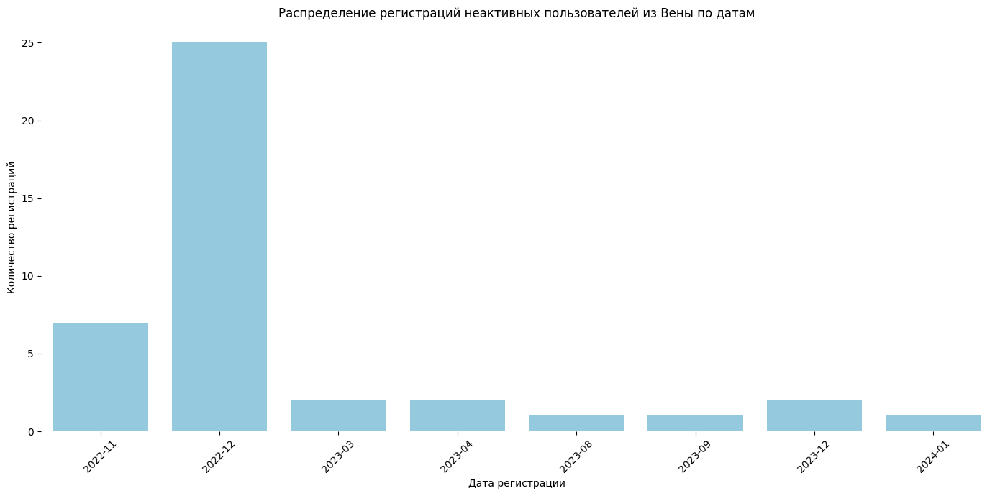

In [86]:
# Выбираем даты регистраций неактивных пользователей из Вены
inactive_recurrents_337 = pd.DataFrame(inactive_recurrents.query('customer_area_id == "337"')['customer_registration_date'])

inactive_recurrents_337['customer_registration_date'] = pd.to_datetime(inactive_recurrents_337['customer_registration_date'])
# Преобразовываем даты в период (месяц и год)
inactive_recurrents_337['registration_month'] = inactive_recurrents_337['customer_registration_date'].dt.to_period('M')
inactive_recurrents_337 = inactive_recurrents_337.sort_values(by='registration_month')

# Определим функции для визуализации распределения данных с помощью столчатой диаграммы
def visualize_registration_dates(data, x, title):
    plt.figure(figsize=(14, 7))
    ax = sns.countplot(x= x, data=data, color='skyblue')

    plt.xlabel('Дата регистрации')
    plt.ylabel('Количество регистраций')
    plt.title(title)
    plt.xticks(rotation=45)

    # Убираем рамки
    for spine in ['left', 'right', 'bottom', 'top']:
        ax.spines[spine].set_visible(False)

    plt.tight_layout()
    plt.show()

visualize_registration_dates(inactive_recurrents_337, 'registration_month',
                             title='Распределение регистраций неактивных пользователей из Вены по датам')

Большинство таких пользователей было привлечено в конце 2022 года. Уже тогда были сложности с переводами денежных средств из-за рубежа, возможно, причина их неактивности именно в невозможности переводить средства в благотворительный фонд.

In [87]:
# Посмотрим на пользователя из Москвы
inactive_recurrents.query('customer_area_id == "201"')

,customer_is_recurrent,customer_is_volunteer,customer_gender,customer_area_id,customer_area_name,customer_area_time_zone,customer_time_zone_source,customer_mindbox_id,customer_email_is_invalid,customer_registration_datetime,customer_is_subscribed,customer_sms_is_subscribed,customer_email_is_subscribed,customer_viber_is_subscribed,customer_mobile_push_is_subscribed,customer_web_push_is_subscribed,customer_registration_date,customer_registration_time,donation_attempt
3406,1,<NA>,female,201,Москва,Europe/Moscow,Определили в трекере,20109,0,2024-02-12 11:46:00,<NA>,<NA>,1,<NA>,<NA>,<NA>,2024-02-12,15,0


Пользовательница зарегистрировалась в 12 февраля 2024 года. Возможно, ее еще нельзя отнести к неактивным.

Проверим, сколько в целом пользователей отреагировало на новогоднюю акцию, чтобы понять мог ли пик регистраций в декабре 2022 года быть связан с ней.

<span style="color:blue; font-size:15px">Новогодняя акция</span>

In [88]:
# Посчитаем, сколько всего у нас в датасете orders участников новогодней акции
print('Всего участников акции:', orders['order_is_newyear_action'].sum())
# Посчитаем, сколько из них исторические пользователи
print('Исторические пользователи:', historical_donors_orders['order_is_newyear_action'].sum())
# Посчитаем, сколько из них новых
print('Новые пользователи:', new_donors_orders['order_is_newyear_action'].sum())

Всего участников акции: 1881
Исторические пользователи: 444
Новые пользователи: 1437


In [89]:
# Посчитаем, сколько участников сделало взносы после таких новогодних акций
print('Количество взносов от исторических пользователей после новогодней акции:',
      historical_donors_orders.query('order_is_paid == "paid"')['order_is_newyear_action'].sum())
print('Количество взносов от новых пользователей после новогодней акции:',
      new_donors_orders.query('order_is_paid == "paid"')['order_is_newyear_action'].sum())
print()

# Посчитаем процент от общего числа
print('Процент исторических пользователей, учавствовавших в акции и сделавших взнос:',
      round(historical_donors_orders.query('order_is_paid == "paid"')['order_is_newyear_action'].sum()/\
     historical_donors_orders['order_is_newyear_action'].sum()*100, 1),'%')
print('Процент новых пользователей, учавствовавших в акции и сделавших взнос:',
     round(new_donors_orders.query('order_is_paid == "paid"')['order_is_newyear_action'].sum()/\
     new_donors_orders['order_is_newyear_action'].sum()*100, 1),'%')
print()

# Посчитаем сумму взносов
print('Сумма взносов от исторических пользователей, учавствовавших в акции:',
      round(historical_donors_orders.query('order_is_paid == "paid" & order_is_newyear_action == 1')['order_total_price'].sum()))
print('Сумма взносов от новых пользователей, учавствовавших в акции:',
     round(new_donors_orders.query('order_is_paid == "paid" & order_is_newyear_action == 1')['order_total_price'].sum()))

Количество взносов от исторических пользователей после новогодней акции: 292
Количество взносов от новых пользователей после новогодней акции: 910

Процент исторических пользователей, учавствовавших в акции и сделавших взнос: 65.8 %
Процент новых пользователей, учавствовавших в акции и сделавших взнос: 63.3 %

Сумма взносов от исторических пользователей, учавствовавших в акции: 187296
Сумма взносов от новых пользователей, учавствовавших в акции: 542270


In [90]:
# Выведем результат в виде таблицы
data = {
    'new_year_action': ['Количество пользователей', 'Количество взносов', 'Процент пользователей', 'Сумма взносов'],
    'historical_users': [444, 292, '65.8%', 187296],
    'new_users': [1437, 910, '63.3%', 542270]
}

# Создаем DataFrame
data_results = pd.DataFrame(data)

data_results

,new_year_action,historical_users,new_users
0,Количество пользователей,444,1437
1,Количество взносов,292,910
2,Процент пользователей,65.8%,63.3%
3,Сумма взносов,187296,542270


Итак, новогодние акции привлекают большее количество новых пользователей, чем исторических. Новые пользователи пожертовавали больше денег.  Но среди исторических процент перечисляющих деньги немного выше, чем среди новых.

<span style="color:blue; font-size:15px">Активные, но не делающие пожертвования исторические пользователи</span>

Сюда я отнесу тех, кто оформил заказ, но не оплатил его или оплата не прошла.

In [91]:
# Добавим столбец 'is_payment' в all_active_users_no_payment
all_active_users_no_payment['is_payment'] = 0

# Посмотрим на средние значения наших признаков по тем, кто оформил заказ, но не оплатил или оплата не прошла в 2024 году
continuous_cols = []
discrete_cols = []
binary_cols = ['customer_is_recurrent', 'customer_is_volunteer', 'customer_email_is_invalid', 'customer_is_subscribed',
              'customer_sms_is_subscribed',	'customer_email_is_subscribed',	'customer_viber_is_subscribed',
               'customer_mobile_push_is_subscribed', 'customer_web_push_is_subscribed']
object_cols = ['customer_gender', 'customer_area_id', 'customer_area_name',	'customer_area_time_zone', 'customer_time_zone_source']

# Вызываем функцию для подсчета средних значений в выбранных столбцах
all_active_users_no_payment_means = count_means(continuous_cols, discrete_cols, binary_cols, object_cols, all_active_users_no_payment,
                                                'is_payment')

# Посчитаем те же метрики для оплативших заказ пользователей
# Добавим столбец 'is_payment' в active_donations
active_donations['is_payment'] = 1
active_donations_means = count_means(continuous_cols, discrete_cols, binary_cols, object_cols, active_donations, 'is_payment')

# Добавим их к all_active_users_no_payment_means
all_active_users_no_payment_means = pd.concat([all_active_users_no_payment_means, active_donations_means], axis=1)
all_active_users_no_payment_means.columns = ['is_payment', 'is_payment']
all_active_users_no_payment_means

,is_payment,is_payment
is_payment,0,1
customer_is_recurrent,0.37,0.39
customer_is_volunteer,<NA>,<NA>
customer_email_is_invalid,0.01,0.01
customer_is_subscribed,1.0,1.0
customer_sms_is_subscribed,1.0,1.0
customer_email_is_subscribed,0.97,0.98
customer_viber_is_subscribed,1.0,1.0
customer_mobile_push_is_subscribed,1.0,1.0
customer_web_push_is_subscribed,1.0,1.0


Основная масса активных, но не платящих пользователей  женщины из-за рубежа, 97% пришло по email, рекуррентов - 37%.

In [92]:
# Проверим, из какого региона было больше всего ошибок при платежах
active_failed_payment['customer_area_name'].value_counts()

customer_area_name
Vienna                 36
Москва                  5
Екатеринбург            2
Краснодар               2
Санкт-Петербург         1
Владивосток             1
Хабаровск               1
Челябинская область     1
Оренбург                1
Рязань                  1
Апрелевка               1
Самара                  1
Коломна                 1
Ставрополь              1
Name: count, dtype: int64

Больше всего ошибок при платежах было из Вены, что еще раз доказывает, что одной из причин оттока исторических пользователей является невозможность перевести деньги на счет фонда в России.

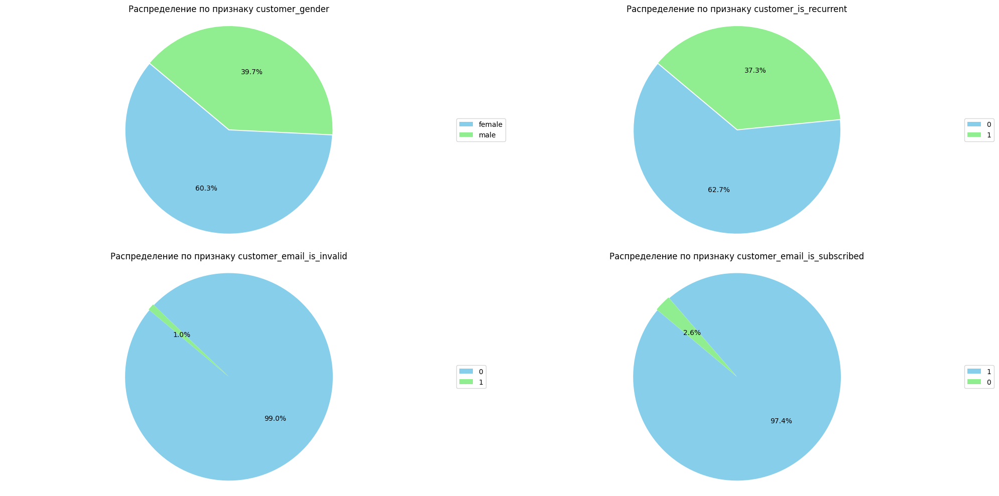

In [93]:
# Визуализируем данные. Выбираем нужные столбцы для круговых диаграмм
columns_to_plot = ['customer_gender', 'customer_is_recurrent', 'customer_email_is_invalid', 'customer_email_is_subscribed']
viz_params_for_vis_function_pie(columns_to_plot, all_active_users_no_payment)

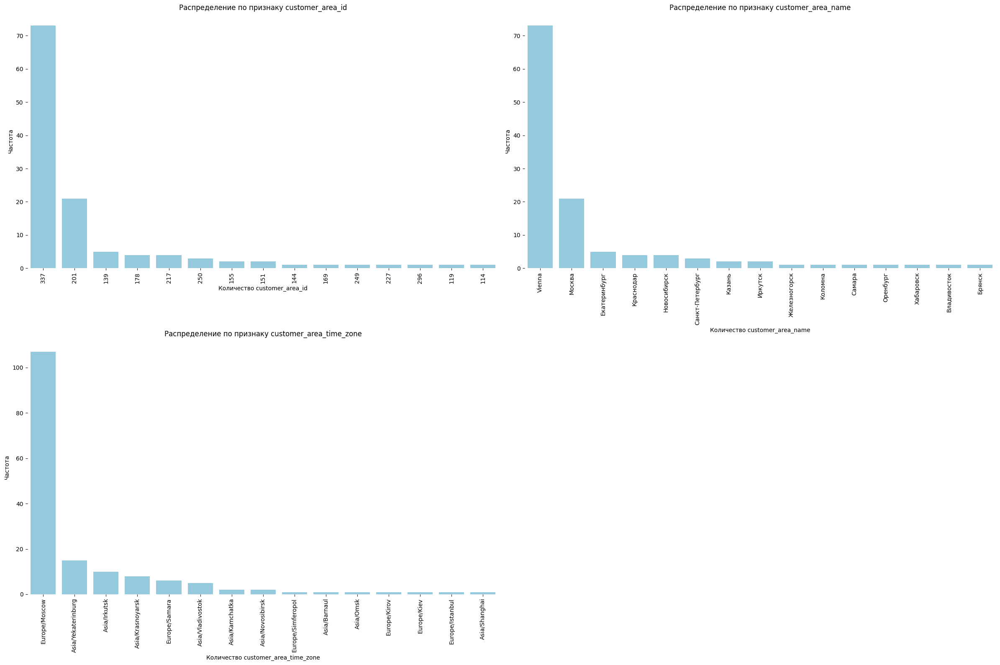

In [94]:
# Выбираем нужные столбцы для столбчатых диаграмм
columns_to_plot = ['customer_area_id', 'customer_area_name', 'customer_area_time_zone']
viz_params_for_vis_function(columns_to_plot, all_active_users_no_payment)

Среди активных, но неплатящих пользователей опять же больше женщин, но соотношение все-таки меняется, мужчин стало больше - 37.9%. Если посмотреть на него с психологической точки зрения, то я могла бы предположить, что женщины более склонны действовать на эмоциях, среагировали на ситуацию, тут же перечислили деньги. Что касается мужчин - то тут больше, возможно, играет роль рациональность. И если решение о помощи было принято на эмоциях, но оплата не была отправлена сразу,  логично было бы каким-то образом фонду напомнить о себе.

In [95]:
# Подсчитаем долю активных исторических пользователей, по каким-то причинам неоплативших заказ, пользователей на каждом этапе
labels = [
    'Неоплатившие',
    'Рекуррент',
    'Подписка по SMS',
    'Подписка по Email',
    'Подписка по Viber',
    'Подписка по Mobile Push',
    'Подписка по Web  Push'
]
values = [
    all_active_users_no_payment['customer_mindbox_id'].nunique(),
    all_active_users_no_payment['customer_is_recurrent'].sum(),
    all_active_users_no_payment['customer_sms_is_subscribed'].sum(),
    all_active_users_no_payment['customer_email_is_subscribed'].sum(),
    all_active_users_no_payment['customer_viber_is_subscribed'].sum(),
    all_active_users_no_payment['customer_mobile_push_is_subscribed'].sum(),
    all_active_users_no_payment['customer_web_push_is_subscribed'].sum()
]

# Создаем DataFrame для вывода таблицы
data_dict = {
    'channel': labels,
    'without_payment': values
}

result_active_notpaid = pd.DataFrame(data_dict)

# Вычисляем долю неактивных пользователей
total_active_notpaid = result_active_notpaid['without_payment'][0]  # Всего неоплативших пользователей
result_active_notpaid['share_by_without_payment'] = ((result_active_notpaid['without_payment'] / total_active_notpaid * 100)
                                                     .round(2).astype(str) + '%')

result_active_notpaid

,channel,without_payment,share_by_without_payment
0,Неоплатившие,194,100.0%
1,Рекуррент,72,37.11%
2,Подписка по SMS,4,2.06%
3,Подписка по Email,189,97.42%
4,Подписка по Viber,1,0.52%
5,Подписка по Mobile Push,1,0.52%
6,Подписка по Web Push,7,3.61%


37.3% из сделавших заказ, но неоплативших его - рекурренты, 60.3% из них - женщины, почти все подписались после контакта по email. География более широкая, нежели, чем у неактивных пользователей, лидируют Вена, Москва и Екатеринбург. Посмотрим на рекуррентов поближе.

In [96]:
no_payment_recurrents = all_active_users_no_payment.query('customer_is_recurrent == 1')

In [97]:
# Посмотрим на средние значения наших признаков по тем рекуррентам, кто оформил заказ, но не оплатил его в 2024 году
continuous_cols = []
discrete_cols = []
binary_cols = ['customer_is_recurrent', 'customer_email_is_invalid', 'customer_is_subscribed',
              'customer_sms_is_subscribed',	'customer_email_is_subscribed',	'customer_viber_is_subscribed',
               'customer_mobile_push_is_subscribed', 'customer_web_push_is_subscribed']
object_cols = ['customer_gender', 'customer_area_id', 'customer_area_name',	'customer_area_time_zone', 'customer_time_zone_source']

# Вызываем функцию для подсчета средних значений в выбранных столбцах
no_payment_recurrents_means = count_means(continuous_cols, discrete_cols, binary_cols, object_cols, no_payment_recurrents, 'is_payment')

no_payment_recurrents_means.columns = ['is_payment']
no_payment_recurrents_means

,is_payment
is_payment,0
customer_is_recurrent,1.0
customer_email_is_invalid,0.01
customer_is_subscribed,1.0
customer_sms_is_subscribed,1.0
customer_email_is_subscribed,0.97
customer_viber_is_subscribed,1.0
customer_mobile_push_is_subscribed,1.0
customer_web_push_is_subscribed,1.0
customer_gender,female


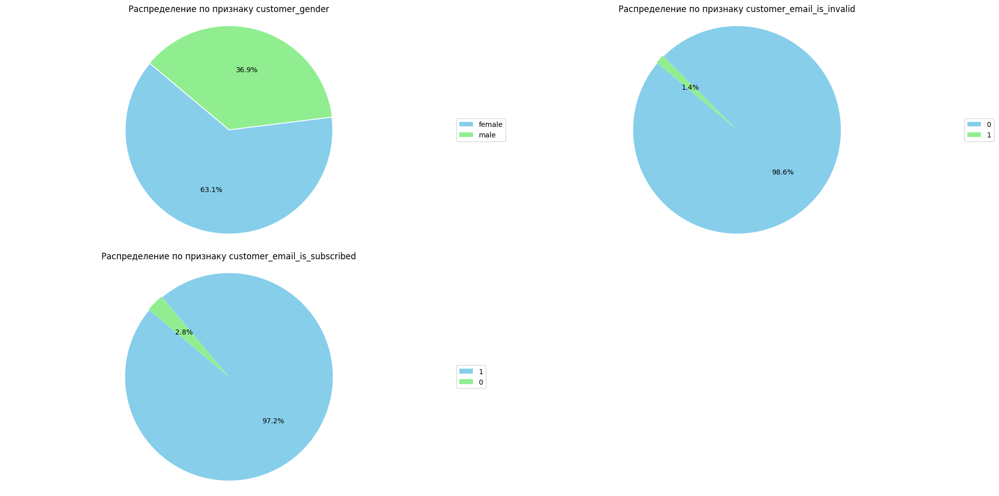

In [98]:
# Выбираем нужные столбцы для круговых диаграмм
columns_to_plot = ['customer_gender', 'customer_email_is_invalid', 'customer_email_is_subscribed']
viz_params_for_vis_function_pie(columns_to_plot, no_payment_recurrents)

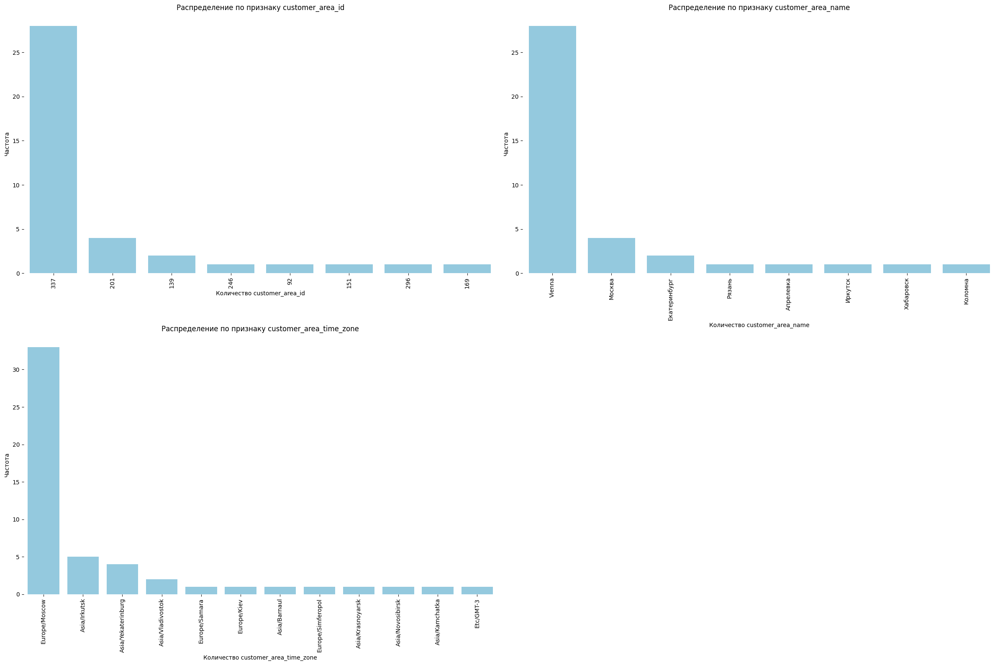

In [99]:
# Выбираем нужные столбцы для столбчатых диаграмм
columns_to_plot = ['customer_area_id', 'customer_area_name', 'customer_area_time_zone']
viz_params_for_vis_function(columns_to_plot, no_payment_recurrents)

Снова большинство благотворителей - женщины из Вены.

In [100]:
no_payment_recurrents['customer_area_name'].value_counts()

customer_area_name
Vienna          28
Москва           4
Екатеринбург     2
Рязань           1
Апрелевка        1
Иркутск          1
Хабаровск        1
Коломна          1
Name: count, dtype: int64

И снова большинство платежей не было оплачено из Вены.

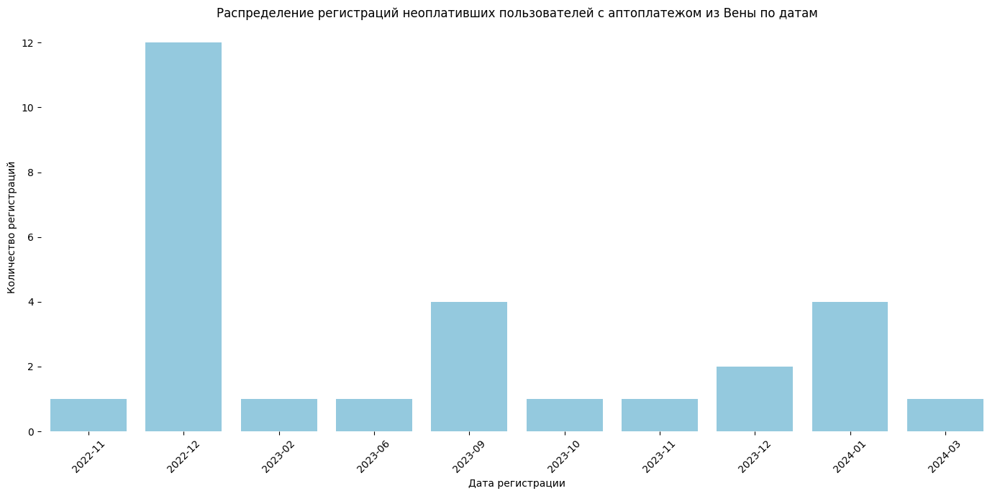

In [101]:
# Возьмем даты регистраций неоплативших заказ пользователей из Вены
no_payment_recurrents_337 = pd.DataFrame(no_payment_recurrents.query('customer_area_id == "337"')['customer_registration_date'])

no_payment_recurrents_337['customer_registration_date'] = pd.to_datetime(no_payment_recurrents_337['customer_registration_date'])

# Преобразовываем даты в период (месяц и год)
no_payment_recurrents_337['registration_month'] = no_payment_recurrents_337['customer_registration_date'].dt.to_period('M')
no_payment_recurrents_337 = no_payment_recurrents_337.sort_values(by='registration_month')

# Визуализируем данные
visualize_registration_dates(no_payment_recurrents_337, 'registration_month',
                             title='Распределение регистраций неоплативших пользователей с аптоплатежом из Вены по датам')

И снова пик регистрации - декабрь 2022 года, а также сентябрь 2023 и январь 2024.  Думаю, что в случае с пользователями не из России причина неактивности понятна - невозможность перевести средства в связи с санкциями. Почему пики неоплат в сентябре 2023 года и в январе 2024 года - пока непонятно. Возможно, было привлечено много новых пользователей, но не все перечислили средства.

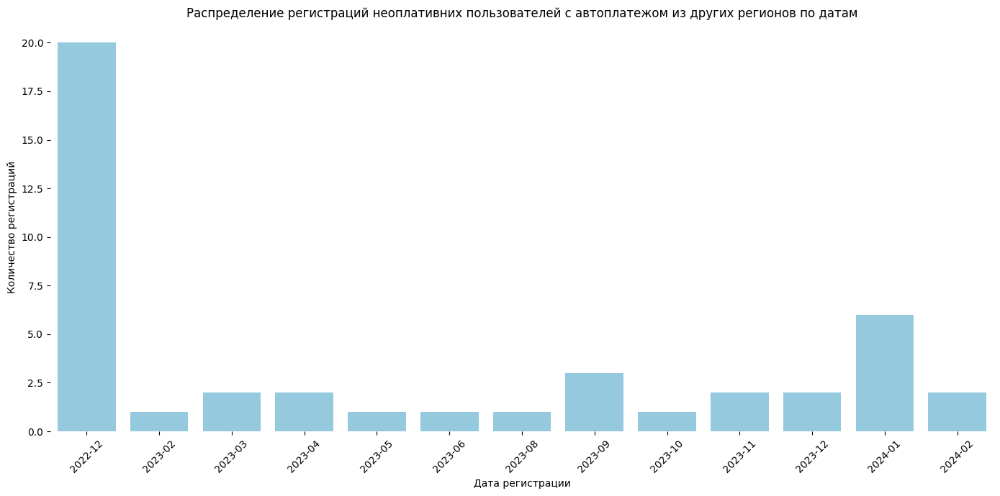

In [102]:
# Возьмем даты регистраций неоплативших заказ пользователей из других регионов
no_payment_recurrents_others = pd.DataFrame(no_payment_recurrents.query('customer_area_id != "337"')['customer_registration_date'])

no_payment_recurrents_others['customer_registration_date'] = pd.to_datetime(no_payment_recurrents_others['customer_registration_date'])

# Преобразовываем даты в период (месяц и год)
no_payment_recurrents_others['registration_month'] = no_payment_recurrents_others['customer_registration_date'].dt.to_period('M')
no_payment_recurrents_others = no_payment_recurrents_others.sort_values(by='registration_month')

# Визуализируем данные
visualize_registration_dates(no_payment_recurrents_others, 'registration_month',
                             title='Распределение регистраций неоплативних пользователей с автоплатежом из других регионов по датам')

Видим тем же пики, что и с Веной, вероятно, это был период каких-либо акций, например, новогодних. Посмотрим, совпадают ли id пользователей, оформивших автоплатеж с новогодней акцией.

In [103]:
historical_orders_2024['order_is_newyear_action'].value_counts()

order_is_newyear_action
1    24
Name: count, dtype: Int64

In [104]:
# Фильтруем данные no_payment_recurrents по условию customer_is_recurrent == 1
recurrent_no_payment = no_payment_recurrents.query('customer_is_recurrent == 1')

# Фильтрация данных historical_orders_2024 по условию order_is_newyear_action == 1
new_year_action_ids = historical_orders_2024[historical_orders_2024['order_is_newyear_action'] == 1]['order_customer_mindbox_id']

# Применение фильтрации для получения данных с учетом обоих условий
result = recurrent_no_payment[recurrent_no_payment['customer_mindbox_id'].isin(new_year_action_ids)]
result

,customer_is_recurrent,customer_is_volunteer,customer_gender,customer_area_id,customer_area_name,customer_area_time_zone,customer_time_zone_source,customer_mindbox_id,customer_email_is_invalid,customer_registration_datetime,customer_is_subscribed,customer_sms_is_subscribed,customer_email_is_subscribed,customer_viber_is_subscribed,customer_mobile_push_is_subscribed,customer_web_push_is_subscribed,customer_registration_date,customer_registration_time,is_payment
117,1,<NA>,female,NaN,NaN,Asia/Krasnoyarsk,Определили в трекере,26957,0,2023-11-23 00:55:00,<NA>,<NA>,1,<NA>,<NA>,<NA>,2023-11-23,4,0
193,1,<NA>,male,NaN,NaN,Europe/Moscow,Определили в трекере,26709,0,2023-09-10 10:33:00,<NA>,<NA>,1,<NA>,<NA>,<NA>,2023-09-10,14,0


И оформивших автоплатеж после новогодней акции в 2024 году всего двое из исторических пользователей, возможно этот рост обусловлен личными причинами людей, например, совершать добрые поступки в конце года, получив какой-нибудь годовой бонус.

In [105]:
# Посмотрим, сколько было неоплаченных заказов в сентябре 2023 года
(orders
 .query('order_first_action_date >= "2023-09-01" & order_first_action_date <= "2023-09-30" & order_is_paid =="notpaid"')
 ['order_customer_mindbox_id'].nunique())

716

In [106]:
# Посмотрим, какие кампании у нас были в сентябре 2023 года
channels.query('action_date >= "2023-09-01" & action_date <= "2023-09-30"')['utm_campaign'].value_counts().head(15)

utm_campaign
darya-semenova               306
1029149673                   177
1028484093                   173
nikita-kurakin               144
kristina-shabetnik           118
1028540267                    95
news-subscription             63
1028484116                    56
1029194815                    44
thanks-for-donation           29
invitation-recurrent          21
1029089517                    21
sofya-panturova               20
BroshennayaKorzinaBoevaya     19
1029089158                    18
Name: count, dtype: int64

Я не вижу тут каких-то специфических кампаний по привлечению пользователей. Возможно,  сентябрьский всплеск активности, в том числе по неоплатам, связан с возвращением людей к привычному ритму жизни после летних отпусков. Акция "BroshennayaKorzinaBoevaya", если я правильно понимаю ее значение, это как раз то самое напоминание о забытом и неоплаченном в корзине заказе. Хотелось бы понимать, как работает эта система рассылок, потому что из 716 неоплаченных заказов письмо с напоминанием было отправлено всего 19 пользователям?

<span style="color:blue; font-size:15px">Активные, делающие пожертвования исторические пользователи</span>

In [107]:
# Посмотрим на средние значения наших признаков по тем, кто оформил заказ, и оплатил его в 2024 году
continuous_cols = []
discrete_cols = []
binary_cols = ['customer_is_recurrent', 'customer_is_volunteer', 'customer_email_is_invalid', 'customer_is_subscribed',
              'customer_sms_is_subscribed',	'customer_email_is_subscribed',	'customer_viber_is_subscribed',
               'customer_mobile_push_is_subscribed', 'customer_web_push_is_subscribed']
object_cols = ['customer_gender', 'customer_area_id', 'customer_area_name',	'customer_area_time_zone', 'customer_time_zone_source']

# Вызываем функцию для подсчета средних значений в выбранных столбцах
active_donations_means = count_means(continuous_cols, discrete_cols, binary_cols, object_cols, active_donations,
                                                'is_payment')
active_donations_means.columns = ['is_payment']
active_donations_means

,is_payment
is_payment,1
customer_is_recurrent,0.39
customer_is_volunteer,<NA>
customer_email_is_invalid,0.01
customer_is_subscribed,1.0
customer_sms_is_subscribed,1.0
customer_email_is_subscribed,0.98
customer_viber_is_subscribed,1.0
customer_mobile_push_is_subscribed,1.0
customer_web_push_is_subscribed,1.0


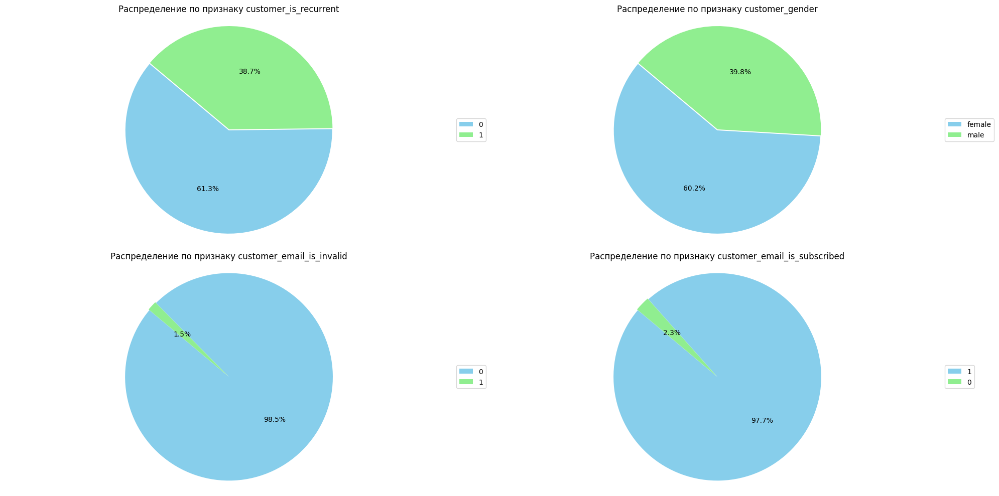

In [108]:
# Выбираем нужные столбцы для круговых диаграмм
columns_to_plot = ['customer_is_recurrent', 'customer_gender', 'customer_email_is_invalid', 'customer_email_is_subscribed']
viz_params_for_vis_function_pie(columns_to_plot, active_donations)

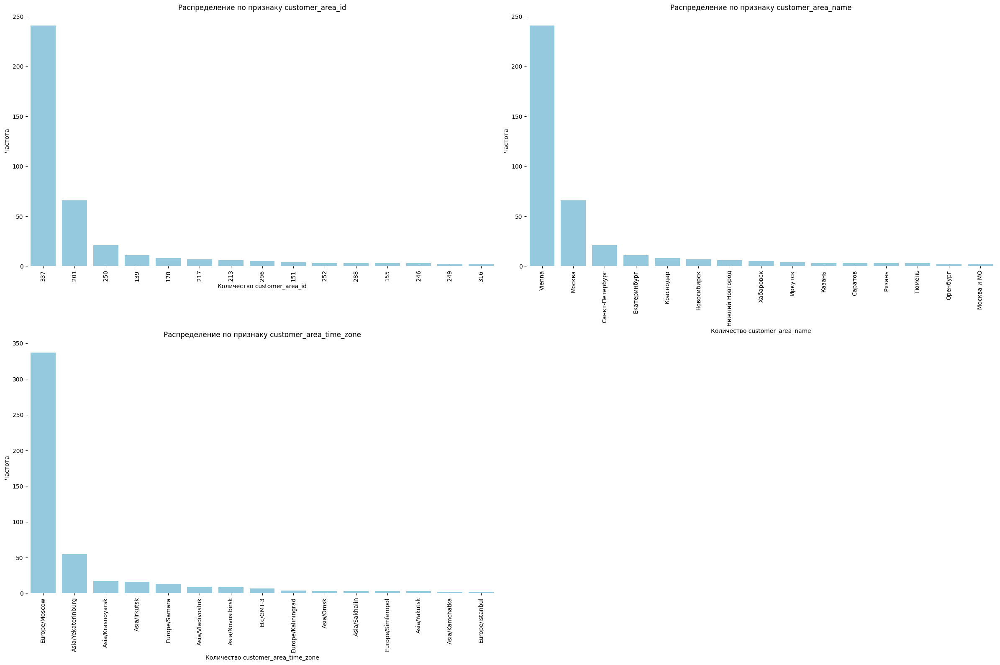

In [109]:
# Выбираем нужные столбцы для столбчатых диаграмм
columns_to_plot = ['customer_area_id', 'customer_area_name', 'customer_area_time_zone']
viz_params_for_vis_function(columns_to_plot, active_donations)

Итак, 60.2% активных, делающих пожертвование пользвоателей у нас женщины, соответственно, 39.8% - мужчины, 38.7% из них - рекурренты, географически преобладает все та же Вена, Москва и Санкт-Петербург.

In [110]:
# Подсчитаем количество исторических пользователей, оплативших заказ в 2024 году, на каждом этапе
labels = [
    'Всего исторических',
    'Всего активно-платящих',
    'Рекуррент',
    'Подписка по SMS',
    'Подписка по Email',
    'Подписка по Viber',
    'Подписка по Mobile Push',
    'Подписка по Web  Push'
]
values = [
    historical_donors['customer_mindbox_id'].nunique(),
    active_donations['customer_mindbox_id'].nunique(),
    active_donations['customer_is_recurrent'].sum(),
    active_donations['customer_sms_is_subscribed'].sum(),
    active_donations['customer_email_is_subscribed'].sum(),
    active_donations['customer_viber_is_subscribed'].sum(),
    active_donations['customer_mobile_push_is_subscribed'].sum(),
    active_donations['customer_web_push_is_subscribed'].sum()
]
data_dict = {
    'channel': labels,
    'active_payed_2024': values
}

result_active_paid_2024 = pd.DataFrame(data_dict)

# Вычисляем долю активных пользователей, оплативших заказ в 2024 году
total_active_paid_2024 = result_active_paid_2024['active_payed_2024'][0]  # Всего неоплативших пользователей
result_active_paid_2024['share_with_payment_2024'] = ((result_active_paid_2024['active_payed_2024'] / total_active_paid_2024 * 100)
                                                      .round(2).astype(str) + '%')

result_active_paid_2024

,channel,active_payed_2024,share_with_payment_2024
0,Всего исторических,7343,100.0%
1,Всего активно-платящих,602,8.2%
2,Рекуррент,233,3.17%
3,Подписка по SMS,7,0.1%
4,Подписка по Email,588,8.01%
5,Подписка по Viber,1,0.01%
6,Подписка по Mobile Push,1,0.01%
7,Подписка по Web Push,20,0.27%


In [111]:
# Процент вернувшихся в 2024 году исторических пользователей
total_historical_users = historical_donors['customer_mindbox_id'].nunique()
total_registered_active_payed = active_donations['customer_mindbox_id'].nunique()
print('Процент активных исторических пользователей в 2024 году:',
      round(total_registered_active_payed/total_historical_users*100, 1),'%')

Процент активных исторических пользователей в 2024 году: 8.2 %


In [112]:
# Посмотрим, какие кампании могли побудить исторических пользователей вернуться
product_name_historical_2024 = (historical_donors_orders
 .query('order_first_action_date >= "2024-01-01" & order_is_paid == "paid"')['order_product_name']
 .value_counts())

print(product_name_historical_2024.head(10))
print()
print('Количество платежей по кампаниям в 2024 году:', product_name_historical_2024.sum())

order_product_name
Пожертвование (хочу помочь)                                       407
Пожертвование на уставную деятельность БФ «АиФ. Доброе сердце»    199
Кира Моргунова                                                    156
Муххамад Бисултанов                                               122
Александра Шубина                                                  79
Захар Кузьмин                                                      65
Дарья Семенова                                                     60
Глеб Пестов                                                        46
Пожертвование                                                      43
Захар Зверев                                                       34
Name: count, dtype: int64

Количество платежей по кампаниям в 2024 году: 1406


В целом, лидируют неадресные кампании по сбору средств. Посмотрим на тех пользователей, кто делает разовые платежи.

In [113]:
# Посмотрим на средние значения наших признаков по тем, кто сделал разовые платежи в 2024 году
continuous_cols = []
discrete_cols = []
binary_cols = ['customer_is_recurrent', 'customer_email_is_invalid', 'customer_is_subscribed',
              'customer_sms_is_subscribed',	'customer_email_is_subscribed',	'customer_viber_is_subscribed',
               'customer_mobile_push_is_subscribed', 'customer_web_push_is_subscribed']
object_cols = ['customer_gender', 'customer_area_id', 'customer_area_name',	'customer_area_time_zone', 'customer_time_zone_source']

# Вызываем функцию для подсчета средних значений в выбранных столбцах
active_donations_one_time_means = count_means(continuous_cols, discrete_cols, binary_cols, object_cols,
                                              active_donations.query('customer_is_recurrent != 1'), 'is_payment')

active_donations_recurrent_means = count_means(continuous_cols, discrete_cols, binary_cols, object_cols,
                                              active_donations.query('customer_is_recurrent == 1'), 'is_payment')
active_donations_one_time_means = pd.concat([active_donations_one_time_means, active_donations_recurrent_means], axis=1)
active_donations_one_time_means.columns = ['one_time', 'recurrent']
active_donations_one_time_means

,one_time,recurrent
is_payment,1,1
customer_is_recurrent,0.0,1.0
customer_email_is_invalid,0.01,0.02
customer_is_subscribed,<NA>,1.0
customer_sms_is_subscribed,1.0,1.0
customer_email_is_subscribed,0.98,0.98
customer_viber_is_subscribed,<NA>,1.0
customer_mobile_push_is_subscribed,<NA>,1.0
customer_web_push_is_subscribed,1.0,1.0
customer_gender,female,female


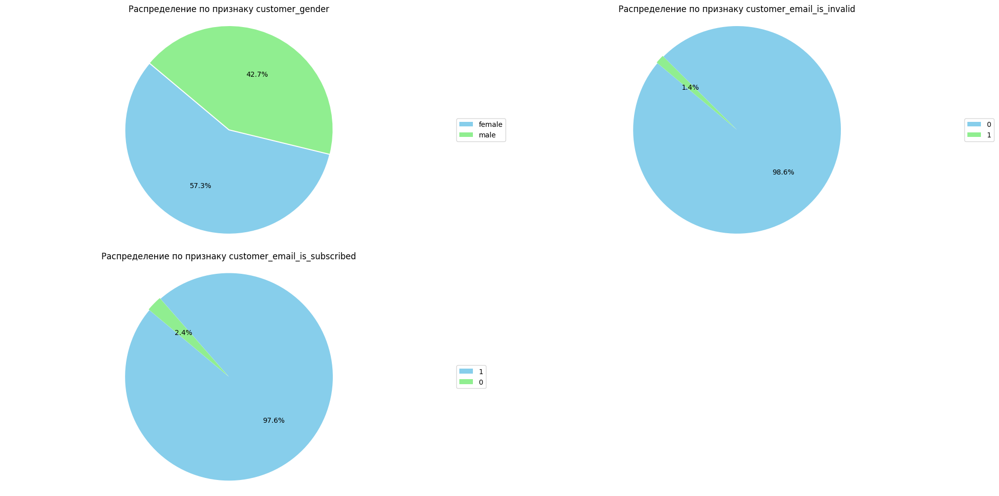

In [114]:
# Выбираем нужные столбцы для круговых диаграмм
columns_to_plot = ['customer_gender', 'customer_email_is_invalid', 'customer_email_is_subscribed']
viz_params_for_vis_function_pie(columns_to_plot, active_donations.query('customer_is_recurrent != 1'))

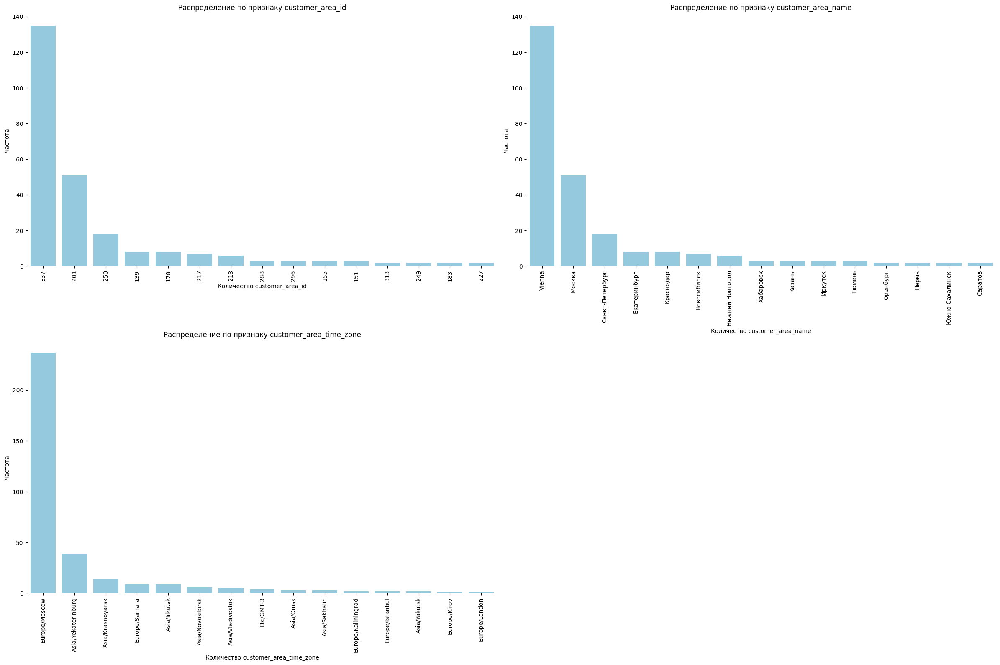

In [115]:
# Выбираем нужные столбцы для столбчатых диаграмм
columns_to_plot = ['customer_area_id', 'customer_area_name', 'customer_area_time_zone']
viz_params_for_vis_function(columns_to_plot, active_donations.query('customer_is_recurrent != 1'))

57.3% женщин, пришедщих по email, преимущественно из Вены, Москвы, Санкт-Петербурга, делают разовые платежи. Посмотрим на рекуррентов.

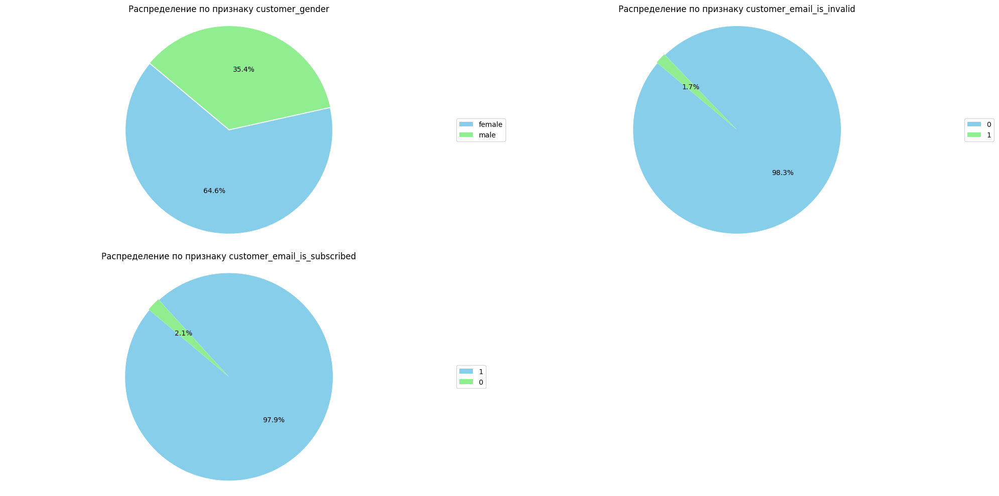

In [116]:
# Выбираем нужные столбцы для круговых диаграмм
columns_to_plot = ['customer_gender', 'customer_email_is_invalid', 'customer_email_is_subscribed']
viz_params_for_vis_function_pie(columns_to_plot, active_donations.query('customer_is_recurrent == 1'))

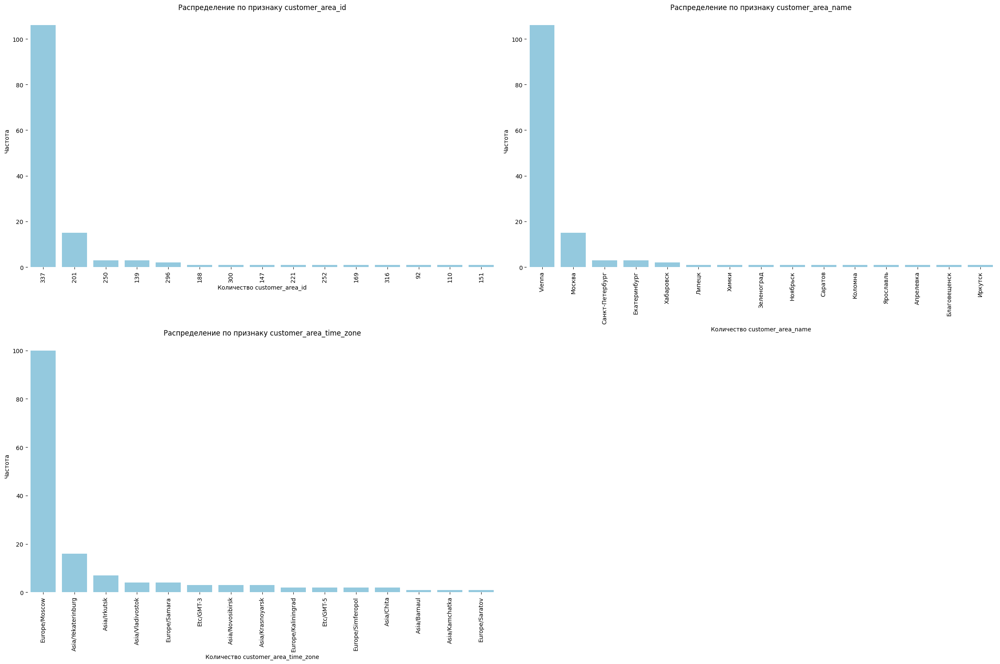

In [117]:
# Выбираем нужные столбцы для столбчатых диаграмм
columns_to_plot = ['customer_area_id', 'customer_area_name', 'customer_area_time_zone']
viz_params_for_vis_function(columns_to_plot, active_donations.query('customer_is_recurrent == 1'))

В целом, примерно такoй же расклад. Я бы еще хотела тут посмотреть, какие сборы велись в пиковые даты, которые мы видели при анализе выше.

In [118]:
product_name_historical_09_22 = (historical_donors_orders
 .query('order_first_action_date >= "2022-09-01" & order_first_action_date <= "2022-09-30" & order_is_paid == "paid"')['order_product_name']
 .value_counts())

print(product_name_historical_09_22.head(10))
print()
print('Количество платежей среди исторических пользователей в сентябре 2022 года:', product_name_historical_09_22.sum())

order_product_name
На уставную деятельность                                          339
Арман Акопян                                                      132
Анастасия Радостева                                                91
Пожертвование (хочу помочь)                                        46
Пожертвование на уставную деятельность БФ «АиФ. Доброе сердце»     34
Егор Цуканов                                                       16
Демид Лебедев                                                      15
Дарья Нечаева                                                      14
Савелий Сунгуров                                                   11
Михаил Родимушкин                                                   7
Name: count, dtype: int64

Количество платежей среди исторических пользователей в сентябре 2022 года: 729


In [119]:
product_name_new_09_22 = (new_donors_orders
 .query('order_first_action_date >= "2022-09-01" & order_first_action_date <= "2022-09-30" & order_is_paid == "paid"')['order_product_name']
 .value_counts())

print(product_name_new_09_22.head(10))
print()
print('Количество платежей среди новых пользователей в сентябре 2022 года:', product_name_new_09_22.sum())

order_product_name
Егор Цуканов                                                      269
Демид Лебедев                                                     111
На уставную деятельность                                          104
Арман Акопян                                                       85
Пожертвование (хочу помочь)                                        77
Анастасия Радостева                                                64
Михаил Родимушкин                                                  58
Пожертвование на уставную деятельность БФ «АиФ. Доброе сердце»     29
Дарья Нечаева                                                      27
Савелий Сунгуров                                                   16
Name: count, dtype: int64

Количество платежей среди новых пользователей в сентябре 2022 года: 861


Некоторые пересечения есть, но в целом исторические и новые пользователи среагировали на отчасти разные кейсы. Новые пользватели делали пожертвавания чаще исторических. Посмотрим на январь 2024 года.

In [120]:
product_name_historical_01_24 = (historical_donors_orders
 .query('order_first_action_date >= "2024-01-01" & order_first_action_date <= "2024-01-31" & order_is_paid == "paid"')['order_product_name']
 .value_counts())

print(product_name_historical_01_24.head(10))
print()
print('Количество платежей среди исторических пользователей в январе 2024 года:', product_name_historical_01_24.sum())

order_product_name
Пожертвование (хочу помочь)                                       169
Муххамад Бисултанов                                               108
Пожертвование на уставную деятельность БФ «АиФ. Доброе сердце»     73
Захар Кузьмин                                                      44
Дарья Семенова                                                     31
Виктория Костина                                                   28
Артём Матвеев                                                      21
Валерия Рябова                                                     19
Пожертвование                                                      17
Пожертвование регулярное                                            5
Name: count, dtype: int64

Количество платежей среди исторических пользователей в январе 2024 года: 531


In [121]:
product_name_new_01_24 = (new_donors_orders
 .query('order_first_action_date >= "2024-01-01" & order_first_action_date <= "2024-01-31" & order_is_paid == "paid"')['order_product_name']
 .value_counts())

print(product_name_new_01_24.head(10))
print()
print('Количество платежей среди новых пользователей в январе 2024 года:', product_name_new_01_24.sum())

order_product_name
Виктория Костина                                                  326
Муххамад Бисултанов                                               220
Пожертвование (хочу помочь)                                       185
Кристина Шабетник                                                 182
Артём Матвеев                                                     142
Дарья Семенова                                                    134
Захар Кузьмин                                                     118
Пожертвование на уставную деятельность БФ «АиФ. Доброе сердце»    101
Ксения Абукова                                                     81
Сергей Голубков                                                    60
Name: count, dtype: int64

Количество платежей среди новых пользователей в январе 2024 года: 1729


И снова, новые и старые пользователи переводили деньги для разных подопечных фонда, и активность новых в январе 2024 года более чем в 3 раза превышает активность исторических.

Посмотрим на динамику платежей по месяцам среди исторических пользователей.

In [122]:
# Определим функцию для визуализации динамики по месяцам среди пользователей
def plot_monthly_order_dynamics(data, date_column):
    # Преобразуем дату в месяц и год
    data['month'] = data[date_column].dt.to_period('M').astype(str)

    # Поcчитаем количество заказов по месяцам для каждого статуса
    monthly_counts = data.groupby(['month', 'order_is_paid']).size().reset_index(name='counts')

    fig, axes = plt.subplots(2, 1, figsize=(12, 12))

    # Построим гистограмму с накоплением
    ax1 = sns.histplot(data=monthly_counts, x='month', weights='counts', hue='order_is_paid', multiple='stack', palette='pastel',
                 shrink=0.8, kde=True, ax=axes[0], legend=True)
    axes[0].set_title('Динамика распределения количества заказов среди пользователей по месяцам')
    axes[0].set_xlabel('Месяц')
    axes[0].set_ylabel('Количество заказов')
    axes[0].tick_params(axis='x',rotation=80)

    # Добавим фиктивные элементы для каждого статуса заказа в легенду
    for status, color in zip(monthly_counts['order_is_paid'].unique(), sns.color_palette('pastel')):
        axes[0].plot([], [], color=color, label=status)
    axes[0].legend(title='Статус заказа')

    # Убираем рамки
    for spine in ['left', 'right', 'bottom', 'top']:
        ax1.spines[spine].set_visible(False)

    # Подсчитаем процентное распределение заказов по месяцам для каждого статуса
    monthly_percent = (monthly_counts
                       .groupby('month')
                       .apply(lambda x: x.set_index('order_is_paid')['counts'] / x['counts'].sum()).reset_index(name='percent'))

    # Определяем цвета для каждой категории
    palette = {
        'paid': 'lightgreen',
        'notpaid': 'lightblue',
        'fail': 'grey'
    }

    # Построим линейные графики для процентного распределения
    ax2 = sns.lineplot(data=monthly_percent, x='month', y='percent', hue='order_is_paid', marker='o', palette=palette, ax=axes[1])
    axes[1].set_title('Динамика процентного распределения количества заказов среди пользователей по месяцам')
    axes[1].set_xlabel('Месяц')
    axes[1].set_ylabel('Процент')
    axes[1].tick_params(axis='x', rotation=80)
    axes[1].legend(title='Статус заказа')

    # Убираем рамки
    for spine in ['left', 'right', 'bottom', 'top']:
        ax2.spines[spine].set_visible(False)
    plt.tight_layout()

    plt.show()

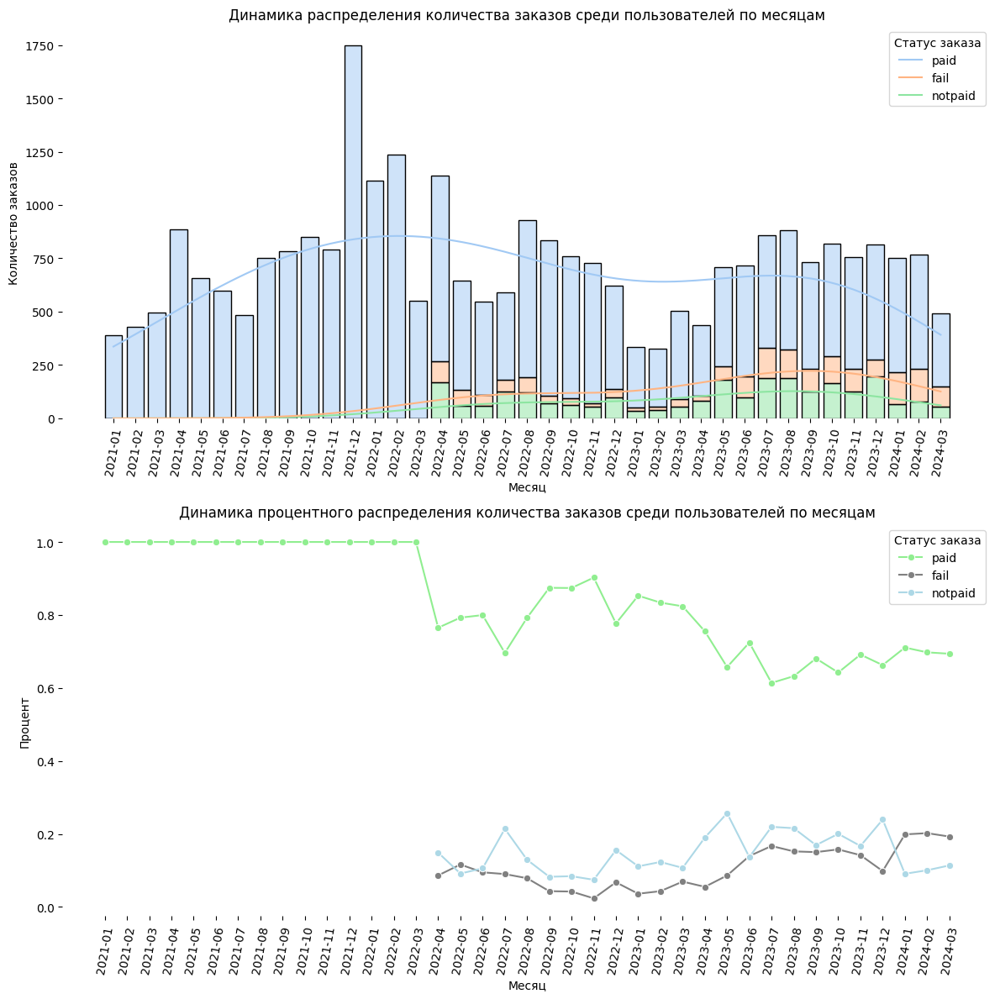

In [123]:
plot_monthly_order_dynamics(historical_donors_orders, 'order_first_action_date')

Мы видим, что оплаченных платежей сильно больше, чем неоплаченных. Также видим падение количества платежей с августа 2022 года, ситуация стабилизировалась к маю 2023.  Количество неплатежей среди исторических пользователей в целом только растет с весны 2023 года, так же как и сбоев в платежах. Я бы связала эту ситуацию как с санкциями, так и, возможно, в целом с ситуацией в стране, когда людям стало немного не до благотворительности.

<span style="color:green; font-size:22px">Анализ новых пользователей</span>

In [124]:
# Делаем срез по новым пользователям с заказами и каналами в 2024 году
new_orders_2024 = orders_2024[orders_2024['order_customer_mindbox_id'].isin(new_donors['customer_mindbox_id'])]
new_channels_2024 = channels_2024[channels_2024['user_id'].isin(new_donors['customer_mindbox_id'])]

In [125]:
# Добавим столбец 'is_new' в new_donors
new_donors['is_new'] = 1

# Посмотрим на средние значения наших признаков по новым пользователям
continuous_cols = []
discrete_cols = []
binary_cols = ['customer_is_recurrent', 'customer_is_volunteer', 'customer_email_is_invalid', 'customer_is_subscribed',
              'customer_sms_is_subscribed',	'customer_email_is_subscribed',	'customer_viber_is_subscribed',
               'customer_mobile_push_is_subscribed', 'customer_web_push_is_subscribed']
object_cols = ['customer_gender', 'customer_area_time_zone', 'customer_time_zone_source']

# Вызываем функцию для подсчета средних значений в выбранных столбцах
new_donors_means = count_means(continuous_cols, discrete_cols, binary_cols, object_cols, new_donors, 'is_new')

# Посчитаем те же метрики для исторических пользователей
# Добавим столбец 'is_new' в historical_donors
historical_donors['is_new'] = 0
historical_donors_means = count_means(continuous_cols, discrete_cols, binary_cols, object_cols, historical_donors, 'is_new')

# Добавим их к new_donors
new_donors_means = pd.concat([new_donors_means, historical_donors_means], axis=1)
new_donors_means.columns = ['is_new', 'historical']
new_donors_means

,is_new,historical
is_new,1,0
customer_is_recurrent,0.06,0.4
customer_is_volunteer,1.0,<NA>
customer_email_is_invalid,0.09,0.06
customer_is_subscribed,0.73,0.33
customer_sms_is_subscribed,0.73,0.82
customer_email_is_subscribed,0.85,0.9
customer_viber_is_subscribed,0.73,0.33
customer_mobile_push_is_subscribed,0.73,0.33
customer_web_push_is_subscribed,0.99,0.83


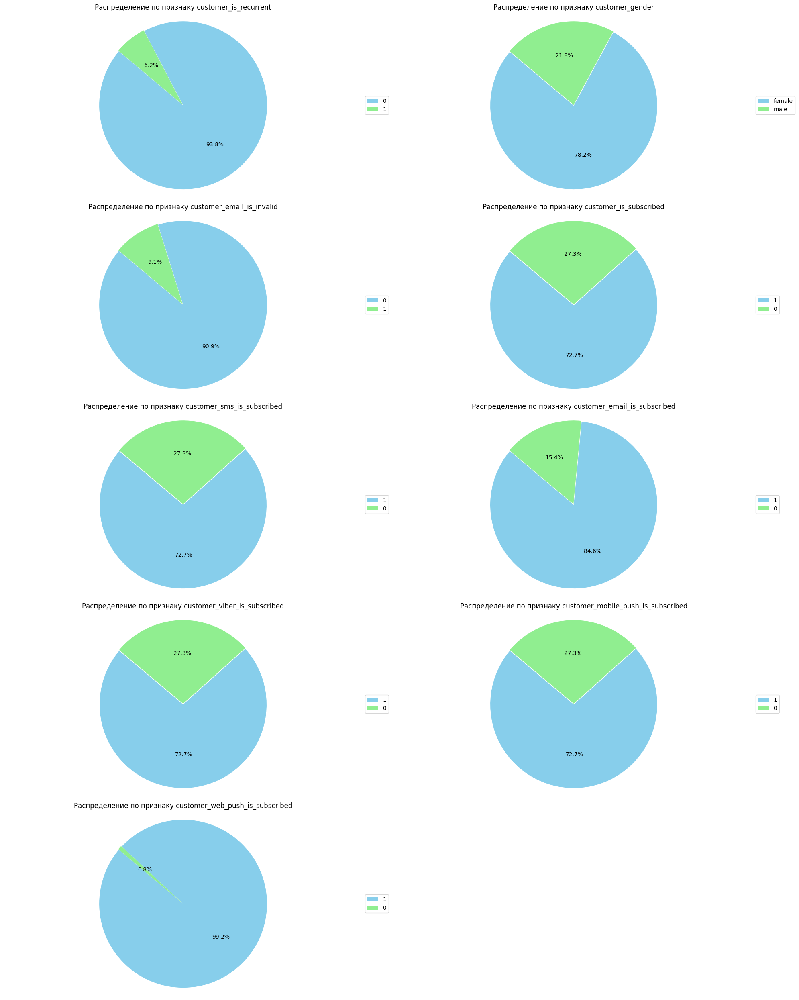

In [126]:
# Выбираем нужные столбцы для круговых диаграмм
columns_to_plot = ['customer_is_recurrent', 'customer_gender', 'customer_email_is_invalid', 'customer_is_subscribed',
                   'customer_sms_is_subscribed', 'customer_email_is_subscribed',  'customer_viber_is_subscribed',
                  'customer_mobile_push_is_subscribed', 'customer_web_push_is_subscribed']
viz_params_for_vis_function_pie(columns_to_plot, new_donors)

Для новых пользователей регион не определен, в данных пропуски. Также мы видим, что среди новых пользователей меньше рекуррентов, но больше подписок, пока лучше всего работает источник входа Email. Основные доноры, по-прежнему, женщины (78.2%).

In [127]:
# Проанализируем данные по оплатам новых пользователей в целом и в 2024 году, и сравним со историческими пользователями
# Данные для всех новых пользователей
all_new_users = new_donors_orders['order_is_paid'].value_counts()

# Данные для новых пользователей в 2024 году
new_users_2024 = new_orders_2024['order_is_paid'].value_counts()

# Данные для всех исторических пользователей
all_historical_users = historical_donors_orders['order_is_paid'].value_counts()

# Данные для исторических пользователей в 2024 году
historical_users_2024 = orders_2024['order_is_paid'].value_counts()

# Рассчитаем общее количество уникальных пользователей для каждого набора данных
total_all_new_users = all_new_users.sum()
total_new_users_2024 = new_users_2024.sum()
total_all_historical_users = all_historical_users.sum()
total_historical_users_2024 = historical_users_2024.sum()

# Рассчитаем процент для каждой категории
percent_all_new_users = (all_new_users / total_all_new_users) * 100
percent_new_users_2024 = (new_users_2024 / total_new_users_2024) * 100
percent_all_historical_users = (all_historical_users / total_all_historical_users) * 100
percent_historical_users_2024 = (historical_users_2024 / total_historical_users_2024) * 100

print("Проценты от общего числа для всех новых пользователей:")
print(round(percent_all_new_users,1),'%')
print("\nПроценты от общего числа для новых пользователей в 2024 году:")
print(round(percent_new_users_2024,1),'%')
print("\nПроценты от общего числа для всех исторических пользователей:")
print(round(percent_all_historical_users,1),'%')
print("\nПроценты от общего числа для исторических пользователей в 2024 году:")
print(round(percent_historical_users_2024,1),'%')

Проценты от общего числа для всех новых пользователей:
order_is_paid
paid       61.6
notpaid    27.3
fail       11.1
Name: count, dtype: float64 %

Проценты от общего числа для новых пользователей в 2024 году:
order_is_paid
paid       65.6
notpaid    22.1
fail       12.3
Name: count, dtype: float64 %

Проценты от общего числа для всех исторических пользователей:
order_is_paid
paid       84.8
notpaid     8.8
fail        6.4
Name: count, dtype: float64 %

Проценты от общего числа для исторических пользователей в 2024 году:
order_is_paid
paid       66.5
notpaid    19.8
fail       13.7
Name: count, dtype: float64 %


Мы видим, что количество делающих взносы новых пользователей увеличилось в 2024 году на 4%, количество неплатящих упало на 5.2%, процент ошибок при платеже вырос на 1.2%. Среди исторических пользователей, наоборот, процент платящих резко упал на 18.3%, процент неплататящих вырос на 11%, процент ошибок вырос на 7.3%. С чем это связано, сказать сложно. Может вовлеченность исторических пользователй упала. А может быть проблема все в тех же санкциях, люди, живущие в данный момент за рублежом не могут перевести деньги.

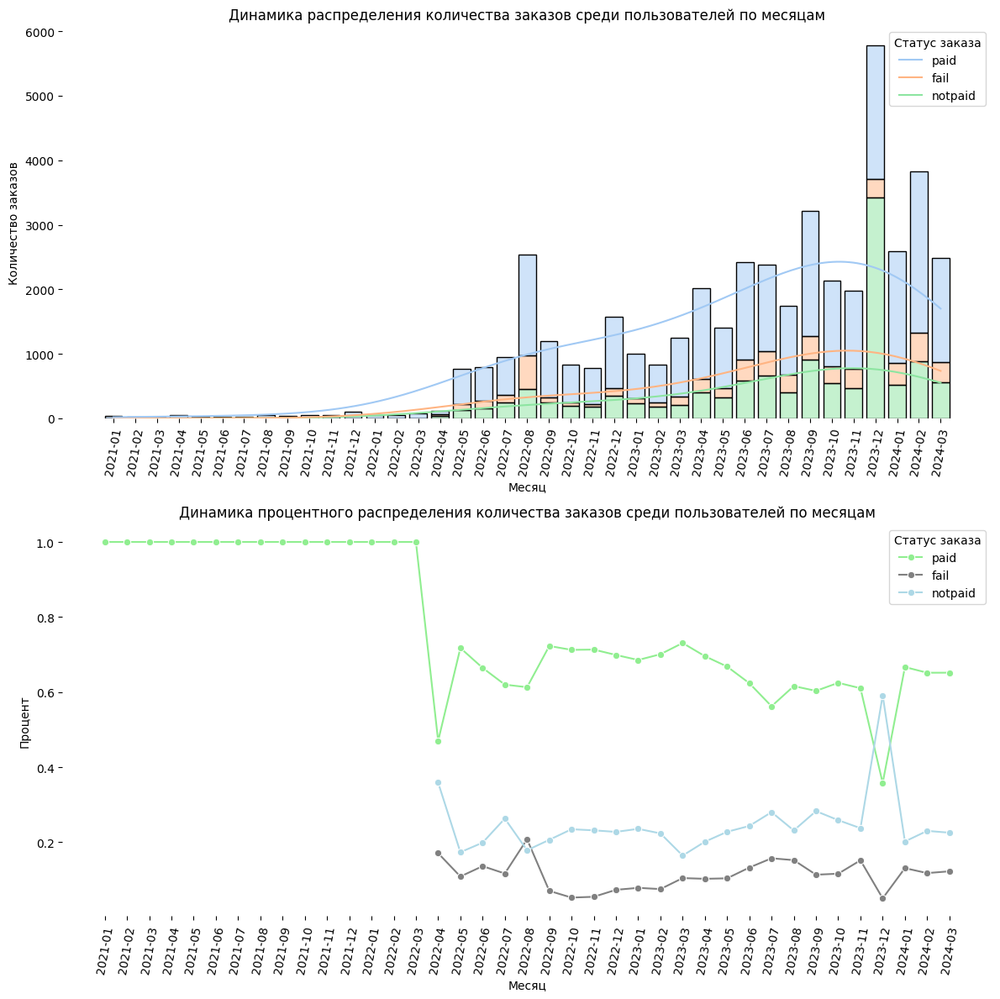

In [128]:
# Построим динамику платежей по месяцам среди новых пользователей
plot_monthly_order_dynamics(new_donors_orders, 'order_first_action_date')

Тут мы видим проседание  в платежах начиная с августа 2022 года, как и у исторических пользователей. Я все-таки связываю это с ситуацией в стране в эти месяцы. В декабре 2023 года интересная ситуация, когда платежи резко упали, а количество неоплаченных заказов резко выросло, и дело тут не в ошибках платежей явно. Могу предположить, что под новый год было привлечено новогодней акцией большое количество пользователей, которые под влиянием новогодней атмосферы и желания творить добро, решили внести пожертвования, но до дела, т.е. до оплаты так и не дошло. Посмотрим на пользователей, зарегистрировавшихся в декабре 2023 года, и на то, принимали ли они участие в новогодней акции.

In [129]:
# Отфильтруем новых доноров, зарегистрированных в декабре 2023 года
december_2023_new_donors = new_donors[new_donors['customer_registration_date'].dt.month == 12]
# Посчитаем их количество
december_2023_new_donors_count = december_2023_new_donors.shape[0]

# Отфильтруем заказы новых доноров, зарегистрированных в декабре 2023 года и участвующих в новогодней акции
december_2023_new_donors_orders = new_donors_orders[
    (new_donors_orders['order_customer_mindbox_id'].isin(december_2023_new_donors['customer_mindbox_id'])) &
    (new_donors_orders['order_is_newyear_action'] == 1)]
# Посчитаем их количество
december_2023_new_donors_in_newyear_action_count = december_2023_new_donors_orders.shape[0]

# Посчитаем количество оплативших заказ среди тех, кто участвовал и не участвовал в новогодней акции
newyear_action_paid_count = december_2023_new_donors_orders[december_2023_new_donors_orders['order_is_paid'] == "paid"]\
['order_customer_mindbox_id'].nunique()
non_newyear_action_paid_count = december_2023_new_donors_orders[december_2023_new_donors_orders['order_is_paid'] != "paid"]\
['order_customer_mindbox_id'].nunique()


print('Количество пользователей, зарегистрировавшихся в декабре 2023 года:', december_2023_new_donors_count)
print('Количество пользователей, зарегистрировавшихся в декабре 2023 года и участвующих в новогодней акции:',
      december_2023_new_donors_in_newyear_action_count)
print('Количество оплативших заказ среди участвующих в новогодней акции:', newyear_action_paid_count)
print('Количество неоплативших заказ среди не участвующих в новогодней акции:', non_newyear_action_paid_count)

Количество пользователей, зарегистрировавшихся в декабре 2023 года: 1845
Количество пользователей, зарегистрировавшихся в декабре 2023 года и участвующих в новогодней акции: 1002
Количество оплативших заказ среди участвующих в новогодней акции: 524
Количество неоплативших заказ среди не участвующих в новогодней акции: 243


Получается, что из пришедших по новогодней акции пользователей в декабре 2023 года, сделала пожертовавание примерно половина. Тут я вижу точку роста для работы с уже привлеченными пользователями. Возможно, необходимы активные напоминания пользователю, что у него в корзине неоплаченный заказ или что-то подобное.

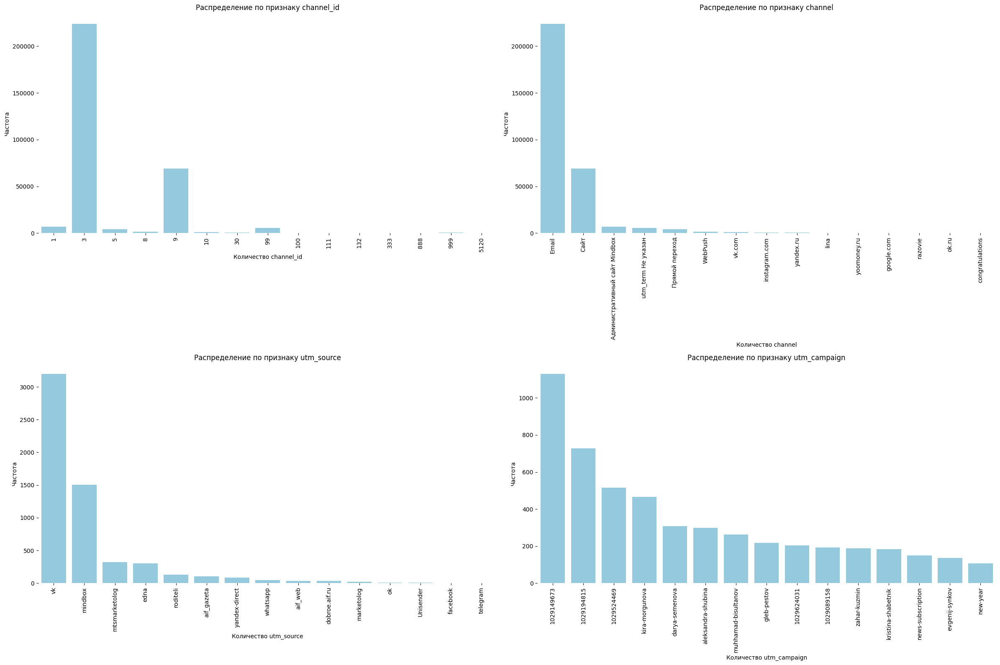

In [130]:
# Визуализируем данные по датасету new_channels_2024
columns_to_plot = ['channel_id', 'channel', 'utm_source', 'utm_campaign']
viz_params_for_vis_function(columns_to_plot, new_channels_2024)

В 2024 году лидирует Email в качестве канала входа, VK - в качестве источника перехода.

In [131]:
# Посмотрим, на какую сумму максимально были сделаны заказы, и оплаченные, и нет для исторических, для новых, и по всему датасету.
historical_paid_sum = historical_donors_orders.query('order_is_paid == "paid"')['order_total_price'].sum()
historical_paid_2024_sum = orders_2024.query('order_is_paid == "paid"')['order_total_price'].sum()
historical_notpaid_sum = historical_donors_orders.query('order_is_paid == "notpaid"')['order_total_price'].sum()
historical_notpaid_2024_sum = orders_2024.query('order_is_paid == "notpaid"')['order_total_price'].sum()

new_paid_sum = new_donors_orders.query('order_is_paid == "paid"')['order_total_price'].sum()
new_paid_2024_sum = new_orders_2024.query('order_is_paid == "paid"')['order_total_price'].sum()
new_notpaid_sum = new_donors_orders.query('order_is_paid == "notpaid"')['order_total_price'].sum()
new_notpaid_2024_sum = new_orders_2024.query('order_is_paid == "notpaid"')['order_total_price'].sum()

print("Общая сумма оплат у исторических пользователей:")
print(historical_paid_sum)
print("Общая сумма оплат у исторических пользователей в 2024 году:")
print(historical_paid_2024_sum)
print("Общая сумма неоплат у исторических пользователей:")
print(historical_notpaid_sum)
print("Общая сумма неоплат у исторических пользователей в 2024 году:")
print(historical_notpaid_2024_sum)
print()
print("Общая сумма оплат у новых пользователей:")
print(new_paid_sum)
print("Общая сумма оплат у новых пользователей в 2024 году:")
print(new_paid_2024_sum)
print("Общая сумма неоплат у новых пользователей:")
print(new_notpaid_sum)
print("Общая сумма неоплат у новых пользователей в 2024 году:")
print(new_notpaid_2024_sum)

Общая сумма оплат у исторических пользователей:
17601689
Общая сумма оплат у исторических пользователей в 2024 году:
4951170
Общая сумма неоплат у исторических пользователей:
2141943
Общая сумма неоплат у исторических пользователей в 2024 году:
1439514

Общая сумма оплат у новых пользователей:
21104979
Общая сумма оплат у новых пользователей в 2024 году:
4135906
Общая сумма неоплат у новых пользователей:
28332296
Общая сумма неоплат у новых пользователей в 2024 году:
1246111


Сумма неоплаченных заказов в обоих случаях очень большая, особенно среди новых пользователей. Люди добавляют продукт в корзину и не оплачивают. Тут огромное поле для деятельности фонда по работе с пользователями (письма-напоминания о неоплаченных заказах, рассылки с новыми кейсами, благодарственные письма за желание помочь и т.д.)

In [132]:
# Посмотрим также на максимальные значения по столбцу  оплат для всех пользователей
orders['order_total_price'].max()

1100000

In [133]:
# Посмотрим на статус оплаты этого заказа
orders.query('order_total_price == 1100000')['order_is_paid']

29346    notpaid
Name: order_is_paid, dtype: object

Так и есть, пожертвование на огромную сумму осталось неоплаченным.

In [134]:
# Проанализируем каналы привлечения
channels_2024 = new_channels_2024['utm_source'].value_counts()
channels_2024

utm_source
vk               3197
mindbox          1506
mtsmarketolog     321
edna              304
roditeli          130
aif_gazeta        105
yandex-direct      85
whatsapp           43
aif_web            36
dobroe.aif.ru      35
marketolog         20
ok                  6
Unisender           5
facebook            3
telegram            3
Name: count, dtype: int64

In [135]:
# Определим функцию для визуализации количества значений по столбцам c помощью столбчатой диаграммы
def cols_value_counts_viz(data, feature):
    # Подсчет количества значений в столбце
    data_counts = data[feature].value_counts()

    # Задаем список цветов для графика
    colors = ['lightgrey'] *  15
    colors[0], colors[1], colors[2] = 'lightgreen', 'lightgreen', 'lightgreen'

    # Создаем столбчатую диаграмму
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(x=data_counts.index, y=data_counts.values, palette=colors)
    plt.xlabel(f'Количество {feature}')
    plt.ylabel('Частота')
    plt.title(f'Распределение количества пользователей по {feature}')
    plt.xticks(rotation=80)

    # Добавляем значения на вершины столбцов
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha = 'center', va = 'center',
                         xytext = (0, 9),
                         textcoords = 'offset points')

    # Убираем рамки
    for spine in ['left', 'right', 'bottom', 'top']:
        ax.spines[spine].set_visible(False)

    # Убираем левую ось
    ax.get_yaxis ().set_visible(False)

    plt.tight_layout()
    plt.show()

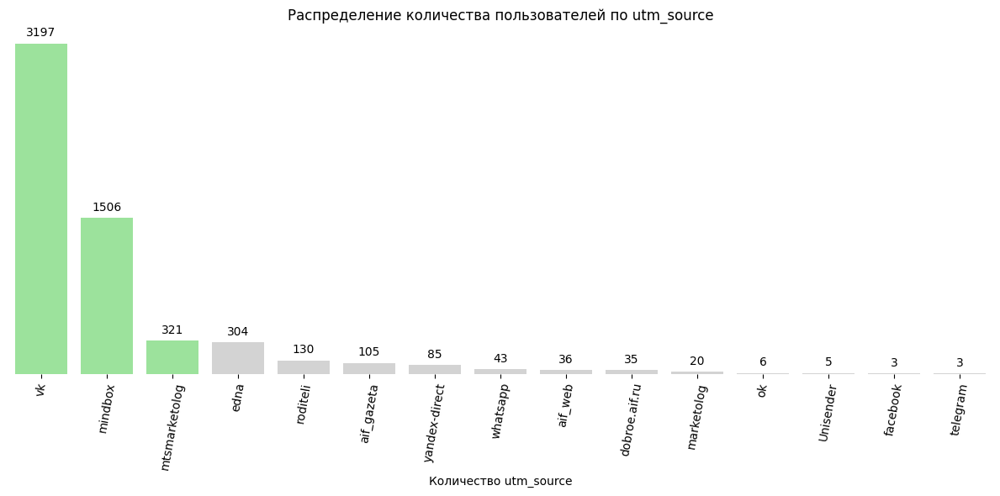

In [136]:
# Визуализируем количество пользователей по каналам привлечения
cols_value_counts_viz(new_channels_2024, 'utm_source')

Среди источников привлечения лидируют, как упоминалось выше, VK, Mindbox, MTS Marketolog.

Посчитаем, сколько оплат прошло по каждому каналу.

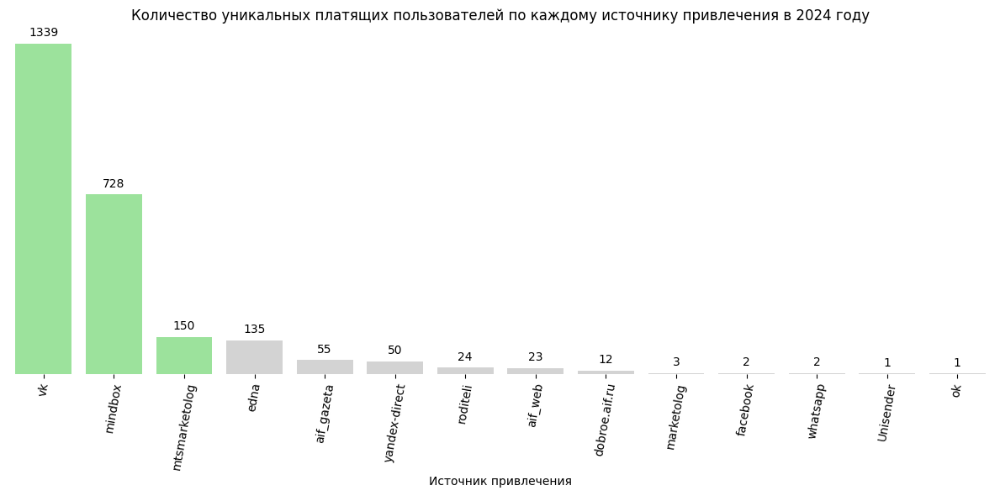

In [137]:
# Посчитаем количество оплаченных заказов по каждому идентификатору пользователя
paid_orders_counts = new_orders_2024[new_orders_2024['order_is_paid'] == 'paid'].groupby('order_customer_mindbox_id').size()

# Присоединим эти данные к new_channels_2024 для агрегации по utm_source
new_channels_2024['paid_orders_count'] = new_channels_2024['user_id'].map(paid_orders_counts).fillna(0)

# Фильтруем только пользователей, которые совершили хотя бы одну оплату
new_channels_2024_paid = new_channels_2024.query('paid_orders_count > 0')

# Считаем количество уникальных пользователей по каждому каналу привлечения с хотя бы одной оплатой
unique_paid_users_per_channel = new_channels_2024_paid.groupby('utm_source')['user_id'].nunique().sort_values(ascending=False)

# Визуализируем результаты
plt.figure(figsize=(12, 6))

# Задаем список цветов для графика
colors = ['lightgrey'] *  14
colors[0], colors[1], colors[2] = 'lightgreen', 'lightgreen', 'lightgreen'

ax = sns.barplot(x=unique_paid_users_per_channel.index, y=unique_paid_users_per_channel.values, palette=colors)
plt.xlabel('Источник привлечения')
plt.ylabel('Количество уникальных платящих пользователей')
plt.title('Количество уникальных платящих пользователей по каждому источнику привлечения в 2024 году')
plt.xticks(rotation=80)

# Добавляем значения на вершины столбиков
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha = 'center', va = 'center',
                     xytext = (0, 9),
                     textcoords = 'offset points')

# Убираем рамки
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)

# Убираем левую ось
ax.get_yaxis ().set_visible(False)

plt.tight_layout()
plt.show()

In [138]:
# Посчитаем процентное отношение между пришедшими пользователями и платящими среди них
# Добавим в датасет с платящими пользователями недостающий канал - telegram
unique_paid_users_per_channel['telegram'] = 0
# Возьмем из обоих датасетов топ-7
unique_paid_users_per_channel_top7 = unique_paid_users_per_channel[:7]
channels_2024_top7 = channels_2024[:7]
# Отсортируем каналы по алфавиту
paid_users_per_channel_sorted = unique_paid_users_per_channel.sort_index()
users_per_channel_sorted = channels_2024.sort_index()

# Вычислим процент
percent_paid_users_by_channel = round(paid_users_per_channel_sorted / users_per_channel_sorted * 100)
percent_paid_users_by_channel

utm_source
Unisender        20.0
aif_gazeta       52.0
aif_web          64.0
dobroe.aif.ru    34.0
edna             44.0
facebook         67.0
marketolog       15.0
mindbox          48.0
mtsmarketolog    47.0
ok               17.0
roditeli         18.0
telegram          0.0
vk               42.0
whatsapp          5.0
yandex-direct    59.0
dtype: float64

In [139]:
# Определим функцию для визуализации полученных данных
def plot_funnel_chart_three_value(df, stages, colors, title='Распределение пользователей по источникам'):
    fig, ax = plt.subplots(figsize=(12, 6))
    width = 0.6
    bar_width = 0.25  # Ширина одной полосы
    max_value = df['number'].max()

    legends = list(colors.keys())
    num_legends = len(legends)

    for i, stage in enumerate(stages):
        for j, (legend, color) in enumerate(colors.items()):
            value = df[(df['stage'] == stage) & (df['legend'] == legend)]['number'].values[0]
            left = (max_value - value) / 2
            offset = (j - num_legends / 2) * bar_width  # Смещение для каждой полосы
            ax.barh(i + offset, value, height=bar_width, left=left, color=color, label=legend if i == 0 else "")
            ax.text(max_value / 2, i + offset, f'{value}', ha='center', va='center', fontsize=12, color='black')

    ax.set_yticks(np.arange(len(stages)))
    ax.set_yticklabels(stages)
    ax.invert_yaxis()
    ax.set_xlabel('Количество пользователей')
    ax.set_title(title)
    ax.legend(loc='lower right')

    # Убираем рамки
    for spine in ['left', 'right', 'bottom', 'top']:
        ax.spines[spine].set_visible(False)
    plt.show()

# Определяем цвета
colors = {
    'Все пользователи': 'lightblue',
    'Платящие пользователи': 'lightgreen',
    '% платящих пользователей по каналам': 'lightgrey'
}

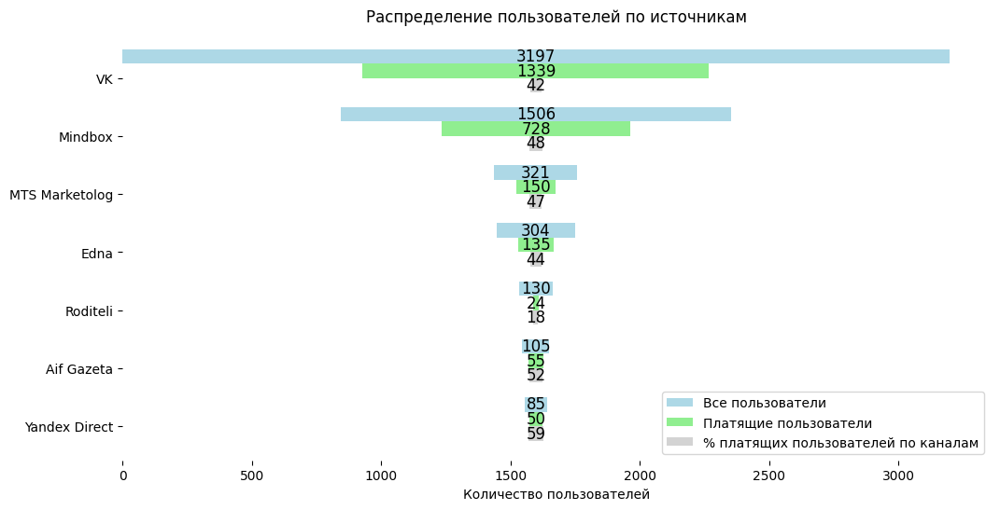

In [140]:
# Возьмем топ-7 по пришедшим пользователям и построим распределение
stages = ['VK', 'Mindbox', 'MTS Marketolog', 'Edna', 'Roditeli', 'Aif Gazeta', 'Yandex Direct']
data_users_by_channels = pd.DataFrame(dict(number=[3197, 1506, 321, 304, 130, 105, 85], stage=stages))
data_users_by_channels['legend'] = 'Все пользователи'
data_paid_users_by_channels = pd.DataFrame(dict(number=[1339, 728, 150, 135, 24, 55, 50], stage=stages))
data_paid_users_by_channels['legend'] = 'Платящие пользователи'
data_paid_users_by_channels_percent = pd.DataFrame(dict(number=[42, 48, 47, 44, 18, 52, 59], stage=stages))
data_paid_users_by_channels_percent['legend'] = '% платящих пользователей по каналам'
data = pd.concat([data_users_by_channels, data_paid_users_by_channels, data_paid_users_by_channels_percent], axis=0)

# Вызываем функцию для построения графика
plot_funnel_chart_three_value(data, stages, colors)

Итак, что мы видим: по количеству привлеченных пользователей VK и Mindbox лидируют, но процент платящих среди них не самый высокий. Через  Aif Gazeta и Yandex Direct приходят более платящие пользовали. Тем не менее, если учитывать размеры выборки, то первые два канана должны приносить больше пожертвований в деньгах теоретически. Проверим это.

In [141]:
# Отфильтруем заказы, чтобы оставить только оплаченные
paid_orders_2024 = new_orders_2024[new_orders_2024['order_is_paid'] == 'paid']

# Посчитаем общую сумму для каждого пользователя
user_total_spent = paid_orders_2024.groupby('order_customer_mindbox_id')['order_total_price'].sum().reset_index()
user_total_spent.columns = ['user_id', 'total_spent']

# Создаем сопоставление user_id с utm_source из new_channels_2024
utm_source_mapping = new_channels_2024.drop_duplicates(subset='user_id').set_index('user_id')['utm_source']

# Присоединяем utm_source к user_total_spent
user_total_spent['utm_source'] = user_total_spent['user_id'].map(utm_source_mapping).fillna('Unknown')

# Посчитаем общую сумму по каждому каналу
channel_total_spent = user_total_spent.groupby('utm_source')['total_spent'].sum().reset_index()

# Добавим уникальные utm_source из new_channels_2024
all_sources = new_channels_2024['utm_source'].unique()
for source in all_sources:
    if source not in channel_total_spent['utm_source'].values:
        missing_source = pd.DataFrame({'utm_source': [source], 'total_spent': [0]})
        channel_total_spent = pd.concat([channel_total_spent, missing_source], ignore_index=True)

channel_total_spent = channel_total_spent.query('total_spent >0').sort_values(by='total_spent', ascending= False).reset_index(drop=True)
display(channel_total_spent)

,utm_source,total_spent
0,Unknown,4099083
1,vk,14298
2,mtsmarketolog,6600
3,mindbox,6550
4,yandex-direct,5105
5,aif_gazeta,2500
6,edna,1300
7,whatsapp,470


In [142]:
# Посчитаем среднюю сумму платежа по количеству оплативших
# Список интересующих нас каналов
selected_channels = ['vk', 'mtsmarketolog', 'mindbox', 'yandex-direct', 'aif_gazeta', 'edna', 'whatsapp']

# Рассчитываем среднюю сумму на каждого платящего пользователя для каждого канала
results = []
for channel in selected_channels:
    total_spent = channel_total_spent.loc[channel_total_spent['utm_source'] == channel, 'total_spent'].values[0]
    paid_users = unique_paid_users_per_channel.loc[channel]
    avg_spent_per_paid_user = round(total_spent / paid_users if paid_users > 0 else 0, 1)
    results.append({
        'utm_source': channel,
        'avg_spent_per_paid_user': avg_spent_per_paid_user
    })

results = pd.DataFrame(results)

# Добавляем столбец с количеством платящих пользователей
results['paid_users'] = unique_paid_users_per_channel[selected_channels].values

# Добавляем столбец с общим количеством пользователей
results['total_users'] = channels_2024[selected_channels].values

# Рассчитываем долю пользователей, перечисливших деньги
results['share_paid_users'] = (results['paid_users'] / results['total_users'] * 100).round(1).astype(str) + '%'

results = results.sort_values(by='paid_users', ascending=False)
results

,utm_source,avg_spent_per_paid_user,paid_users,total_users,share_paid_users
0,vk,10.7,1339,3197,41.9%
2,mindbox,9.0,728,1506,48.3%
1,mtsmarketolog,44.0,150,321,46.7%
5,edna,9.6,135,304,44.4%
4,aif_gazeta,45.5,55,105,52.4%
3,yandex-direct,102.1,50,85,58.8%
6,whatsapp,235.0,2,43,4.7%


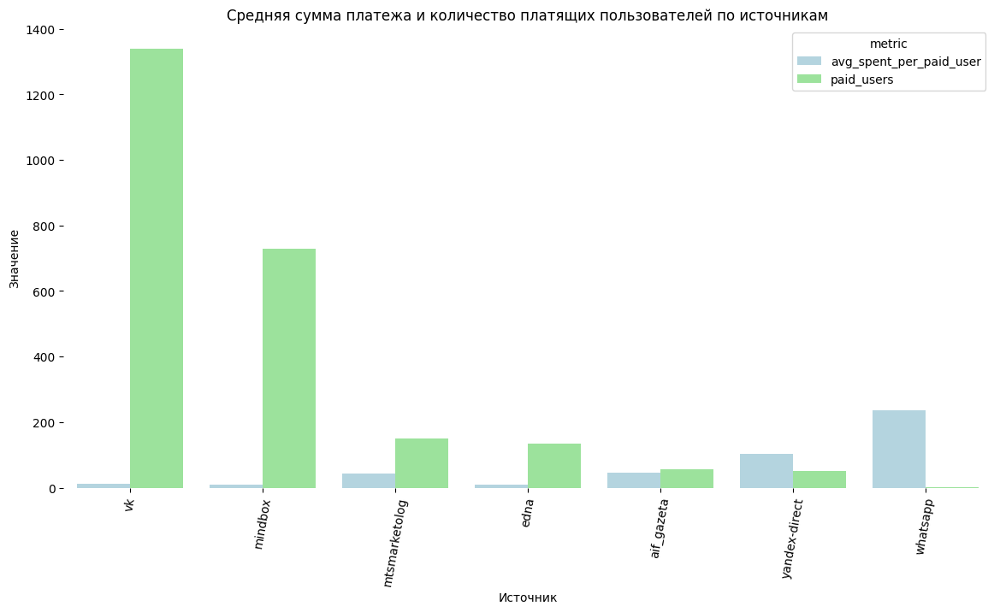

In [143]:
# Визуализируем данные
results_viz = pd.melt(results, id_vars='utm_source', value_vars=['avg_spent_per_paid_user', 'paid_users'],
                       var_name='metric', value_name='value')
plt.figure(figsize=(14, 7))

# Строим столбчатую диаграмму
ax = sns.barplot(data=results_viz, x='utm_source', y='value', hue='metric', palette=['lightblue', 'lightgreen'])

plt.xlabel('Источник')
plt.ylabel('Значение')
plt.title('Средняя сумма платежа и количество платящих пользователей по источникам')
plt.xticks(rotation=80)

# Убираем рамки
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)

plt.show()

Итак, на визуализации хорошо видно, что средняя сумма пожертвования от пользователей, пришедших с популярных каналов, таких как VK, совсем небольшая, а вот каналы Yandex Direct, Aif Gazeta, MTS Marketolog выглядят более перспективно, так же как и Whats App. Возможно, фонду стоит сделать упор на развитие именно этих каналов. На данный момент VK берет количеством пользователей, перечисляющих хотя бы небольшие суммы.

In [144]:
# Изучим самые популярные кампании по количеству просмотров в 2024 году
new_channels_2024['utm_campaign'].value_counts().head(10)

utm_campaign
1029149673             1129
1029194815              727
1029524469              515
kira-morgunova          466
darya-semenova          308
aleksandra-shubina      298
muhhamad-bisultanov     262
gleb-pestov             217
1029624031              204
1029089158              192
Name: count, dtype: int64

In [145]:
# Посчитаем, сколько денег было потрачено на компании в  2024 году
# Создаем сопоставление user_id с utm_campaign из new_channels_2024
utm_source_mapping = new_channels_2024.drop_duplicates(subset='user_id').set_index('user_id')['utm_campaign']

# Присоединяем utm_campaign к user_total_spent
user_total_spent['utm_campaign'] = user_total_spent['user_id'].map(utm_source_mapping).fillna('Unknown')

# Посчитаем общую сумму по каждой кампании
campaign_total_spent = user_total_spent.groupby('utm_campaign')['total_spent'].sum().reset_index()

# Добавим utm_campaign из new_channels_2024
all_campaigns = new_channels_2024['utm_campaign'].unique()
for campaign in all_campaigns:
    if campaign not in campaign_total_spent['utm_campaign'].values:
        missing_campaign = pd.DataFrame({'utm_campaign': [campaign], 'total_spent': [0]})
        campaign_total_spent = pd.concat([campaign_total_spent, missing_campaign], ignore_index=True)

campaign_total_spent = campaign_total_spent.query('total_spent >0').sort_values(by='total_spent', ascending= False).reset_index(drop=True)
display(campaign_total_spent)

,utm_campaign,total_spent
0,Unknown,4099083
1,82150215,5105
2,zahar-kuzmin,4900
3,1029149673,4725
4,1029194815,3900
5,aleksandra-shubina,3450
6,happy-history,3400
7,1029524469,3123
8,gleb-pestov,2600
9,viktoriya-kostina,2500


Довольно сложно сделать какие-либо выводы в данном случае, потому что у нас также как и с каналами отсутствует информация, на что жертвовали и по каким каналам пришли некоторые пользователи. Было бы прекрасно, если бы была возможность эту информацию отслеживать для каждого пользователя. Но все же можно провести некоторые параллели. Для Александры Шубиной было пожертвовано в 2024 году 3450 рублей, количество просмотров 298, для Дарьи Семеновой - 400 рублей при 308 просмотрах. Конверсия не очень хорошая. И тут, вероятно, имеет большое значение личный фактор. Люди переводят деньги для тех, чья история вызвала большее желание помочь.

В целом, мы видим следующее:
- по источникам привлечения лидируют VK, Mindbox, MTS Marketolog, Edna, Roditeli, а по платящим на 5 место выходит Aif Gazeta;
- перспективными по средней сумме переводов являются Yandex Direct, Aif Gazeta, MTS Marketolog, Whats App.

<span style="color:blue; font-size:17px">Анализ DAU, MAU, WAU, stiky_factor</span>

In [146]:
# Проанализируем DAU, MAU, WAU, stiky_factor для новых и исторических пользователей в 2024 году
def calculate_user_metrics(channels_data):
    mau = channels_data.groupby([channels_data['action_date'].dt.year, channels_data['action_date'].dt.month])['user_id'].nunique()
    dau = channels_data.groupby(channels_data['action_date'].dt.date)['user_id'].nunique()
    wau = (channels_data.groupby([channels_data['action_date'].dt.year, channels_data['action_date'].dt.isocalendar().week])['user_id']
           .nunique())
    sticky_factor_mau = dau.mean() / mau.mean() * 100
    sticky_factor_wau = dau.mean() / wau.mean() * 100
    return round(dau.mean(),1), round(mau.mean(),1), round(wau.mean(),1), round(sticky_factor_mau,1), round(sticky_factor_wau,1)

historical_dau, historical_mau, historical_wau, historical_sticky_mau, historical_sticky_wau = calculate_user_metrics(historical_channels_2024)
new_dau, new_mau, new_wau, new_sticky_mau, new_sticky_wau = calculate_user_metrics(new_channels_2024)

print('Historical_2024', '\n', 'DAU:', historical_dau, '\n', 'MAU:', historical_mau, '\n', 'WAU:', historical_wau, '\n',
      'Sticky Factor MAU:', historical_sticky_mau,'%', '\n', 'Sticky Factor WAU:', historical_sticky_wau,'%')
print('New_2024', '\n', 'DAU:', new_dau, '\n', 'MAU:', new_mau, '\n',  'WAU:', new_wau, '\n', 'Sticky Factor MAU:', new_sticky_mau,'%', '\n',
     'Sticky Factor WAU:', new_sticky_wau,'%')

Historical_2024 
 DAU: 405.8 
 MAU: 3631.3 
 WAU: 1682.3 
 Sticky Factor MAU: 11.2 % 
 Sticky Factor WAU: 24.1 %
New_2024 
 DAU: 1327.8 
 MAU: 9728.3 
 WAU: 5144.1 
 Sticky Factor MAU: 13.6 % 
 Sticky Factor WAU: 25.8 %


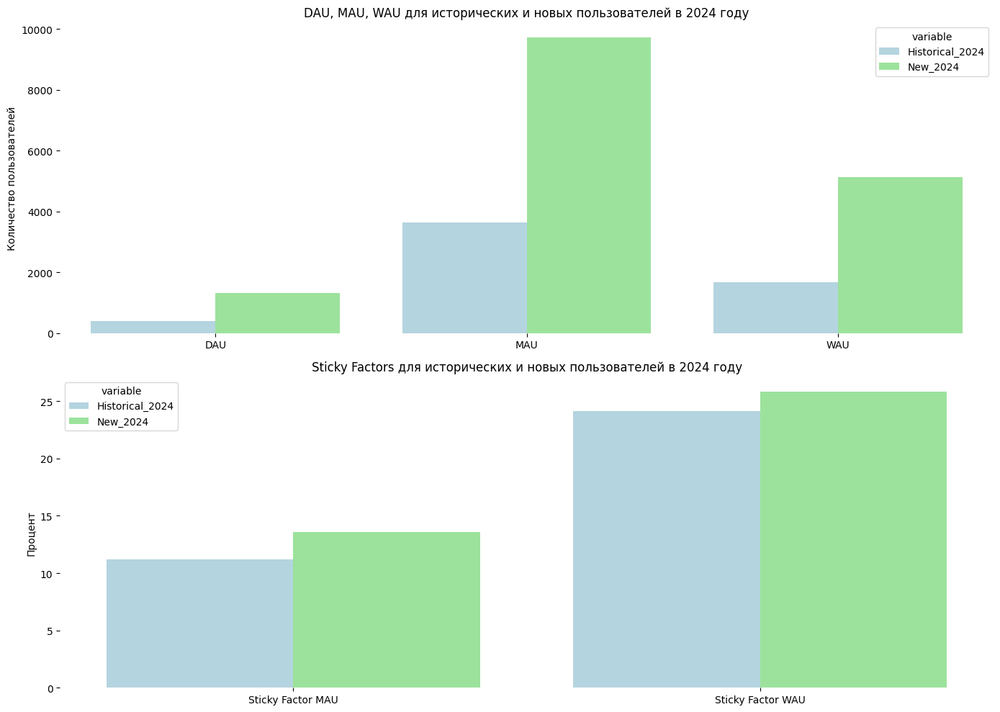

In [147]:
# Визуализируем полученный результат
data = {
    'Metric': ['DAU', 'MAU', 'WAU', 'Sticky Factor MAU', 'Sticky Factor WAU'],
    'Historical_2024': [historical_dau, historical_mau, historical_wau, historical_sticky_mau, historical_sticky_wau],
    'New_2024': [new_dau, new_mau, new_wau, new_sticky_mau, new_sticky_wau]
}

df = pd.DataFrame(data)

fig, ax = plt.subplots(2, 1, figsize=(14, 10))

# Построим графики для активности пользователей
ax1 = sns.barplot(x='Metric', y='value', hue='variable', data=pd.melt(df[['Metric', 'Historical_2024', 'New_2024']].iloc[:3], 
                                                                      id_vars='Metric'), ax=ax[0], palette=['lightblue', 'lightgreen'])
ax[0].set_title('DAU, MAU, WAU для исторических и новых пользователей в 2024 году')
ax[0].set_ylabel('Количество пользователей')
ax[0].set_xlabel('')
# Убираем рамки
for spine in ['left', 'right', 'bottom', 'top']:
    ax1.spines[spine].set_visible(False)

# Построим графики для sticky factors
ax2 = sns.barplot(x='Metric', y='value', hue='variable', data=pd.melt(df[['Metric', 'Historical_2024', 'New_2024']].iloc[3:], 
                                                                      id_vars='Metric'), ax=ax[1], palette=['lightblue', 'lightgreen'])
ax[1].set_title('Sticky Factors для исторических и новых пользователей в 2024 году')
ax[1].set_ylabel('Процент')
ax[1].set_xlabel('')

# Убираем рамки
for spine in ['left', 'right', 'bottom', 'top']:
    ax2.spines[spine].set_visible(False)

plt.tight_layout()
plt.show()

DAU, MAU, WAU в 2024 году:
- Новые пользователи показывают более высокую активность, чем исторические пользователи, что может указывать на успешные маркетинговые кампании или привлекательность новых функций.
  
Sticky Factors в 2024 году:
- Липкость новых пользователей выше, что может означать, что новые пользователи более вовлечены в текущие активности и продукты.

In [148]:
# Посчитаем те же метрики за весь период
historical_dau, historical_mau, historical_wau, historical_sticky_mau, historical_sticky_wau = calculate_user_metrics(historical_donors_channels)
new_dau, new_mau, new_wau, new_sticky_mau, new_sticky_wau = calculate_user_metrics(new_donors_channels)

print('Historical_all', '\n', 'DAU:', historical_dau, '\n', 'MAU:', historical_mau, '\n', 'WAU:', historical_wau, '\n',
      'Sticky Factor MAU:', historical_sticky_mau, '\n', 'Sticky Factor WAU:', historical_sticky_wau)
print('New_all', '\n', 'DAU:', new_dau, '\n', 'MAU:', new_mau, '\n',  'WAU:', new_wau, '\n', 'Sticky Factor MAU:', new_sticky_mau, '\n',
     'Sticky Factor WAU:', new_sticky_wau)

Historical_all 
 DAU: 383.6 
 MAU: 3517.6 
 WAU: 1996.8 
 Sticky Factor MAU: 10.9 
 Sticky Factor WAU: 19.2
New_all 
 DAU: 596.2 
 MAU: 3886.3 
 WAU: 2411.8 
 Sticky Factor MAU: 15.3 
 Sticky Factor WAU: 24.7


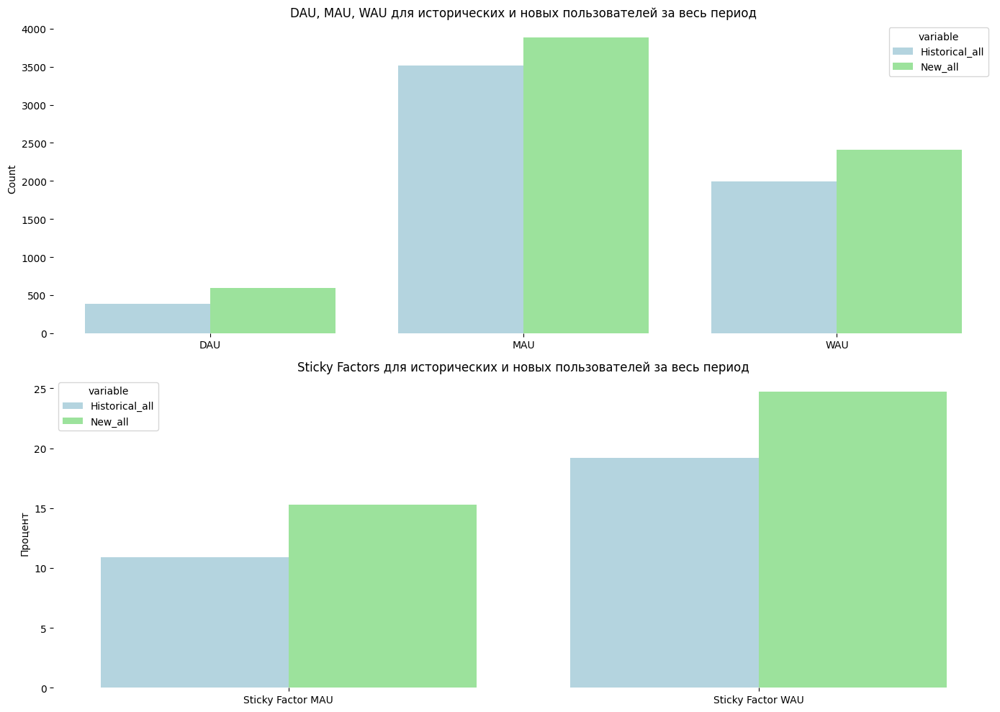

In [149]:
# Визуализируем полученный результат
data = {
    'Metric': ['DAU', 'MAU', 'WAU', 'Sticky Factor MAU', 'Sticky Factor WAU'],
    'Historical_all': [historical_dau, historical_mau, historical_wau, historical_sticky_mau, historical_sticky_wau],
    'New_all': [new_dau, new_mau, new_wau, new_sticky_mau, new_sticky_wau]
}

df = pd.DataFrame(data)

# Построение графиков
fig, ax = plt.subplots(2, 1, figsize=(14, 10))

# Построим графики для активных пользователей
ax1 = sns.barplot(x='Metric', y='value', hue='variable', data=pd.melt(df[['Metric', 'Historical_all', 'New_all']].iloc[:3], 
                                                                      id_vars='Metric'), ax=ax[0], palette=['lightblue', 'lightgreen'])
ax[0].set_title('DAU, MAU, WAU для исторических и новых пользователей за весь период')
ax[0].set_ylabel('Count')
ax[0].set_xlabel('')
# Убираем рамки
for spine in ['left', 'right', 'bottom', 'top']:
    ax1.spines[spine].set_visible(False)

# Построим графики для sticky factors
ax2 = sns.barplot(x='Metric', y='value', hue='variable', data=pd.melt(df[['Metric', 'Historical_all', 'New_all']].iloc[3:], 
                                                                      id_vars='Metric'), ax=ax[1], palette=['lightblue', 'lightgreen'])
ax[1].set_title('Sticky Factors для исторических и новых пользователей за весь период')
ax[1].set_ylabel('Процент')
ax[1].set_xlabel('')
# Убираем рамки
for spine in ['left', 'right', 'bottom', 'top']:
    ax2.spines[spine].set_visible(False)

plt.tight_layout()
plt.show()

DAU, MAU, WAU за весь период:
- Новые пользователи показывают более высокую активность, чем исторические пользователи, но отличия в активности не так значительны как по 2024 году.

Sticky Factors за весь период:
- Липкость новых пользователей также выше, но разница более значительна, чем в 2024 году.

In [150]:
# Посчитаем метрики по всему датасету
dau, mau, wau, sticky_mau, sticky_wau = calculate_user_metrics(channels)
print('\n', 'DAU:', dau, '\n', 'MAU:', mau, '\n', 'WAU:', wau, '\n', 'Sticky Factor MAU:', sticky_mau, '\n', 'Sticky Factor WAU:', 
      sticky_wau)


 DAU: 893.6 
 MAU: 7403.8 
 WAU: 4380.0 
 Sticky Factor MAU: 12.1 
 Sticky Factor WAU: 20.4


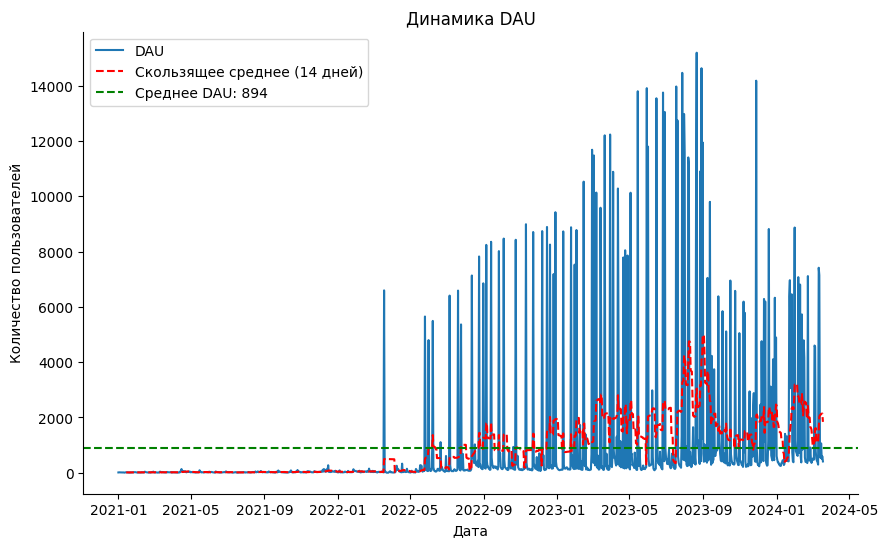

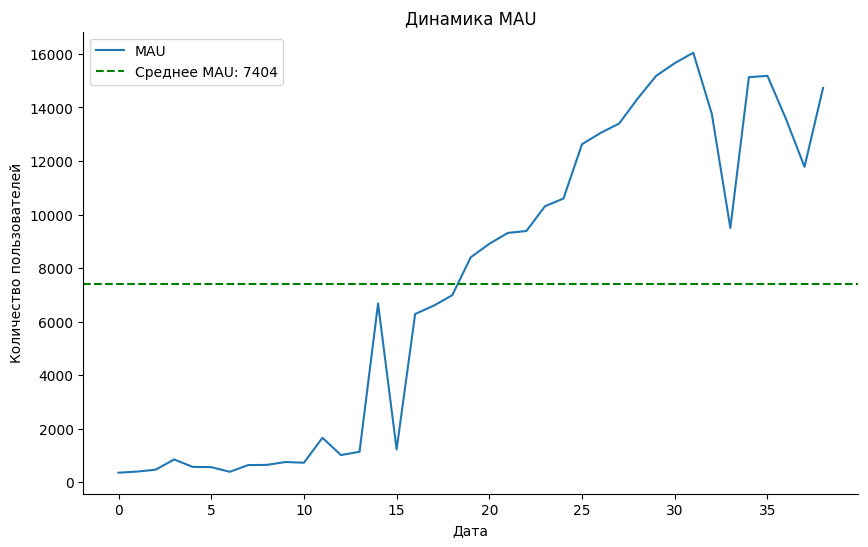

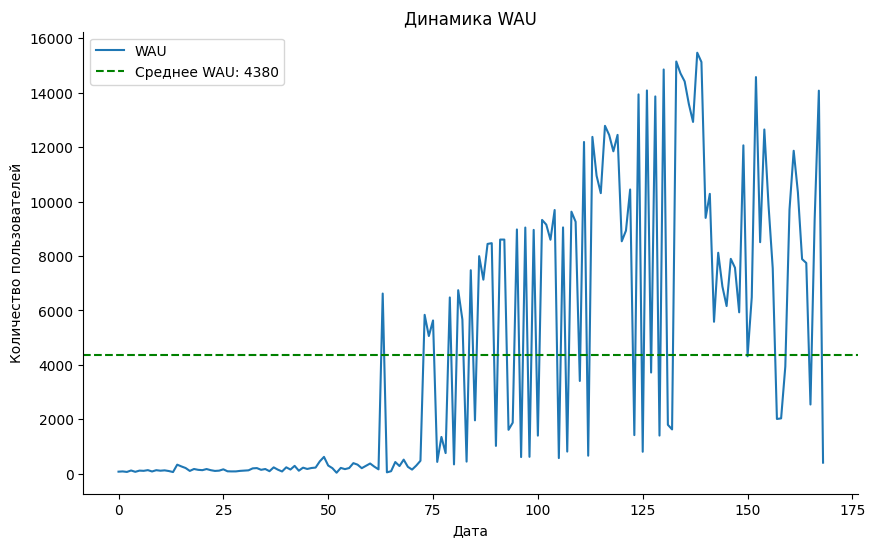

In [151]:
# Визуализируем метрики в динамике

# Подсчет DAU
dau = channels.groupby(channels['action_date'].dt.date)['user_id'].nunique()

# Подсчет MAU
mau = (channels
       .groupby([channels['action_date'].dt.year.rename('year'), channels['action_date'].dt.month.rename('month')])['user_id'].nunique())

# Подсчет WAU
wau = channels.groupby([channels['action_date'].dt.year.rename('year'), channels['action_date'].dt.isocalendar().week])['user_id'].nunique()

# Создаем датафреймы для каждой метрики
dau = pd.DataFrame(dau).reset_index()
dau.columns = ['date', 'DAU']
mau = pd.DataFrame(mau).reset_index()
mau.columns = ['year', 'month', 'MAU']
wau = pd.DataFrame(wau).reset_index()
wau.columns = ['year', 'month', 'WAU']

# Добавляем скользящее среднее для DAU
dau['rolling_mean'] = dau['DAU'].rolling(window=14).mean()

# Создаем графики для каждой метрики
metrics = [
    (dau, 'DAU', 'Динамика DAU'),
    (mau, 'MAU', 'Динамика MAU'),
    (wau, 'WAU', 'Динамика WAU')
]

for metric_data, metric_name, title in metrics:
    plt.figure(figsize=(10, 6))
    if metric_name == 'DAU':
        ax = sns.lineplot(data=metric_data, x='date', y=metric_name, linestyle='-', label=metric_name)
        sns.lineplot(data=metric_data, x='date', y='rolling_mean', linestyle='--', label='Скользящее среднее (14 дней)', color='red')
    else:
        ax = sns.lineplot(data=metric_data, x=metric_data.index, y=metric_name, linestyle='-', label=metric_name)
    
    metric_mean = metric_data[metric_name].mean()
    mean_label = f'Среднее {metric_name}: {metric_mean:.0f}'
    plt.axhline(y=metric_mean, color='green', linestyle='--', label=mean_label)
    plt.title(title)
    plt.xlabel('Дата')
    plt.ylabel('Количество пользователей')
    plt.legend()
    #for spine in ['left', 'right', 'bottom', 'top']:
    #    ax.spines[spine].set_visible(False)
    sns.despine()
    
plt.show()

По всем показателям мы видим пики активности, начиная с осени 2023 года.

<span style="color:blue; font-size:17px">Анализ ROMI</span>

По данным от заказчика на привлечение пользователей в 2023 году потрачены следующие суммы: 
- оплата таргета в VK - 944 225 руб.;
- оплата услуг агентства по настройке и оптимизации рекламы в VK - 560 000 руб.;
- оплата email-канала в mindbox - 738 000 руб. Mindbox интегрирован с сайтом, поэтому ловит каждое пожертвование, даже если оно не из email. Кроме email в mindbox используются push-уведомления (mts) и медиа;
- оплата рассылок в WhatsApp - 260 000 руб.

In [152]:
# Посчитаем, стоит ли того количество затраченных средств на развитие некоторых источников привлечения пользователей
source_data = pd.DataFrame({
    'utm_source': ['vk', 'email', 'whatsapp'],
    'spent_2023': [1504225, 738000, 260000]
})

In [153]:
# Делаем срез по оплаченным заказам в 2023 году и источниками
orders_2023 = orders[(orders['order_first_action_date'].dt.year == 2023) & (orders['order_is_paid'] == 'paid')]
channels_2023 = channels[(channels['action_date'].dt.year == 2023)]

# Присоединим к orders_2023 столбец с источниками
orders_23_merged = (orders_2023.merge(channels_2023[['user_id', 'utm_source']],
                                     left_on='order_customer_mindbox_id',
                                     right_on='user_id',
                                     how='left')
                               .drop(columns=['user_id'])
                               .drop_duplicates())

# Группируем заказы по источнику и считаем общий доход для каждого канала
total_revenue_by_source = orders_23_merged.groupby(['utm_source', 'order_first_action_date'])['order_total_price'].sum().reset_index()
total_revenue_by_source['utm_source'] = total_revenue_by_source['utm_source'].replace({'vk_ads': 'vk'})
total_revenue_by_source = total_revenue_by_source.groupby('utm_source')['order_total_price'].sum().reset_index()
total_revenue_by_source.sort_values(by='order_total_price', ascending=False)

,utm_source,order_total_price
10,mindbox,8221959
25,vk,2050408
1,aif_gazeta,610819
9,marketolog,590016
4,dobroe.aif.ru,531414
28,yandex-direct,486747
12,mtsmarketolog,430524
6,edna,281952
2,aif_web,251412
20,roditeli,198060


In [154]:
# Вычисляем сумму всех источников, кроме mindbox
total_revenue_excluding_mindbox = total_revenue_by_source[total_revenue_by_source['utm_source'] != 'mindbox']['order_total_price'].sum()

# Находим доход для mindbox
mindbox_revenue = total_revenue_by_source[total_revenue_by_source['utm_source'] == 'mindbox']['order_total_price'].values[0]

# Вычитаем сумму всех остальных источников из дохода mindbox, чтобы найти прибыль от использования email
email = mindbox_revenue - total_revenue_excluding_mindbox
email = pd.DataFrame({'utm_source': ['email'], 'order_total_price': [email]})
email

,utm_source,order_total_price
0,email,2326045


In [155]:
# Оставляем только каналы vk и whatsapp
filtered_revenue_by_source = total_revenue_by_source[total_revenue_by_source['utm_source'].isin(['vk', 'whatsapp'])]

# Добавляем новый канал email
filtered_revenue_by_source =  pd.concat([filtered_revenue_by_source, email], ignore_index=True)
filtered_revenue_by_source

,utm_source,order_total_price
0,vk,2050408
1,whatsapp,46510
2,email,2326045


In [156]:
# Объединяем данные о доходах с данными о затратах на развитие каналов
source_development = pd.merge(source_data, filtered_revenue_by_source, on='utm_source', how='left')

# Рассчитываем ROMI (Return on Marketing Investment)
source_development['ROMI'] = (source_development['order_total_price'] - source_development['spent_2023']) / \
source_development['spent_2023'] * 100

source_development

,utm_source,spent_2023,order_total_price,ROMI
0,vk,1504225,2050408,36.309927
1,email,738000,2326045,215.182249
2,whatsapp,260000,46510,-82.111538


- затраты на развитие источника vk в 2023 году окупились. ROMI составляет почти 36.3%, что указывает на прибыльность маркетинговых вложений в этот источник, хотя рентабельность не такая высокая как у email. Это означает, что на каждый рубль, вложенный в этот источник, возвращается примерно 1.36 рублей;
- затраты на развитие канала email в 2023 году также окупились. ROMI составляет 215.18%, что означает, что каждый вложенный рубль приносит 2.15 рубля прибыли;
- в отличие от vk и email, источник whatsapp оказался убыточным. ROMI составляет -82.1%, что означает, что затраты на этот источник не окупились. На каждый вложенный рубль было потеряно почти 82 копейки. Это указывает на необходимость пересмотра стратегии использования этого источника или отказа от него.

[Возврат к описанию проекта](#toc)

<a id="14"></a>
<span style="color:green; font-size:22px">RFM-анализ</span>

Подготовим данные для RFM анализа.

In [157]:
# Убираем пользователей без платежей
orders_with_payments = orders.query('order_is_paid == "paid"')

In [158]:
# Для анализа выставляем максимальную дату в датасете + 1 день
analyse_date = orders_with_payments['order_first_action_datetime'].max() + pd.Timedelta('1d')
display(orders_with_payments['order_first_action_datetime'].max())
display(analyse_date)

Timestamp('2024-03-18 12:03:00')

Timestamp('2024-03-19 12:03:00')

In [159]:
# Создаем RFM таблицу
rfm = orders_with_payments.groupby('order_customer_mindbox_id').agg({'order_first_action_mindbox_id': 'count',
                                     'order_total_price': 'sum',
                                     'order_first_action_datetime': ['min', 'max']}).reset_index()

rfm.columns = ['id', 'orders_count', 'total_sales', 'start_date', 'end_date']

# Считаем период жизни пользователя (разница между конечной и начальной датой)
rfm['period'] = (rfm.end_date - rfm.start_date) / pd.Timedelta('1d') + 1

# Считаем recency (время с момента последнего заказа: analyse_date - дата последнего заказа пользователя)
rfm['r_value'] = (analyse_date - rfm.end_date) / pd.Timedelta('1d')

# Приводим частоту к одной шкале (количество заказов/период жизни клиента*30, чтобы частота заказов была не в днях, а месяцах)
rfm['f_value'] = (rfm.orders_count / rfm.period).round(2) * 30

# Monetary (сумма всех заказов клиента)
rfm['m_value'] = rfm.total_sales

Проверим столбцы на выбросы, прежде чем разбивать их на ранги.

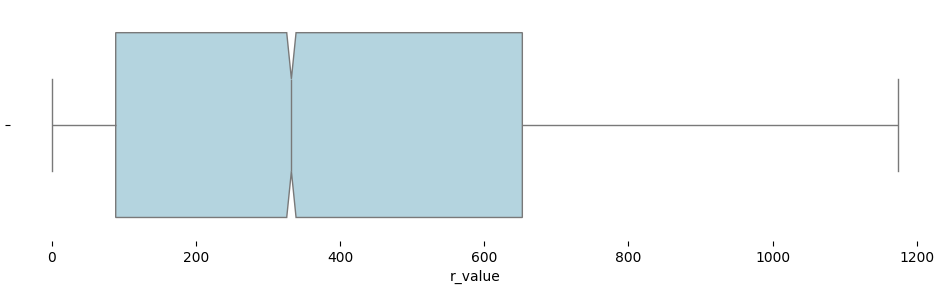

In [160]:
# r_value
plt.figure(figsize=(12, 3))
ax = sns.boxplot(x=rfm.r_value, notch=True, color='lightblue')
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)
plt.show()

В столбце с recency выбросов нет.

In [161]:
# Выясняем интервалы для разбиения столбца recency на три ранга (дополнительно для интервалов указываем минимальное и максимальное значения
# в столбце)
r_clean = rfm['r_value'].tolist()
r_bins = [0] + list(np.percentile(r_clean, [33, 66])) + [rfm.r_value.max()]
r_bins

[0, 165.7265277777778, 563.7001388888889, 1173.5020833333333]

Клиентам от 0 до 165.7265277777778 будет присвоен ранг 3 и т.д. Это ярлыки для рангов, так как в данном случае, чем меньше значение, тем лучше, то ярлыки я называем в обратном порядке: от 3 к 1.

In [162]:
r_labels = [3, 2, 1]

In [163]:
# Создаем новый столбец с рангом  R, разбив столбец r_value на три равных интервала
rfm['R'] = pd.cut(rfm.r_value, labels=r_labels, bins=r_bins, include_lowest=True)

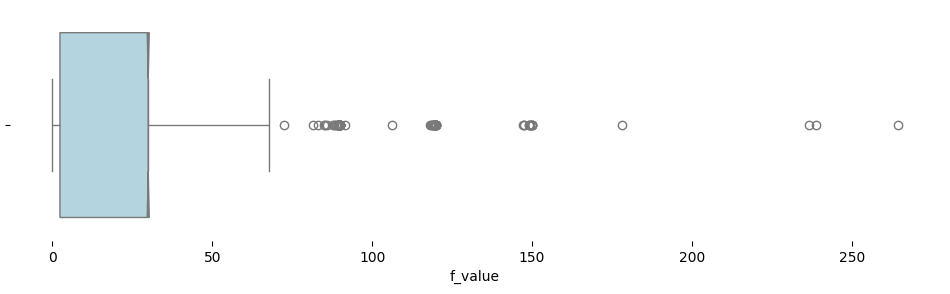

In [164]:
# f_value
plt.figure(figsize=(12, 3))
ax = sns.boxplot(x=rfm.f_value, notch=True, color='lightblue')
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)
plt.show()

В столбце с frequency есть выбросы, почистим их для разбивки на ранги через интеквартильный размах, но в анализ включим всех.

In [165]:
# Удаляем выбросы
fq1, fq3 = np.percentile(rfm.f_value, [25, 75])
f_iqr = fq3 - fq1
f_top = fq3 + 1.5 * f_iqr
f_clean = rfm[rfm.f_value < f_top]['f_value'].tolist()

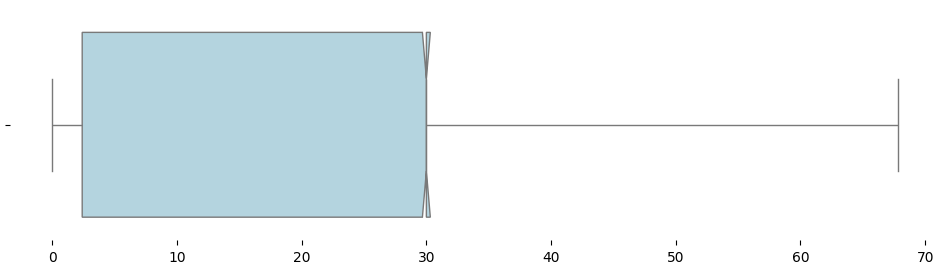

In [166]:
# Проверим результат
plt.figure(figsize=(12, 3))
ax = sns.boxplot(x=f_clean, notch=True, color='lightblue')
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)
plt.show()

In [167]:
f_bins = [0] + list(np.percentile(f_clean, [33, 66])) + [rfm.f_value.max()]
f_bins

[0, 30.0, 30.0, 264.3]

In [168]:
# Границы интервала равны и составляют 30, поэтому руками разобьем на интервал [0, 33, 66, 264.3]
f_bins = [0, 33, 66, 264.3]
f_bins

[0, 33, 66, 264.3]

In [169]:
f_labels = [1, 2, 3]

In [170]:
# Создаем новый столбец с рангом F, разбив столбец f_value на три равных интервала
rfm['F'] = pd.cut(rfm.f_value, labels=f_labels, bins=f_bins, include_lowest=True)

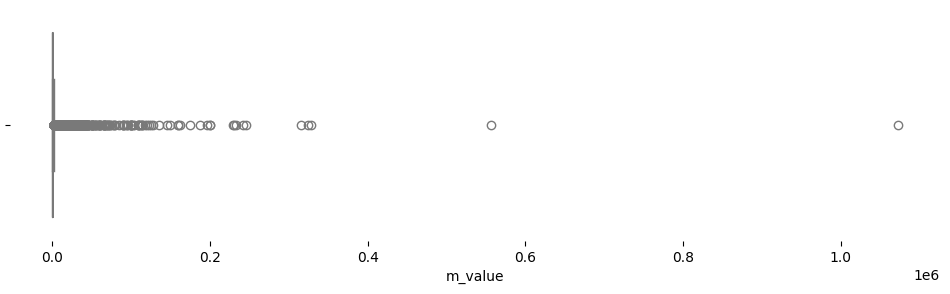

In [171]:
# m_value
plt.figure(figsize=(12, 3))
ax = sns.boxplot(x=rfm.m_value, notch=True, color='lightblue')
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)
plt.show()

In [172]:
# Удаляем выбросы
mq1, mq3 = np.percentile(rfm.m_value, [25, 75])
m_iqr = mq3 - mq1
m_top = mq3 + 1.5 * m_iqr
m_clean = rfm[rfm.m_value < m_top]['m_value'].tolist()

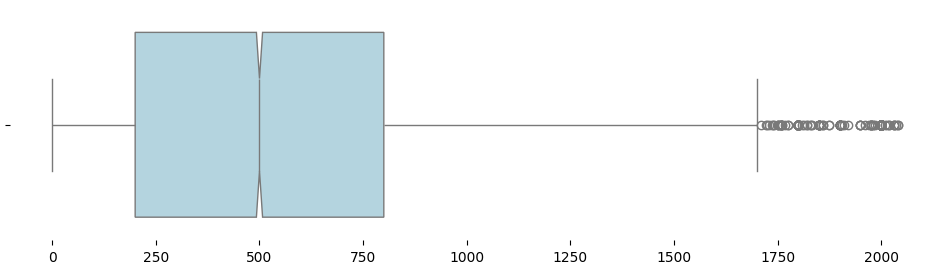

In [173]:
# Проверяем результат
plt.figure(figsize=(12, 3))
ax = sns.boxplot(x=m_clean, notch=True, color='lightblue')
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)
plt.show()

In [174]:
m_bins = [0] + list(np.percentile(m_clean, [33, 66])) + [rfm.m_value.max()]
m_bins

[0, 300.0, 500.0, 1072500]

In [175]:
m_labels = [1, 2, 3]

In [176]:
rfm['M'] = pd.cut(rfm.m_value, labels=m_labels, bins=m_bins, include_lowest=True)

In [177]:
# Получаем итоговый сегмент RFM, сложив все три ранга как строки
rfm['RFM'] = rfm.R.astype('str') + rfm.F.astype('str') + rfm.M.astype('str')
rfm.sample(5)

,id,orders_count,total_sales,start_date,end_date,period,r_value,f_value,m_value,R,F,M,RFM
15173,42143,1,1000,2023-10-25 18:06:00,2023-10-25 18:06:00,1.000000,145.747917,30.0,1000,3,1,3,313
10862,35637,9,980,2023-03-03 05:30:00,2024-03-04 16:29:00,368.457639,14.815278,0.6,980,3,1,3,313
1481,17548,2,200,2021-10-16 00:00:00,2024-01-04 17:53:00,811.745139,74.756944,0.0,200,3,1,1,311
15049,41984,1,500,2023-10-18 18:26:00,2023-10-18 18:26:00,1.000000,152.734028,30.0,500,3,1,2,312
12162,37882,1,300,2023-05-12 06:32:00,2023-05-12 06:32:00,1.000000,312.229861,30.0,300,2,1,1,211


In [178]:
def describe_segment(R, F, M):
    r_desc = f'Не был больше чем 180 дней' if R == 1 else f'Был от 30 до 180 дней' if R == 2 else f'Был меньше чем 30 дней назад'
    f_desc = f'Покупает реже чем раз в три месяца' if F == 1 else f'Покупает в период от 1 до 3 месяцев' if F == 2 else f'Покупает раз в месяц'
    m_desc = f'Чек 1000' if M == 1 else f'Чек от 1000 до 3000' if M == 2 else f'Чек выше 3 тысяч'

    return f"R: {R} - {r_desc}, F: {F} - {f_desc}, M: {M} - {m_desc}"

# Применение функции к каждому сегменту
rfm['segment_description'] = rfm.apply(lambda row: describe_segment(row['R'], row['F'], row['M']), axis=1)

In [179]:
def make_segments(cell: str) -> str:
    'присвоение типа клиенту в зависимости от RFM сегмента'
    new_cell = ''
    if cell in ['333']:
        new_cell = 'ключевой'
    elif cell in ['332', '331', '322']:
        new_cell = 'лояльный'
    elif cell in ['323', '233', '223']:
        new_cell = 'крупный'
    elif cell in ['232', '231', '222', '221', '212', '211']:
        new_cell = 'неактивный'
    elif cell in ['213', '133', '123', '113']:
        new_cell = 'крупный неактивный'
    elif cell in ['321', '313', '312', '311']:
        new_cell = 'новый'
    elif cell in ['132', '131', '122', '121']:
        new_cell = 'почти потерянный'
    else:
        new_cell = 'ушедший'
    return new_cell
rfm['client_type'] = rfm.RFM.apply(make_segments)
rfm.head()

,id,orders_count,total_sales,start_date,end_date,period,r_value,f_value,m_value,R,F,M,RFM,segment_description,client_type
0,2734,2,51,2021-03-18 10:52:00,2021-10-14 15:50:00,211.206944,886.842361,0.3,51,1,1,1,111,"R: 1 - Не был больше чем 180 дней, F: 1 - Покупает реже чем раз в три месяца, M: 1 - Чек 1000",ушедший
1,2847,3,1000,2021-06-16 23:10:00,2023-12-15 03:39:00,912.186806,95.350000,0.0,1000,3,1,3,313,"R: 3 - Был меньше чем 30 дней назад, F: 1 - Покупает реже чем раз в три месяца, M: 3 - Чек выше ...",новый
2,2861,7,120,2021-03-16 12:24:00,2022-12-07 14:17:00,632.078472,467.906944,0.3,120,2,1,1,211,"R: 2 - Был от 30 до 180 дней, F: 1 - Покупает реже чем раз в три месяца, M: 1 - Чек 1000",неактивный
3,3361,1,3000,2022-12-20 09:32:00,2022-12-20 09:32:00,1.000000,455.104861,30.0,3000,2,1,3,213,"R: 2 - Был от 30 до 180 дней, F: 1 - Покупает реже чем раз в три месяца, M: 3 - Чек выше 3 тысяч",крупный неактивный
4,4982,11,840,2021-01-01 20:52:00,2024-02-13 18:55:00,1138.918750,34.713889,0.3,840,3,1,3,313,"R: 3 - Был меньше чем 30 дней назад, F: 1 - Покупает реже чем раз в три месяца, M: 3 - Чек выше ...",новый


In [180]:
# Cгруппируем таблицу по сегментам
segment_counts = rfm.groupby(['R', 'F', 'M']).size().reset_index(name='counts')

segment_counts = segment_counts.merge(rfm[['R', 'F', 'M', 'segment_description']], on=['R', 'F', 'M'], how='left').drop_duplicates()
segment_counts = segment_counts.merge(rfm[['R', 'F', 'M', 'client_type']], on=['R', 'F', 'M'], how='left').drop_duplicates()
segment_counts

,R,F,M,counts,segment_description,client_type
0,3,1,1,1906,"R: 3 - Был меньше чем 30 дней назад, F: 1 - Покупает реже чем раз в три месяца, M: 1 - Чек 1000",новый
1906,3,1,2,1011,"R: 3 - Был меньше чем 30 дней назад, F: 1 - Покупает реже чем раз в три месяца, M: 2 - Чек от 10...",новый
2917,3,1,3,3167,"R: 3 - Был меньше чем 30 дней назад, F: 1 - Покупает реже чем раз в три месяца, M: 3 - Чек выше ...",новый
6084,3,2,1,19,"R: 3 - Был меньше чем 30 дней назад, F: 2 - Покупает в период от 1 до 3 месяцев, M: 1 - Чек 1000",новый
6103,3,2,2,9,"R: 3 - Был меньше чем 30 дней назад, F: 2 - Покупает в период от 1 до 3 месяцев, M: 2 - Чек от 1...",лояльный
6112,3,2,3,52,"R: 3 - Был меньше чем 30 дней назад, F: 2 - Покупает в период от 1 до 3 месяцев, M: 3 - Чек выше...",крупный
6164,3,3,1,2,"R: 3 - Был меньше чем 30 дней назад, F: 3 - Покупает раз в месяц, M: 1 - Чек 1000",лояльный
6166,3,3,2,2,"R: 3 - Был меньше чем 30 дней назад, F: 3 - Покупает раз в месяц, M: 2 - Чек от 1000 до 3000",лояльный
6168,3,3,3,10,"R: 3 - Был меньше чем 30 дней назад, F: 3 - Покупает раз в месяц, M: 3 - Чек выше 3 тысяч",ключевой
6178,2,1,1,2460,"R: 2 - Был от 30 до 180 дней, F: 1 - Покупает реже чем раз в три месяца, M: 1 - Чек 1000",неактивный


In [181]:
# Сгруппируем результат по сегменту и категориям
rfm.groupby('client_type').agg({'RFM': lambda x: list(x.unique())}).reset_index()

,client_type,RFM
0,ключевой,[333]
1,крупный,"[223, 323, 233]"
2,крупный неактивный,"[213, 113, 123, 133]"
3,лояльный,"[331, 332, 322]"
4,неактивный,"[211, 212, 222, 221, 231]"
5,новый,"[313, 311, 312, 321]"
6,почти потерянный,"[122, 121, 132, 131]"
7,ушедший,"[111, 112]"


In [182]:
# Сгруппируем данные по сегментам и агрегируем их
segments_description = rfm.groupby('client_type').agg({'id': 'nunique',
                            'total_sales': 'sum',
                            'period': 'mean'}).reset_index().rename(columns={
                                'id': 'clients_count',
                                'total_sales': 'segment_income',
                                'period': 'lifetime'
                            })
segments_description['mean_outcome_per_client'] = segments_description['segment_income']/segments_description['clients_count']
segments_description = segments_description.style.highlight_max(subset=['clients_count', 'segment_income', 'lifetime',
                                                                        'mean_outcome_per_client'], color='lightblue')
segments_description

,client_type,clients_count,segment_income,lifetime,mean_outcome_per_client
0,ключевой,10,71500,1.085208,7150.000000
1,крупный,147,689634,1.238728,4691.387755
2,крупный неактивный,4198,14661724,119.061022,3492.549786
3,лояльный,13,4874,1.167201,374.923077
4,неактивный,3808,1160238,23.803404,304.684349
5,новый,6103,20833364,200.483481,3413.626741
6,почти потерянный,57,17514,1.032493,307.263158
7,ушедший,4385,1267820,7.645871,289.126568


Посмотрим на статистику по сегментам

In [183]:
rfm_stats = (
    rfm.groupby('RFM').agg({'id':'nunique', 'total_sales': ['count', 'mean', 'sum']}).reset_index()
)

In [184]:
rfm_stats.columns = ['RFM_segment', 'users_count_in_segment',
                     'donations_count', 'mean_donation',
                     'donation_sum']

In [185]:
rfm_stats.set_index('RFM_segment').style.format(thousands='.', decimal=',', precision=2).bar(cmap='GnBu')

,users_count_in_segment,donations_count,mean_donation,donation_sum
RFM_segment,,,,
111,2.908,2.908,"185,27",538.751
112,1.477,1.477,"493,61",729.069
113,1.816,1.816,"3.425,05",6.219.899
121,20,20,"175,35",3.507
122,25,25,"434,96",10.874
123,80,80,"4.844,35",387.548
131,8,8,"154,12",1.233
132,4,4,"475,00",1.900
133,27,27,"9.784,07",264.170


Итак, в целом можно сказать, что у нас укрупненно 8 сегментов.
- более всего нам интересны сегменты с "ключевыми" и "крупными" клиентами. Их не слишком много, у них короткий лайфтам, тратят они довольно много из расчета на одного клиента. Скорее это разовые пользователи, необходимо придумать стратегию по их удержанию;
- далее нам интересны "новые" клиенты, по количеству и по общей сумме взносов они лидируют, лайфтайм более 200 дней. Необходимо работать с ними более точечно, чтобы они возвращались снова и их платежи стали постоянными, а не разовыми;
- интересный сегмент для развития на с "крупными неактивными" клиентами, у них  лайфтам более 119 дней, они вносили крупные суммы денег, но ушли, необходимо их реанимировать;
- в сегментах - "лояльный" и "почти потерянный", лайфтайм очень короткий, таких людей мало, они переводят небольшие суммы, в целом приход от них не очень большой;
- оставшиеся два сегмента ("неактивный", "ушедший") содержат по количеству  более 8 тысяч пользователей. Переводили также небольшие суммы примерно раз в неделю или раз в месяц, но в целом по сумме сборов они на 3 и 4 месте. Было бы неплохо их реанимировать.

Проанализируем каждый сегмент более подробно.

In [186]:
# Определим функцию для объединения данных в датасетах и удаления дублирующихся столбцов
def merge_with_rfm(df, rfm, left_on, right_on, columns_to_add):
    merged_df = df.merge(rfm[[right_on] + columns_to_add], left_on=left_on, right_on=right_on, how='left', suffixes=('', '_rfm'))
    merged_df.drop(columns=[right_on], inplace=True)
    # Удаляем дублирующийся столбец, если он существует
    for column in columns_to_add:
        if f"{column}_rfm" in merged_df.columns:
            merged_df.drop(columns=[column], inplace=True)
            merged_df.rename(columns={f"{column}_rfm": column}, inplace=True)
    return merged_df

# Объединяем датасет donors с rfm
donors = merge_with_rfm(donors, rfm, 'customer_mindbox_id', 'id', ['client_type'])

# Объединяем датасет orders с rfm
orders = merge_with_rfm(orders, rfm, 'order_customer_mindbox_id', 'id', ['client_type'])

# Объединяем датасет channels с rfm
channels = merge_with_rfm(channels, rfm, 'user_id', 'id', ['client_type'])

In [187]:
# Проанализируем датасет donors
def mode(series):
    return series.mode()[0] if not series.mode().empty else None

# Группируем и аггрегируем данные
result = (donors.groupby('client_type')
                 .agg(clients_count=('customer_mindbox_id', 'nunique'),
                      gender=('customer_gender', mode),
                      area=('customer_area_name', mode),
                      recurrent=('customer_is_recurrent', 'sum'),
                      sms=('customer_sms_is_subscribed', 'sum'),
                      email=('customer_email_is_subscribed', 'sum'),
                      viber=('customer_viber_is_subscribed', 'sum'),
                      mobile_push=('customer_mobile_push_is_subscribed', 'sum'),
                      web_push=('customer_web_push_is_subscribed', 'sum'),
                      registration_time=('customer_registration_time', 'mean'))
                 .reset_index())

# Примененим стиль
numerical_columns = ['clients_count', 'recurrent', 'sms', 'email', 'viber', 'mobile_push', 'web_push', 'registration_time']
result[numerical_columns] = result[numerical_columns].apply(pd.to_numeric, errors='coerce')
styled_result = result.style.highlight_max(subset=numerical_columns, color='lightblue')

styled_result

,client_type,clients_count,gender,area,recurrent,sms,email,viber,mobile_push,web_push,registration_time
0,ключевой,10,female,None,0,0,10,0,0,0,10.900000
1,крупный,147,female,Vienna,0,0,132,0,0,0,11.639456
2,крупный неактивный,4198,female,Vienna,90,4,3711,0,0,14,12.647689
3,лояльный,13,female,None,1,0,11,0,0,0,13.692308
4,неактивный,3808,female,Vienna,2,3,3176,2,2,51,12.058036
5,новый,6101,female,Vienna,541,12,5310,3,3,108,12.615145
6,почти потерянный,57,female,Vienna,0,0,54,0,0,0,12.701754
7,ушедший,4385,female,Vienna,0,7,3909,0,0,3,12.911973


Итак, наиболее перспективно выглядит сегмент  с новыми клиентами, среди них наибольшее количество реккурентов (541), они отлично реагируют на email_рассылку и web_push уведомления. В целом большая часть пользователей женщины, проживающие в Вене. Также я бы хотела обратить внимание на время регистрации пользователей, в среднем регистрации происходили между 12 и 14 часами дня по Московскому времени. Возможно, имеет смысл придерживаться этого интервала при организации  рассылок, эти люди в это время наиболее активны.

In [188]:
# Проанализируем датасет orders
# Группируем и аггрегируем данные
result = (orders.groupby('client_type')
                 .agg(clients_count=('order_customer_mindbox_id', 'nunique'),
                      price=('order_total_price', 'sum'),
                      new_year=('order_is_newyear_action', 'sum'),
                      recurrent=('order_is_regular_recurrent', 'sum'),
                      repeated_payment=('order_is_repeated_payment', 'sum'),
                      action_time=('order_first_action_time', 'mean'))
                 .reset_index())

# Примененим стиль
numerical_columns = ['clients_count', 'price', 'new_year', 'recurrent', 'repeated_payment', 'action_time']
result[numerical_columns] = result[numerical_columns].apply(pd.to_numeric, errors='coerce')
styled_result = result.style.highlight_max(subset=numerical_columns, color='lightblue')

styled_result

,client_type,clients_count,price,new_year,recurrent,repeated_payment,action_time
0,ключевой,10,81100,3,1,0,14.891304
1,крупный,147,883339,11,8,0,14.325670
2,крупный неактивный,4198,16900797,38,1063,136,9.258998
3,лояльный,13,6130,0,22,19,11.431034
4,неактивный,3808,1727455,18,128,17,13.177596
5,новый,6103,25601510,1661,5486,3285,12.293271
6,почти потерянный,57,25096,0,1,0,9.703030
7,ушедший,4385,1435328,5,35,7,8.592084


И снова новые пользователи показывают лучший результат. На втором месте крупные неактивные, необходимо их реанимировать. По времени пользователи активны или в утренние часы (8-10) или днем в 12-14.

In [189]:
# Проанализируем датасет channels
result = (channels.groupby('client_type')
                 .agg(clients_count=('user_id', 'nunique'),
                      channel=('channel_id', 'median'),
                      action_time=('action_time', 'mean'))
                 .reset_index())

# Примененим стиль
numerical_columns = ['clients_count', 'channel', 'action_time']
result[numerical_columns] = result[numerical_columns].apply(pd.to_numeric, errors='coerce')
styled_result = result.style.highlight_max(subset=numerical_columns, color='lightblue')

styled_result

,client_type,clients_count,channel,action_time
0,ключевой,10,3.000000,14.776144
1,крупный,147,3.000000,14.871662
2,крупный неактивный,4198,3.000000,14.663267
3,лояльный,13,3.000000,12.857827
4,неактивный,3808,3.000000,14.832233
5,новый,6101,3.000000,14.234689
6,почти потерянный,57,3.000000,15.093354
7,ушедший,4385,3.000000,15.182738


Отсюда много информации извлечь сложно, кроме того, что большинство пользователей приходят через сайт и более всего новых, а также ушедших или крупных неактивных. Отток пользователей высокий.

[Возврат к описанию проекта](#toc)

<a id="15"></a>
<span style="color:green; font-size:22px">Коммерческие метрики</span>

<span style="color:blue; font-size:17px">Средний чек</span>

In [190]:
# Посчитаем для начала общим суммы пожертвований по годам
total_2021 = orders[(orders['order_is_paid'] == "paid") & (orders['order_first_action_date'].dt.year == 2021)]['order_total_price'].sum()
total_2022 = orders[(orders['order_is_paid'] == "paid") & (orders['order_first_action_date'].dt.year == 2022)]['order_total_price'].sum()
total_2023 = orders[(orders['order_is_paid'] == "paid") & (orders['order_first_action_date'].dt.year == 2023)]['order_total_price'].sum()
total_2024 = orders[(orders['order_is_paid'] == "paid") & (orders['order_first_action_date'].dt.year == 2024)]['order_total_price'].sum()
print('Общая сумма пожертвований за 2021 год:', total_2021)
print('Общая сумма пожертвований за 2022 год:', total_2022)
print('Общая сумма пожертвований за 2023 год:', total_2023)
print('Общая сумма пожертвований за 2024 год:', total_2024)

Общая сумма пожертвований за 2021 год: 7592698
Общая сумма пожертвований за 2022 год: 10455000
Общая сумма пожертвований за 2023 год: 15706588
Общая сумма пожертвований за 2024 год: 4952382


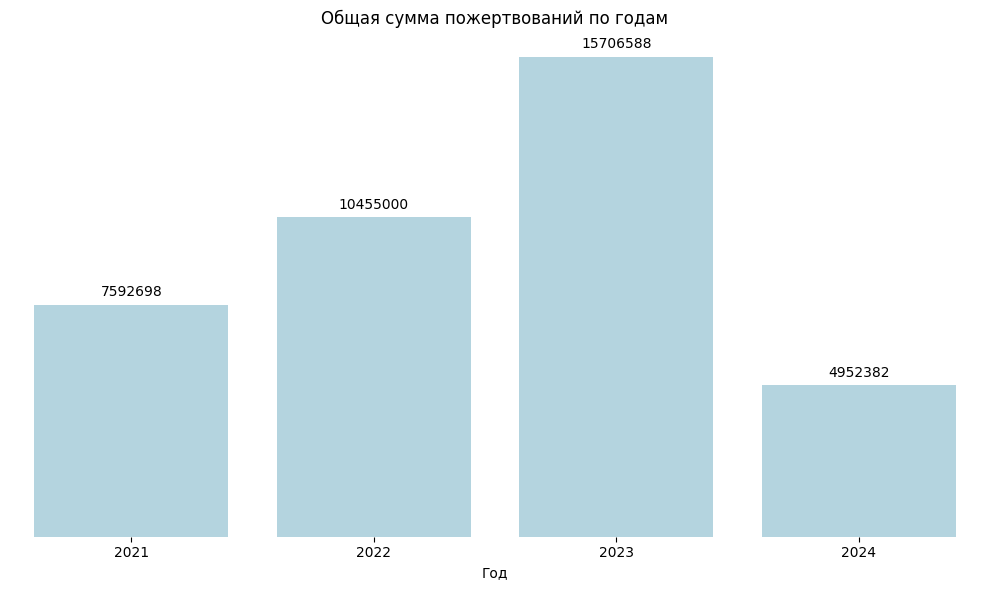

In [191]:
# Визуализируем для наглядности
data = {
    'Year': [2021, 2022, 2023, 2024],
    'Total Donations': [total_2021, total_2022, total_2023, total_2024]
}
total_year_donation = pd.DataFrame(data)

# Создаем столбчатую диаграмму
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Year', y='Total Donations', data=total_year_donation, color='lightblue')
plt.title('Общая сумма пожертвований по годам')
plt.xlabel('Год')
plt.ylabel('Общая сумма пожертвований')

# Добавляем значения на вершины столбиков
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha = 'center', va = 'center',
                     xytext = (0, 9),
                     textcoords = 'offset points')

# Убираем рамки
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)

# Убираем левую ось
ax.get_yaxis ().set_visible(False)

plt.tight_layout()
plt.show()

plt.show()

Выглядит так, что с каждым годом сумма сборов растет. Если средняя сумма в месяц за 2023 год около 1 млн. 308 тыс. руб.,  то за каждый из трех месяцев 2024 года средняя сумма - 1 млн. 650 млн. руб.

In [192]:
# Средний чек для новых и исторических пользователей, а также по всему датасету
historical_avg_check = historical_donors_orders.query('order_is_paid == "paid"').groupby('order_is_paid')['order_total_price'].mean()
new_avg_check = new_donors_orders.query('order_is_paid == "paid"').groupby('order_is_paid')['order_total_price'].mean()
avg_check = orders.query('order_is_paid == "paid"').groupby('order_is_paid')['order_total_price'].mean()
print('Средний чек для исторических пользователей:')
print(historical_avg_check)
print()
print('Средний чек для новых пользователей:')
print(new_avg_check)
print()
print('Средний чек по всему датасету:')
print(avg_check)

Средний чек для исторических пользователей:
order_is_paid
paid    729.150331
Name: order_total_price, dtype: float64

Средний чек для новых пользователей:
order_is_paid
paid    755.963142
Name: order_total_price, dtype: float64

Средний чек по всему датасету:
order_is_paid
paid    743.529678
Name: order_total_price, dtype: float64


У новых пользователей средний чек немного выше, чем у исторических пользователей. Посчитаем средний чек другим способом, а также посмотрим, сколько в среднем было платежей по дням, как много времени проходит у пользователей между первым и последним платежом и сколько в среднем платежей на пользователя.

In [193]:
# Посчитаем, как много времени проходит у пользователей между первым и последним платежом и сколько в среднем платежей на пользователя
# Отсортируем платежи по времени для каждого пользователя
payments_sorted = orders.query('order_is_paid == "paid"').sort_values(by=['order_customer_mindbox_id', 'order_first_action_datetime'])

# Сгруппируем платежи по пользователям и найдем первый и последний платеж для каждого пользователя
first_payment_time = payments_sorted.groupby('order_customer_mindbox_id')['order_first_action_datetime'].first()
last_payment_time = payments_sorted.groupby('order_customer_mindbox_id')['order_first_action_datetime'].last()

# Найдем разницу во времени между первым и последним платежом для каждого пользователя
time_difference = last_payment_time - first_payment_time

# Посчитаем среднее время между первым и последним платежом
avg_time_difference = time_difference.mean()

# Посчитаем количество заказов для каждого пользователя в этом временном промежутке
num_orders = payments_sorted.groupby('order_customer_mindbox_id').size()

# Вычислим среднее количество заказов на пользователя
avg_num_orders = num_orders.mean()

print("Среднее время между первым и последним платежом:", avg_time_difference)
print("Среднее количество заказов на пользователя в промежутке между первым и последним платежом:", round(avg_num_orders))

Среднее время между первым и последним платежом: 97 days 16:51:21.389883018
Среднее количество заказов на пользователя в промежутке между первым и последним платежом: 3


В среднем лайфтайм пользователя около 100 дней и он делает 3 платежа за это время.

In [194]:
# Посчитаем, сколько в среднем платежей по дням
# Выделим день из времени каждого платежа
payments_sorted['payment_day'] = payments_sorted['order_first_action_datetime'].dt.date

# Сгруппируем платежи по дню и посчитаем количество платежей для каждого дня
payments_per_day = payments_sorted.groupby('payment_day').size()

# Посчитаем среднее количество платежей в день
avg_payments_per_day = payments_per_day.mean()

print('Среднее количество платежей в день:', round(avg_payments_per_day))

Среднее количество платежей в день: 45


In [195]:
# Посчитаем средний чек в день
# Сгруппируем платежи по дням и вычислим общую сумму платежей и количество платежей для каждого дня
daily_payments = payments_sorted.groupby('payment_day').agg(total_amount=('order_total_price', 'sum'),
                                                            num_payments=('order_total_price', 'count'))

# Вычислим средний чек для каждого дня
daily_payments['avg_payment'] = daily_payments['total_amount'] / daily_payments['num_payments']

# Вычислим общий средний чек по датасету
avg_payment_overall = daily_payments['total_amount'].sum() / daily_payments['num_payments'].sum()

print('Общий средний чек:', avg_payment_overall)

Общий средний чек: 743.5296784355911


Итак, общий средний чек в день составляет 743.5 руб.

In [196]:
# Посчитаем средний чек в день для сегментов пользователей
payments_by_client_type = payments_sorted.groupby('client_type').agg(total_amount=('order_total_price', 'sum'),
                                                                    num_payments=('order_total_price', 'count'))

payments_by_client_type['avg_payment'] = round(payments_by_client_type['total_amount'] / payments_by_client_type['num_payments'],1)

payments_by_client_type = payments_by_client_type[['avg_payment']].reset_index()
payments_by_client_type

,client_type,avg_payment
0,ключевой,1881.6
1,крупный,1853.9
2,крупный неактивный,1196.1
3,лояльный,157.2
4,неактивный,255.0
5,новый,697.1
6,почти потерянный,126.0
7,ушедший,265.0


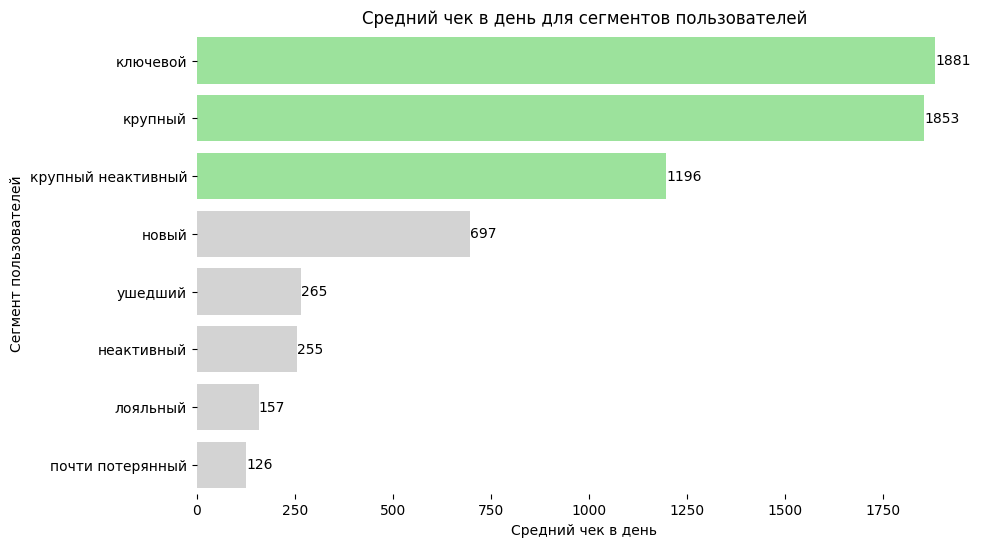

In [197]:
plt.figure(figsize=(10, 6))

colors = ['lightgrey'] * 8
colors[0], colors[1], colors[2] = 'lightgreen', 'lightgreen', 'lightgreen'

ax = sns.barplot(data=payments_by_client_type.sort_values(by='avg_payment', ascending = False), y='client_type', x='avg_payment',
            palette=colors)

plt.xlabel('Средний чек в день')
plt.ylabel('Сегмент пользователей')
plt.title('Средний чек в день для сегментов пользователей')

# Убираем рамки
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)

# Добавляем подписи с количеством пользователей
for p in ax.patches:
    ax.text(p.get_width() + 0.1,  # координата X для текста
            p.get_y() + p.get_height() / 2,  # координата Y для текста
            f'{int(p.get_width())}',  # текст с количеством пользователей (целое число)
            ha='left',  # горизонтальное выравнивание текста
            va='center')  # вертикальное выравнивание текста

plt.show()

Самый высокий средний чек в день у ключевых, крупных и крупных неактивных клиентов.

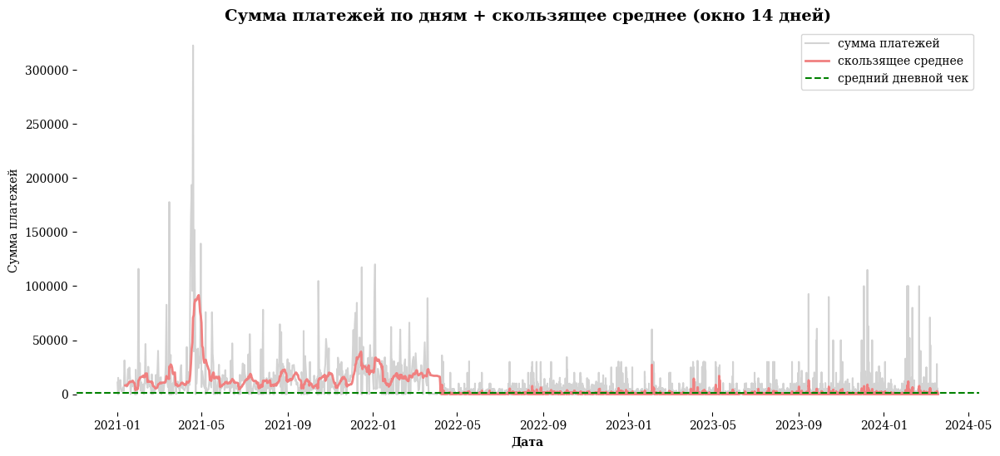

In [198]:
# Визуализируем динамику платежей по дням
plt.figure(figsize=(14, 6))

# Основной график продаж
ax = sns.lineplot(data=payments_sorted.groupby('order_first_action_datetime')['order_total_price'].sum(),
             label='сумма платежей',
             color='lightgrey')
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)

# График продаж со скользящим средним (14 дней)
sns.lineplot(data=payments_sorted.groupby('order_first_action_datetime')['order_total_price'].sum().rolling(14).mean(),
             label='скользящее среднее',
             color='lightcoral',
             linewidth=2)

# Линия средней дневной продажи
plt.axhline(y=payments_sorted.groupby('order_first_action_datetime')['order_total_price'].sum().mean(),
            linestyle='--',
            label='средний дневной чек',
            color='green',
            linewidth=1.5)

plt.legend(prop={'family': 'serif'})
plt.title('Сумма платежей по дням + скользящее среднее (окно 14 дней)', fontdict=dict(size=14, weight='bold', family='serif'))
plt.xlabel('Дата', fontfamily='serif', fontweight='bold')
plt.ylabel('Сумма платежей', fontfamily='serif')
plt.xticks(fontfamily='serif')
plt.yticks(fontfamily='serif')

plt.show()

Итак, на графике хорошо видно, что пик поступлений приходился на май 2021 года, а с января 2022 года мы видим падение поступлений, так что в среднем в день поступает около 743 рублей. Есть небольшие пики зимой 2023 года, например. Также есть тенденция к росту поступлений, начиная с осени 2023 года. Насколько мне известно, как раз в этот период для фонда был проведен анализ данных, что позволило, по-словам заказчика, увеличить годовую сумму платежей примерно в 1.5 раза.

<span style="color:blue; font-size:17px">Пользователи, жертвующие крупные суммы</span>

In [199]:
# Посмотрим на выбросы по столбцу order_total_price, которые мы обнаружили ранее на этапе EDA
percentile_99_orders

10000.0

In [200]:
# Посмотрим, как много пользователей делали пожертвования более 10 000 руб.
len(orders.query('order_total_price > 10000 & order_is_paid == "paid"'))

275

In [201]:
# Посмотрим на уникальные суммы для этих человек
', '.join(map(str, sorted(orders.query('order_total_price > 10000 & order_is_paid == "paid"')['order_total_price'].unique())))

'10200, 10300, 10500, 10800, 10870, 11000, 11500, 12000, 12200, 12250, 13000, 13366, 13500, 13660, 13750, 13842, 14000, 14395, 14400, 14500, 14586, 14600, 15000, 15500, 16000, 17000, 17250, 18000, 19620, 19800, 20000, 20700, 21000, 21200, 21327, 21850, 22452, 23000, 24000, 24500, 24731, 24804, 25000, 25500, 26000, 26800, 27000, 28000, 29000, 30000, 33000, 35000, 40000, 45000, 45500, 49000, 50000, 52100, 55392, 60000, 60700, 63000, 70000, 80000, 90000, 92700, 100000, 115000, 160000, 200000'

In [202]:
# Посмотрим, сколько раз пользователи переводили одинаковые суммы
orders.query('order_total_price > 10000 & order_is_paid == "paid"')['order_total_price'].value_counts()[:20]

order_total_price
30000     62
20000     41
25000     36
15000     24
100000     8
12250      8
50000      7
12000      6
40000      5
17000      3
23000      3
16000      3
10500      3
10300      3
14000      3
13500      3
11000      3
13000      2
24500      1
90000      1
Name: count, dtype: int64

In [203]:
# Выгрузим id этих пользователей для последующей работы фонда с ними
ids_big_money = orders.query('order_total_price > 10000 & order_is_paid == "paid"')['order_customer_mindbox_id']
print(ids_big_money.tolist())

[8903, 9536, 9778, 12114, 13467, 13467, 14804, 14819, 14970, 15310, 15310, 15576, 15524, 16397, 16397, 16668, 17115, 17101, 17545, 17545, 17926, 18464, 18473, 18473, 18473, 18531, 18531, 18684, 18684, 18697, 18975, 19196, 19196, 19336, 19336, 19336, 19336, 19336, 19336, 19336, 19336, 19473, 19473, 19473, 19568, 19568, 19568, 19568, 19862, 19862, 19862, 20449, 20714, 20761, 20965, 21202, 21202, 21202, 21202, 21202, 21376, 22222, 22368, 22751, 22805, 22805, 22805, 23144, 23124, 23217, 23852, 23940, 24350, 24553, 24688, 25065, 25174, 25248, 25248, 25248, 25380, 25380, 25380, 25380, 25494, 25494, 25494, 25502, 25705, 25772, 25772, 25772, 25772, 25861, 26211, 26231, 27106, 27151, 27941, 27997, 29607, 29607, 30129, 30129, 30743, 30696, 30696, 30772, 30857, 30857, 30857, 30892, 30981, 31114, 31114, 31114, 31114, 31114, 31114, 31114, 31114, 31114, 31114, 31182, 31395, 31593, 31593, 31601, 31593, 31593, 31593, 31973, 31990, 32008, 32008, 32026, 32026, 32026, 32009, 32026, 32026, 32026, 32026, 3

In [204]:
# Сделаем срез по датасету orders c этими пользователями
orders_big_money = orders[orders['order_customer_mindbox_id'].isin(ids_big_money)]
orders_big_money = orders_big_money.query('order_is_paid == "paid"')
len(orders_big_money)

854

Данные пользователи явно не по одному раз отправляли деньги.

In [205]:
# Сгруппируем пользователей id, посчитаем суммы платежей и возьмем топ-20
top_20_big_money = (orders_big_money
                    .groupby('order_customer_mindbox_id')
                    .agg(min_date=('order_first_action_date', 'min'),
                         max_date=('order_first_action_date', 'max'),
                         total_price=('order_total_price', 'sum'),
                         count=('order_total_price', 'count'),
                         segment=('client_type', 'unique'))
                    .sort_values(by='total_price', ascending=False)[:20]
                    .reset_index())
top_20_big_money['lifetime'] = (top_20_big_money['max_date'] - top_20_big_money['min_date']).dt.days
top_20_big_money

,order_customer_mindbox_id,min_date,max_date,total_price,count,segment,lifetime
0,35099,2023-02-03,2024-03-16,1072500,51,[новый],407
1,35098,2023-02-03,2023-11-07,556600,27,[новый],277
2,31114,2022-08-17,2024-03-06,328000,30,[новый],567
3,33283,2023-05-30,2024-03-17,325000,12,[новый],292
4,19336,2021-02-10,2022-02-09,315000,8,[крупный неактивный],364
5,32026,2022-09-14,2024-03-07,246200,15,[новый],540
6,18975,2021-03-04,2022-04-12,242000,23,[крупный неактивный],404
7,45090,2024-02-03,2024-02-06,233100,5,[крупный],3
8,42006,2023-10-20,2024-02-10,230000,3,[новый],113
9,25380,2022-04-09,2024-03-11,229158,47,[новый],702


Предварительно можно сказать следующее:
- пользователи, жертвующие крупные суммы - либо новые, либо крупные неактивные;
- есть как пользователи с длинным лайфтаймом (2-3 года), так и пользователи однодневки;
- например, пользователь, пожертвовавший за 1 раз 200 000 рублей, больше не вернулся в фонд. Далее посмотрим, на какой именно кейс он среагировал;
- пользователь, пожертвовавший больше всего денег, сделал 51 переводов примерно за год, пришел он в феврале 2023 года. К таким пользователям должно быть персональное отношение.

In [206]:
# Делаем срез по данным с информацией о поле и регионе
donors_big_money = donors[donors['customer_mindbox_id'].isin(top_20_big_money['order_customer_mindbox_id'])][['customer_mindbox_id', 
                                                                                                              'customer_gender', 
                                                                                                              'customer_area_name', 
                                                                                                              'client_type']]
donors_big_money

,customer_mindbox_id,customer_gender,customer_area_name,client_type
2719,18975,male,Москва,крупный неактивный
2924,19336,male,Vienna,крупный неактивный
3010,19473,male,NaN,крупный неактивный
3258,19862,female,Vienna,новый
4739,22368,female,Салехард,крупный неактивный
6101,24553,female,Vienna,крупный неактивный
6590,25248,NaN,NaN,новый
6694,25380,male,NaN,новый
10305,31114,male,NaN,новый
10723,31593,male,NaN,новый


In [207]:
donors_big_money['customer_gender'].value_counts()

customer_gender
male      8
female    8
Name: count, dtype: int64

По нашему пользователю, пожертвовашему большую сумму в течение года мы можем сказать, к сожалению, только то, что это женщина. Пользователь, пожертвовавший 200 000 руб. за один раз, тоже женщина, проживающая в Вене. Но в нашей топ-20ке мужчин все-же больше в 1.5 раза, чем женщин. Еще один крупный пользователь - мужчина из Салехарда, перечисливший 160 000 рублей за один раз. Вообще, повторюсь, к там людям нужен персональный подход, чтобы понимать, в каких случаях к ним можно обратиться точечно за помощью. Возможно, они реагируют на сборы, близкие им по ситуации, возможно, они уже сталкивались с этим в жизни и помогают адресно людям с такими же диагнозами.

In [208]:
# Делаем срез по кампаниям, источникам
channels_big_money = channels[channels['user_id'].isin(top_20_big_money['order_customer_mindbox_id'])][['user_id', 'utm_campaign', 
                                                                                                        'utm_source']]
channels_big_money.dropna(inplace=True)
channels_big_money_to_list = channels_big_money.groupby('user_id')[['utm_campaign', 'utm_source']].agg(list).reset_index()
channels_big_money_to_list

,user_id,utm_campaign,utm_source
0,18975,[269123001],[UniSender]
1,19336,[news-february],[mindbox]
2,19862,"[promo, welcome]","[dobroe-aif.ru/ostanin, mindbox]"
3,25248,"[thanks-to-the-recurrents, snezhana-o, new-year, kristina razzhivina, 270103501, maryana-cheshev...","[mindbox, mindbox, mindbox, mindbox, UniSender, mindbox, mindbox, mindbox, mindbox, mindbox, min..."
4,25380,[promo],[dobroe-aif.ru/ostanin]
5,31114,"[nikita-yakovlev, maksim-shirokin, nikita-yakovlev, nikita-yakovlev, kristina razzhivina, thanks...","[mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mts, mindbox, mindbox, mindbox, ..."
6,31593,"[nikita-yakovlev, savelij-sungurov, invitation-recurrent, happy-historyaleksandra-cherneta, happ...","[mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox]"
7,32026,"[new-year, maksim-shirokin, kristina razzhivina, need-help, nikita-kurakin, ruslan-safronov, ale...","[mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindb..."
8,35098,"[nikita-kurakin, german-i-grigorij-alymovy]","[mindbox, mindbox]"
9,35099,"[thanks-for-donation, kristina razzhivina, darya-ivanova, thanks-for-donation, thanks-for-donati...","[mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox]"


In [209]:
# Посмотрим, есть ли какие-либо лидирующие по сборам компании в нашей топ-20
channels_big_money['utm_campaign'].value_counts()

utm_campaign
new-year                            19
thanks-for-donation                 10
sergej-golubkov                      9
nikita-yakovlev                      5
zahar-kuzmin                         4
kristina razzhivina                  4
german-i-grigorij-alymovy            3
happy-history                        3
ignatij-ovchinnikov                  3
savelij-sungurov                     3
kira-morgunova                       3
nikita-kurakin                       3
maksim-shirokin                      2
german-semyonov                      2
maryana-chesheva                     2
welcome                              2
invitation-recurrent                 2
happy-historyaleksandra-cherneta     2
snezhana-o                           2
promo                                2
aleksandra-shubina                   1
269123001                            1
cystic-fibrosis                      1
evgenij-synkov                       1
news-subscription                    1
1028540267  

Итого:
- 19 пожертвований по новогодней акции;
- 10 пожертвований по акции "Спасибо за пожертвование", похоже, что люди после получения благодарности за предыдущий перевод, перевели еще деньги. Если моя догадка верна, то это хороший способ работы с пользователями для привлечения от них дополнительных средств;
- по адресной помощи лидируют:
  - Сергей Голубков (15 лет, синдром короткой кишки, собрано 600 000  руб., 22.12.2023 года перечислено 438 651 рубль на оплату специального питания и медицинских изделий для ежедневной терапии);
  - Никита Яковлев (1 год, тригоноцефалия, собрано 892 771 руб., 15.02.2023 года перечислено 807 000 рублей на оплату медицинского изделия «Пластина прямолинейная и комплектующие» для проведения операции в «НПЦ спец. мед. помощи детям ДЗМ»);
  - Захар Кузьмин (15 лет, нарушение мимики с обеих сторон, состояние подобное синдрому Мебиуса, собрано 1 584 470 руб. микрохирургическую пересадку нейроваскулярных мышечных лоскутов с нижней конечности на лицо, на правую и левую половины);
  - Кристина Расживина (15 лет, легочная артериальная гипертензия, собрано 662 767 руб., перечислено 134 566 руб., 301 600 руб., 168 800 руб. на оплату лекарственных препаратов «Опсамит», «Вентавис», «Ревацио»);
  - Савелий Сунгуров (4 года, синдром удлиненного интервала QT, собрано 583 010 руб., 28.11.2022 года перечислено 464 673 руб. на оплату оперативного лечения в НИКИ педиатрии и детской хирургии им. Академика Ю. Е. Вельтищева);
  - Герман и Григорий Алымовы (3 года, висцеральная миопатия, собрано 1 980 583 руб., средства семье переводились несколькими траншами  на оплату специального питания, медицинских изделий для ежедневной терапии и расходов, связанных с лечением основного заболевания и на оплату медицинского оборудования «Инфузомат»);
  - Никита Куракин (13 лет, наследственный синдром удлинённого интервала QT, собрано  571 230 руб., 25.09.2023 года переведено 544 717 руб. на оплату проведения видеоторакоскопической левосторонней симпатэктомии в НИКИ педиатрии им. академика Ю.Е. Вельтищева);
  - Игнатий Овчинников (4 года, муковисцидоз, собрано 715 652 руб., средства переводились несколькими траншами на оплату лекарственных препаратов, питания и медицинского оборудования) и др.
  
Что за акция "happy-history", к сожалению, понять не удалось.

Какие-либо параллели сложно находить, но могу сказать, что многие подопечные фонда - подростки, которым нужна пожизненная помощь на лекарства, и то что есть люди, которые жертвуют для этого крупные суммы, очень радует.

К сожалению, не по всем крупным жертвователям есть информация по кампаниям.

In [210]:
# Посмотрим, для кого  конкретно переводил деньги пользователь с самой большой суммой пожертвования за год
channels_big_money.query('user_id == 35099')['utm_campaign'].value_counts()

utm_campaign
thanks-for-donation    5
kristina razzhivina    1
darya-ivanova          1
welcome                1
happy-history          1
Name: count, dtype: int64

Все назначения его переводов неизвестны, к сожалению, но 7 из них были неадресные. И снова мы видим акцию "Спасибо за пожертвование". Тут явно есть точка для роста.

In [211]:
# Объединяем данные по компаниях и по данным о клиентах для последующей работы с ними со стороны фонда
big_money_data = (top_20_big_money
                  .merge(donors_big_money, left_on='order_customer_mindbox_id', right_on='customer_mindbox_id', how='left')
                  .merge(channels_big_money_to_list, left_on='order_customer_mindbox_id', right_on='user_id', how='left'))
big_money_data.drop(columns=['customer_mindbox_id', 'user_id'], inplace=True)
big_money_data

,order_customer_mindbox_id,min_date,max_date,total_price,count,segment,lifetime,customer_gender,customer_area_name,client_type,utm_campaign,utm_source
0,35099,2023-02-03,2024-03-16,1072500,51,[новый],407,female,NaN,новый,"[thanks-for-donation, kristina razzhivina, darya-ivanova, thanks-for-donation, thanks-for-donati...","[mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox]"
1,35098,2023-02-03,2023-11-07,556600,27,[новый],277,NaN,NaN,новый,"[nikita-kurakin, german-i-grigorij-alymovy]","[mindbox, mindbox]"
2,31114,2022-08-17,2024-03-06,328000,30,[новый],567,male,NaN,новый,"[nikita-yakovlev, maksim-shirokin, nikita-yakovlev, nikita-yakovlev, kristina razzhivina, thanks...","[mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mts, mindbox, mindbox, mindbox, ..."
3,33283,2023-05-30,2024-03-17,325000,12,[новый],292,male,NaN,новый,NaN,NaN
4,19336,2021-02-10,2022-02-09,315000,8,[крупный неактивный],364,male,Vienna,крупный неактивный,[news-february],[mindbox]
5,32026,2022-09-14,2024-03-07,246200,15,[новый],540,NaN,NaN,новый,"[new-year, maksim-shirokin, kristina razzhivina, need-help, nikita-kurakin, ruslan-safronov, ale...","[mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindbox, mindb..."
6,18975,2021-03-04,2022-04-12,242000,23,[крупный неактивный],404,male,Москва,крупный неактивный,[269123001],[UniSender]
7,45090,2024-02-03,2024-02-06,233100,5,[крупный],3,female,NaN,крупный,NaN,NaN
8,42006,2023-10-20,2024-02-10,230000,3,[новый],113,female,NaN,новый,"[nikita-yakovlev, thanks-for-donation, zahar-kuzmin, zahar-kuzmin, zahar-kuzmin]","[mindbox, mindbox, mindbox, mindbox, mindbox]"
9,25380,2022-04-09,2024-03-11,229158,47,[новый],702,male,NaN,новый,[promo],[dobroe-aif.ru/ostanin]


Рекомендация заказчику:
- изучить кейсы, на которые жертвовали люди из списка топ_20 или из списка пожертвований больше 10 000 рублей, и попробовать найти параллели, на что именно среагировали пользователи и работать с ними точечно;
- использовать акцию "Спасибо за пожертвование" для привлечения дополнительных средств от пользователей.

<span style="color:blue; font-size:17px">Источники входа</span>

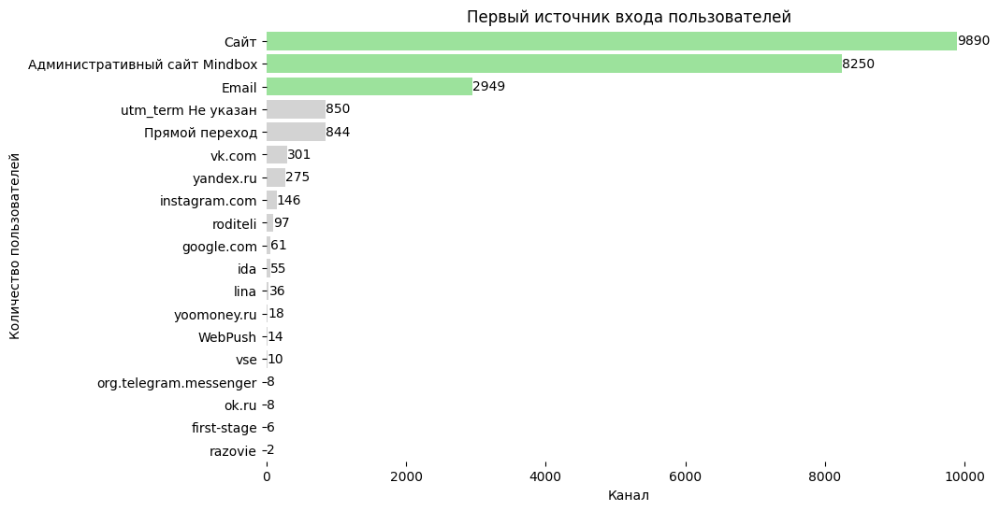

In [212]:
# Найдем источник первого входа для каждого пользователя
channels_first = (channels.sort_values(['user_id', 'action_date'])
    .drop_duplicates(subset=['user_id'], keep='first')
    [['user_id', 'channel']] # оставляем только пользователя и источник, который и будет первым
    )
# Посчитаем количество пользователей для каждого источника
channels_first_count = channels_first['channel'].value_counts()
channels_first_count = channels_first_count.sort_values(ascending=False)

# Визуализируем данные о канале первого источника
plt.figure(figsize=(10, 6))

colors = ['lightgrey'] * 20
colors[0], colors[1], colors[2] = 'lightgreen', 'lightgreen', 'lightgreen'

ax = sns.countplot(data=channels_first,
               y='channel',
               order=channels_first_count.index,
               palette=colors, orient='h')

plt.xlabel('Канал')
plt.ylabel('Количество пользователей')
plt.title('Первый источник входа пользователей')

# Убираем рамки
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)

# Добавляем подписи с количеством пользователей
for p in ax.patches:
    ax.text(p.get_width() + 0.1,  # координата X для текста
            p.get_y() + p.get_height() / 2,  # координата Y для текста
            f'{int(p.get_width())}',  # текст с количеством пользователей (целое число)
            ha='left',  # горизонтальное выравнивание текста
            va='center')  # вертикальное выравнивание текста

plt.show()

Итак, топ-5 источников по первому входу пользователей, если отбросить административный сайт и отсутствие данных, это: сайт, email, прямой переход, vk.com и yandex.ru.

In [213]:
# Найдем источник первого входа по сегментам
channels_first_segment = (channels.sort_values(['user_id', 'action_date', 'client_type'])
    .drop_duplicates(subset=['user_id'], keep='first')
    [['user_id', 'channel', 'client_type']] # оставляем только пользователя и источник, который и будет первым
    )
# Считаем количество пользователей для каждого источника и сегмента client_type
channels_first_count_by_segment = channels_first_segment.groupby(['client_type', 'channel']).size().reset_index(name='user_count')

# Сортируем данные по количеству пользователей
channels_first_count_by_segment = channels_first_count_by_segment.sort_values(by=['client_type', 'user_count'], ascending=[True, False])

# Отбираем топ-2 источника для каждого сегмента
top_channels_first_count_by_segment = channels_first_count_by_segment.groupby('client_type').head(2).reset_index(drop=True)

top_channels_first_count_by_segment

,client_type,channel,user_count
0,ключевой,Сайт,8
1,ключевой,Email,2
2,крупный,Сайт,91
3,крупный,Email,14
4,крупный неактивный,Административный сайт Mindbox,1997
5,крупный неактивный,Сайт,1433
6,лояльный,Сайт,9
7,лояльный,Email,1
8,неактивный,Сайт,1957
9,неактивный,Email,692


Первый источник входа для всех сегментов пользователей - это сайт.

<span style="color:blue; font-size:17px">Активность по дням недели</span>

In [214]:
# Активность по дням недели
activity_by_day_historical = (historical_donors_orders
                              .groupby(historical_donors_orders['order_first_action_date'].dt.day_name())['order_customer_mindbox_id']
                              .count())
activity_by_day_new = (new_donors_orders
                       .groupby(new_donors_orders['order_first_action_date'].dt.day_name())['order_customer_mindbox_id'].count())
activity_by_day_all = orders.groupby(orders['order_first_action_date'].dt.day_name())['order_customer_mindbox_id'].count()

print('Активность исторических пользователей по дням недели:')
print(activity_by_day_historical)
print()
print('Активность новых пользователей по дням недели:')
print(activity_by_day_new)
print()
print('Активность пользователей по дням недели по всему датасету:')
print(activity_by_day_all)

Активность исторических пользователей по дням недели:
order_first_action_date
Friday       4098
Monday       3623
Saturday     3312
Sunday       2970
Thursday     4794
Tuesday      5003
Wednesday    4664
Name: order_customer_mindbox_id, dtype: int64

Активность новых пользователей по дням недели:
order_first_action_date
Friday       7488
Monday       5487
Saturday     7889
Sunday       4469
Thursday     6587
Tuesday      6784
Wednesday    6595
Name: order_customer_mindbox_id, dtype: int64

Активность пользователей по дням недели по всему датасету:
order_first_action_date
Friday       11586
Monday        9110
Saturday     11201
Sunday        7439
Thursday     11381
Tuesday      11787
Wednesday    11259
Name: order_customer_mindbox_id, dtype: int64


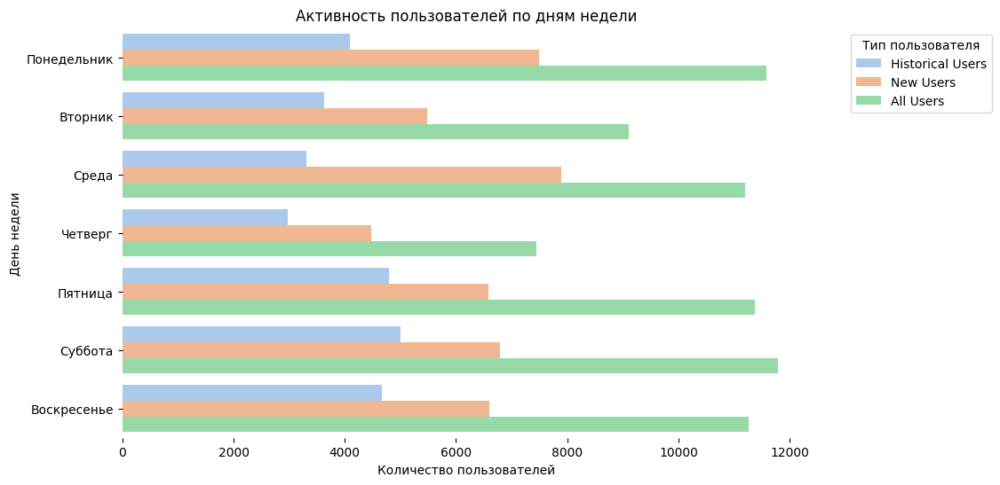

In [215]:
# Визуализируем данные
activity_week_days = pd.DataFrame({
    'Day': ['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'],
    'Historical Users': activity_by_day_historical.values,
    'New Users': activity_by_day_new.values,
    'All Users': activity_by_day_all.values
})

# Располагаем данные в столбцах для каждого дня недели
activity_week_days_melted = activity_week_days.melt(id_vars='Day', var_name='User Type', value_name='Activity Count')

# Создаем горизонтальную столбчатую диаграмму
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=activity_week_days_melted, x='Activity Count', y='Day', hue='User Type', palette='pastel')

plt.xlabel('Количество пользователей')
plt.ylabel('День недели')
plt.title('Активность пользователей по дням недели')
plt.legend(title='Тип пользователя', bbox_to_anchor=(1.05, 1))

for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)

plt.show()

Исторические пользователи более активны по пятницам, субботам и воскресеньям, вспомним, что среди них много людей из Вены, получается время европейского уикенда. Новые пользователи чаще активные по понедельникам и средам. Если речь идет о пользователях из России, особенно женщинах, то в выходные включать компьютер особо некогда, семьи, дети, быт, а вот в понедельник, выйдя на работу, можно со спокойной душой проверить почту, изучить рассылки, например, в обеденный перерыв. По общим данным, наиболее активные дни: понедельник и суббота.

In [216]:
# Найдем наиболее активный день для каждого сегмента
activity_by_day_segment = (orders
                           .groupby(['client_type', orders['order_first_action_date'].dt.day_name()])['order_customer_mindbox_id']
                           .count()
                           .reset_index(name='user_count'))

# Найдем наиболее активный день для каждого сегмента
most_active_day_segment = (activity_by_day_segment.loc[activity_by_day_segment
                           .groupby('client_type')['user_count'].idxmax()]
                           .reset_index(drop=True))
most_active_day_segment

,client_type,order_first_action_date,user_count
0,ключевой,Monday,15
1,крупный,Thursday,106
2,крупный неактивный,Wednesday,2486
3,лояльный,Friday,13
4,неактивный,Thursday,1068
5,новый,Tuesday,7311
6,почти потерянный,Wednesday,37
7,ушедший,Wednesday,953


Интересная получается история. По выходным при анализе сегментов активности вообще нет, у неактивных и потерянных пользователей самой активной была среда. У ключевых, крупных и новых - понедельник, четверг, вторник!

<span style="color:blue; font-size:17px">Активность по времени суток</span>

In [217]:
# Активность по времени суток
activity_by_time_historical = (historical_donors_orders
                               .groupby(historical_donors_orders['order_first_action_datetime'].dt.hour)['order_customer_mindbox_id']
                               .count())
activity_by_time_new = (new_donors_orders
                        .groupby(new_donors_orders['order_first_action_datetime'].dt.hour)['order_customer_mindbox_id'].count())
activity_by_time_all = orders.groupby(orders['order_first_action_datetime'].dt.hour)['order_customer_mindbox_id'].count()

print('Активность исторических пользователей по времени суток:')
print(activity_by_time_historical.sort_values(ascending=False))
print()
print('Активность новых пользователей по времени суток:')
print(activity_by_time_new.sort_values(ascending=False))
print()
print('Активность всех пользователей по времени суток:')
print(activity_by_time_all.sort_values(ascending=False))

Активность исторических пользователей по времени суток:
order_first_action_datetime
0     13249
9      1211
12     1130
13     1007
10      991
7       956
8       942
14      897
11      890
6       838
16      829
18      739
17      735
15      696
5       587
19      533
20      524
3       413
4       399
21      246
1       219
2       213
22      143
23       77
Name: order_customer_mindbox_id, dtype: int64

Активность новых пользователей по времени суток:
order_first_action_datetime
15    3006
14    2728
9     2623
16    2614
10    2570
8     2528
13    2481
11    2445
12    2437
17    2396
7     2372
18    2254
6     2121
19    2100
5     1846
20    1571
4     1424
0     1394
21    1102
3     1032
22     762
2      627
1      474
23     392
Name: order_customer_mindbox_id, dtype: int64

Активность всех пользователей по времени суток:
order_first_action_datetime
0     14643
9      3834
15     3702
14     3625
12     3567
10     3561
13     3488
8      3470
16     3443
11     33

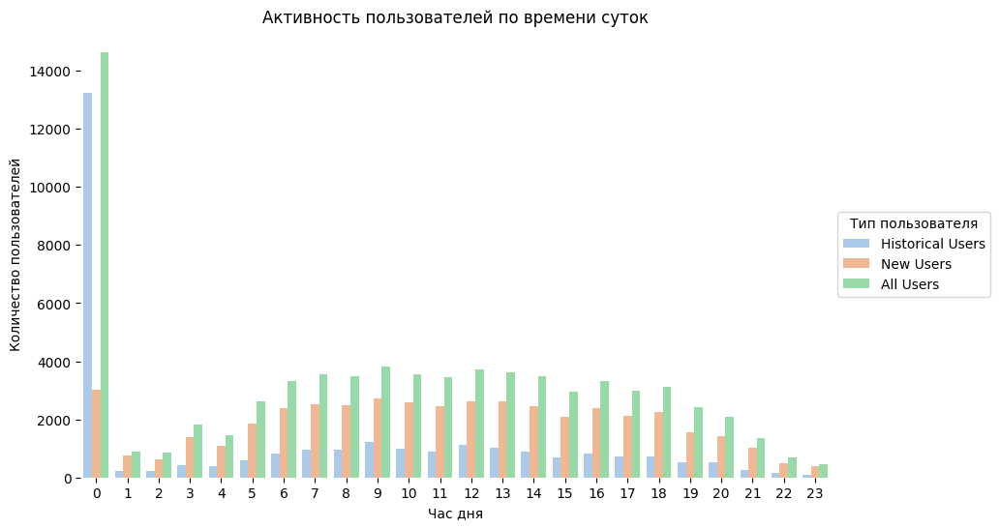

In [218]:
# Визуализируем данные
# Сортируем данные по количеству активности
activity_by_time_historical_sorted = activity_by_time_historical.sort_values(ascending=False)
activity_by_time_new_sorted = activity_by_time_new.sort_values(ascending=False)
activity_by_time_all_sorted = activity_by_time_all.sort_values(ascending=False)

# Создаем датасет для активности по времени суток
activity_data = pd.DataFrame({
    'Hour of Day': activity_by_time_historical_sorted.index,
    'Historical Users': activity_by_time_historical_sorted.values,
    'New Users': activity_by_time_new_sorted.values,
    'All Users': activity_by_time_all_sorted.values
})

# Располагаем данные в столбцах для каждого часа
activity_data_melted = activity_data.melt(id_vars='Hour of Day', var_name='User Type', value_name='Activity Count')

# Создаем график
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=activity_data_melted, x='Hour of Day', y='Activity Count', hue='User Type', palette='pastel')

plt.xlabel('Час дня')
plt.ylabel('Количество пользователей')
plt.title('Активность пользователей по времени суток')
plt.legend(title='Тип пользователя', loc='center left', bbox_to_anchor=(1, 0.5))

# Убираем рамки
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)

plt.show()

В целом, видим три пика активности: 9 утра, 12-13 дня, ночные часы.

In [219]:
# Разобьем данные на интервалы для визуализации
def categorize_time(hour):
    if hour > 0 and hour <= 6:
        return 'Ночь'
    elif hour > 6 and hour <= 12:
        return 'Утро'
    elif hour > 12 and hour <= 18:
        return 'День'
    else:
        return 'Вечер'

In [220]:
# Добавим новый столбец к датасетам
historical_donors_orders['time_interval'] = historical_donors_orders['order_first_action_datetime'].dt.hour.apply(categorize_time)
new_donors_orders['time_interval'] = new_donors_orders['order_first_action_datetime'].dt.hour.apply(categorize_time)
orders['time_interval'] = orders['order_first_action_datetime'].dt.hour.apply(categorize_time)

In [221]:
# Посчитаем количество активных пользователей по интервалам
activity_by_time_historical = historical_donors_orders.groupby('time_interval')['order_customer_mindbox_id'].count()
activity_by_time_new = new_donors_orders.groupby('time_interval')['order_customer_mindbox_id'].count()
activity_by_time_all = orders.groupby('time_interval')['order_customer_mindbox_id'].count()

print('Активность исторических пользователей по времени суток:')
print(activity_by_time_historical)
print()
print('Активность новых пользователей по времени суток:')
print(activity_by_time_new)
print()
print('Активность всех пользователей по времени суток:')
print(activity_by_time_all)

Активность исторических пользователей по времени суток:
time_interval
Вечер    14772
День      4903
Ночь      2669
Утро      6120
Name: order_customer_mindbox_id, dtype: int64

Активность новых пользователей по времени суток:
time_interval
Вечер     7321
День     15479
Ночь      7524
Утро     14975
Name: order_customer_mindbox_id, dtype: int64

Активность всех пользователей по времени суток:
time_interval
Вечер    22093
День     20382
Ночь     10193
Утро     21095
Name: order_customer_mindbox_id, dtype: int64


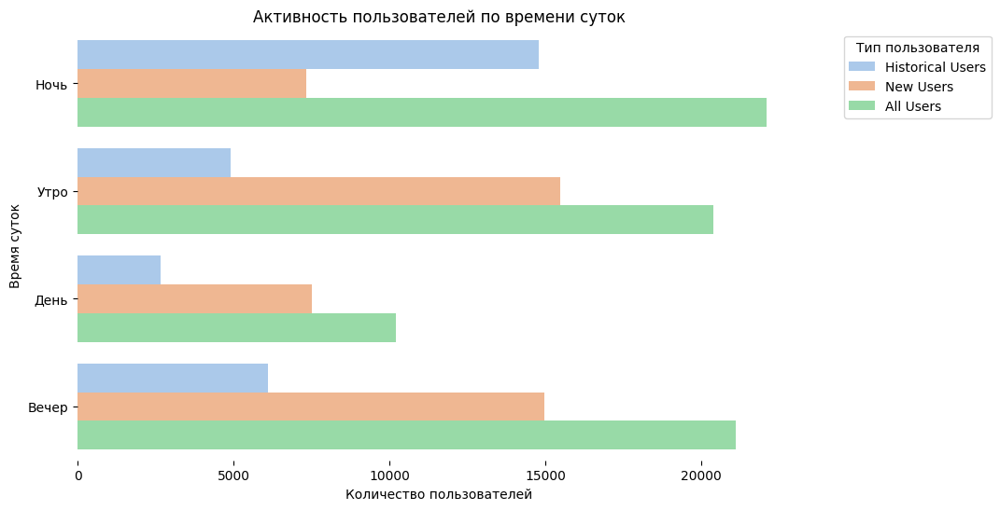

In [222]:
# Визуализируем данные
activity_by_time_interval = pd.DataFrame({
    'Time of Day': ['Ночь', 'Утро', 'День', 'Вечер'],
    'Historical Users': activity_by_time_historical.values,
    'New Users': activity_by_time_new.values,
    'All Users': activity_by_time_all.values
})

# Располагаем данные в столбцах для каждой категории времени суток
activity_by_time_interval_melted = activity_by_time_interval.melt(id_vars='Time of Day', var_name='User Type', value_name='Activity Count')

plt.figure(figsize=(10, 6))
ax = sns.barplot(data=activity_by_time_interval_melted, x='Activity Count', y='Time of Day', hue='User Type', palette='pastel')

plt.xlabel('Количество пользователей')
plt.ylabel('Время суток')
plt.title('Активность пользователей по времени суток')
plt.legend(title='Тип пользователя', bbox_to_anchor=(1.05, 1))

# Убираем рамки
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)


plt.show()

Итак, наши исторические пользователи наиболее активны в ночное время (или вечернее время по Европе), новые - утром и вечером, в целом активность самая низкая днем.

In [223]:
# Найдем наиболее активное время дня для каждого сегмента
activity_by_time_segment = (orders
                            .groupby(['client_type', orders['time_interval']])['order_customer_mindbox_id']
                            .count()
                            .reset_index(name='user_count'))
active_time_segment_distribution = (activity_by_time_segment
                                    .pivot_table(index='client_type', columns='time_interval', values='user_count', aggfunc='sum'))

# Выделим максимальные значения построчно цветом
max_values = active_time_segment_distribution.max(axis=1)

# Создаем DataFrame с булевыми значениями: True, если значение в ячейке равно максимальному в строке, иначе False
highlight = active_time_segment_distribution.eq(max_values, axis=0)

# Применяем стили для выделения максимальных значений
active_time_segment_distribution = active_time_segment_distribution.style.apply(lambda x: ['background-color: lightblue' \
                                                                    if cell else '' for cell in highlight.loc[x.name]], axis=1)
active_time_segment_distribution

time_interval,Вечер,День,Ночь,Утро
client_type,,,,
ключевой,9,15,10,12
крупный,121,181,66,154
крупный неактивный,7268,2772,1787,3204
лояльный,15,4,3,36
неактивный,1179,1852,1148,1936
новый,9572,10653,6100,13147
почти потерянный,81,42,7,35
ушедший,3135,888,439,995


У ушедших активное время  3 часа ночи, это, например, 12 ночи по Вене. Все-таки много клиентов ушло из-за невозможности перевода средств из-за рубежа. У активных клиентов это дневные часы по Москве и поздний вечер.

<span style="color:blue; font-size:17px">Топ-10 по пожертвованиям</span>

In [224]:
# Топ-10 по пожертвованиям
top_donations_historical = (historical_donors_orders
                            .query('order_is_paid == "paid"')
                            .groupby('order_product_name')['order_total_price'].sum().sort_values(ascending=False).head(10))
top_donations_new = (new_donors_orders
                     .query('order_is_paid == "paid"')
                     .groupby('order_product_name')['order_total_price'].sum().sort_values(ascending=False).head(10))
top_donations_all = (orders
                     .query('order_is_paid == "paid"')
                     .groupby('order_product_name')['order_total_price'].sum().sort_values(ascending=False).head(10))

print('Топ-10 по пожертвованиям среди исторических пользователей:')
print(top_donations_historical)
print()
print('Топ-10 по пожертваваниям среди новых пользователей:')
print(top_donations_new)
print()
print('Топ-10 по пожертваваниям среди всех пользователей:')
print(top_donations_all)

Топ-10 по пожертвованиям среди исторических пользователей:
order_product_name
На уставную деятельность                                          8018538
Пожертвование (хочу помочь)                                       1391315
Пожертвование на уставную деятельность БФ «АиФ. Доброе сердце»     871781
Варвара Лукинова                                                   484017
Егор Цуканов                                                       282561
Максим Широкин                                                     251207
Артём Матвеев                                                      226451
Тимур Батуллин                                                     207080
Никита Суриков                                                     204460
Анастасия Радостева                                                188321
Name: order_total_price, dtype: int64

Топ-10 по пожертваваниям среди новых пользователей:
order_product_name
Пожертвование (хочу помочь)                                       160485

Для всех пользователей едино то, что больше всего пожертвований приходит на уставную деятельность и на продукт "Пожертвование (хочу помочь)", который, вероятно, подразумевает, что фонд сам решает, кому отправить средства.

In [225]:
# Посмотрим на топ-3 по пожертвованиям по сегментам
product_sales_by_segment = orders.groupby(['order_product_name', 'client_type'])['order_total_price'].sum().reset_index()

# Найдем топ-3 продуктов по сумме продаж для каждого сегмента
top_products_by_segment = (product_sales_by_segment
                           .groupby('client_type').apply(lambda x: x.nlargest(3, 'order_total_price')).reset_index(drop=True))
top_products_by_segment

,order_product_name,client_type,order_total_price
0,Виктория Костина,ключевой,35100
1,Захар Кузьмин,ключевой,10500
2,Артём Матвеев,ключевой,9000
3,Григорий Белослюдцев,крупный,255100
4,Софья Пантурова,крупный,138900
5,Ясмина Байсаева,крупный,61694
6,На уставную деятельность,крупный неактивный,5655986
7,Пожертвование (хочу помочь),крупный неактивный,939761
8,Егор Цуканов,крупный неактивный,820231
9,Захар Зверев,лояльный,906


Крупные и ключевые клиенты оказывают помощь адресно, новые клиенты предпочитают отправить средства на уставную деятельность и на усмотрение фонда.

[Возврат к описанию проекта](#toc)

<a id="16"></a>
<span style="color:green; font-size:22px">Маркетинговые метрики</span>

<span style="color:blue; font-size:17px">Каналы привлечения</span>

In [226]:
# Найдем топ-10 каналов привлечения пользователей
channel_analysis_historical = historical_donors_channels.groupby('utm_source')['user_id'].count().sort_values(ascending=False)
channel_analysis_new = new_donors_channels.groupby('utm_source')['user_id'].count().sort_values(ascending=False)
channel_analysis_all = new_donors_channels.groupby('utm_source')['user_id'].count().sort_values(ascending=False)
print('Каналы привлечения для исторических пользователей:')
print(channel_analysis_historical.head(10))
print()
print('Каналы привлечения для новых пользователей:')
print(channel_analysis_new.head(10))
print()
print('Каналы привлечения для всех пользователей:')
print(channel_analysis_all.head(10))

Каналы привлечения для исторических пользователей:
utm_source
mindbox          6492
vk                651
marketolog        646
UniSender         420
mtsmarketolog     336
aif_gazeta        189
dobroe.aif.ru      92
unisender          90
edna               82
aif_web            48
Name: user_id, dtype: int64

Каналы привлечения для новых пользователей:
utm_source
vk               11602
mindbox           8911
yandex-direct     1749
instagram         1570
marketolog        1227
aif_gazeta         748
mtsmarketolog      720
edna               410
aif_web            379
dobroe.aif.ru      224
Name: user_id, dtype: int64

Каналы привлечения для всех пользователей:
utm_source
vk               11602
mindbox           8911
yandex-direct     1749
instagram         1570
marketolog        1227
aif_gazeta         748
mtsmarketolog      720
edna               410
aif_web            379
dobroe.aif.ru      224
Name: user_id, dtype: int64


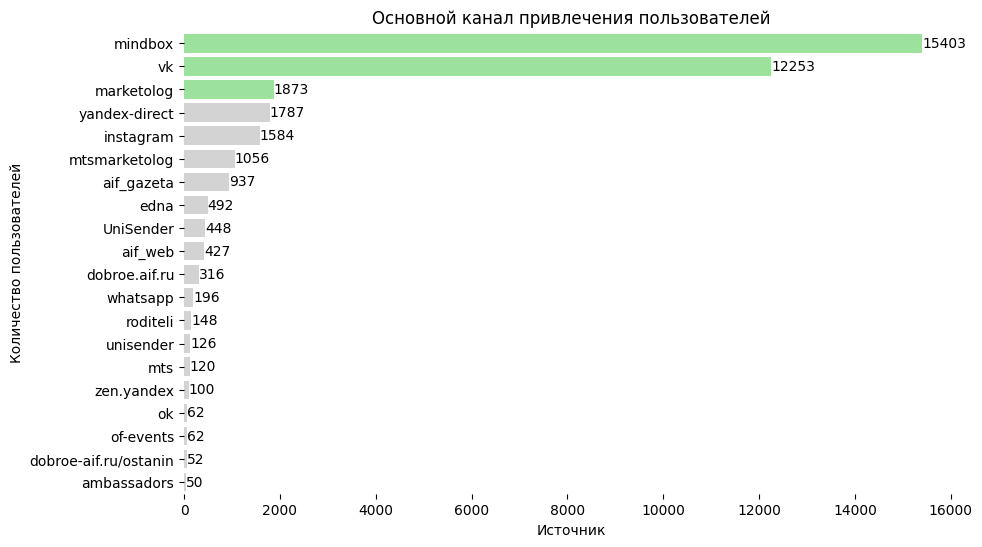

In [227]:
# Найдем топ_20 основных каналов привлечения для каждого пользователя
# Посчитаем количество пользователей для каждого канала
channels_main_source_count = channels['utm_source'].value_counts()
channels_main_source_count = channels_main_source_count.sort_values(ascending=False).head(20)

# Визуализируем данные
plt.figure(figsize=(10, 6))

colors = ['lightgrey'] * 20
colors[0], colors[1], colors[2] = 'lightgreen', 'lightgreen', 'lightgreen'

ax = sns.countplot(data=channels,
               y='utm_source',
               order=channels_main_source_count.index,
               palette=colors, orient='h')

plt.xlabel('Источник')
plt.ylabel('Количество пользователей')
plt.title('Основной канал привлечения пользователей')

# Убираем рамки
for spine in ['left', 'right', 'bottom', 'top']:
    ax.spines[spine].set_visible(False)

# Добавляем подписи с количеством пользователей
for p in ax.patches:
    ax.text(p.get_width() + 0.1,  # координата X для текста
            p.get_y() + p.get_height() / 2,  # координата Y для текста
            f'{int(p.get_width())}',  # текст с количеством пользователей (целое число)
            ha='left',  # горизонтальное выравнивание текста
            va='center')  # вертикальное выравнивание текста

plt.show()

Мы видим топ-20 основных каналов привлечения пользователей. Если отбросить административный сайт Mindbox, то лидируют VK, Marketolog, Yandex Direct, Instagram, MTS Marketolog.

In [228]:
# Найдем основные каналы привлечения для каждого сегмента
channels_first_count_by_segment = channels.groupby(['client_type', 'utm_source']).size().reset_index(name='user_count')

# Сортируем данные по количеству пользователей в каждом сегменте
channels_first_count_by_segment = channels_first_count_by_segment.sort_values(by=['client_type', 'user_count'], ascending=[True, False])

# Отбираем топ-3 канала для каждого сегмента
top_channels_first_count_by_segment = channels_first_count_by_segment.groupby('client_type').head(3).reset_index(drop=True)
top_channels_first_count_by_segment = top_channels_first_count_by_segment.pivot(index='client_type', columns='utm_source', 
                                                                                values='user_count').fillna(0).astype(int)
# Выделим максимальные значения построчно цветом
max_values = top_channels_first_count_by_segment.max(axis=1)

# Создаем DataFrame с булевыми значениями: True, если значение в ячейке равно максимальному в строке, иначе False
highlight = top_channels_first_count_by_segment.eq(max_values, axis=0)

# Применяем стили для выделения максимальных значений
top_channels_first_count_by_segment = top_channels_first_count_by_segment.style.apply(lambda x: ['background-color: lightblue' \
                                                                    if cell else '' for cell in highlight.loc[x.name]], axis=1)
top_channels_first_count_by_segment

utm_source,aif_gazeta,edna,instagram,marketolog,mindbox,mtsmarketolog,vk,yandex-direct
client_type,,,,,,,,
ключевой,0,2,0,0,0,3,6,0
крупный,11,0,0,0,38,0,50,0
крупный неактивный,0,0,0,0,2932,0,1112,626
лояльный,0,1,0,0,3,0,23,0
неактивный,0,0,0,0,1030,0,2032,370
новый,0,0,0,1187,10278,0,7607,0
почти потерянный,0,0,7,0,10,0,4,0
ушедший,0,0,840,0,579,0,192,0


Почти во всех сегментах лидирует VK, крупные неактивные и неактивные приходили также с Yandex Direct, новых приходит немало с Marketolog, а вот канал Instagram - лидер по уходу пользователей, причина в оттоке пользователей из Instagram в целом.

<span style="color:blue; font-size:17px">Акции и пики по платежам</span>

In [229]:
# Объединеним данные из orders и channels для исторических пользователей
historical_merged = historical_donors_orders.merge(historical_donors_channels[['user_id', 'utm_campaign']],
                                                   left_on='order_customer_mindbox_id',
                                                   right_on='user_id',
                                                   how='left').drop_duplicates()
historical_merged['year'] = historical_merged['order_first_action_date'].dt.year

# Объединеним данные из orders и channels для новых пользователей
new_merged = new_donors_orders.merge(new_donors_channels[['user_id', 'utm_campaign']],
                                     left_on='order_customer_mindbox_id',
                                     right_on='user_id',
                                     how='left').drop_duplicates()
new_merged['year'] = new_merged['order_first_action_date'].dt.year

# Объединеним данные из orders и channels для всех пользователей
orders_channels = orders.merge(channels[['user_id', 'utm_campaign']],
                                     left_on='order_customer_mindbox_id',
                                     right_on='user_id',
                                     how='left').drop_duplicates()
orders_channels['year'] = orders_channels['order_first_action_date'].dt.year

In [230]:
# Определим функцию для вывода пиковых акций для каждого вида пользователей по каждому году
def analyze_campaign_peaks(data, year, top_n=10):
    return (data.query(f'order_is_paid == "paid" & year == {year}')
                .groupby('utm_campaign')['order_total_price']
                .sum()
                .sort_values(ascending=False)
                .head(top_n))

years = [2021, 2022, 2023, 2024]
historical_peaks = {}
new_peaks = {}
all_peaks = {}

for year in years:
    historical_peaks[year] = analyze_campaign_peaks(historical_merged, year)
    new_peaks[year] = analyze_campaign_peaks(new_merged, year)
    all_peaks[year] = analyze_campaign_peaks(orders_channels, year)

# Определим функцию для отображения результатов в виде таблицы
def display_campaign_peaks(title, peaks):
    print(title)
    for year, data in peaks.items():
        print(f'\n{year}:')
        display(pd.DataFrame(data).reset_index().rename(columns={'index': 'utm_campaign', 'order_total_price': 'total_price'}))
    print()

# Выводим результат
display_campaign_peaks('Топ-10 кампаний для исторических пользователей по годам:', historical_peaks)
display_campaign_peaks('Топ-10 кампаний для новых пользователей по годам:', new_peaks)
display_campaign_peaks('Топ-10 кампаний для всех пользователей по годам:', all_peaks)

Топ-10 кампаний для исторических пользователей по годам:

2021:


,utm_campaign,total_price
0,new-year,603642
1,egor-czukanov,505814
2,darya-semenova,453789
3,oleg-romanov,428369
4,maksim-shirokin,399834
5,news-february,385038
6,anastasiya-radosteva,372402
7,kristina razzhivina,345762
8,maryana-chesheva,320501
9,german-semyonov,312684



2022:


,utm_campaign,total_price
0,new-year,1114472
1,anastasiya-radosteva,993480
2,maksim-shirokin,941393
3,maryana-chesheva,850875
4,nikita-yakovlev,685318
5,kristina razzhivina,679977
6,darya-semenova,674274
7,egor-czukanov,669587
8,snezhana-o,633106
9,oleg-romanov,618190



2023:


,utm_campaign,total_price
0,new-year,1377556
1,kristina razzhivina,1172344
2,darya-semenova,1125566
3,german-i-grigorij-alymovy,940670
4,anastasiya-radosteva,915959
5,nikita-kurakin,894714
6,ivan-zelenov,884090
7,oleg-romanov,868779
8,maksim-shirokin,853215
9,german-semyonov,849261



2024:


,utm_campaign,total_price
0,new-year,315603
1,darya-semenova,214651
2,kira-morgunova,213130
3,german-semyonov,193208
4,kristina razzhivina,174115
5,german-i-grigorij-alymovy,168403
6,anastasiya-radosteva,164676
7,snezhana-o,162657
8,ivan-zelenov,156935
9,oleg-romanov,156741



Топ-10 кампаний для новых пользователей по годам:

2021:


,utm_campaign,total_price
0,new-year,31063
1,nikita-yakovlev,29390
2,maksim-shirokin,27673
3,egor-czukanov,22363
4,kira-morgunova,17533
5,anastasiya-radosteva,14463
6,savelij-sungurov,14223
7,invitation-recurrent,12913
8,maryana-chesheva,11433
9,aleksandra-shubina,10450



2022:


,utm_campaign,total_price
0,new-year,704186
1,maksim-shirokin,614196
2,savelij-sungurov,518672
3,kristina razzhivina,488049
4,nikita-yakovlev,406962
5,74316780,402479
6,german-semyonov,384210
7,anastasiya-radosteva,373839
8,invitation-recurrent,357076
9,snezhana-o,338898



2023:


,utm_campaign,total_price
0,kristina razzhivina,2240014
1,new-year,2204635
2,thanks-for-donation,1821870
3,german-i-grigorij-alymovy,1767812
4,nikita-kurakin,1678133
5,happy-history,1498632
6,german-semyonov,1315820
7,welcome,1231702
8,darya-ivanova,1215657
9,darya-semenova,1201383



2024:


,utm_campaign,total_price
0,1029149673,617658
1,new-year,530407
2,kira-morgunova,528552
3,darya-semenova,398387
4,thanks-for-donation,398067
5,aleksandra-shubina,367373
6,zahar-kuzmin,358501
7,kristina razzhivina,347004
8,news-subscription,299465
9,german-semyonov,299161



Топ-10 кампаний для всех пользователей по годам:

2021:


,utm_campaign,total_price
0,new-year,634705
1,egor-czukanov,528177
2,darya-semenova,460617
3,oleg-romanov,434282
4,maksim-shirokin,427507
5,anastasiya-radosteva,386865
6,news-february,385651
7,kristina razzhivina,352525
8,maryana-chesheva,331934
9,invitation-recurrent,321984



2022:


,utm_campaign,total_price
0,new-year,1818658
1,maksim-shirokin,1555589
2,anastasiya-radosteva,1367319
3,kristina razzhivina,1168026
4,maryana-chesheva,1116339
5,nikita-yakovlev,1092280
6,savelij-sungurov,1065774
7,snezhana-o,972004
8,egor-czukanov,962761
9,oleg-romanov,921388



2023:


,utm_campaign,total_price
0,new-year,3582191
1,kristina razzhivina,3412358
2,german-i-grigorij-alymovy,2708482
3,nikita-kurakin,2572847
4,darya-semenova,2326949
5,thanks-for-donation,2236808
6,german-semyonov,2165081
7,snezhana-o,1929708
8,oleg-romanov,1852549
9,ruslan-safronov,1847479



2024:


,utm_campaign,total_price
0,new-year,846010
1,kira-morgunova,741682
2,1029149673,661613
3,darya-semenova,613038
4,kristina razzhivina,521119
5,aleksandra-shubina,518033
6,german-semyonov,492369
7,zahar-kuzmin,489189
8,thanks-for-donation,488749
9,ruslan-safronov,422946


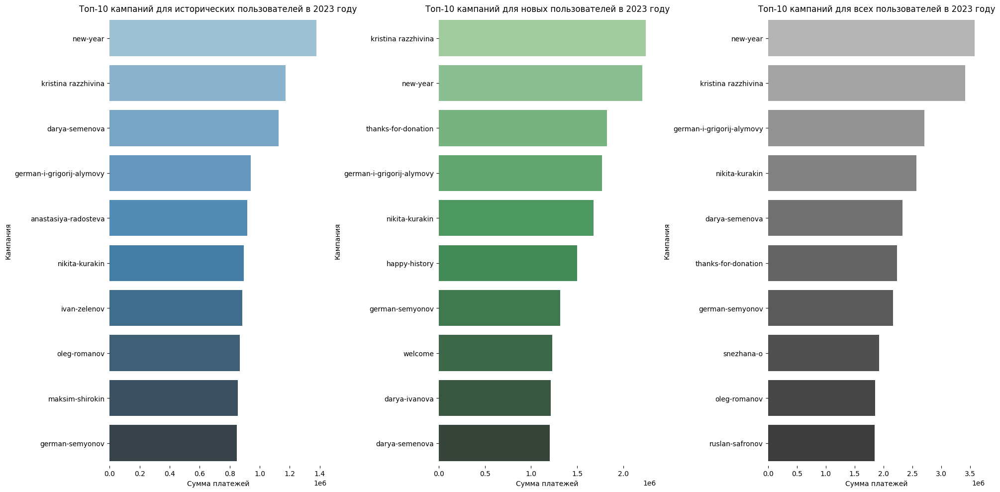

In [231]:
# Визуализируем результаты за 2023 год, например, так как он последний полный год в данных
# Определение функции для анализа пиков платежей в заданный год
def analyze_campaign_peaks_viz(data, year, top_n=10):
    return (data.query(f'order_is_paid == "paid" & year == {year}')
                .groupby('utm_campaign')['order_total_price']
                .sum()
                .sort_values(ascending=False)
                .head(top_n))

# Год для анализа
year = 2023

# Анализ пиков платежей для исторических, новых и всех пользователей за 2023 год
historical_peaks_2023 = analyze_campaign_peaks(historical_merged, year)
new_peaks_2023 = analyze_campaign_peaks(new_merged, year)
all_peaks_2023 = analyze_campaign_peaks(orders_channels, year)

# Визуализация результатов за 2023 год
plt.figure(figsize=(20, 10))

# Столбчатая диаграмма для исторических пользователей
plt.subplot(1, 3, 1)
ax1 = sns.barplot(x=historical_peaks_2023.values, y=historical_peaks_2023.index, palette='Blues_d')
plt.xlabel('Сумма платежей')
plt.ylabel('Кампания')
plt.title('Топ-10 кампаний для исторических пользователей в 2023 году')

# Убираем рамки у первого графика
for spine in ['left', 'right', 'bottom', 'top']:
    ax1.spines[spine].set_visible(False)

# Столбчатая диаграмма для новых пользователей
plt.subplot(1, 3, 2)
ax2 = sns.barplot(x=new_peaks_2023.values, y=new_peaks_2023.index, palette='Greens_d')
plt.xlabel('Сумма платежей')
plt.ylabel('Кампания')
plt.title('Топ-10 кампаний для новых пользователей в 2023 году')

# Убираем рамки у второго графика
for spine in ['left', 'right', 'bottom', 'top']:
    ax2.spines[spine].set_visible(False)

# Столбчатая диаграмма для всех пользователей
plt.subplot(1, 3, 3)
ax3 = sns.barplot(x=all_peaks_2023.values, y=all_peaks_2023.index, palette='Greys_d')
plt.xlabel('Сумма платежей')
plt.ylabel('Кампания')
plt.title('Топ-10 кампаний для всех пользователей в 2023 году')

# Убираем рамки у третьего графика
for spine in ['left', 'right', 'bottom', 'top']:
    ax3.spines[spine].set_visible(False)

plt.tight_layout()
plt.show()

Мы видим много адресной помощи. Хочется отметить новогоднюю акцию, которая среди "новых" клиентов принесла немаленькую сумму (2 204 635 руб.), а среди исторических - 1 377 556 руб. Акция "Спасибо за пожертвование" принесла 1 821 870 руб., а в целом по году - 2 236 808 руб. Она проявилась только в топ-10 среди "новых" пользователей, но возможно, ее запустили недавно. И, на мой взгляд, она крайне удачная для фонда.

In [232]:
# Найдем топ-3 пиковые акции для каждого сегмента
campaign_peaks_by_segment = (orders_channels
                             .query('order_is_paid == "paid"')
                             .groupby(['client_type', 'utm_campaign'])['order_total_price'].sum().reset_index())

campaign_peaks_by_segment = (campaign_peaks_by_segment.sort_values(['client_type', 'order_total_price'], ascending=[True, False])
                             .groupby('client_type')
                             .head(3))
campaign_peaks_by_segment

,client_type,utm_campaign,order_total_price
5,ключевой,zahar-kuzmin,44000
4,ключевой,new-year,9000
0,ключевой,1029149673,5600
32,крупный,german-semyonov,61000
54,крупный,ruslan-safronov,29100
35,крупный,invitation-recurrent,27500
166,крупный неактивный,maksim-shirokin,857892
110,крупный неактивный,anastasiya-radosteva,854798
189,крупный неактивный,oleg-romanov,756552
228,лояльный,1029194815,1850


По сегментам преобладает адресная помощь, при этом нельзя сказать, чтобы имена во всех сегментах совпадали. Хочется отметить новогоднюю акцию, которая среди "новых" клиентов принесла за все время немаленькую сумму (6 349 967 руб.), "ключевые" клиенты в ней тоже поучавствовали, но за счет размера выборки сумма получилась небольшая (9 000 руб.). 

In [233]:
# Проверим, когда была первый раз запущена акция thanks-for-donation
channels.query('utm_campaign == "thanks-for-donation"')['action_date'].min()

Timestamp('2022-05-19 00:00:00')

Акция запущена в мае 2022 года. Исторические пользователи могли ее не застать или у нас нет таких данных.

<span style="color:blue; font-size:17px">Действия пользователей</span>

In [234]:
# Построим воронку действий пользователей при работе с сайтом
channels['user_action'].value_counts().head(15)

user_action
Переход на сайт                                                                           83914
Просмотр “Дети”                                                                           56884
Оформление заказа в операции Заказ - Создание неавторизованным                            44788
Изменение статуса заказа в операции Заказ - Смена статуса.                                41443
RFM. Письмо 1                                                                             32042
RFM. Письмо 1 Отправка                                                                    32040
RFM. Письмо 2 Отправка                                                                    30240
RFM. Письмо 2                                                                             30240
Просмотр продукта в операции 'Просмотр продукта'                                          29565
Добавление продукта в список в операции 'Добавление в список — Просмотренные продукты'    29562
RFM. Письмо 3 Отправка      

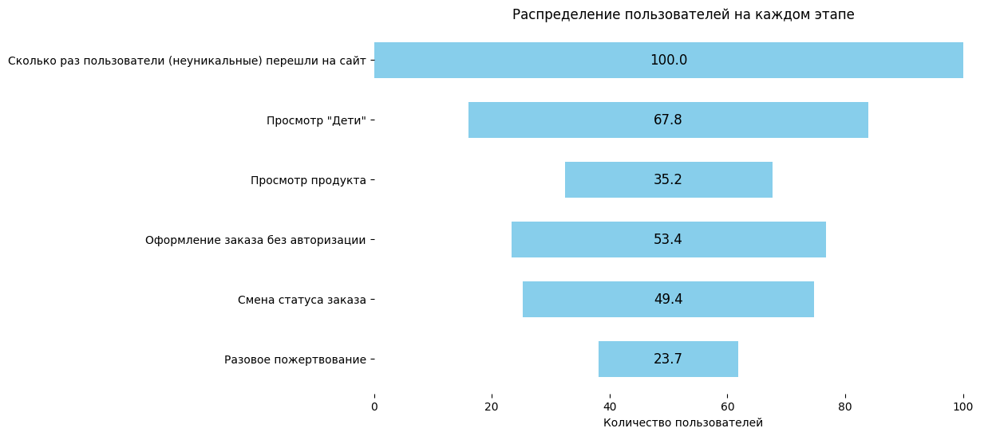

In [235]:
# Подсчитаем воронку действий в процентах пользователей после перехода на сайт
go_to_website = channels.query('user_action == "Переход на сайт"')['user_id'].count(),
view_children = channels[channels['user_action'] == 'Просмотр “Дети”']['user_id'].count(),
view_product = channels[channels['user_action'] == "Просмотр продукта в операции 'Просмотр продукта'"]['user_id'].count(),
unauthorized_order = channels.query('user_action == "Оформление заказа в операции Заказ - Создание неавторизованным"')['user_id'].count(),
change_order_status = channels.query('user_action == "Изменение статуса заказа в операции Заказ - Смена статуса."')['user_id'].count(),
one_time_donation = channels.query('user_action == "Пожертвование — разово"')['user_id'].count()

total_visits = go_to_website[0]  # Общее количество посещений сайта

# Список с подсчетом долей каждого этапа воронки
values = [
    total_visits,  # Сколько раз пользователи (неуникальные) перешли на сайт
    view_children[0],
    view_product[0],
    unauthorized_order[0],
    change_order_status[0],
    one_time_donation
]

# Применение деления для каждого значения
values_percent = [round(value / total_visits * 100,1) for value in values]

labels = [
    'Сколько раз пользователи (неуникальные) перешли на сайт',
    'Просмотр "Дети"',
    'Просмотр продукта',
    'Оформление заказа без авторизации',
    'Смена статуса заказа',
    'Разовое пожертвование'
]

plot_funnel_chart(labels, values_percent)

Конверсия от перехода на сайт до разового пожертвования - 23.7%. Это хороший результат.

[Возврат к описанию проекта](#toc)

<a id="17"></a>
<span style="color:green; font-size:22px">Когортный анализ</span>

<span style="color:blue; font-size:17px">Retention rate (удержание пользователей)</span>

In [236]:
# Приведем данные к временному формату  без секунд
orders['order_date'] = pd.to_datetime(orders['order_first_action_datetime'], format='%m/%d/%Y %H:%M')

In [237]:
# Создадим новый столбец с месяцем заказа
orders['order_month'] = orders['order_date'].dt.to_period('M')

In [238]:
# Определим когорты
orders['cohort'] = orders.groupby('order_customer_mindbox_id')['order_date'].transform('min').dt.to_period('M')

In [239]:
# Сделаем срез по когорте и месяцу заказа
orders_cohort = orders.groupby(['cohort', 'order_month']).agg(n_customers=('order_customer_mindbox_id', 'nunique')).reset_index(drop=False)

In [240]:
# Добавим новый столбец с лайфтаймом когорты
orders_cohort['period_number'] = (orders_cohort['order_month'] - orders_cohort['cohort']).apply(attrgetter('n'))
orders_cohort.head()

,cohort,order_month,n_customers,period_number
0,2021-01,2021-01,353,0
1,2021-01,2021-02,224,1
2,2021-01,2021-03,213,2
3,2021-01,2021-04,198,3
4,2021-01,2021-05,184,4


In [241]:
# Создаем объединенную таблицу для анализа когорт
cohort_pivot = orders_cohort.pivot_table(index='cohort', columns='period_number', values='n_customers')

In [242]:
# Выделим размеры когорт в отдельный столбец
cohort_size = cohort_pivot.iloc[:, 0]

In [243]:
# Рассчитаем матрицу удержания в процентах
retention_matrix = cohort_pivot.divide(cohort_size, axis=0)

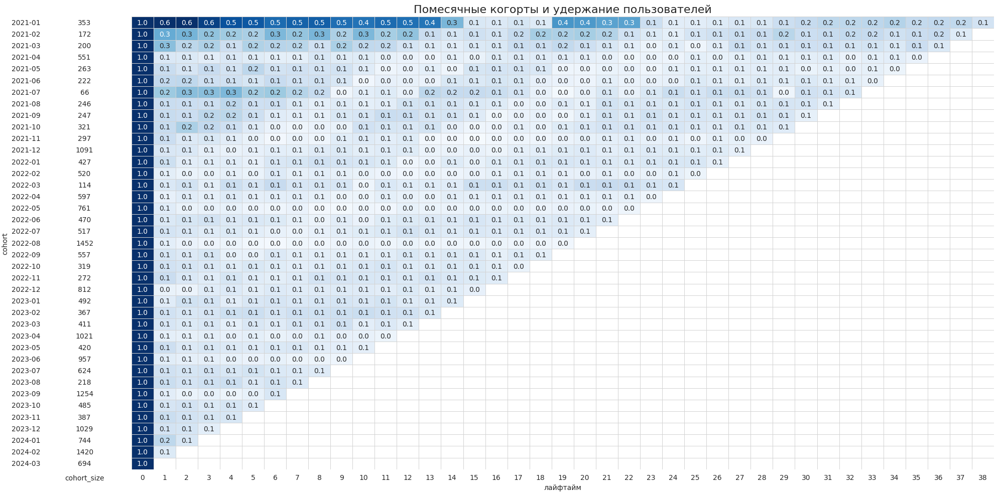

In [244]:
# Визуализируем матрицу удержания
with sns.axes_style("white"):
    fig, ax = plt.subplots(1, 2, figsize=(20, 10), sharey=True, gridspec_kw={'width_ratios': [1, 11]})

    # Тепловая карта для матрицы удержания
    sns.heatmap(retention_matrix,
                mask=retention_matrix.isnull(),
                annot=True,
                fmt='.1f',
                cmap='Blues',
                ax=ax[1],
                vmin=0,
                vmax=0.6,
                linewidths=0.5,
                linecolor='lightgrey',
                cbar=False)
    ax[1].set_title('Помесячные когорты и удержание пользователей', fontsize=16)
    ax[1].set(xlabel='лайфтайм',
              ylabel='')

    # Размер когорт
    cohort_size_df = pd.DataFrame(cohort_size).rename(columns={0: 'cohort_size'})
    white_cmap = mcolors.ListedColormap(['white'])
    sns.heatmap(cohort_size_df,
                annot=True,
                cbar=False,
                fmt='g',
                cmap=white_cmap,
                ax=ax[0])

    fig.tight_layout()

По привлеченному количеству человек наиболее большие когорты: 2021-12 (1191), 2022-05 (761), 2022-08 (1452), 2022-12 (812), 2023-04 (1021), 2023-06 (957), 2023-09 (1254), 2023-12 (1029), 2024-02 (1420). Чувствуется даже определенная цикличность: конец весны-начало лета, конец лета-начало осени, декабрь-начало года. Похоже, у благотворительности есть своя сезонность.

Наиболее перспективно себя показывают когорты 2021-01, 2021-02, 2021-03, 2021-07. Когорта 2021-01 на 19-22 лайфтайме снова показала прирост количества пользователей после падения (период конца лета-начала осени 2022 года).

Самое низкое удержание у когорт: 2022-05, 2022-08, 2023-06, 2023-09.

В целом, удержание по когортам равно 10%, редко 20%. Думаю, для благотворительного фонда с большим количеством разовых разовых пожертвований, это неплохой показатель.

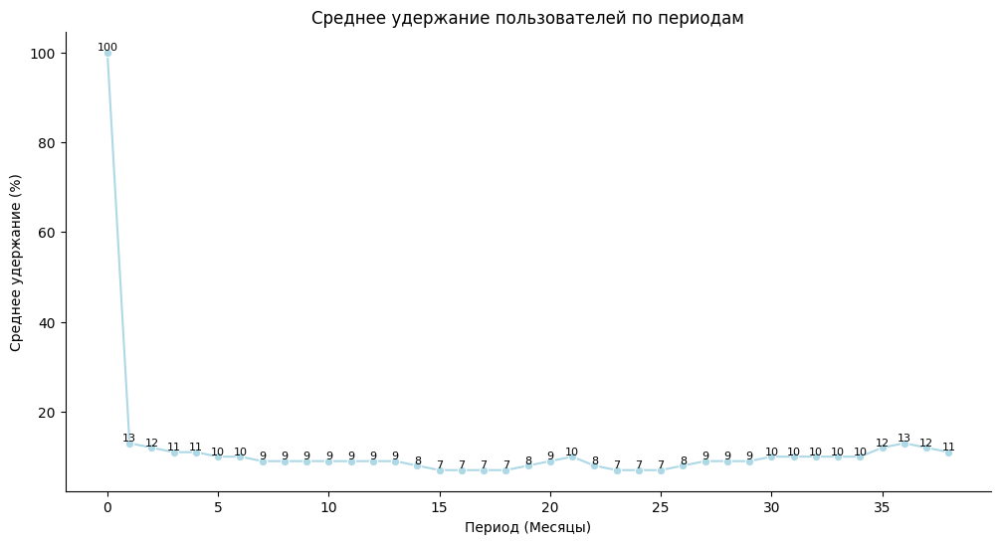

In [245]:
# Посмотрим на среднее удержание по когортам за каждый месяц в процентах
average_retention = (retention_matrix.mean() * 100).round()
plt.figure(figsize=(12, 6))
ax = sns.lineplot(data=average_retention.values, marker='o', linestyle='-', color='lightblue')
plt.title('Среднее удержание пользователей по периодам')
plt.xlabel('Период (Месяцы)')
plt.ylabel('Среднее удержание (%)')

# Подписываем все точки на графике
for i, value in enumerate(average_retention.values):
    plt.text(i, value, str(int(value)), ha='center', va='bottom', fontsize=8)

#for spine in ['left', 'right', 'bottom', 'top']:
#    ax.spines[spine].set_visible(False)
sns.despine()
plt.show()

Тут мы также видим небольшие пики конца 2022 и 2023 года.

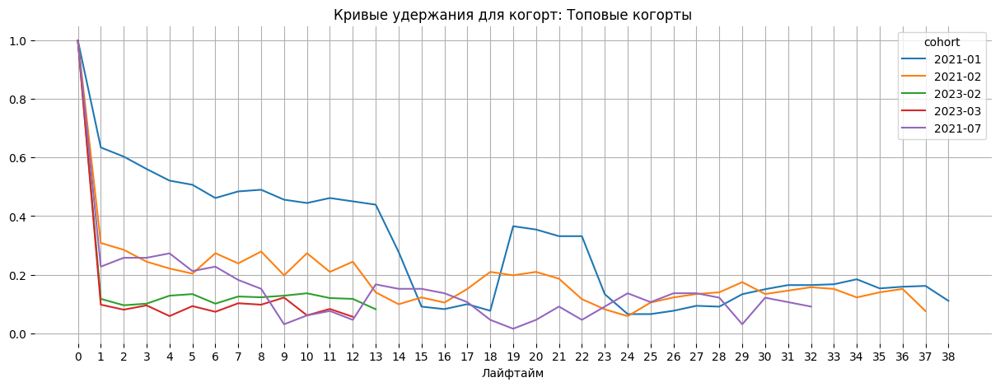

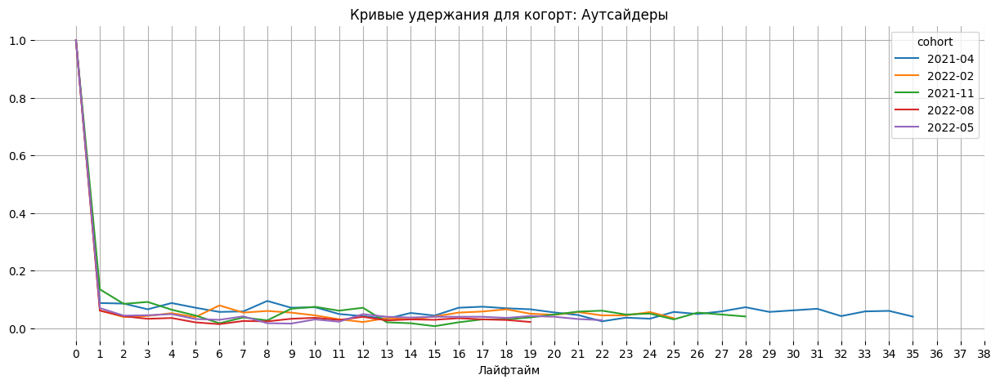

In [246]:
# Определим числа когорт для выбора в топе и аутсайдерах для когорт с лайфтаймом более 6 месяцев
top_cohorts_count = 5
bottom_cohorts_count = 5

# Фильтруем когорты, чтобы оставить только те, у которых есть данные по крайней мере за 12 месяцев
filtered_retention_matrix = retention_matrix.dropna(thresh=13)  # Условие: хотя бы 13 значений (0-13 месяцев)

# Сортируем когорты по уровню удержания
sorted_retention = filtered_retention_matrix.mean(axis=1).sort_values(ascending=False)

# Выбираем топовые и аутсайдерские когорты
top_cohorts = sorted_retention.head(top_cohorts_count).index.tolist()
bottom_cohorts = sorted_retention.tail(bottom_cohorts_count).index.tolist()

# Фильтруем данные
top_cohorts_data = retention_matrix.loc[top_cohorts]
bottom_cohorts_data = retention_matrix.loc[bottom_cohorts]

# Определим функцию для визуализации топ-5 первых и последних по удержанию когорт
def plot_retention_curves(datasets, cohort_labels):
    for dataset, label in zip(datasets, cohort_labels):
        ax = dataset.T.plot(
            grid=True,
            xticks=list(dataset.columns.values),
            figsize=(15, 5),
        )
        plt.xlabel('Лайфтайм')
        plt.title(f'Кривые удержания для когорт: {label}')
        for spine in ['left', 'right', 'bottom', 'top']:
            ax.spines[spine].set_visible(False)
        plt.show()

# Строим кривые удержания для выбранных когорт
plot_retention_curves([top_cohorts_data, bottom_cohorts_data], ['Топовые когорты', 'Аутсайдеры'])

На первом графике хорошо видно "возрождение" когорты 2021-01 на 19-22 месяце жизни. Перспективно себя ведут когорты 2021-02 и 2021-07. У когорт 2021-04, 2021-11, 2022-02, 2022-05, 2022-08 удержание самое низкое по выборке.

<span style="color:blue; font-size:17px">Среднее количество покупок для пользователей по когортам</span>

In [247]:
# Определим функцию для поиска и возврата первого числового значения, обнаруженного во входной строке
def parse_cohort_lifetime(value):
    '''
    Данная функция предназначена для поиска и возврата первого числового значения,
    обнаруженного во входной строке. Если совпадений не найдено, возвращается значение по умолчанию 1,
    преобразованное в целое число.
    - использует регулярные выражения;
    - извлекает числовое значение из объекта.
    - возвращает int: извлеченное числовое значение в виде целого числа или 1, если совпадений не найдено.
    '''
    # Ищем первое число
    match = re.search(r'\d+', str(value))
    # Проверяем, найдено ли совпадение, и верните его в виде целого числа или 1, если совпадений нет
    if match:
        first_number = match.group()
        return int(first_number)
    else:
        return 1

In [248]:
# Определим функцию для построения тепловой карты анализа когорт по среднему количеству покупок за период
def perchase_per_use_cohort_heatmap(data, month_limit):
    # Рассчитываем начальную и конечную даты для периода анализа
    start_date = data['order_first_action_date'].min()
    end_date = start_date + pd.offsets.MonthEnd(month_limit)

    # Фильтруем данные, чтобы оставить только заданный период анализа
    limited_order_data = data[(data['order_first_action_date'] >= start_date) & (data['order_first_action_date'] <= end_date)]

    # Находим первую дату заказа для каждого пользователя
    first_order_date = data.groupby('order_customer_mindbox_id')['order_first_action_date'].min()
    first_order_date.name = 'first_order_date'

    # Объединяем первую дату заказа обратно в ограниченные данные о заказах
    limited_order_data = limited_order_data.merge(first_order_date, on='order_customer_mindbox_id')

    # Преобразуем даты заказов в месячные периоды
    limited_order_data['first_order_month'] = limited_order_data['first_order_date'].dt.to_period('M')
    limited_order_data['order_month'] = limited_order_data['order_first_action_date'].dt.to_period('M')

    # Группируем данные по когортам и вычисляем соответствующие метрики
    orders_month_cohorts = (limited_order_data
                            .groupby(['first_order_month','order_month'])
                            .agg({'order_first_action_date':'count', 'order_customer_mindbox_id':'nunique'})
                            .reset_index())

    orders_month_cohorts['cohort_lifetime'] = orders_month_cohorts['order_month'] - orders_month_cohorts['first_order_month']
    orders_month_cohorts['cohort_lifetime'] = orders_month_cohorts['cohort_lifetime'].apply(parse_cohort_lifetime)
    orders_month_cohorts = (orders_month_cohorts
                            .rename(columns={'order_first_action_date':'n_purchases','order_customer_mindbox_id':'n_user_id'}))
    orders_month_cohorts['purchases_per_user'] = orders_month_cohorts['n_purchases']/orders_month_cohorts['n_user_id']

    # Создаем сводную таблицу для тепловой карты
    purchase_pivot = orders_month_cohorts.pivot_table(index='first_order_month',
                                                      columns='cohort_lifetime',
                                                      values='purchases_per_user')

    # Создаем тепловую карту
    with sns.axes_style("white"):
        fig, ax = plt.subplots(1, 2, figsize=(20, 10), sharey=True, gridspec_kw={'width_ratios': [1, 11]})

        sns.heatmap(purchase_pivot,
                    mask=purchase_pivot.isnull(),
                    annot=True,
                    fmt='.1f',
                    cmap='Blues',
                    ax=ax[1],
                    vmin=1,
                    vmax=4.5,
                    linewidths=0.5,
                    linecolor='lightgrey',
                    cbar=False)
        ax[1].set_title('Среднее количество покупок для пользователей по когортам', fontsize=16)
        ax[1].set(xlabel='лайфтайм',
              ylabel='')

        # Изначальный размер когорт
        cohort_size_df = pd.DataFrame(cohort_size).rename(columns={0: 'cohort_size'})
        white_cmap = mcolors.ListedColormap(['white'])
        sns.heatmap(cohort_size_df,
                    annot=True,
                    cbar=False,
                    fmt='g',
                    cmap=white_cmap,
                    ax=ax[0])

        fig.tight_layout()

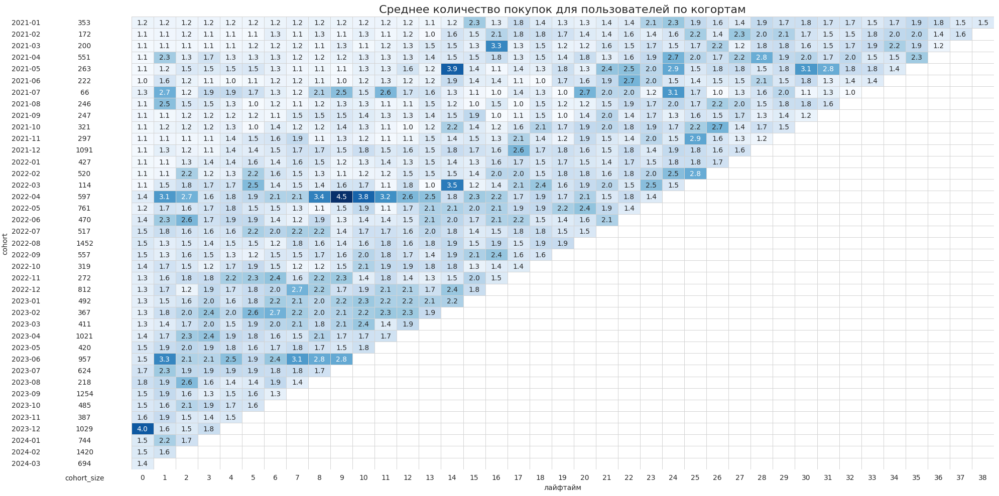

In [249]:
perchase_per_use_cohort_heatmap(data=orders, month_limit = 39)

Когорта 2022-04 на 9 месяце жизни показала самый высокий результат (4.5) и в целом по когорте показатели одни из самых высоких. Также  стоит отметить когорту 2021-05 на 14том лайфтайме, 2021-03 на 16ом, 2022-03 на 14ом, 2023-06 на 1ом, 2023-12 на 0ом.

Посмотрим на акции в эти периоды.

In [250]:
# 2023-01
channels.query('action_date >= "2023-01-01" & action_date <= "2023-01-31"')['utm_campaign'].unique()

array([nan, 'maksim-shirokin', 'new-year', 'nikita-yakovlev',
       'news-january', 'thanks-for-donation',
       'pomozhem-zhitelyam-dnr-i-lnr', 'welcome', 'ignatij-ovchinnikov',
       'thanks-to-the-recurrents', 'recurrence-report',
       'aleksandr-novozhilov', "philanthropist's-day", 'kvasova',
       'BroshennayaKorzinaBoevaya', 'promo', 'nikolaj-mosyakov',
       'invitation-recurrent', 'igor-ko-si-shan', 'gfp', 'basket',
       'evgeniya-puchkova', 'evgenia-puchkova', 'ira-chepiga',
       'vitalij-malofeev', 'news-digest', 'privetstvie', 'alina-rajs',
       'nikita-surikov', 'new-year-2023', 'egor-czukanov',
       'margarita-i-vladislav-nartajlakovy', 'salavat-bagautdinov',
       '82150215', '_new_year_forecast_jar', 'demid-lebedev',
       'anastasiya-malysh', 'danil-bespalov', '79926331',
       'savelij-sungurov', 'evgenia-puchkova"', 'daria-tortoeva',
       'arman-akopyan', 'lada-sokolova', 'veronika-borzyh'], dtype=object)

Тут и приветственные акции, и новогодние, и благодарственные, и адресные.

In [251]:
# 2022-08
channels.query('action_date >= "2022-08-01" & action_date <= "2022-08-31"')['utm_campaign'].unique()

array([nan, 'olga-orlova', 'anastasiya-radosteva', 'maryana-chesheva',
       'happy-history-surikov', 'history', 'welcome', 'yaroslav-golczev',
       'anastasiya-malysh', 'invitation-recurrent', 'privetstvie',
       'recurrence-report', 'demid-lebedev',
       'Polina-chinkova_CPC_no_graphics', 'babushka-s-pravdy',
       'thanks-for-donation', 'denis-glazkov', 'alina-rajs', 'gfp',
       'egor-czukanov', 'arman-akopyan', '74316780', 'elizaveta-sazonova',
       'Polina-chinkova_CPA_no_graphics',
       'margarita-i-vladislav-nartajlakovy', 'promo', '0'], dtype=object)

В этот период больше адресной помощи.

<span style="color:blue; font-size:17px">Средний чек когортам</span>

In [252]:
# Добавляем номер месяца жизни в датасет orders
orders['period_number'] = (orders['order_month'] - orders['cohort']).apply(attrgetter('n'))

In [253]:
# Рассчитываем средний чек для каждой когорты
cohort_avg_revenue = orders.groupby(['cohort', 'period_number']).agg({'order_total_price': 'mean'}).reset_index()
cohort_avg_revenue

,cohort,period_number,order_total_price
0,2021-01,0,1042.240566
1,2021-01,1,635.484848
2,2021-01,2,604.793522
3,2021-01,3,582.697872
4,2021-01,4,647.046512
...,...,...,...
775,2024-01,1,340.081481
776,2024-01,2,310.453782
777,2024-02,0,964.475252
778,2024-02,1,422.973404


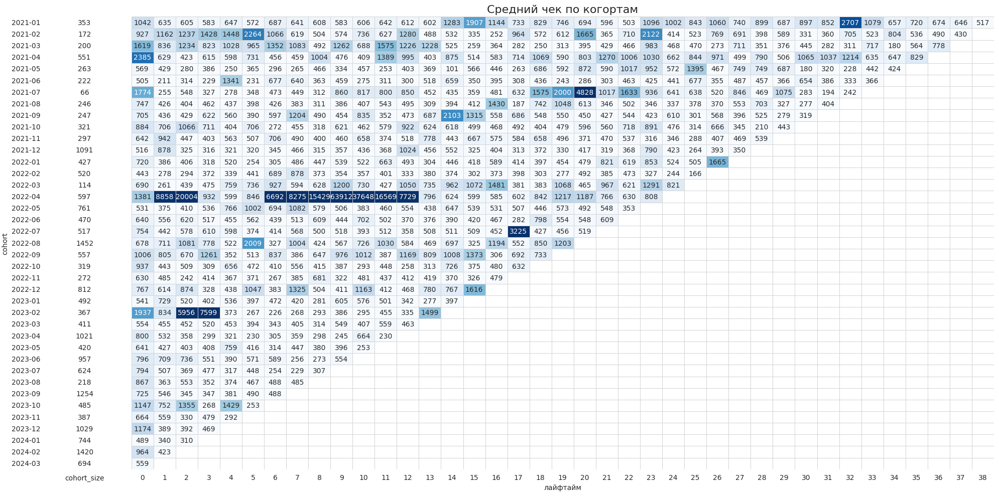

In [254]:
# Собираем сводную таблицу для визуацизации
cohort_avg_revenue_pivot = cohort_avg_revenue.pivot(index='cohort', columns='period_number', values='order_total_price')
# Строим тепловую карту
with sns.axes_style("white"):
        fig, ax = plt.subplots(1, 2, figsize=(20, 10), sharey=True, gridspec_kw={'width_ratios': [1, 11]})

        sns.heatmap(cohort_avg_revenue_pivot,
                    mask=cohort_avg_revenue_pivot.isnull(),
                    annot=True,
                    fmt='.0f',
                    cmap='Blues',
                    ax=ax[1],
                    vmin=500,
                    vmax=3000,
                    linewidths=0.5,
                    linecolor='lightgrey',
                    cbar=False)
        ax[1].set_title('Средний чек по когортам', fontsize=16)
        ax[1].set(xlabel='лайфтайм',
              ylabel='')

        # Изначальный размер когорт
        cohort_size_df = pd.DataFrame(cohort_size).rename(columns={0: 'cohort_size'})
        white_cmap = mcolors.ListedColormap(['white'])
        sns.heatmap(cohort_size_df,
                    annot=True,
                    cbar=False,
                    fmt='g',
                    cmap=white_cmap,
                    ax=ax[0])

        fig.tight_layout()

Очень перспективная когорта 2022-04, особенно в первый год жизни. На 10 месяце лайфтайма чек был 63912 руб. Думаю, стоит обратить на нее приcтальное внимание со стороны фонда.

<span style="color:blue; font-size:17px">LTV (пожизненная ценность пользователя)</span>

In [255]:
# Определим функцию для визуализации LTV по когортам
def ltv_cohort_heatmap(data, month_limit, margin_rate, save_ltv_cohort=False):
    # Частично функция повторяет предыдущую по анализу среднего числа покупок
    # Находим начальную и конечную даты для анализируемого периода
    start_date = data['order_first_action_date'].min()
    end_date = start_date + pd.offsets.MonthEnd(month_limit)

    # Фильтруем данные, чтобы оставить только указанный анализируемый период
    limited_order_data = data[(data['order_first_action_date'] >= start_date) & (data['order_first_action_date'] <= end_date)]

    # Находим дату первого заказа для каждого пользователя
    first_order_date = data.groupby('order_customer_mindbox_id')['order_first_action_date'].min()
    first_order_date.name = 'first_order_date'

    # Объединяем дату первого заказа обратно с отфильтрованными данными
    limited_order_data = limited_order_data.merge(first_order_date, on='order_customer_mindbox_id')

    # Преобразуем даты заказов в месячные периоды
    limited_order_data['first_order_month'] = limited_order_data['first_order_date'].dt.to_period('M')
    limited_order_data['order_month'] = limited_order_data['order_first_action_date'].dt.to_period('M')

    # Группируем данные по когортам и вычисляем соответствующие метрики
    orders_month_cohorts = (limited_order_data
                            .groupby(['first_order_month','order_month'])
                            .agg({'order_total_price':'sum', 'order_customer_mindbox_id':'nunique'}).reset_index())
    orders_month_cohorts = orders_month_cohorts.rename(columns={'order_customer_mindbox_id':'n_buyers'})
    orders_month_cohorts = orders_month_cohorts.reset_index()

    # Рассчитываем валовую прибыль для каждой когорты
    orders_month_cohorts['gross_profit'] = orders_month_cohorts['order_total_price'] * margin_rate

    # Вычисляем возраст каждой когорты в месяцах
    orders_month_cohorts['age'] = orders_month_cohorts['order_month'] - orders_month_cohorts['first_order_month']
    orders_month_cohorts['age'] = orders_month_cohorts['age'].apply(parse_cohort_lifetime)

    # Находим количество покупателей в исходной когорте
    initial_buyer_count = orders_month_cohorts[orders_month_cohorts['age'] == 0][['first_order_month','n_buyers']]
    initial_buyer_count = initial_buyer_count.rename(columns={'n_buyers':'cohort_total_buyer'})
    orders_month_cohorts = orders_month_cohorts.merge(initial_buyer_count, on = 'first_order_month')

    # Рассчитываем LTV для каждой когорты
    orders_month_cohorts['ltv'] = orders_month_cohorts['gross_profit'] / orders_month_cohorts['cohort_total_buyer']

    # Создаем сводную таблицу для тепловой карты
    orders_month_cohorts_pivot = orders_month_cohorts.pivot_table(index='first_order_month', columns='age', values='ltv', aggfunc='sum')

    # Применяем cumsum() для каждой когорты
    orders_month_cohorts_pivot = orders_month_cohorts_pivot.cumsum(axis=1)

    # Строим тепловую карту
    fig, ax = plt.subplots(1, 2, figsize=(20, 10), sharey=True, gridspec_kw={'width_ratios': [1, 11]})

    # Строим тепловую карту LTV по когортам
    sns.heatmap(orders_month_cohorts_pivot,
                mask=orders_month_cohorts_pivot.isnull(),
                annot=True,
                fmt='.0f',
                cmap='Blues',
                ax=ax[1],
                vmin=0,
                vmax=16000,
                linewidths=0.5,
                linecolor='lightgrey',
                cbar=False)
    ax[1].set_title('LTV по когортам', fontsize=16)
    ax[1].set(xlabel='лайфтайм', ylabel='')

    # Изначальный размер когорт
    cohort_size_df = pd.DataFrame(cohort_size).rename(columns={0: 'cohort_size'})
    white_cmap = mcolors.ListedColormap(['white'])
    sns.heatmap(cohort_size_df,
                annot=True,
                cbar=False,
                fmt='g',
                cmap=white_cmap,
                ax=ax[0])
   
    fig.tight_layout()

У нас нет точных данных о себестоимости продукции, поэтому мы можем задать маржинальную ставку в 0.5 или 1, т.е. фактически предположить, что половина или вся выручка будет оставаться как прибыль после покрытия переменных затрат. Это упрощенный подход для быстрой оценки прибыльности, который не учитывает индивидуальные особенности отрасли, к сожалению.

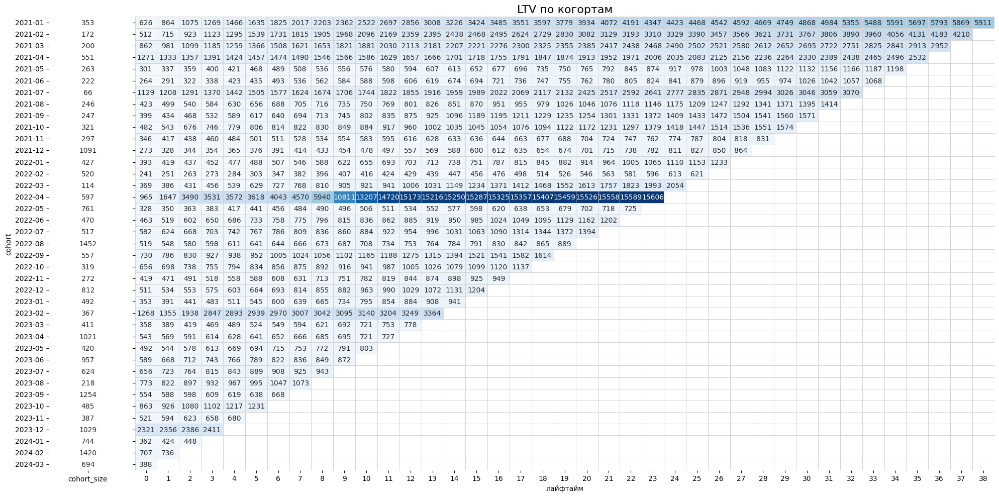

In [256]:
ltv_cohort_heatmap(orders, 39, 0.5)

Пожизненная ценность у когорты 2022-04 выше всего, как и ожидалось. Также стоит обратить внимание на когорту 2023-02 и первые две когорты.

<span style="color:blue; font-size:17px">Выводы:</span>

В рамках этапа целевого анализа данных были сделаны следующие выводы:
- Пользовательские метрики:
   - данные по пользователям были разбиты на две части, в первую часть попали исторические пользователи, во вторую новые;
   - для анализа исторических пользователей был выбран 2024 год с целью определения количества оставшихся активными (или вернувшихся) пользователей;
   - анализ исторических пользователей показал:
     - всего зарегистрированных исторических пользователей - 7343;
     - неактивных исторических пользователей - 6708 (75.2% женщины, географически преобладает Вена, 47% из них были реккурентами, 90% было привлечено по Email);
     - активных пользователей, не сделавших пожертвования - 121 (37.3% из сделавших заказ, но неоплативших его - рекурренты, 60.3% из них - женщины, почти все подписались после контакта по Email. География более широкая, нежели, чем у неактивных пользователей, лидируют Вена, Москва и Екатеринбург. Пик регистраций таких пользователй - декабрь 2022 года. Думаю, что в случае с пользователями не из России причина неактивности понятна - невозможность перевести средства в связи с санкциями;
     - активных пользователи (вернувшихся): 602 (60.2% из них - женщины, географически - Вена, Москва, Санкт-Петербург и др., 97.7% пришли по Email. Процент активных исторических пользователей в 2024 году: 8.2 %. Количество платежей по кампаниям в 2024 году составило - 1406;
     - активных пользователей, платеж которых не прошел: 90;
     - динамика платежей среди исторических пользователей показывает, что оплаченных платежей больше, чем неоплаченных. Видим падение количества платежей с августа 2022 года, ситуация стабилизировалась к маю 2023. Количество неплатежей среди исторических пользователей в целом только растет с весны 2023 года. Я бы связала эту ситуацию как с санкциями, так и, возможно, в целом с ситуацией в стране, когда людям стало немного не до благотворительности.
   - новогодняя акция показала, что из 1881 участников акции 444 исторических пользователей (292 взноса), 1437 - новых (910 взносов). Сумма взносов от исторических пользователей - 187 296 руб., от новых - 542 270 руб.
     - процент исторических пользователей, учавствовавших в акции и сделавших взнос: 65.8 %;
     - процент новых пользователей, учавствовавших в акции и сделавших взнос: 63.3 %;
     - новогодние акции привлекают большее количество новых пользователей, чем исторических. Новые пользователи пожертовавали больше денег. Но среди исторических процент перечисляющих деньги немного выше, чем среди новых.
   - анализ новых пользователей показал:
     - основной регион не определен, в данных пропуски;
     - среди новых пользователей меньше рекуррентов;
     - лучше всего работает канал входа по Email;
     - основные доноры, по-прежнему, женщины (78.2%);
     - количество делающих взносы новых пользователей увеличилось в 2024 году на 4%, количество неплатящих упало на 5.2%, процент ошибок при платеже вырос на 1.2%. Среди исторических пользователей, наоборот, процент платящих резко упал на 18.3%, процент неплататящих вырос на 11%, процент ошибок вырос на 7.3%;
     - динамика платежей среди новых пользователей показывает падение в платежах, начиная с августа 2022 года, как и у исторических пользователей. Я все-таки связываю это с ситуацией в стране в эти месяцы. В декабре 2023 года интересная ситуация, когда платежи резко упали, а количество неоплаченных заказов резко выросло, и дело тут не в ошибках платежей явно. Могу предположить, что под новый год было привлечено новогодней акцией большое количество пользователей, которые под влиянием новогодней атмосферы и желания творить добро, решили внести пожертвования, но до дела, т.е. до оплаты так и не дошло;
     - из пришедших по новогодней акции пользователей в декабре 2023 года, сделала пожертовавание примерно половина.
     - по количеству привлеченных пользователей по каналам лидируют VK, Marketolog, Yandex Direct, Instagram, MTS Marketolog. Через Aif Gazeta и Yandex Direct приходят более платящие пользовали;
     - средняя сумма пожертвования от пользователей, пришедших с популярных каналов, таких как VK, совсем небольшая (10.7 руб.), а вот каналы yandex-direct (102.1 руб.), aif_gazeta (45.5 руб.), mtsmarketolog (44 руб.) выглядят более перспективно, так же как и whatsapp (235 руб). На данный момент VK побеждает количеством платежей, хоть и на маленькие суммы;
   - стоит обратить внимание на то, что сумма неоплаченных заказов (пользователь добавил в корзину заказ и не оплатил его) как для исторических пользователй, так и для новых велика, она превышает в обоих случаях сумму оплаченных заказов на несколько млн. руб.;
   - DAU, MAU, WAU, Sticky Factors в 2024 году:
     - новые пользователи показывают более высокую активность, чем исторические пользователи, что может указывать на успешные маркетинговые кампании или привлекательность новых функций. Липкость новых пользователей выше, что может означать, что новые пользователи более вовлечены в текущие активности и продукты.
   - DAU, MAU, WAU, Sticky Factors за весь период:
     - новые пользователи показывают более высокую активность, чем исторические пользователи, но отличия в активности не так значительны как по 2024 году. Липкость новых пользователей также выше, но разница более значительна, чем в 2024 году.
   - DAU по всем данным за весь период - 893.6;
   - MAU по всем данным за весь период - 7403.8;
   - WAU по всем данным за весь период - 4380.0;
   - Sticky Factor MAU по всем данным за весь период - 12.1;
   - Sticky Factor WAU по всем данным за весь период -  20.4;
   - ROMI:
     - затраты на развитие источника vk в 2023 году окупились. ROMI составляет почти 36.3%, что указывает на прибыльность маркетинговых вложений в этот источник, хотя рентабельность не такая высокая как у email. Это означает, что на каждый рубль, вложенный в этот источник, возвращается примерно 1.36 рублей;
     - затраты на развитие канала email в 2023 году также окупились. ROMI составляет 215.18%, что означает, что каждый вложенный рубль приносит 2.15 рубля прибыли;
     - в отличие от vk и email, источник whatsapp оказался убыточным. ROMI составляет -82.1%, что означает, что затраты на этот источник не окупились. На каждый вложенный рубль было потеряно почти 82 копейки. Это указывает на необходимость пересмотра стратегии использования этого источника или отказа от него.
       
 - RMF-анализ (8 сегментов):
   - более всего нам интересен сегмент с "ключевыми" и "крупными" клиентами. Их не слишком много, у них короткий лайфтам, тратят они довольно много из расчета на одного клиента. Необходимо найти способы их удержания;
   - далее нам интересны очень перспективные "новые" клиенты, по количеству и по общей сумме взносов они лидируют, у них больше всего реккурентов и повторяющихся платежей, лайфтайм более 200 дней. Необходимо работать с ними более точечно, чтобы они возвращались снова и их платежи стали постоянными, а не разовыми;
   - также необходимо обратить внимание на сегмент с "крупными неактивными" клиентами, у них лайфтам более 119 дней, они также вносили крупные суммы денег, необходимо их реанимировать;   
   - в сегментах - "лояльный" и "почти потерянный", лайфтайм очень короткий, таких людей мало, они переводят небольшие суммы, в целом приход от них не очень большой;
   - оставшиеся два сегмента ("неактивный", "ушедший") содержат по количеству более 8 тысяч пользователей. Переводили также небольшие суммы примерно раз в неделю или раз в месяц, но в целом по сумме сборов они на 3 и 4 месте. Было бы неплохо их реанимировать.
   -  большая часть пользователей во всех сегментах - женщины.
     
 - Коммерческие метрики:
   - средний чек для исторических пользователей - 729 руб., для новых пользователей - 756 руб., по всему датасету - 744 руб.
   - среднее время между первым и последним платежом -  97 дней;
   - cреднее количество заказов на пользователя в промежутке между первым и последним платежом - 3;
   - cреднее количество платежей в день - 45;
   - средний чек по сегментам:
     - ключевой - 1881.6 руб.;
     - крупный - 1853.9 руб.;
     - крупный неактивный - 1196.1 руб.;
     - лояльный - 157.2 руб.;
     - неактивный - 255.0 руб.;
     - новый	- 697.1 руб.;
     - почти потерянный - 126.0 руб.;
     - ушедший - 265.0 руб.
   - пик поступлений приходился на май 2021 года, а с января 2022 года мы видим падение поступлений, так что в среднем в день поступает около 743 рублей. Есть небольшие пики зимой 2023 года, например. Также есть тенденция к росту поступлений, начиная с осени 2023 года. Насколько мне известно, как раз в этот период для фонда блы проведен анализ данных, что позволило, по-словам заказчика, увеличить годовую сумму платежей примерно в 1.5 раза.
   - 275 пользователей пожертвовали суммы от 10 000 руб. до 200 000 руб.;
   - есть пользователь, собиравшийся сделать пожертвование на сумму 1 100 000 руб., но перевод по непонятным причинам он так и не сделал;
   - пользователи, жертвующие крупные суммы - либо "новые", либо "крупные неактивные". Есть как пользователи с длинным лайфтаймом (2-3 года), так и пользователи однодневки. Например, пользователь, пожертвовавший за 1 раз 200 000 рублей, больше не вернулся в фонд, и это женщина из Вены. Пользователь, пожертвовавший больше всего денег, сделал 51 перевод примерно за год, пришел он в феврале 2023 года и это тоже женщина. Но в топ-20 таких пользователей с крупными пожертвованиями мужчин все же больше в 1.5 раза, чем женщин. Еще один крупный пользователь - мужчина из Салехарда, перечисливший 160 000 рублей за один раз. 19 пожертвований в этой топ-20ке было по новогодней акции, 10 пожертвований по акции "Спасибо за пожертвование", похоже, что люди после получения благодарности за предыдущий перевод, перевели еще деньги. Если моя догадка верна, то это хороший способ работы с пользователями для привлечения от них дополнительных средств. К таким людям нужен персональный подход, чтобы понимать, в каких случаях к ним можно обратиться точечно за помощью. Возможно, они реагируют на сборы, близкие им по ситуации, возможно, они уже сталкивались с этим в жизни и помогают адресно людям с такими же диагнозами;
   - топ-5 источников по первому входу пользователей, если отбросить административный сайт и отсутствие данных, это: сайт, email, прямой переход, vk.com и yandex.ru;
   - первый источник входа для всех сегментов пользователей - это сайт;
   - исторические пользователи более активны по пятницам, субботам и воскресеньям, вспомним, что среди них много людей из Вены, получается время европейского уикенда. Новые пользователи чаще активные по понедельникам и средам. Если речь идет о пользователях из России, особенно женщинах, то в выходные включать компьютер особо некогда, семьи, дети, быт, а вот в понедельник, выйдя на работу, можно со спокойной душой проверить почту, изучить рассылки, например, в обеденный перерыв. По общим данным, наиболее активные дни: понедельник и суббота.
   - по времени суток видим три пика активности: 9 утра, 12-13 дня, ночные часы по Московскому времени. Наши исторические пользователи наиболее активны в ночное время (или вечернее время по Европе), новые - утром и вечером, в целом активность самая низкая днем;
   - топ-10 по пожертвованиям среди всех пользователей:
     - на уставную деятельность - 8 562 375 руб.;
     - пожертвование (хочу помочь) - 2 996 172 руб.;
     - пожертвование на уставную деятельность БФ «АиФ. Доброе сердце» - 2 212 190 руб.;
     - Егор Цуканов - 1072858 руб.;
     - Григорий Белослюдцев - 1 024 832 руб.;
     - Артём Матвеев - 851 591 руб.;
     - Никита Яковлев - 791 323 руб.;
     - Захар Кузьмин - 735 919 руб.;
     - Максим Широкин - 728 945;
     - Герман Семёнов - 662 463 руб;
   - крупные и ключевые клиенты оказывают помощь адресно, новые клиенты предпочитают отправить средства на уставную деятельность и на усмотрение фонда.
     
 - Маркетинговые метрики:
   - по каналам привлечения пользователей лидируют VK, Marketolog, Yandex Direct, Instagram, MTS Marketolog;
   - среди исторических пользователей все 4 года лидируют по количеству собранных средств новогодние акции;
   - среди новых пользователей в 2021 и 2022 годах - новогодняя акция, в 2023 году - акция "kristina razzhivina", на втором новогодняя, на третьем - "Спасибо за пожертвование", в 2024 году на первое место выходит "1029149673", на 2 месте - новогодняя;
   - в целом по данным за весь период по всем годам лидирует новогодняя акция.
     
- Когортный анализ:
   - по привлеченному количеству человек наиболее большие когорты: 2021-12 (1191), 2022-05 (761), 2022-08 (1452), 2022-12 (812), 2023-04 (1021), 2023-06 (957), 2023-09 (1254), 2023-12 (1029), 2024-02 (1420). Чувствуется даже определенная цикличность: конец весны-начало лета, конец лета-начало осени, декабрь-начало года. Похоже, у благотворительности есть своя сезонность;
   - наиболее перспективно себя показывают когорты 2021-01, 2021-02, 2021-03, 2021-07. Когорта 2021-01 на 19-22 лайфтайме показала рост после падения (период конца лета-начала осени 2022 года);
   - самое низкое удержание у когорт: 2022-05, 2022-08, 2023-06, 2023-09;
   - в целом, удержание по когортам равно 10%, редко 20%. Думаю, для благотворительного фонда с большинством разовых пожертвований, это неплохой показатель;
   - по среднему количеству покупок когорта 2022-04 на 9 месяце жизни показала самый высокий результат (4.5) и в целом по когорте показатели одни из самых высоких. Также стоит отметить когорту 2021-05 на 14том лайфтайме, 2021-03 на 16ом, 2022-03 на 14ом, 2023-06 на 1ом, 2023-12 на 0ом;
   - oчень перспективная когорта 2022-04, особенно в первый год жизни. На 10 месяце лайфтайма чек был 63912 руб. Думаю, стоит обратить на нее приcтальное внимание со стороны фонда;
   - пожизненная ценность у когорты 2022-04 выше всего, как и ожидалось. Также стоит обратиь внимание на когорту 2023-02 и первые две когорты.

[Возврат к описанию проекта](#toc)

<a id="18"></a>
## Общий вывод

Мы проанализировали данные благотворительного фонда "АиФ. Доброе сердце" c целью поиска инсайтов для улучшения эффективности работы с пользователями.

***Исследование состояло из следующих этапов:***

- ***Загрузка и базовый анализ данных:***
  - прочитали файлы с данными;
  - вывели и изучили общую информацию о них
  - проверили данные на пропуски. Пропуски обнаружены во всех датасетах.
  
- ***Предобработка данных:***
 - В рамках этапа предобработки данных были сделаны следующие изменения:
   - датасет donors:
     - переименовали названия всех столбцов;
     - отредактировали значения в столбцах customer_is_recurrent, customer_is_volunteer, customer_email_is_invalid, customer_is_subscribed,
customer_sms_is_subscribed, customer_email_is_subscribed, customer_viber_is_subscribed, customer_mobile_push_is_subscribed, customer_web_push_is_subscribed, заменив True на 1, False на 0;
     - заменили типы данных в customer_is_recurrent, customer_is_volunteer, customer_email_is_invalid, customer_is_subscribed, customer_sms_is_subscribed, customer_email_is_subscribed, customer_viber_is_subscribed, customer_mobile_push_is_subscribed, customer_web_push_is_subscribed на integer, в customer_registration_datetime на datetime;
     - добавили новые столбцы customer_registration_date, customer_registration_time.      
   - датасет orders:
     - переименовали названия всех столбцов;
     - удалили столбцы order_next_paydate, order_geo_area_id, order_transaction_id, order_base_price;
     - отредактировали значения в столбцах order_is_newyear_action, order_is_regular_recurrent, order_is_repeated_payment, заменив True на 1, False на 0;
     - заменили типы данных, в order_website_id, order_is_newyear_action, order_is_regular_recurrent, order_is_repeated_recurrent на integer, в order_first_action_datetime на datetime;
     - добавили новые столбцы order_first_action_date, order_first_action_time.
   - датасет imports:
     - переименовали столбец CustomerActionCustomerIdsMindboxId в imports_customer_mindbox_id;
     - создали новый датасет imports_id с одним столцом imports_customer_mindbox_id.
   - датасет channels:
     - заменили типа данных в action_date на datetime.

- ***Исследовательский анализ данных:***
 - В рамках этапа исследовательского анализа данных мы воспользовались библиотекой по созданию отчетов ydata_profiling. Были сделаны следующие изменения и выводы:
   - датасет donors:
     - изучили общую информация о датасете;
     - изучили уникальные значения в столбцах;
     - обнаружили несоответствия в столбце customer_area_name, когда более мелкие города крупного региона не входят в него по его коду, а имеют свой собственный;
     - дубликаты не обнаружены;
     - обнаружены пропуски (53.2% данных) во всех столбцах, кроме customer_registration_time, customer_registration_datetime, customer_registration_date, customer_mindbox_id. Оставили пропуски без изменений, так как они, скорее всего, связаны или с недостатком информации о пользователях или с тем, что в бинарных столбцах отмечались только те пользователи, значение для которых соответствовало истине.
   - датасет orders:
     - изучили общую информация о датасете;
     - изучили уникальные значения в столбцах;
     - возможно, вместо столбца order_product_name данные "На уставную деятельность" внесены в столбец order_product_website_id как id, что создает путиницу в данных;
     - дубликаты не обнаружены;
     - обнаружены пропуски (10.9% данных) в столбцах order_product_name, order_website_id, order_is_regular_recurrent, order_is_repeated_payment, order_is_newyear_action. Часть пропусков в order_product_name удалось дозаполнить, остальные оставили без изменений, так как они, скорее всего, связаны или с недостатком информации о пользователях или с тем, что в бинарных столбцах отмечались только те пользователи, значение для которых соответствовало истине.
   - датасет imports_id:
     - изучили общую информация о датасете;
     - изучили уникальные значения в столбце;
     - обнаружили 204 дубликата, удалили их;
     - пропусков не обнаружено.
   - датасет channels:
     - изучили общую информация о датасете;
     - изучили уникальные значения в столбцах;
     - обнаружили 117225 дубликата, удалили их;
     - обнаружены пропуски (32.8%) в столбцах utm_campaign, utm_source, utm_medium. Оставили их как есть, скорее всего они связаны с недостаточностью информации о пользователях.

- ***Целевой анализ данных:***
 - Пользовательские метрики:
   - данные по пользователям были разбиты на две части, в первую часть попали исторические пользователи, во вторую новые;
   - для анализа исторических пользователей был выбран 2024 год с целью определения количества оставшихся активными (или вернувшихся) пользователей;
   - анализ исторических пользователей показал:
     - всего зарегистрированных исторических пользователей - 7343;
     - неактивных исторических пользователей - 6708 (75.2% женщины, географически преобладает Вена, 47% из них были реккурентами, 90% было привлечено по Email);
     - активных пользователей, не сделавших пожертвования - 121 (37.3% из сделавших заказ, но неоплативших его - рекурренты, 60.3% из них - женщины, почти все подписались после контакта по Email. География более широкая, нежели, чем у неактивных пользователей, лидируют Вена, Москва и Екатеринбург. Пик регистраций таких пользователй - декабрь 2022 года. Думаю, что в случае с пользователями не из России причина неактивности понятна - невозможность перевести средства в связи с санкциями;
     - активных пользователи (вернувшихся): 602 (60.2% из них - женщины, географически - Вена, Москва, Санкт-Петербург и др., 97.7% пришли по Email. Процент активных исторических пользователей в 2024 году: 8.2 %. Количество платежей по кампаниям в 2024 году составило - 1406;
     - активных пользователей, платеж которых не прошел: 90;
     - динамика платежей среди исторических пользователей показывает, что оплаченных платежей больше, чем неоплаченных. Видим падение количества платежей с августа 2022 года, ситуация стабилизировалась к маю 2023. Количество неплатежей среди исторических пользователей в целом только растет с весны 2023 года. Я бы связала эту ситуацию как с санкциями, так и, возможно, в целом с ситуацией в стране, когда людям стало немного не до благотворительности.
   - новогодняя акция показала, что из 1881 участников акции 444 исторических пользователей (292 взноса), 1437 - новых (910 взносов). Сумма взносов от исторических пользователей - 187 296 руб., от новых - 542 270 руб.
     - процент исторических пользователей, учавствовавших в акции и сделавших взнос: 65.8 %;
     - процент новых пользователей, учавствовавших в акции и сделавших взнос: 63.3 %;
     - новогодние акции привлекают большее количество новых пользователей, чем исторических. Новые пользователи пожертовавали больше денег. Но среди исторических процент перечисляющих деньги немного выше, чем среди новых.
   - анализ новых пользователей показал:
     - основной регион не определен, в данных пропуски;
     - среди новых пользователей меньше рекуррентов;
     - лучше всего работает канал входа по Email;
     - основные доноры, по-прежнему, женщины (78.2%);
     - количество делающих взносы новых пользователей увеличилось в 2024 году на 4%, количество неплатящих упало на 5.2%, процент ошибок при платеже вырос на 1.2%. Среди исторических пользователей, наоборот, процент платящих резко упал на 18.3%, процент неплататящих вырос на 11%, процент ошибок вырос на 7.3%;
     - динамика платежей среди новых пользователей показывает падение в платежах, начиная с августа 2022 года, как и у исторических пользователей. Я все-таки связываю это с ситуацией в стране в эти месяцы. В декабре 2023 года интересная ситуация, когда платежи резко упали, а количество неоплаченных заказов резко выросло, и дело тут не в ошибках платежей явно. Могу предположить, что под новый год было привлечено новогодней акцией большое количество пользователей, которые под влиянием новогодней атмосферы и желания творить добро, решили внести пожертвования, но до дела, т.е. до оплаты так и не дошло;
     - из пришедших по новогодней акции пользователей в декабре 2023 года, сделала пожертовавание примерно половина.
     - по количеству привлеченных пользователей по каналам лидируют VK, Mindbox, MTS Marketolog, Edna, Roditeli, но процент платящих среди них не самый высокий. Через Aif Gazeta и Yandex Direct приходят более платящие пользовали;
     - средняя сумма пожертвования от пользователей, пришедших с популярных каналов, таких как VK, совсем небольшая (10.7 руб.), а вот каналы yandex-direct (102.1 руб.), aif_gazeta (45.5 руб.), mtsmarketolog (44 руб.) выглядят более перспективно, так же как и whatsapp (235 руб). На данный момент VK побеждает количеством платежей, хоть и на маленькие суммы;
   - стоит обратить внимание на то, что сумма неоплаченных заказов (пользователь добавил в корзину заказ и не оплатил его) как для исторических пользователй, так и для новых велика, она превышает в обоих случаях сумму оплаченных заказов на несколько млн. руб.;
   - DAU, MAU, WAU, Sticky Factors в 2024 году:
     - новые пользователи показывают более высокую активность, чем исторические пользователи, что может указывать на успешные маркетинговые кампании или привлекательность новых функций. Липкость новых пользователей выше, что может означать, что новые пользователи более вовлечены в текущие активности и продукты.
   - DAU, MAU, WAU, Sticky Factors за весь период:
     - новые пользователи показывают более высокую активность, чем исторические пользователи, но отличия в активности не так значительны как по 2024 году. Липкость новых пользователей также выше, но разница более значительна, чем в 2024 году.
   - DAU по всем данным за весь период - 893.6;
   - MAU по всем данным за весь период - 7403.8;
   - WAU по всем данным за весь период - 4380.0;
   - Sticky Factor MAU по всем данным за весь период - 12.1;
   - Sticky Factor WAU по всем данным за весь период -  20.4;
   - ROMI:
     - затраты на развитие источника vk в 2023 году окупились. ROMI составляет почти 36.3%, что указывает на прибыльность маркетинговых вложений в этот источник, хотя рентабельность не такая высокая как у email. Это означает, что на каждый рубль, вложенный в этот источник, возвращается примерно 1.36 рублей;
     - затраты на развитие канала email в 2023 году также окупились. ROMI составляет 215.18%, что означает, что каждый вложенный рубль приносит 2.15 рубля прибыли;
     - в отличие от vk и email, источник whatsapp оказался убыточным. ROMI составляет -82.1%, что означает, что затраты на этот источник не окупились. На каждый вложенный рубль было потеряно почти 82 копейки. Это указывает на необходимость пересмотра стратегии использования этого источника или отказа от него.
       
 - RMF-анализ (8 сегментов):
   - более всего нам интересен сегмент с "ключевыми" и "крупными" клиентами. Их не слишком много, у них короткий лайфтам, тратят они довольно много из расчета на одного клиента. Необходимо найти способы их удержания;
   - далее нам интересны очень перспективные "новые" клиенты, по количеству и по общей сумме взносов они лидируют, у них больше всего реккурентов и повторяющихся платежей, лайфтайм более 200 дней. Необходимо работать с ними более точечно, чтобы они возвращались снова и их платежи стали постоянными, а не разовыми;
   - также необходимо обратить внимание на сегмент с "крупными неактивными" клиентами, у них лайфтам более 119 дней, они также вносили крупные суммы денег, необходимо их реанимировать;   
   - в сегментах - "лояльный" и "почти потерянный", лайфтайм очень короткий, таких людей мало, они переводят небольшие суммы, в целом приход от них не очень большой;
   - оставшиеся два сегмента ("неактивный", "ушедший") содержат по количеству более 8 тысяч пользователей. Переводили также небольшие суммы примерно раз в неделю или раз в месяц, но в целом по сумме сборов они на 3 и 4 месте. Было бы неплохо их реанимировать.
   -  большая часть пользователей во всех сегментах - женщины.
     
 - Коммерческие метрики:
   - средний чек для исторических пользователей - 729 руб., для новых пользователей - 756 руб., по всему датасету - 744 руб.
   - среднее время между первым и последним платежом -  97 дней;
   - cреднее количество заказов на пользователя в промежутке между первым и последним платежом - 3;
   - cреднее количество платежей в день - 45;
   - средний чек по сегментам:
     - ключевой - 1881.6 руб.;
     - крупный - 1853.9 руб.;
     - крупный неактивный - 1196.1 руб.;
     - лояльный - 157.2 руб.;
     - неактивный - 255.0 руб.;
     - новый	- 697.1 руб.;
     - почти потерянный - 126.0 руб.;
     - ушедший - 265.0 руб.
   - пик поступлений приходился на май 2021 года, а с января 2022 года мы видим падение поступлений, так что в среднем в день поступает около 743 рублей. Есть небольшие пики зимой 2023 года, например. Также есть тенденция к росту поступлений, начиная с осени 2023 года. Насколько мне известно, как раз в этот период для фонда блы проведен анализ данных, что позволило, по-словам заказчика, увеличить годовую сумму платежей примерно в 1.5 раза.
   - 275 пользователей пожертвовали суммы от 10 000 руб. до 200 000 руб.;
   - есть пользователь, собиравшийся сделать пожертвование на сумму 1 100 000 руб., но перевод по непонятным причинам он так и не сделал;
   - пользователи, жертвующие крупные суммы - либо "новые", либо "крупные неактивные". Есть как пользователи с длинным лайфтаймом (2-3 года), так и пользователи однодневки. Например, пользователь, пожертвовавший за 1 раз 200 000 рублей, больше не вернулся в фонд, и это женщина из Вены. Пользователь, пожертвовавший больше всего денег, сделал 51 перевод примерно за год, пришел он в феврале 2023 года и это тоже женщина. Но в топ-20 таких пользователей с крупными пожертвованиями мужчин все же больше в 1.5 раза, чем женщин. Еще один крупный пользователь - мужчина из Салехарда, перечисливший 160 000 рублей за один раз. 19 пожертвований в этой топ-20ке было по новогодней акции, 10 пожертвований по акции "Спасибо за пожертвование", похоже, что люди после получения благодарности за предыдущий перевод, перевели еще деньги. Если моя догадка верна, то это хороший способ работы с пользователями для привлечения от них дополнительных средств. К таким людям нужен персональный подход, чтобы понимать, в каких случаях к ним можно обратиться точечно за помощью. Возможно, они реагируют на сборы, близкие им по ситуации, возможно, они уже сталкивались с этим в жизни и помогают адресно людям с такими же диагнозами;
   - топ-5 источников по первому входу пользователей, если отбросить административный сайт и отсутствие данных, это: сайт, email, прямой переход, vk.com и yandex.ru;
   - первый источник входа для всех сегментов пользователей - это сайт;
   - исторические пользователи более активны по пятницам, субботам и воскресеньям, вспомним, что среди них много людей из Вены, получается время европейского уикенда. Новые пользователи чаще активные по понедельникам и средам. Если речь идет о пользователях из России, особенно женщинах, то в выходные включать компьютер особо некогда, семьи, дети, быт, а вот в понедельник, выйдя на работу, можно со спокойной душой проверить почту, изучить рассылки, например, в обеденный перерыв. По общим данным, наиболее активные дни: понедельник и суббота.
   - по времени суток видим три пика активности: 9 утра, 12-13 дня, ночные часы по Московскому времени. Наши исторические пользователи наиболее активны в ночное время (или вечернее время по Европе), новые - утром и вечером, в целом активность самая низкая днем;
   - топ-10 по пожертвованиям среди всех пользователей:
     - на уставную деятельность - 8 562 375 руб.;
     - пожертвование (хочу помочь) - 2 996 172 руб.;
     - пожертвование на уставную деятельность БФ «АиФ. Доброе сердце» - 2 212 190 руб.;
     - Егор Цуканов - 1072858 руб.;
     - Григорий Белослюдцев - 1 024 832 руб.;
     - Артём Матвеев - 851 591 руб.;
     - Никита Яковлев - 791 323 руб.;
     - Захар Кузьмин - 735 919 руб.;
     - Максим Широкин - 728 945;
     - Герман Семёнов - 662 463 руб;
   - крупные и ключевые клиенты оказывают помощь адресно, новые клиенты предпочитают отправить средства на уставную деятельность и на усмотрение фонда.
     
 - Маркетинговые метрики:
   - конверсия от перехода на сайт до разового пожертвования - 23.7%. Это хороший результат.
   - по каналам привлечения пользователей лидируют VK, Marketolog, Yandex Direct, Instagram, MTS Marketolog;
   - среди исторических пользователей все 4 года лидируют по количеству собранных средств новогодние акции;
   - среди новых пользователей в 2021 и 2022 годах - новогодняя акция, в 2023 году - акция "kristina razzhivina", на втором новогодняя, на третьем - "Спасибо за пожертвование", в 2024 году на первое место выходит "1029149673", на 2 месте - новогодняя;
   - в целом по данным за весь период по всем годам лидирует новогодняя акция.
     
- Когортный анализ:
   - по привлеченному количеству человек наиболее большие когорты: 2021-12 (1191), 2022-05 (761), 2022-08 (1452), 2022-12 (812), 2023-04 (1021), 2023-06 (957), 2023-09 (1254), 2023-12 (1029), 2024-02 (1420). Чувствуется даже определенная цикличность: конец весны-начало лета, конец лета-начало осени, декабрь-начало года. Похоже, у благотворительности есть своя сезонность;
   - наиболее перспективно себя показывают когорты 2021-01, 2021-02, 2021-03, 2021-07. Когорта 2021-01 на 19-22 лайфтайме показала рост после падения (период конца лета-начала осени 2022 года);
   - самое низкое удержание у когорт: 2022-05, 2022-08, 2023-06, 2023-09;
   - в целом, удержание по когортам равно 10%, редко 20%. Думаю, для благотворительного фонда с большинством разовых пожертвований, это неплохой показатель;
   - по среднему количеству покупок когорта 2022-04 на 9 месяце жизни показала самый высокий результат (4.5) и в целом по когорте показатели одни из самых высоких. Также стоит отметить когорту 2021-05 на 14том лайфтайме, 2021-03 на 16ом, 2022-03 на 14ом, 2023-06 на 1ом, 2023-12 на 0ом;
   - oчень перспективная когорта 2022-04, особенно в первый год жизни. На 10 месяце лайфтайма чек был 63912 руб. Думаю, стоит обратить на нее приcтальное внимание со стороны фонда;
   - пожизненная ценность у когорты 2022-04 выше всего, как и ожидалось. Также стоит обратить внимание на когорту 2023-02 и первые две когорты.

- ***Рекомендации для заказчика:***
  - обратить внимание на некорректность разнесения данных по столбцам customer_area_id и order_product_website_id;
  - изучить кейсы, на которые жертвовали люди из списка топ-20 или из списка пожертвований больше 10 000 рублей, и попробовать найти параллели, на что именно среагировали пользователи, и работать с ними точечно;
  - организовать выпуск информационного дайджеста, например, за месяц и отправлять его как рассылку пользователям. Дайджест может содержать информацию об актуальных кампаниях, о том как идет сбор средств, и напоминание, как важно помогать этим людям;
  - отслеживать неоплаченные заказы, если пользователь добавил продукт в корзину, но не оплатил, возможно стоит настроить рассылку напоминаний об оставленном продукте в корзине, или присылать ему ежемесячный дайджест как напоминание о себе. С такими пользователями важно работать, так как суммы неоплаченных заказов превышают суммы сборов в год;
  - продолжать работать с Новогодними акциями и акцией "Спасибо за пожертвование" для привлечения дополнительных средств от пользователей. Анализ показал хорошую ответную реакцию от новых пользователей на эти акции;
  - развивать такие каналы привлечения, как yandex-direct, aif_gazeta, mtsmarketolog. С них приходят пользователи, жертвующие суммы большие, чем с VK;
  - пересмотреть стратегию использования канала Whats App, пока маркетинговые вложения в него не окупаются;
  - попробовать реанимировать исторических пользователей, среди них много крупных, возможно, дайджест поможет в этом;
  - если есть такая техническая возможность, то настроить оплату из-за рубежа, чтобы смогли вернуться те пользователи, которые ушли из-за банковских санкций.

[Возврат к описанию проекта](#toc)